<a href="https://colab.research.google.com/github/TonioFlag/Teoria-de-Colas-y-Simulacion/blob/main/Caso-4/Analisis-de-entrada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install SciPy
!pip install distfit
!pip install pingouin

In [ ]:
import scipy.stats as stats
from scipy.cluster.vq import whiten, kmeans, vq, kmeans2
import pandas as pd
import numpy as np
from datetime import datetime
import time
from distfit import distfit
import matplotlib.pyplot as plt
from scipy.stats import expon
import seaborn as sns
import pingouin as pg
from scipy.stats import chisquare
from scipy.stats import f_oneway
from scipy.stats import tukey_hsd
import calendar

#Funciones

In [ ]:
#El convertidor
def convert_to_minutes(x):
    try:
        return x.total_seconds() / 60
    except AttributeError:
        return (pd.Timestamp(x) - pd.Timestamp('1900-01-01')).total_seconds() / 60

In [ ]:
#gráfica de cajas y bigotes
def box_turn(columna,analisis):

  m=list(base[columna].unique())

  g = [base[(base[columna] == m[i])][analisis] for i in range(len(m))]
  fig, ax = plt.subplots(1, 1)
  ax.boxplot(g)
  ax.set_xticklabels(m)
  ax.set_ylabel("var")
  return plt.show()

In [ ]:
#gráfica de cajas y bigotes para filtro
def box_turn_filtro(columna,analisis,base):

  m=list(base[columna].unique())

  g = [base[(base[columna] == m[i])][analisis] for i in range(len(m))]
  fig, ax = plt.subplots(1, 1)
  ax.boxplot(g)
  ax.set_xticklabels(m)
  ax.set_ylabel("var")
  return plt.show()

In [ ]:
#analiza por agrupaciones en lo que se le pida
def analisis_agrupaciones(columna,agrupacion,analisis,base):
  base_filtro = base[base[columna].isin(agrupacion)]
  kruskal,pruebavar=pd.DataFrame(),pd.DataFrame()
  source=[]
  for i in analiza:
    source.append(i)
    kruskal=pd.concat([kruskal,pg.kruskal(base_filtro, dv=analisis, between=i)])
    if len(agrupacion)>1 & len(base_filtro[i].unique())>1:
      pruebavar=pd.concat([pruebavar,pg.homoscedasticity(base_filtro, dv=analisis, group=i, method="bartlett", alpha=.05)])
  result=[]
  for i in kruskal['p-unc']:
      if i<=5e-02:
        result.append(False)
      else:
        result.append(True)
  kruskal["Independencia"]=result
  pruebavar['Source']=source
  print("%"*18)
  print("Para la "+columna+" de "+str(agrupacion)+" se obtuvo:")
  print("---"*20)
  print(kruskal)
  print("---"*20)
  print(pruebavar)
  print("---"*20)
  sns.kdeplot(base_filtro['LlegadaTA'], shade=True)
  plt.xlabel('Valor')
  plt.ylabel('Densidad')
  plt.title('Kernel Density Estimation para '+columna+" en agrupacion "+str(agrupacion))
  return plt.show()

#Lee la base de datos

In [ ]:
base=pd.read_excel('/content/drive/MyDrive/Actual/COLAS 2/base.xlsx')

#Separa y limpia la base de datos

In [ ]:
datos=['Llegada', 'Ini-Triagge', 'Fin-Triagge','Ini-Consulta', 'Fin-Consulta','Ini-Serv.',
       'Fin-Serv.','Ini-RevFinal', 'Fin-RevFinal','Ini-Post', 'Fin-Post']

for i in datos:
  # Eliminar espacios adicionales y dividir la columna 'Llegada'
  base[[i+'dia', i+'hora', i+'min']] = base[i].str.replace(" ", "").str.split("/", expand=True)
  #localiza atipicos y los arregla
  filtro = ~base[i+'min'].astype(str).str.contains(',') & ~base[i+'min'].isnull() & (base[i+'min'].str.len() > 2)
  base.loc[filtro, i+'min'] = base[i+'min'].str[2:]+"."+base[i+'min'].str[:2]
  base.loc[filtro, [i+'hora', i+'dia']] = base.loc[filtro, [i+'dia', i+'hora']].values
    # Convertir la columna 'mm' a número flotante (opcional, si se requiere)
  base[i+'min'] = base[i+'min'].str.replace(",", ".").astype(float).round(2)

    # Eliminar la columna original 'Llegada' si ya no es necesaria
  base.drop(columns=[i], inplace=True)

#Se forma una columna conjunta de hora:minutos:segundo, se pierde un poco de información precindible como micro segundos o nano segundos


In [ ]:
# Función para combinar hora y minutos
def combinar_hora_minuto(hora, minuto, segundos):
    # Convertir los minutos a dos dígitos después del punto decimal
    minutos_entero = int(minuto)
    segundos_entero = int(segundos)
    if minutos_entero>=60:
      hora=int(hora)+1
      minutos_entero=0
    return f'{hora:02d}:{minutos_entero:02d}:{segundos_entero:02d}'

for i in datos:
  base[i+'hora'] = base[i+'hora'].fillna(0)
  base[i+'min'] = base[i+'min'].fillna(0)
  base[i+'hora'] = base[i+'hora'].astype(int)
  base['segundo'] =  "0."+(base[i+'min'].astype(str).str.split('.').str[1])
  base['segundo'] = base['segundo'].astype(float)
  # Multiplicar cada valor por 60 (para convertir minutos a segundos)
  base['segundo'] = base['segundo'].apply(lambda x: x*60)
  # Aplicar la función a cada fila del DataFrame
  base[i+'hora'] = base.apply(lambda row: combinar_hora_minuto(row[i+'hora'], row[i+'min'], row['segundo']), axis=1)

  # Eliminar la columna original 'Llegadamin' si ya no es necesaria
  base.drop(columns=[i+'min'], inplace=True)
  base.drop(columns=['segundo'], inplace=True)

#Convierto en formato hh:mm:ss


In [ ]:
for i in datos:
  base[i+'hora'] = pd.to_datetime(base[i+'hora'], format='%H:%M:%S')

#Tiempo entre arribos



In [ ]:
datos=['Llegada', 'Ini-Triagge']
for i in datos:
    # Filtrar el DataFrame para excluir las filas con valores NaN en la columna 'dia'
    base_filtrado = base.dropna(subset=[i + "dia"])
    base_filtrado[i + "dia"] = base_filtrado[i + "dia"].astype(int)
    # Calcular la diferencia de tiempo y tomar su valor absoluto
    base[i + 'TA'] = base_filtrado[i + 'hora'].diff().fillna(pd.Timedelta(seconds=0))
    #diferencia entre dias
    base["diasdelta"] = base_filtrado[i + 'dia'].diff().fillna(0).astype(int)

    # Ajuste para el cambio de día
    for index in range(1, len(base)):
        if base.at[index, i + 'TA'] < pd.Timedelta(0):
            if base.at[index, "diasdelta"] == 1:  # Si hay un cambio de día
                base.at[index, i + 'TA'] += pd.Timedelta(days=1)
            elif base.at[index, "diasdelta"] == 0:  # Si no hay cambio de día
                base.at[index, i + 'TA'] = pd.Timedelta(abs(base.at[index, i + 'TA']))

    # Asignar el valor de la primera fila de 'hora' a la primera fila de 'TA'
    base.at[base.index[0], i + 'TA'] = base.at[base.index[0], i + 'hora']
    base[i+'TA'] = base[i+'TA'].apply(convert_to_minutes)
    base = base.drop('diasdelta', axis=1)

# Son los tiempos entre arribo iguales?, es decir, se llega y no hay cola?
if (base['LlegadaTA'] == base['Ini-TriaggeTA']).all():
    # Si las columnas son idénticas, puedes eliminar una de ellas
    base['tiempo_llegada']=base['LlegadaTA']
    base.drop(columns=['LlegadaTA','Ini-TriaggeTA'], inplace=True)
    print("si son iguales, no hay colas nada más empezar")
else:
  print("no son iguales, es decir, hay cola para pasar a triagge")

no son iguales, es decir, hay cola para pasar a triagge


#Tiempo de servicio


In [ ]:
sale=['-Triagge', '-Consulta','-Serv.', '-RevFinal', '-Post']

for i in sale:
  # Comprobar si Fin hora es mayor que Ini hora
  mask = (base["Fin"+i+"hora"] > base["Ini"+i+"hora"])

  # Calcular la diferencia de tiempo
  base["TS"+i] = base["Fin"+i+"hora"] - base["Ini"+i+"hora"]

  # Sumar un día a la diferencia de tiempo donde la máscara no se cumple
  base.loc[~mask, "TS"+i] += pd.Timedelta(days=1)
  # Llenar con NaN los valores que sean igual a '00:00:00'
  base.loc[base["Ini"+i+"hora"].dt.time == pd.Timestamp('00:00:00').time(), "TS"+i] = np.nan
  base['TS'+i] = base['TS'+i].apply(convert_to_minutes)


#Turnos


##Para triagge y consulta, se hacen dos columnas de turnos diferentes y se comprueban si son identicos, en caso afirmativo se eliminan y se deja una sola columna.

In [ ]:
datos=["Ini-Consulta","Ini-Triagge"]
for j in datos:
  turno = []
  for i in base[j+'hora']:
      if pd.Timestamp('00:00:00').time() < i.time() <= pd.Timestamp('06:00:00').time():
          turno.append(1)
      elif pd.Timestamp('06:00:00').time() < i.time() <= pd.Timestamp('12:00:00').time():
          turno.append(2)
      elif pd.Timestamp('12:00:00').time() < i.time() <= pd.Timestamp('18:00:00').time():
          turno.append(3)
      elif pd.Timestamp('18:00:00').time() < i.time() <= pd.Timestamp('23:59:59').time():
          turno.append(4)

  base[j+'turno_6h'] = turno

# Son los turnos iguales?
if (base['Ini-Consultaturno_6h'] == base['Ini-Triaggeturno_6h']).all():
    # Si las columnas son idénticas, puedes eliminar una de ellas
    base['turno_6h']=base['Ini-Consultaturno_6h']
    base.drop(columns=['Ini-Consultaturno_6h','Ini-Triaggeturno_6h'], inplace=True)

#Turnos para los medicos jefes

In [ ]:
turno = []
for i in base["Ini-RevFinalhora"]:
  if pd.Timestamp('00:00:00').time()==i.time():
    turno.append(np.nan)
  else:
      if pd.Timestamp('00:00:00').time() < i.time() <= pd.Timestamp('08:00:00').time():
          turno.append(1)
      elif pd.Timestamp('08:00:00').time() < i.time() <= pd.Timestamp('16:00:00').time():
          turno.append(2)
      elif pd.Timestamp('16:00:00').time() < i.time() <= pd.Timestamp('23:59:59').time():
          turno.append(3)
base['turno_8h']=turno

#Poniendo días de la semana, esto para saber si hay días pico o no


In [ ]:
datos=['Llegada','Ini-Consulta','Ini-Serv.','Ini-RevFinal', 'Ini-Post']

for i in datos:
    dias_sem = []
    for dia in base[i + "dia"]:
        if dia==0 or pd.isna(dia):
            dias_sem.append(np.nan)
        else:
            dias_sem.append((int(dia) - 1) % 7 + 1)
    base[i + 'dia_sem'] = dias_sem

In [ ]:
#Se comprueban si se repiten dias de la semana para eliminar esos datos y acumularlos e uno
k=0
for i in datos:
  for j in datos:
    if j!=i:
      if (base[i+'dia_sem'] == base[j+'dia_sem']).all():
          # Si las columnas son idénticas, puedes eliminar una de ellas
          k+=1
          base['dia_sem_'+str(k)]=base[i+'dia_sem']
          print(i+" y "+j)
          base.drop(columns=[i+'dia_sem',j+'dia_sem'], inplace=True)

#Analisis de los datos


In [ ]:
base.groupby(["Atiende", "Ini-Triaggeturno_6h"])["Ini-Triaggeturno_6h"].count()

Atiende  Ini-Triaggeturno_6h
EF-27    3                      1049
         4                         1
EF-33    3                      1047
EF-40    4                       872
EF-48    2                       716
         3                         1
EF-55    2                       701
EF-61    1                       716
EF-63    4                       880
EF-97    1                       731
Name: Ini-Triaggeturno_6h, dtype: int64

In [ ]:
base.groupby(["Atiende.1", "Ini-Consultaturno_6h"])["Ini-Consultaturno_6h"].count()

Atiende.1  Ini-Consultaturno_6h
MG-09      1                        30
           3                       445
           4                       217
MG-17      1                       261
           2                       192
           3                        22
MG-29      2                       285
           3                       151
           4                        23
MG-44      1                       266
           2                       201
           3                        21
MG-45      2                       287
           3                       165
           4                        18
MG-49      1                       205
           2                        29
           4                       355
MG-51      1                        26
           3                       453
           4                       214
MG-67      1                        26
           3                       463
           4                       223
MG-71      2                    

In [ ]:
base.groupby(["Atiende.2", "turno_8h"])["turno_8h"].count()

Atiende.2  turno_8h
MJ-08      1.0         442
           2.0         397
           3.0         278
MJ-12      1.0         533
           2.0         400
           3.0         528
MJ-17      1.0         350
           2.0         537
           3.0         543
Name: turno_8h, dtype: int64

In [ ]:
base.groupby(["Llegadadia_sem", "Llegadadia"])["Llegadadia"].count()

Llegadadia_sem  Llegadadia
1               1             164
                8             159
                15            180
                22            168
                29            193
2               2             173
                9             183
                16            179
                23            169
                30            153
3               3             212
                10            221
                17            194
                24            199
4               4             265
                11            242
                18            280
                25            249
5               5             310
                12            333
                19            316
                26            314
6               6             264
                13            258
                20            295
                27            293
7               7             186
                14            170
                21   

In [ ]:
datos=['Ini-Consultaturno_6h', 'Ini-Triaggeturno_6h', 'turno_8h',"Servicio","Valor-Triagge","Lugar","Atiende","Atiende.1","Atiende.2"]
for i in datos:
  print("Para la columna " + i)
  counts = base.groupby(i).size()
  percentages = (counts / counts.sum()) * 100
  print(pd.DataFrame({'Count': counts, 'Percentage': percentages}))

Para la columna Ini-Consultaturno_6h
                      Count  Percentage
Ini-Consultaturno_6h                   
1                      1475   21.969020
2                      1564   23.294608
3                      1905   28.373548
4                      1770   26.362824
Para la columna Ini-Triaggeturno_6h
                     Count  Percentage
Ini-Triaggeturno_6h                   
1                     1447   21.551981
2                     1417   21.105153
3                     2097   31.233244
4                     1753   26.109622
Para la columna turno_8h
          Count  Percentage
turno_8h                   
1.0        1325   33.058882
2.0        1334   33.283433
3.0        1349   33.657685
Para la columna Servicio
                       Count  Percentage
Servicio                                
Cardiologo               407    6.061960
Ginecologo               157    2.338397
Imágenes Diagnósticas   1678   24.992553
Nefrologo                172    2.561811
Neumologo        

#El promedio y varianza de los tiempos entre arribos y los tiempos de servicio


In [ ]:
agrupa=['Atiende', 'Atiende.1', 'Atiende.2']
mira=['LlegadaTA', 'Ini-TriaggeTA','TS-Triagge', 'TS-Consulta', 'TS-Serv.', 'TS-RevFinal', 'TS-Post']
for i in agrupa:
  print("Para", i)
  print(base.groupby(i).agg({mira[0]: ['mean', 'var'],
                               mira[1]: ['mean', 'var'],
                               mira[2]: ['mean', 'var'],
                               mira[3]: ['mean', 'var'],
                               mira[4]: ['mean', 'var'],
                               mira[5]: ['mean', 'var'],
                               mira[6]: ['mean', 'var']}))

Para Atiende
        LlegadaTA             Ini-TriaggeTA             TS-Triagge            \
             mean         var          mean         var       mean       var   
Atiende                                                                        
EF-27    5.345127   31.136892      5.342571   30.661293   2.344810  1.326758   
EF-33    4.995288   28.075794      4.998711   27.456916   2.338061  1.173871   
EF-40    6.087022   40.948904      6.100096   40.415389   2.346139  1.186948   
EF-48    6.955416   53.741077      6.949954   53.011141   2.284635  1.224717   
EF-55    8.534213  119.500893      8.540823  119.141367   2.342820  1.213100   
EF-61    7.624418   69.388609      7.638198   68.965320   2.323277  1.232431   
EF-63    6.219508   42.747407      6.205473   42.153188   2.310303  1.232260   
EF-97    7.033174   57.852522      7.018764   57.625582   2.325832  1.237376   

        TS-Consulta              TS-Serv.             TS-RevFinal            \
               mean        

#El analisis de entrada

In [ ]:
analiza=["Atiende","Ini-Triaggeturno_6h","Llegadadia_sem"]
kruskal=pd.DataFrame()
for i in analiza:
  kruskal=pd.concat([kruskal,pg.kruskal(base, dv='LlegadaTA', between=i)])
result=[]
for i in kruskal['p-unc']:
    if i<=5e-02:
      result.append(False)
    else:
      result.append(True)
kruskal["Independencia"]=result

In [ ]:
kruskal

,Source,ddof1,H,p-unc,Independencia
Kruskal,Atiende,7,109.676561,1.071652e-20,False
Kruskal,Ini-Triaggeturno_6h,3,99.055977,2.480093e-21,False
Kruskal,Llegadadia_sem,6,255.898568,2.249915e-52,False


#Es dependiente del turno, el que atiende y el dia de la semana. Por lo que se separa nuevamente para realizar mas pruebas, en primera medida se separa lo más grande, es decir los días de la semana.


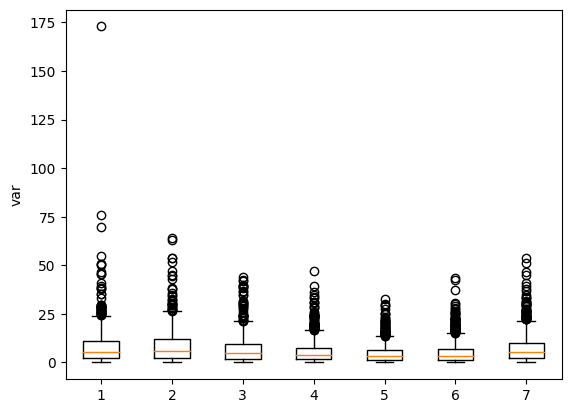

In [ ]:
box_turn("Llegadadia_sem",'LlegadaTA')

Como se observa, hay diferencia entre los días de las semana, en este caso, la semana 1 y dos parecen seguir comportamientos similares lo que sugiere que estas correspondes a semanas pico, mientras que los dias 3,4,5 y 6 parecen ser de menos densidad y la semana 7 parece seguir la semana 1 y 2.

Por ello se decide la siguiente agrupación.


*   Semana 1,2 y 7
*   Semana 3,4,5 y 6

Y nuevamente se realizan las pruebas de independencia, quedando:



%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1           H         p-unc  Independencia
Kruskal         Atiende      7  114.569732  1.032888e-21          False
Kruskal       h_llegada     23  144.364508  1.434681e-19          False
Kruskal  Llegadadia_sem      2    3.070623  2.153886e-01           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


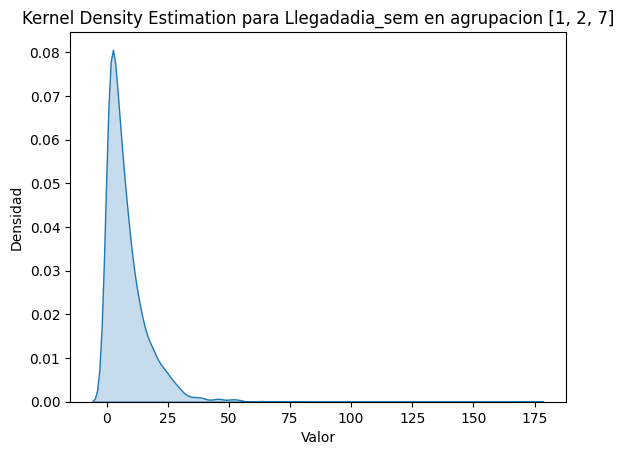

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 4, 5, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      7  43.919162  2.215504e-07          False
Kruskal       h_llegada     23  62.968352  1.406608e-05          False
Kruskal  Llegadadia_sem      3  69.678698  5.001001e-15          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


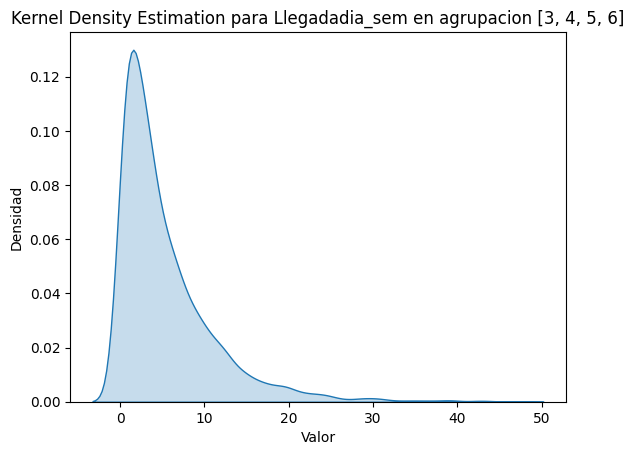

In [ ]:
analisis_agrupaciones("Llegadadia_sem",[1,2,7],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[3,4,5,6],"LlegadaTA",base)

La agrupación 1,2 y 7 para los dias de la semana pasa la prueba de independencia en cuanto a los tiempos entre llegadas, por lo que unicamente se trabaja separando las semana 3,4,5 y 6. De la siguiente forma:

*   3,4 y 6
*   Semana 5 sola








%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 4, 6] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  31.459322  5.114371e-05          False
Kruskal  Ini-Triaggeturno_6h      3  27.464691  4.704066e-06          False
Kruskal       Llegadadia_sem      2  35.309929  2.150534e-08          False
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett  112.992474  2.196676e-21      False              Atiende
bartlett  106.067828  7.698991e-23      False  Ini-Triaggeturno_6h
bartlett   70.598626  4.674156e-16      False       Llegadadia_sem
------------------------------------------------------------


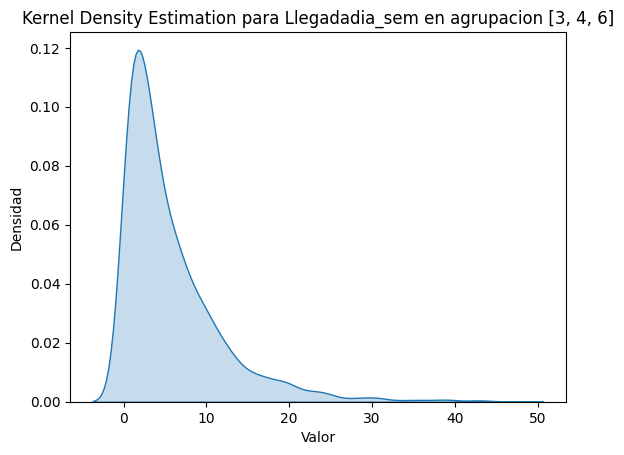

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  26.552773  0.000401          False
Kruskal  Ini-Triaggeturno_6h      3  15.861940  0.001210          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


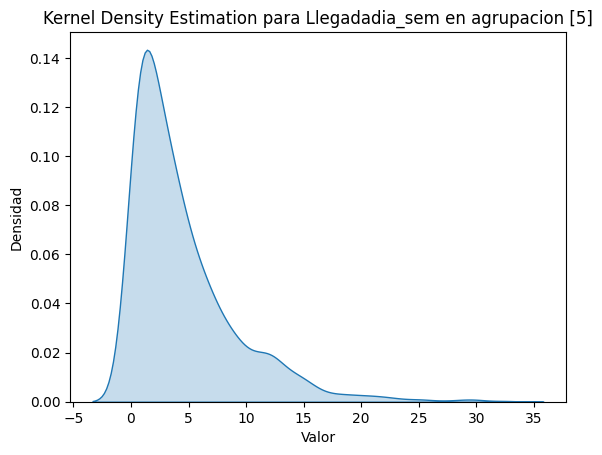

In [ ]:
analisis_agrupaciones("Llegadadia_sem",[3,4,6],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[5],"LlegadaTA",base)

Pasa la semana 5, se separan las semanas 3,4 y 6. Quedando:


*   3 y 4
*   Semana 6 sola

Se hacen más convinaciones diferentes en caso de que estas no pasen como:


*   4 y 6
*   Semana 3 sola





%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 4] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  79.516550  1.728454e-14          False
Kruskal  Ini-Triaggeturno_6h      3  74.881926  3.840721e-16          False
Kruskal       Llegadadia_sem      1  19.155849  1.204678e-05          False
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett  222.487942  1.955480e-44      False              Atiende
bartlett  220.117775  1.893476e-47      False  Ini-Triaggeturno_6h
bartlett   36.153927  1.823307e-09      False       Llegadadia_sem
------------------------------------------------------------


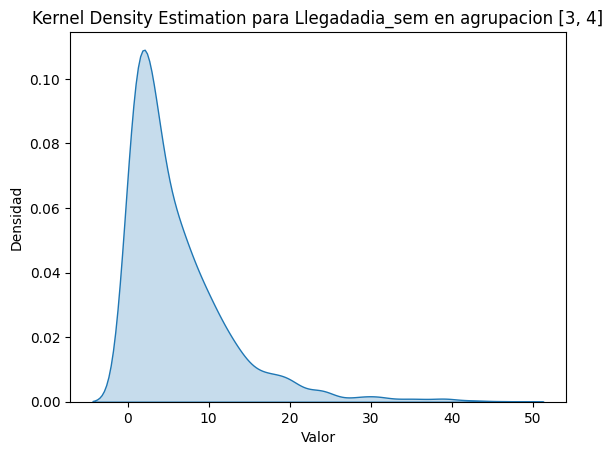

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [6] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  13.763783  0.055546           True
Kruskal  Ini-Triaggeturno_6h      3  12.835419  0.005006          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


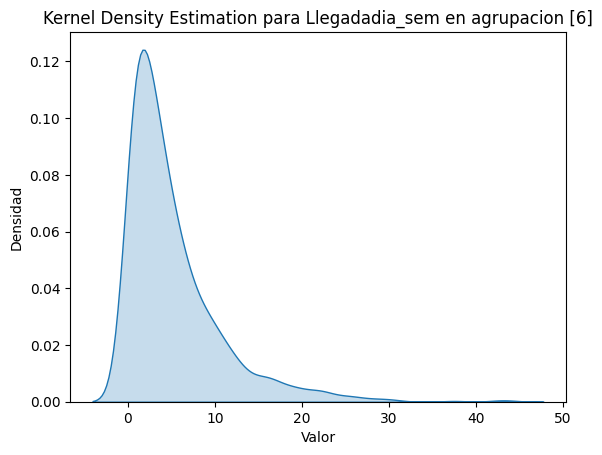

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 6] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  17.001231  0.017388          False
Kruskal  Ini-Triaggeturno_6h      3  14.254147  0.002579          False
Kruskal       Llegadadia_sem      1   2.138932  0.143602           True
------------------------------------------------------------
                  T      pval  equal_var               Source
bartlett  31.227448  0.000056      False              Atiende
bartlett  23.013530  0.000040      False  Ini-Triaggeturno_6h
bartlett   4.184846  0.040787      False       Llegadadia_sem
------------------------------------------------------------


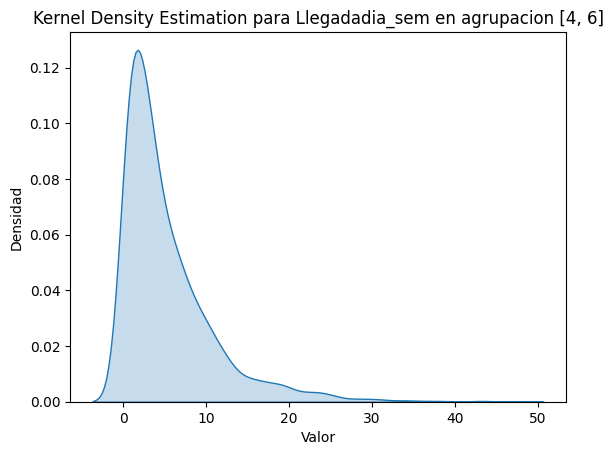

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  30.920267  0.000064          False
Kruskal  Ini-Triaggeturno_6h      3  26.316912  0.000008          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


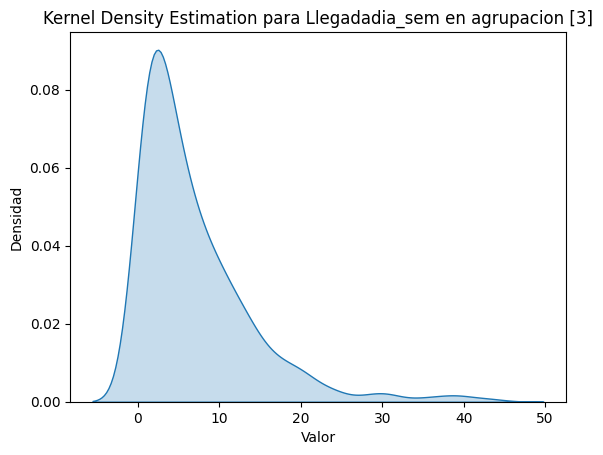

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 6] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  14.032143  5.061261e-02           True
Kruskal  Ini-Triaggeturno_6h      3  11.462767  9.469488e-03          False
Kruskal       Llegadadia_sem      1  33.401052  7.498338e-09          False
------------------------------------------------------------
                  T          pval  equal_var               Source
bartlett  55.444417  1.217204e-09      False              Atiende
bartlett  41.739101  4.557592e-09      False  Ini-Triaggeturno_6h
bartlett  64.930736  7.757756e-16      False       Llegadadia_sem
------------------------------------------------------------


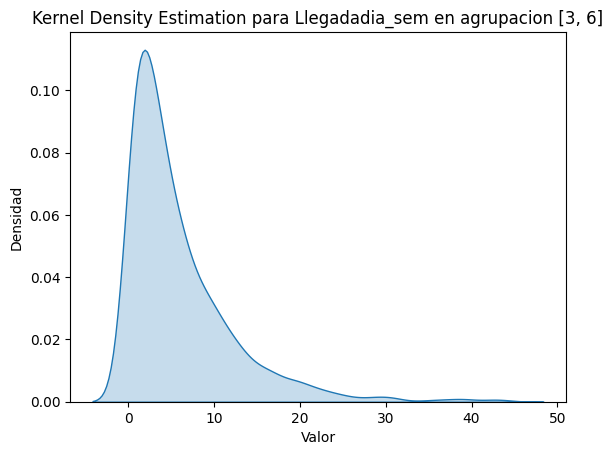

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  54.353500  2.002050e-09          False
Kruskal  Ini-Triaggeturno_6h      3  52.308821  2.573878e-11          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


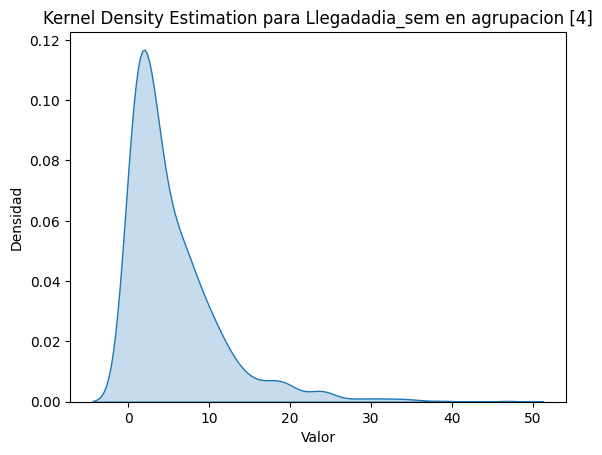

In [ ]:
analisis_agrupaciones("Llegadadia_sem",[3,4],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[6],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[4,6],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[3],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[3,6],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[4],"LlegadaTA",base)

Como se observa, al final las pruebas que pasa independencia por el dia de la semana, es decir, que hay dias que presentan hora pico, queda de la siguiente forma:


*   Semana 1,2 y 7
*   Semana 3 sola
*   Semana 4 y 6
*   Semana 5 sola

En adición se resalta que se pasaron las pruebas Kruskal-Wallis lo que busca diferencias significativas entre las medianas de tres o más grupos, miestras que la prueba de Bartlett se usa para verificar hómogeneidad entre las varianzas de los grupos y aunque paso la prueba de homogeneidad de medianas no se puede seguir realizando analisis a estas agrupaciones hasta pasar la prueba de homogeneidad de varianzas pues se perderian detalles para la simulación y talvez eso ocasionaria un analisis de salida que rechace la hipotesis nula.

##Se siguen separando las semanas


*   Semana 1 y 2
*   Semana 7 sola

Se prueban más convinaciones. Buscando la homogeneidad de varianzas.



%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  93.286684  2.611226e-17          False
Kruskal  Ini-Triaggeturno_6h      3  86.292905  1.369650e-18          False
Kruskal       Llegadadia_sem      1   0.981373  3.218601e-01           True
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett  407.454126  6.009551e-84      False              Atiende
bartlett  339.212146  3.231981e-73      False  Ini-Triaggeturno_6h
bartlett   32.565183  1.152612e-08      False       Llegadadia_sem
------------------------------------------------------------


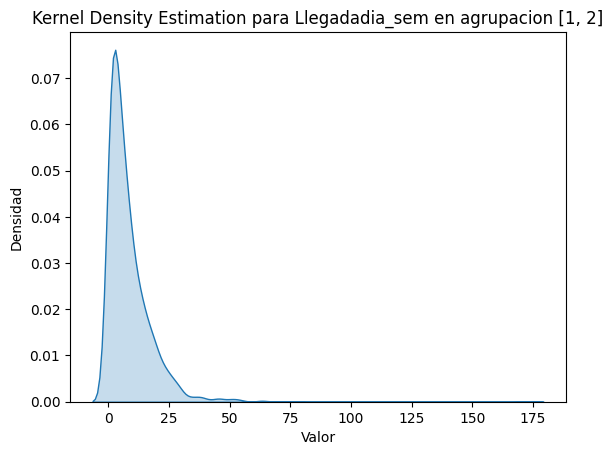

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [7] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  29.048925  0.000142          False
Kruskal  Ini-Triaggeturno_6h      3  30.387660  0.000001          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


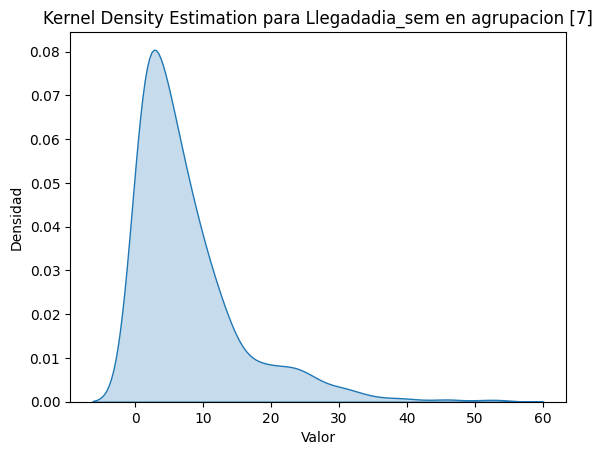

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2, 7] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  61.293768  8.323371e-11          False
Kruskal  Ini-Triaggeturno_6h      3  55.839682  4.545246e-12          False
Kruskal       Llegadadia_sem      1   3.081361  7.919423e-02           True
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett  125.085784  6.672075e-24      False              Atiende
bartlett   85.763191  1.779624e-18      False  Ini-Triaggeturno_6h
bartlett    4.783526  2.873323e-02      False       Llegadadia_sem
------------------------------------------------------------


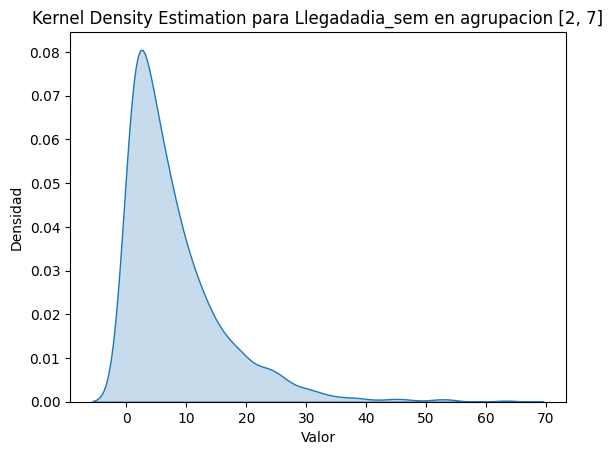

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  62.025247  5.941796e-11          False
Kruskal  Ini-Triaggeturno_6h      3  60.927649  3.724232e-13          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


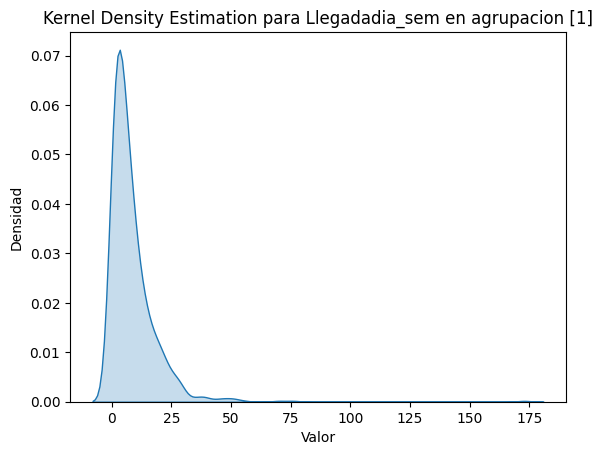

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 7] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  84.451180  1.697752e-15          False
Kruskal  Ini-Triaggeturno_6h      3  85.406739  2.122496e-18          False
Kruskal       Llegadadia_sem      1   0.586853  4.436385e-01           True
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett  420.301699  1.053343e-86      False              Atiende
bartlett  359.106244  1.591570e-77      False  Ini-Triaggeturno_6h
bartlett   58.175212  2.397814e-14      False       Llegadadia_sem
------------------------------------------------------------


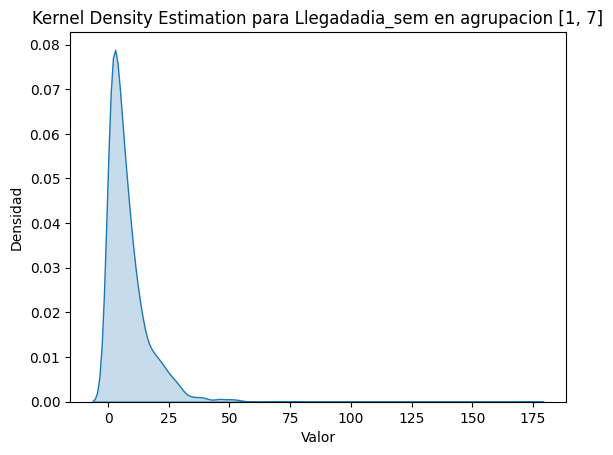

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  42.086965  5.003262e-07          False
Kruskal  Ini-Triaggeturno_6h      3  31.712572  6.016684e-07          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


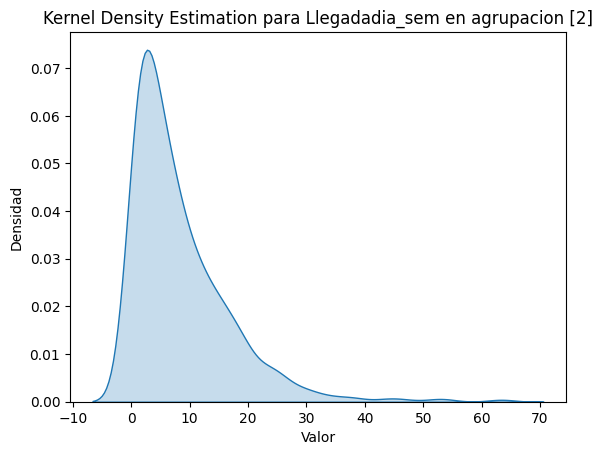

In [ ]:
analisis_agrupaciones("Llegadadia_sem",[1,2],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[7],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[2,7],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[1],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[1,7],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[2],"LlegadaTA",base)

De lo anterior se observa que ninguna prueba de homogeneidad de varianzas pasa, por lo que se trabajan las semanas de forma independiente. Es decir, dias de la semana de 1 a 7 se trabajan por separado, como se muestra en las siguientes:



%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  62.025247  5.941796e-11          False
Kruskal  Ini-Triaggeturno_6h      3  60.927649  3.724232e-13          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


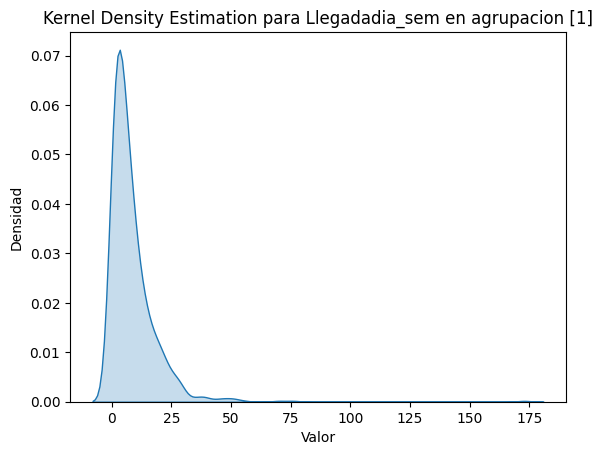

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  42.086965  5.003262e-07          False
Kruskal  Ini-Triaggeturno_6h      3  31.712572  6.016684e-07          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


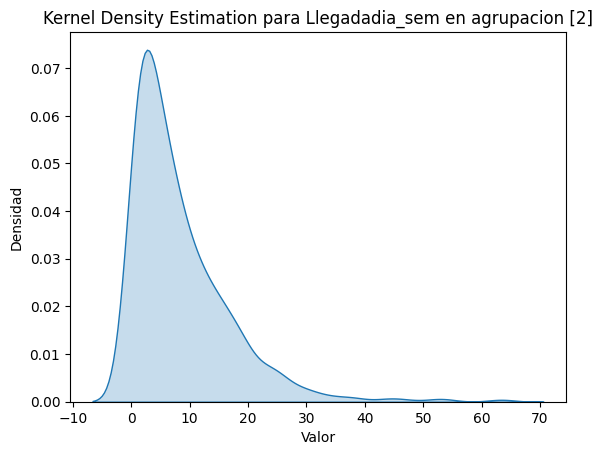

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  30.920267  0.000064          False
Kruskal  Ini-Triaggeturno_6h      3  26.316912  0.000008          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


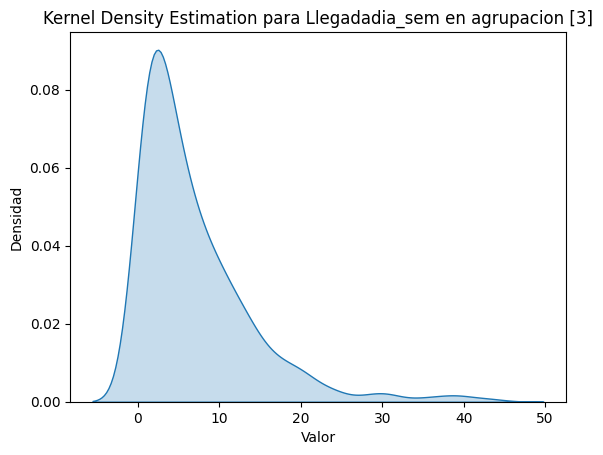

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      7  54.353500  2.002050e-09          False
Kruskal  Ini-Triaggeturno_6h      3  52.308821  2.573878e-11          False
Kruskal       Llegadadia_sem      0   0.000000           NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


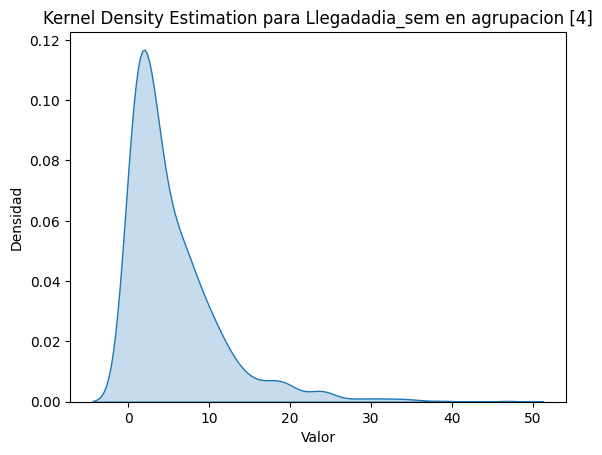

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  26.552773  0.000401          False
Kruskal  Ini-Triaggeturno_6h      3  15.861940  0.001210          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


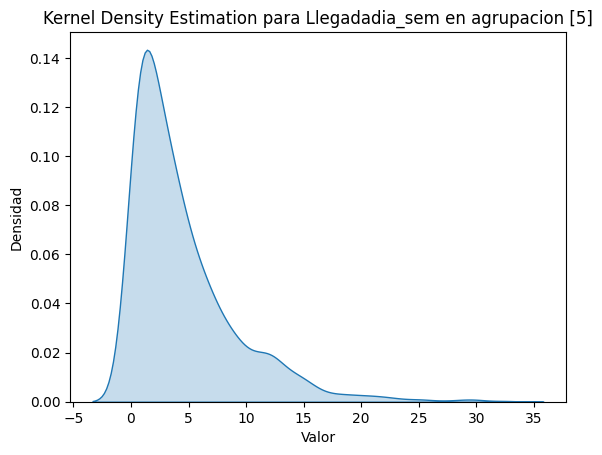

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [6] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  13.763783  0.055546           True
Kruskal  Ini-Triaggeturno_6h      3  12.835419  0.005006          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


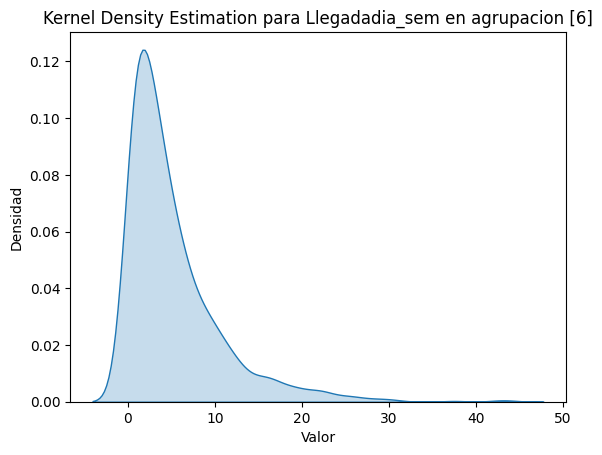

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [7] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H     p-unc  Independencia
Kruskal              Atiende      7  29.048925  0.000142          False
Kruskal  Ini-Triaggeturno_6h      3  30.387660  0.000001          False
Kruskal       Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


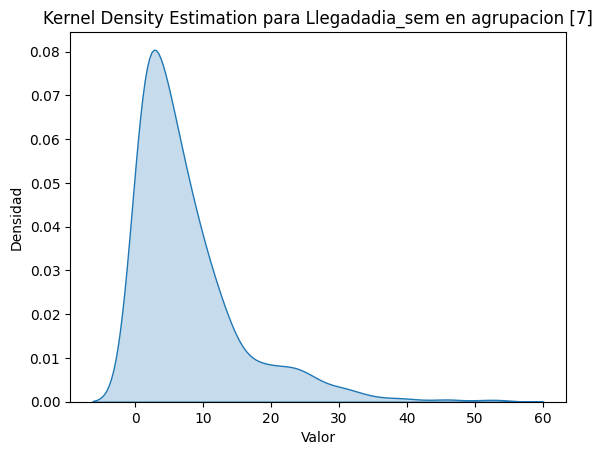

In [ ]:
analisis_agrupaciones("Llegadadia_sem",[1],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[2],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[3],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[4],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[5],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[6],"LlegadaTA",base)
analisis_agrupaciones("Llegadadia_sem",[7],"LlegadaTA",base)

#Tambien se procede con el mismo analisis para las horas del turno, quedando:

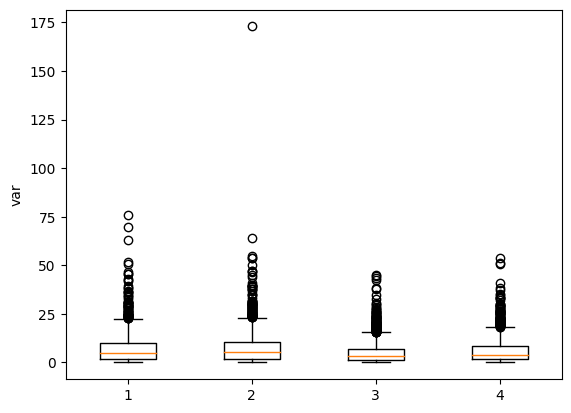

In [ ]:
box_turn("Ini-Triaggeturno_6h",'LlegadaTA')

In [ ]:
m=list(base["Ini-Triaggeturno_6h"].unique())
grup1=base[(base["Ini-Triaggeturno_6h"]==m[0])]['LlegadaTA']
grup2=base[(base["Ini-Triaggeturno_6h"]==m[1])]['LlegadaTA']
grup3=base[(base["Ini-Triaggeturno_6h"]==m[2])]['LlegadaTA']
grup4=base[(base["Ini-Triaggeturno_6h"]==m[3])]['LlegadaTA']

In [ ]:
print(tukey_hsd(grup1,grup2,grup3,grup4))

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -0.415     0.415    -1.109     0.279
 (0 - 2)      2.155     0.000     1.521     2.790
 (0 - 3)      1.175     0.000     0.516     1.835
 (1 - 0)      0.415     0.415    -0.279     1.109
 (1 - 2)      2.571     0.000     1.932     3.209
 (1 - 3)      1.591     0.000     0.928     2.254
 (2 - 0)     -2.155     0.000    -2.790    -1.521
 (2 - 1)     -2.571     0.000    -3.209    -1.932
 (2 - 3)     -0.980     0.000    -1.581    -0.379
 (3 - 0)     -1.175     0.000    -1.835    -0.516
 (3 - 1)     -1.591     0.000    -2.254    -0.928
 (3 - 2)      0.980     0.000     0.379     1.581



Segun la prueba de Turjkey se debe realizar las siguiente:


*   Turno 1 y 2
*   Turno 3 solo
*   Turno 4 solo



%%%%%%%%%%%%%%%%%%
Para la Ini-Triaggeturno_6h de [1, 2] se obtuvo:
------------------------------------------------------------
                      Source  ddof1           H         p-unc  Independencia
Kruskal              Atiende      3   10.201699  1.692718e-02          False
Kruskal  Ini-Triaggeturno_6h      1    0.870704  3.507606e-01           True
Kruskal       Llegadadia_sem      6  225.655681  6.471307e-46          False
------------------------------------------------------------
                   T           pval  equal_var               Source
bartlett  149.462569   3.441113e-32      False              Atiende
bartlett   34.557128   4.139229e-09      False  Ini-Triaggeturno_6h
bartlett  790.622884  1.634813e-167      False       Llegadadia_sem
------------------------------------------------------------


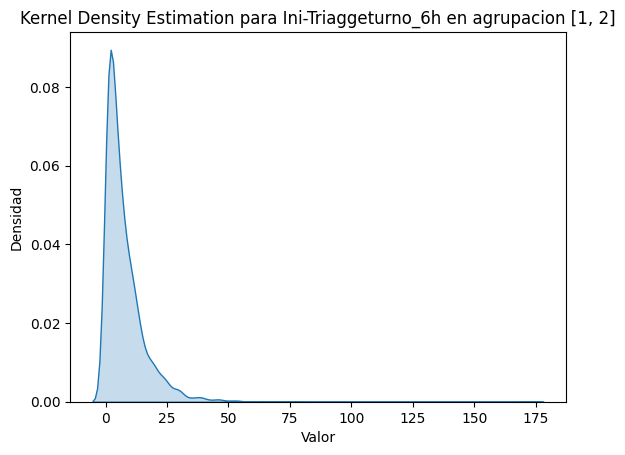

%%%%%%%%%%%%%%%%%%
Para la Ini-Triaggeturno_6h de [3] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      2   3.622192  1.634749e-01           True
Kruskal  Ini-Triaggeturno_6h      0   0.000000           NaN           True
Kruskal       Llegadadia_sem      6  41.402706  2.412023e-07          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


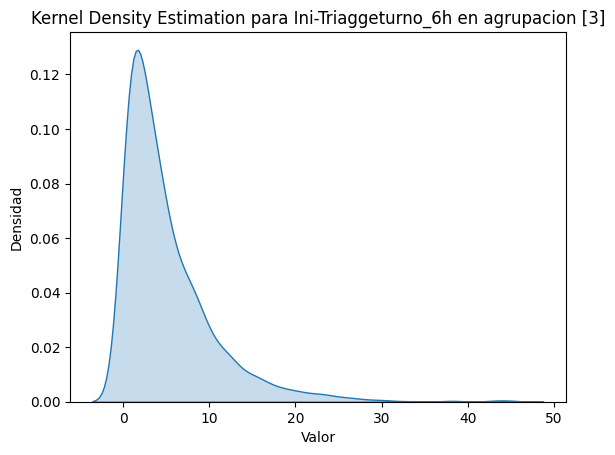

%%%%%%%%%%%%%%%%%%
Para la Ini-Triaggeturno_6h de [4] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      2   2.265532  3.221410e-01           True
Kruskal  Ini-Triaggeturno_6h      0   0.000000           NaN           True
Kruskal       Llegadadia_sem      6  79.723073  4.075811e-15          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


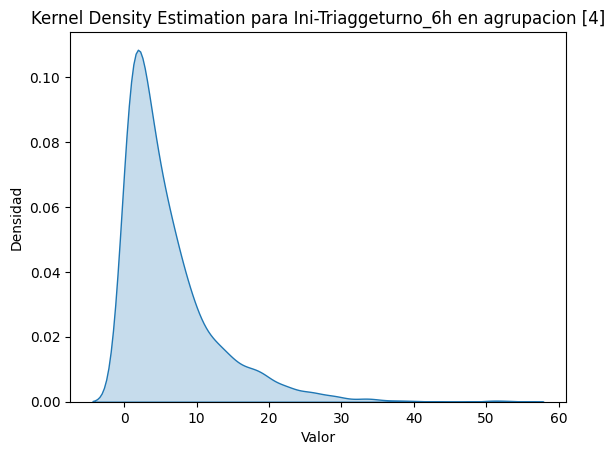

In [ ]:
analisis_agrupaciones("Ini-Triaggeturno_6h",[1,2],"LlegadaTA",base)
analisis_agrupaciones("Ini-Triaggeturno_6h",[3],"LlegadaTA",base)
analisis_agrupaciones("Ini-Triaggeturno_6h",[4],"LlegadaTA",base)

#Por ultimo se mira como seria si se agrupa por los que atiende mirando las preferencias de los que son atendidos


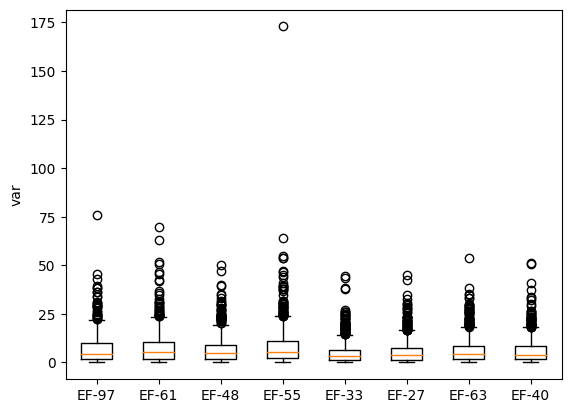

In [ ]:
box_turn("Atiende",'LlegadaTA')

Se hacen agrupaciones de enferemeras de la siguiente forma:

*   EF-97, EF-61, EF-48 y EF-55
*   EF-33, EF-27, EF-63 y EF-40

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-97', 'EF-61', 'EF-48', 'EF-55'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1           H         p-unc  Independencia
Kruskal              Atiende      3   10.375264  1.563137e-02          False
Kruskal  Ini-Triaggeturno_6h      2    3.315816  1.905371e-01           True
Kruskal       Llegadadia_sem      6  224.748268  1.010568e-45          False
------------------------------------------------------------
                   T           pval  equal_var               Source
bartlett  149.563082   3.273534e-32      False              Atiende
bartlett         NaN            NaN      False  Ini-Triaggeturno_6h
bartlett  790.628070  1.630601e-167      False       Llegadadia_sem
------------------------------------------------------------


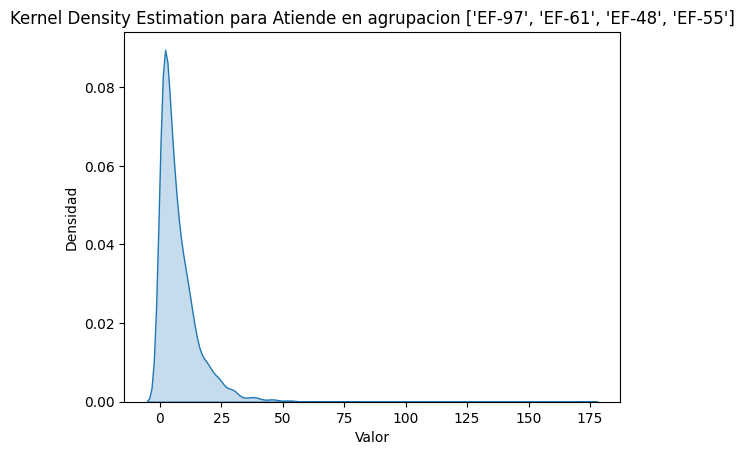

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-33', 'EF-27', 'EF-63', 'EF-40'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1           H         p-unc  Independencia
Kruskal              Atiende      3   19.813414  1.855456e-04          False
Kruskal  Ini-Triaggeturno_6h      1   18.034823  2.169009e-05          False
Kruskal       Llegadadia_sem      6  100.067710  2.428993e-19          False
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett   60.591633  4.393781e-13      False              Atiende
bartlett   57.007614  4.341278e-14      False  Ini-Triaggeturno_6h
bartlett  289.274106  1.623530e-59      False       Llegadadia_sem
------------------------------------------------------------


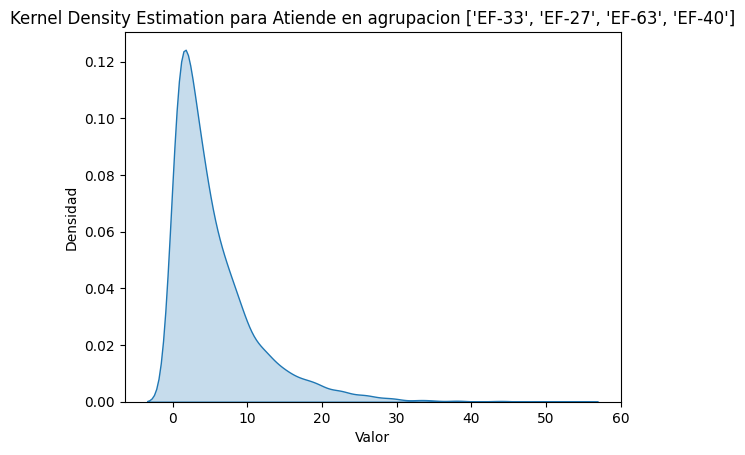

In [ ]:
analisis_agrupaciones("Atiende",["EF-97","EF-61","EF-48","EF-55"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-33","EF-27","EF-63","EF-40"],"LlegadaTA",base)

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-48', 'EF-63', 'EF-97'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1           H         p-unc  Independencia
Kruskal              Atiende      2    4.173410  1.240954e-01           True
Kruskal  Ini-Triaggeturno_6h      3    6.648229  8.399647e-02           True
Kruskal       Llegadadia_sem      6  158.065525  1.520830e-31          False
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett   19.955701  4.641674e-05      False              Atiende
bartlett         NaN           NaN      False  Ini-Triaggeturno_6h
bartlett  289.716628  1.305228e-59      False       Llegadadia_sem
------------------------------------------------------------


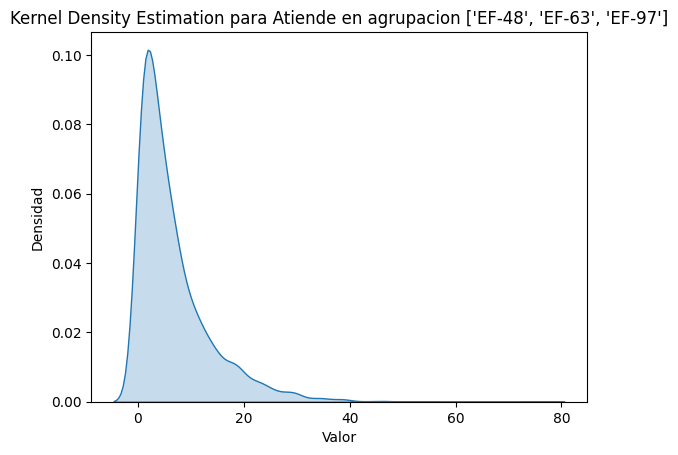

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-61', 'EF-55'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      1   2.329019  1.269819e-01           True
Kruskal  Ini-Triaggeturno_6h      1   2.329019  1.269819e-01           True
Kruskal       Llegadadia_sem      6  98.115831  6.201643e-19          False
------------------------------------------------------------
                   T           pval  equal_var               Source
bartlett   51.691181   6.495386e-13      False              Atiende
bartlett   51.691181   6.495386e-13      False  Ini-Triaggeturno_6h
bartlett  531.260093  1.545720e-111      False       Llegadadia_sem
------------------------------------------------------------


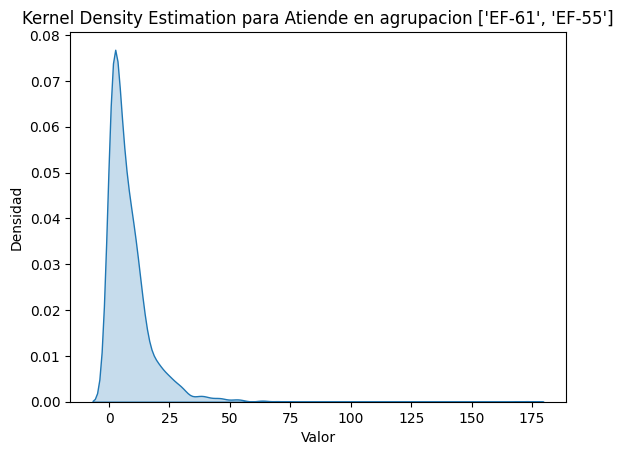

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-33', 'EF-27', 'EF-40'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      2  12.270869  2.164785e-03          False
Kruskal  Ini-Triaggeturno_6h      1  10.565611  1.152109e-03          False
Kruskal       Llegadadia_sem      6  67.079376  1.621322e-12          False
------------------------------------------------------------
                   T          pval  equal_var               Source
bartlett   36.492721  1.190437e-08      False              Atiende
bartlett   33.519891  7.053891e-09      False  Ini-Triaggeturno_6h
bartlett  213.173576  2.968053e-43      False       Llegadadia_sem
------------------------------------------------------------


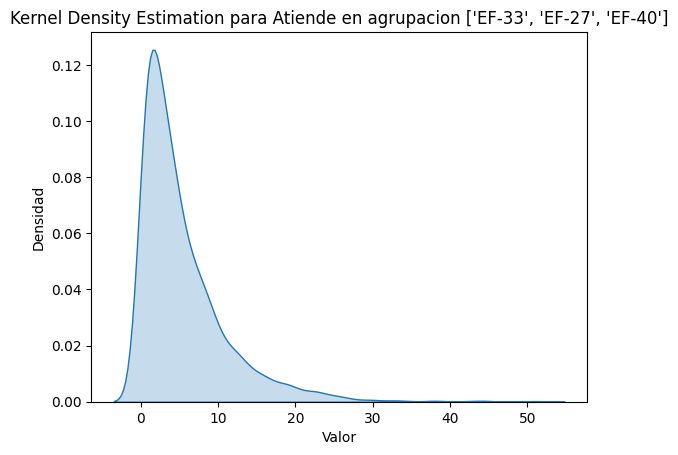

In [ ]:
#Se vuelven a separa, quedando en tripletas esta vez, las mas similuares segun la gráfica de cajas y bigotes.
analisis_agrupaciones("Atiende",["EF-48","EF-63","EF-97"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-61","EF-55"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-33","EF-27","EF-40"],"LlegadaTA",base)

Ahora se hacen de parejas usando turkey, como en el caso de los turnos.

In [ ]:
m=list(base["Atiende"].unique())
grup1=base[(base["Atiende"]==m[0])]['LlegadaTA']
grup2=base[(base["Atiende"]==m[1])]['LlegadaTA']
grup3=base[(base["Atiende"]==m[2])]['LlegadaTA']
grup4=base[(base["Atiende"]==m[3])]['LlegadaTA']
grup5=base[(base["Atiende"]==m[4])]['LlegadaTA']
grup6=base[(base["Atiende"]==m[5])]['LlegadaTA']
grup7=base[(base["Atiende"]==m[6])]['LlegadaTA']
grup8=base[(base["Atiende"]==m[7])]['LlegadaTA']

In [ ]:
print(tukey_hsd(grup1,grup2,grup3,grup4,grup5,grup6,grup7,grup8))

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -0.591     0.775    -1.742     0.559
 (0 - 2)      0.078     1.000    -1.072     1.228
 (0 - 3)     -1.501     0.002    -2.658    -0.344
 (0 - 4)      2.038     0.000     0.983     3.092
 (0 - 5)      1.688     0.000     0.634     2.742
 (0 - 6)      0.814     0.320    -0.281     1.909
 (0 - 7)      0.946     0.151    -0.151     2.043
 (1 - 0)      0.591     0.775    -0.559     1.742
 (1 - 2)      0.669     0.651    -0.487     1.825
 (1 - 3)     -0.910     0.255    -2.072     0.253
 (1 - 4)      2.629     0.000     1.568     3.690
 (1 - 5)      2.279     0.000     1.219     3.340
 (1 - 6)      1.405     0.003     0.304     2.506
 (1 - 7)      1.537     0.001     0.434     2.641
 (2 - 0)     -0.078     1.000    -1.228     1.072
 (2 - 1)     -0.669     0.651    -1.825     0.487
 (2 - 3)     -1.579     0.001    -2.741    -0.417
 (2 - 4)      1.960     0.000   

In [ ]:
m

['EF-97', 'EF-61', 'EF-48', 'EF-55', 'EF-33', 'EF-27', 'EF-63', 'EF-40']

Entonces queda la siguiente agrupacion.


*   EF-97 y EF-48
*   EF-63 y EF-40
*   EF-33 y EF-27
*   EF-61 y EF-55



%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-48', 'EF-97'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1           H         p-unc  Independencia
Kruskal              Atiende      1    0.039520  8.424221e-01           True
Kruskal  Ini-Triaggeturno_6h      2    2.387594  3.030684e-01           True
Kruskal       Llegadadia_sem      6  133.622123  2.218147e-26          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


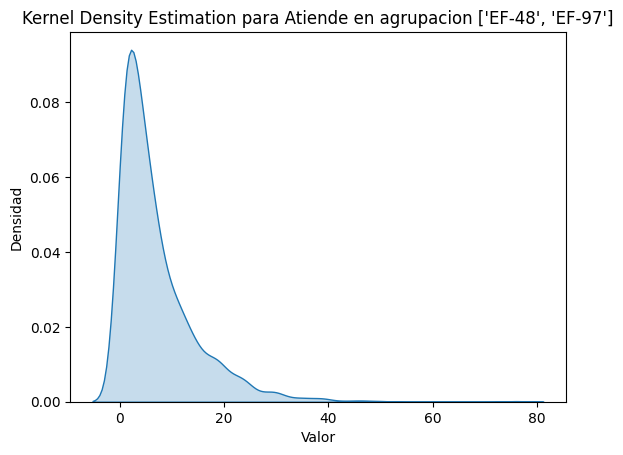

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-33', 'EF-27'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      1   1.288342  2.563538e-01           True
Kruskal  Ini-Triaggeturno_6h      1   2.015946  1.556543e-01           True
Kruskal       Llegadadia_sem      6  42.139707  1.725594e-07          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


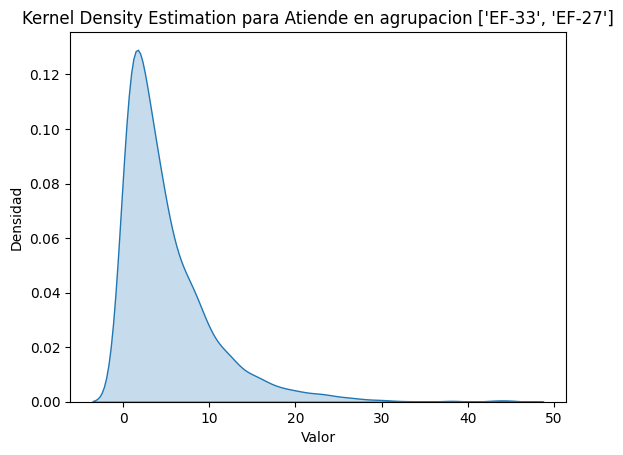

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-63', 'EF-40'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      1   0.066072  7.971439e-01           True
Kruskal  Ini-Triaggeturno_6h      0   0.000000           NaN           True
Kruskal       Llegadadia_sem      6  78.954709  5.873027e-15          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


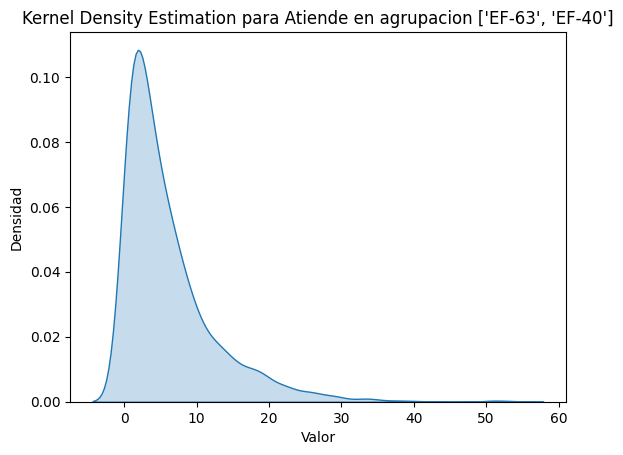

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-61', 'EF-55'] se obtuvo:
------------------------------------------------------------
                      Source  ddof1          H         p-unc  Independencia
Kruskal              Atiende      1   2.329019  1.269819e-01           True
Kruskal  Ini-Triaggeturno_6h      1   2.329019  1.269819e-01           True
Kruskal       Llegadadia_sem      6  98.115831  6.201643e-19          False
------------------------------------------------------------
                Source
0              Atiende
1  Ini-Triaggeturno_6h
2       Llegadadia_sem
------------------------------------------------------------


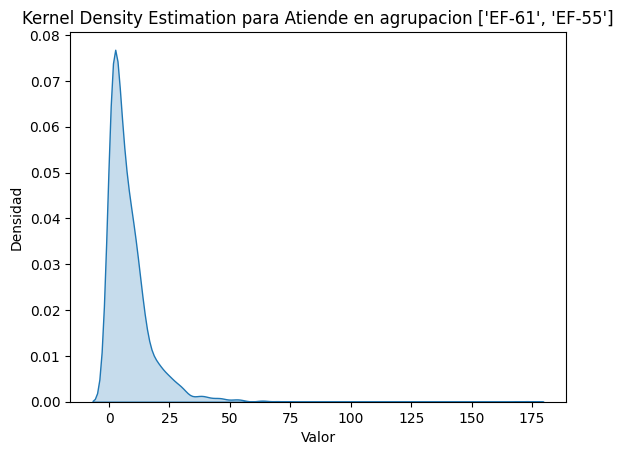

In [ ]:
analisis_agrupaciones("Atiende",["EF-48","EF-97"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-33","EF-27"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-63","EF-40"],"LlegadaTA",base)
analisis_agrupaciones("Atiende",["EF-61","EF-55"],"LlegadaTA",base)

Despues de analisar las posibles separaciones de los datos, por dependencia, se determina que la mejor forma de abordarlos es separando, en primera instancia los turnos, es decir, que se se paran los datos para turno 1, 2, 3 y 4 de triaggge, que son las entradas de los pacientes. Quedando las siguinetes:

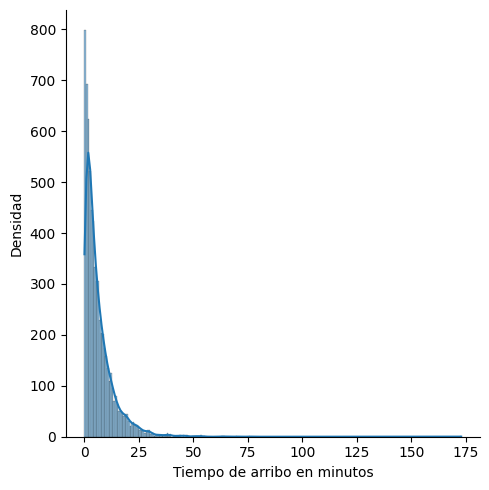

In [ ]:
gra=sns.displot(data=base,x="LlegadaTA",kde=True)
gra.set_axis_labels("Tiempo de arribo en minutos","Densidad")
gra.set_titles("Histograma del tiempo de arribo")

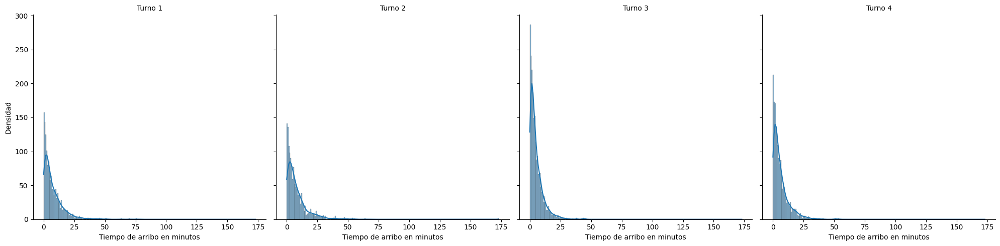

In [ ]:
g = sns.displot(data=base,x="LlegadaTA",col="Ini-Triaggeturno_6h",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad")
g.set_titles("Turno {col_name}")

#Al separa por turnos, se requiere realizar un analisis de un nuevo "dato", que en este caso seran las horas permitiendo determinar si existen horas pico por ello se forma una columna que registra el contar de las horas, como se tenian al principio.

In [ ]:
base['h_llegada']=base['Llegadahora'].dt.strftime('%H:%M:%S').str.split(':').str[0]

In [ ]:
analiza=['Atiende', 'h_llegada', 'Llegadadia_sem']

Lo que se pretende es ver si es dependiente de por ejemplo la hora, la enfermera o el dia de la semana.

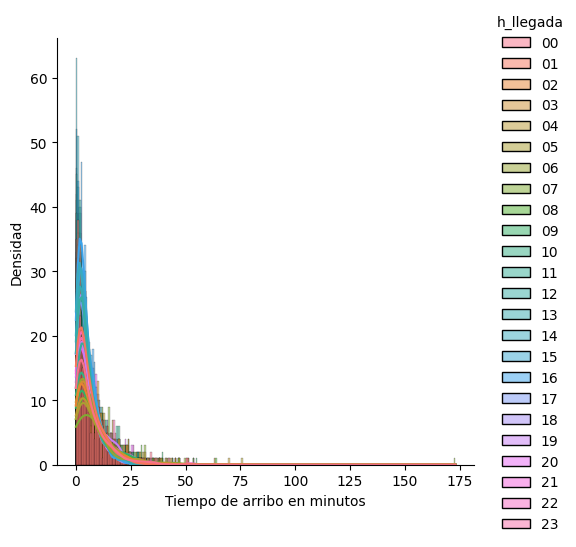

In [ ]:
g = sns.displot(data=base,x="LlegadaTA",hue="h_llegada",kde=True)
g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
g.set_titles("Hora - {col_name}")

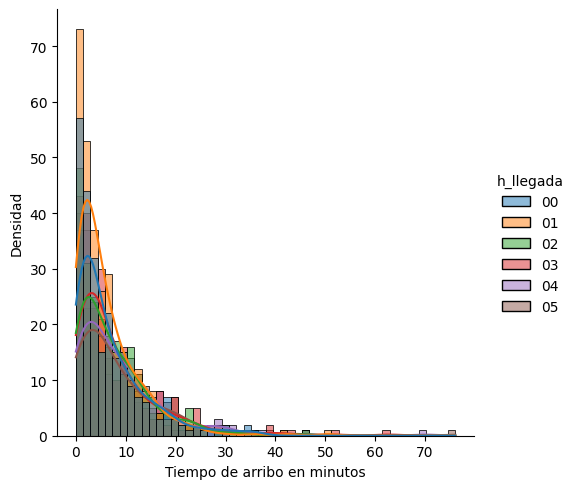

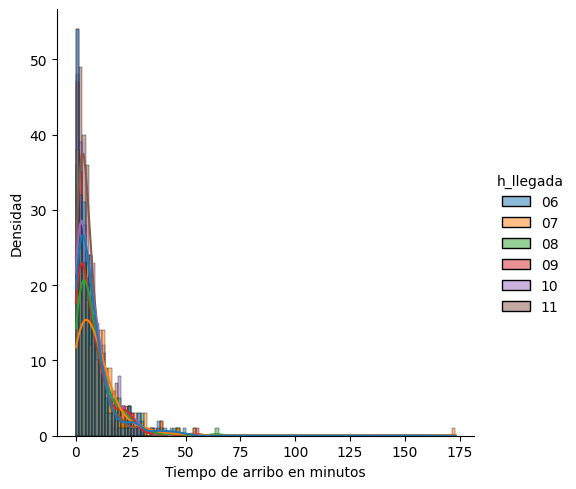

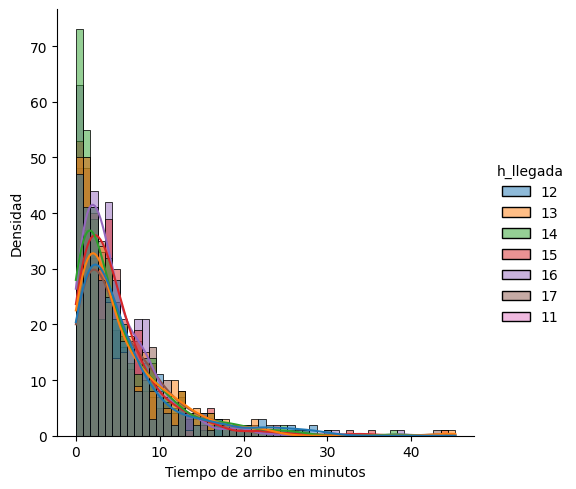

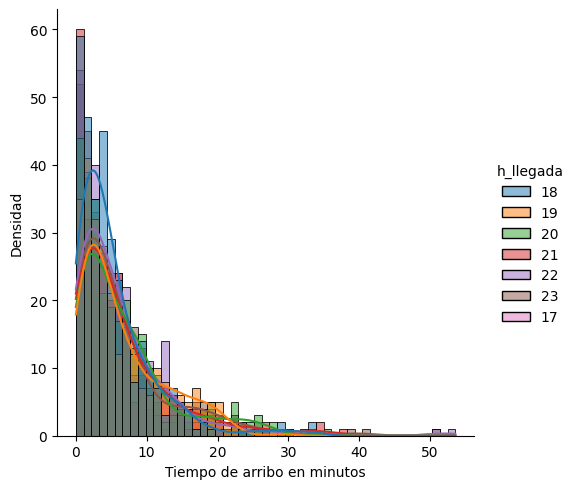

In [ ]:
for i in list(base['Ini-Triaggeturno_6h'].unique()):
  filtro=base[(base['Ini-Triaggeturno_6h']==i)]
  g = sns.displot(data=filtro,x="LlegadaTA",hue="h_llegada",kde=True)
  g.set_axis_labels("Tiempo de arribo en minutos","Densidad") #Para cambiar un eje especifico se puede usar x_var
  g.set_titles("Hora - {col_name}")

Como se observa en las anteriores gráfica, el comportamiento de la grafica de densidad cambia dependiendo la hora, lo que sugiere horas pico u llanas, lo que dice que el comportamiento de los arribos cambian no solo dependiendo del turno sino tambien de la hora. Por lo que se necesita generar un analisis detallado de este aspecto comparando diferentes combinaciones.

------------------------------------------------------------
Para turno 1
En Atiende
%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-97', 'EF-61'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1           H         p-unc  Independencia
Kruskal         Atiende      1    1.194604  2.744029e-01           True
Kruskal       h_llegada      5   13.379162  2.007321e-02          False
Kruskal  Llegadadia_sem      6  183.309090  6.724977e-37          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


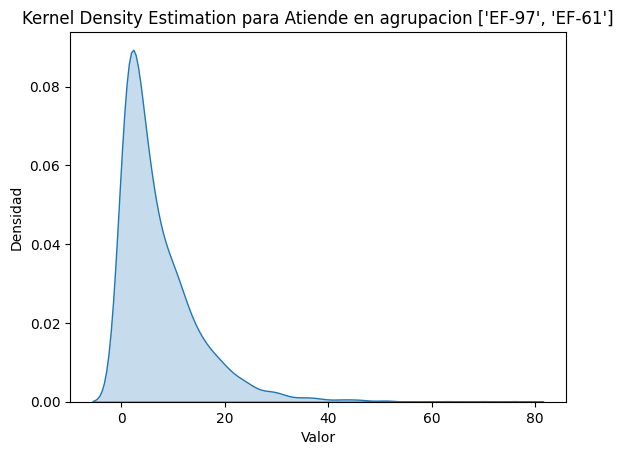

En h_llegada
%%%%%%%%%%%%%%%%%%
Para la h_llegada de ['00', '01', '02', '03', '04', '05'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1           H         p-unc  Independencia
Kruskal         Atiende      1    1.194604  2.744029e-01           True
Kruskal       h_llegada      5   13.379162  2.007321e-02          False
Kruskal  Llegadadia_sem      6  183.309090  6.724977e-37          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


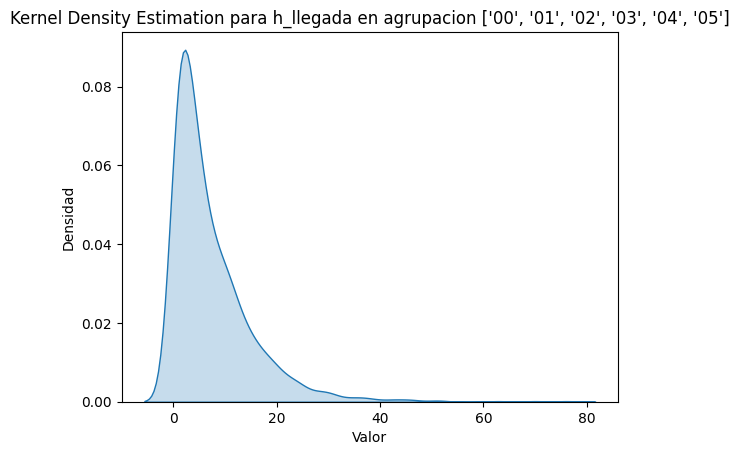

En Llegadadia_sem
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1           H         p-unc  Independencia
Kruskal         Atiende      1    1.194604  2.744029e-01           True
Kruskal       h_llegada      5   13.379162  2.007321e-02          False
Kruskal  Llegadadia_sem      6  183.309090  6.724977e-37          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


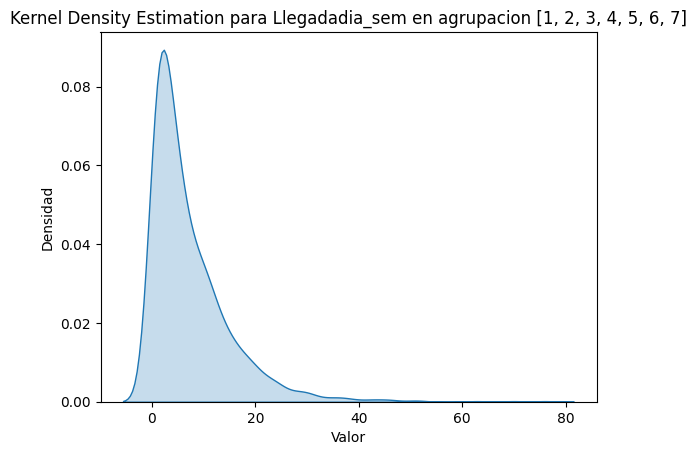

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
------------------------------------------------------------
Para turno 2
En Atiende
%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-48', 'EF-55'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      1   8.255072  4.063830e-03          False
Kruskal       h_llegada      5  11.130589  4.885138e-02          False
Kruskal  Llegadadia_sem      6  76.798269  1.635652e-14          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


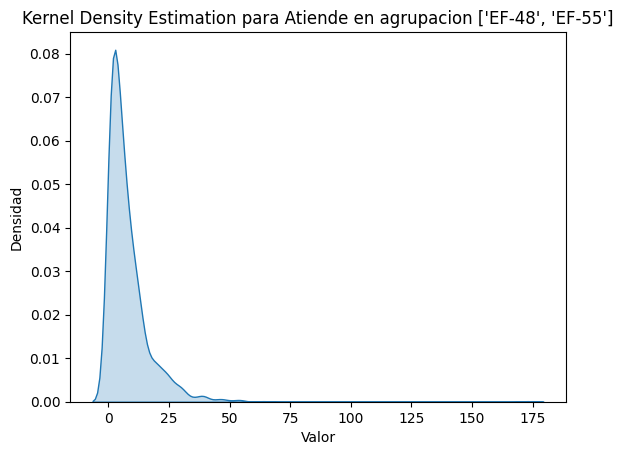

En h_llegada
%%%%%%%%%%%%%%%%%%
Para la h_llegada de ['06', '07', '08', '09', '10', '11'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      1   8.255072  4.063830e-03          False
Kruskal       h_llegada      5  11.130589  4.885138e-02          False
Kruskal  Llegadadia_sem      6  76.798269  1.635652e-14          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


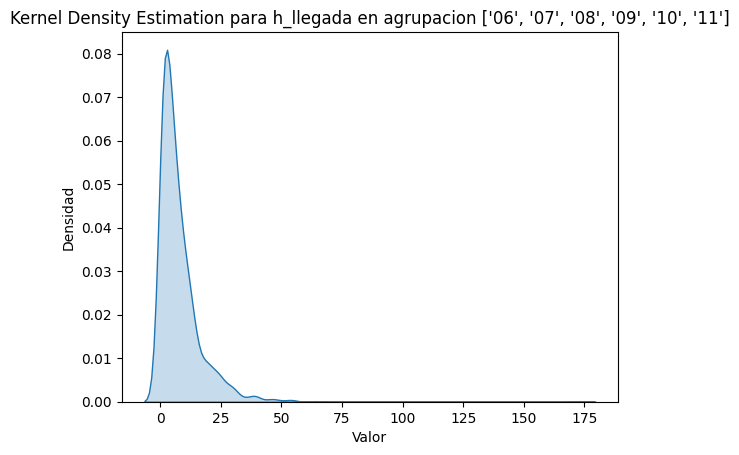

En Llegadadia_sem
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      1   8.255072  4.063830e-03          False
Kruskal       h_llegada      5  11.130589  4.885138e-02          False
Kruskal  Llegadadia_sem      6  76.798269  1.635652e-14          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


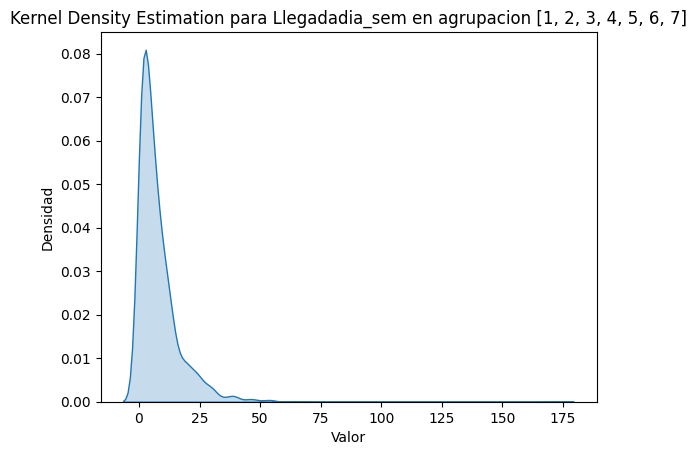

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
------------------------------------------------------------
Para turno 3
En Atiende
%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-33', 'EF-27', 'EF-48'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   3.622192  1.634749e-01           True
Kruskal       h_llegada      6   9.028886  1.719601e-01           True
Kruskal  Llegadadia_sem      6  41.402706  2.412023e-07          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


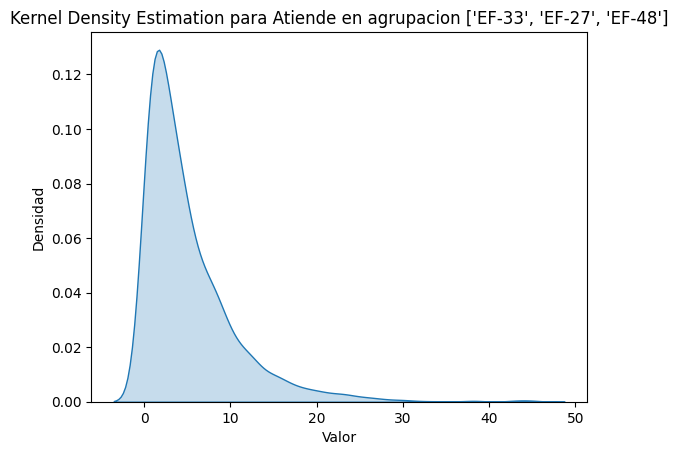

En h_llegada
%%%%%%%%%%%%%%%%%%
Para la h_llegada de ['12', '13', '14', '15', '16', '17', '11'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   3.622192  1.634749e-01           True
Kruskal       h_llegada      6   9.028886  1.719601e-01           True
Kruskal  Llegadadia_sem      6  41.402706  2.412023e-07          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


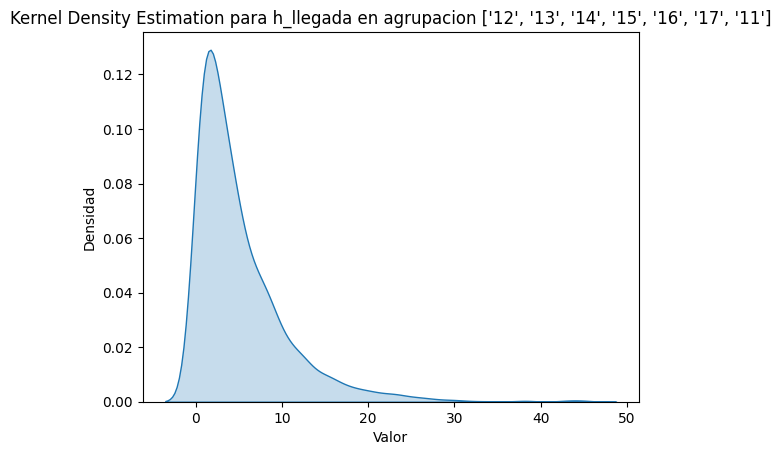

En Llegadadia_sem
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   3.622192  1.634749e-01           True
Kruskal       h_llegada      6   9.028886  1.719601e-01           True
Kruskal  Llegadadia_sem      6  41.402706  2.412023e-07          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


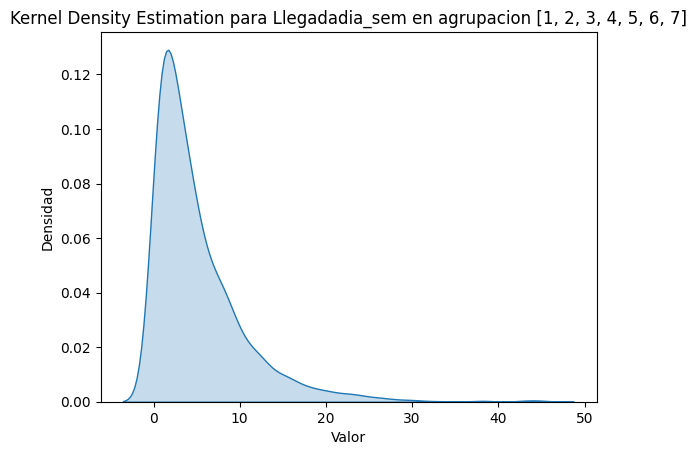

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
------------------------------------------------------------
Para turno 4
En Atiende
%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-63', 'EF-40', 'EF-27'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   2.265532  3.221410e-01           True
Kruskal       h_llegada      6   9.175155  1.639645e-01           True
Kruskal  Llegadadia_sem      6  79.723073  4.075811e-15          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


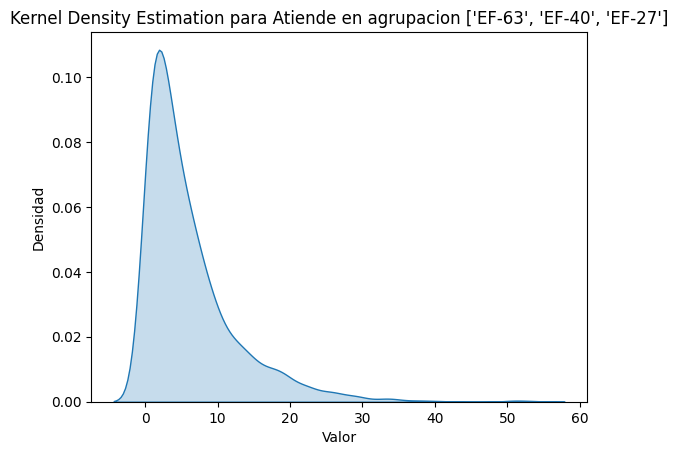

En h_llegada
%%%%%%%%%%%%%%%%%%
Para la h_llegada de ['18', '19', '20', '21', '22', '23', '17'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   2.265532  3.221410e-01           True
Kruskal       h_llegada      6   9.175155  1.639645e-01           True
Kruskal  Llegadadia_sem      6  79.723073  4.075811e-15          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


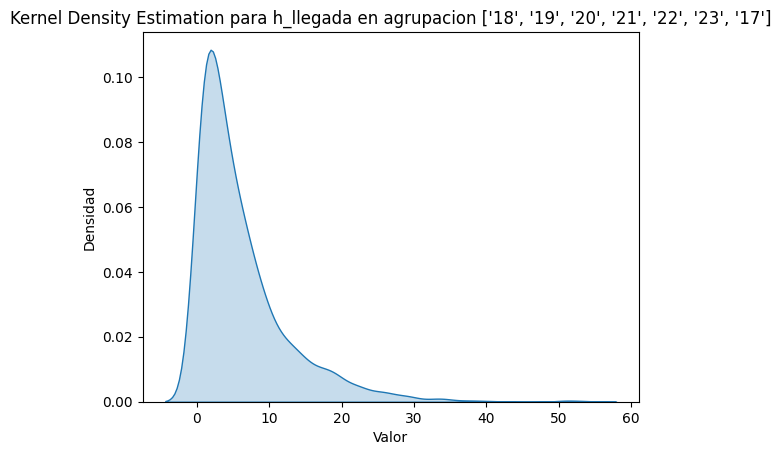

En Llegadadia_sem
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      2   2.265532  3.221410e-01           True
Kruskal       h_llegada      6   9.175155  1.639645e-01           True
Kruskal  Llegadadia_sem      6  79.723073  4.075811e-15          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


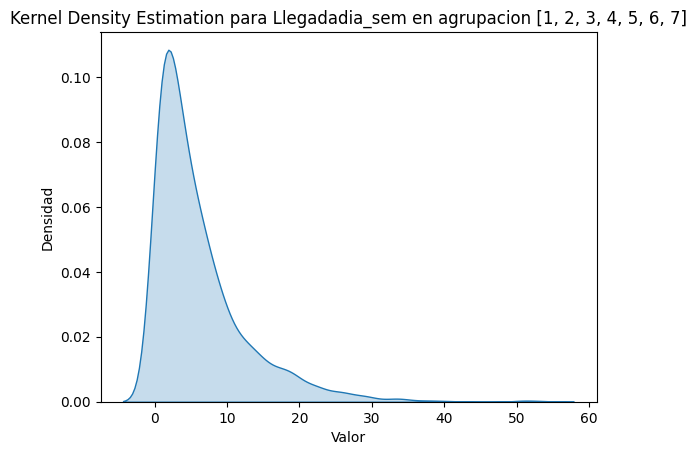

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
for i in list(base['Ini-Triaggeturno_6h'].unique()):
  filtro=base[(base['Ini-Triaggeturno_6h']==i)]
  print("---"*20)
  print("Para turno "+str(i))
  for j in analiza:
    print("En "+j)
    analisis_agrupaciones(j,list(filtro[j].unique()),"LlegadaTA",filtro)
  print("%%%%%"*20)

De la anterior se obtuvo que turno 3 y 4, se deben separar por semana, pues cada turno representa las enfermeras, es decir, no presenta preferencias y, tambien las horas, lo que quiere decir que no presenta horas pico, pero si presenta dias en la semana en donde se carga más el trabajo.

Mientras que en el turno 1 no presenta preferencia por enfermera, pero si se presenta horas pico y dias de la semana cargados.

Por ultimo, el turno 2 si presenta dependencia por el que Atiende, la hora y la semana


#Para el turno 3 y 4

------------------------------------------------------------
Para turno3


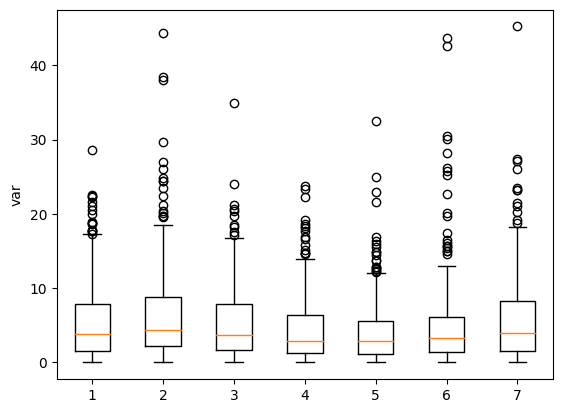

------------------------------------------------------------
Para turno4


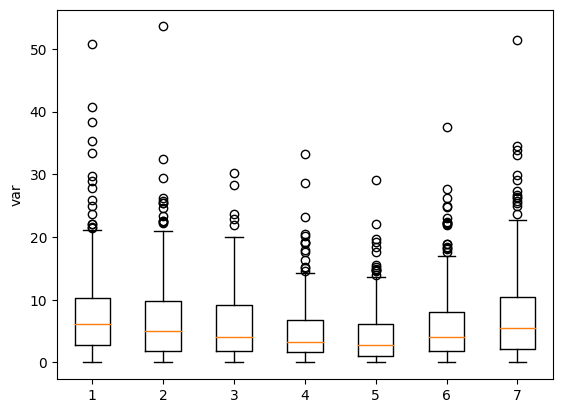

In [ ]:
for i in [3,4]:
  filtro=base[(base['Ini-Triaggeturno_6h']==i)]
  print("---"*20)
  print("Para turno"+str(i))
  box_turn_filtro("Llegadadia_sem","LlegadaTA",filtro)

Se deciden diferentes agrupaciones, teniendo en cuenta similitudes entre las graficas de cajas y bigotes, para ello se toma:

**Turno 3**


*   Semana 1, 3 y 7
*   Semana 2 sola
*   Semana 4 y 6
*   Semana 5

**Turno 4**

*   Semana 1, 2 y 7
*   Semana 3
*   Semana 4 y 6
*   Semana 5

Nota: las semanas de turno 4 las 4, 5 y 6 se pueden combinar entre ellas, se haran varias pruebas para determinar si logra pasar las homogeneidad e indepencia.



------------------------------------------------------------
Para turno 3
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 3, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      2  2.421868  0.297919           True
Kruskal       h_llegada      6  3.405885  0.756446           True
Kruskal  Llegadadia_sem      2  0.157947  0.924064           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


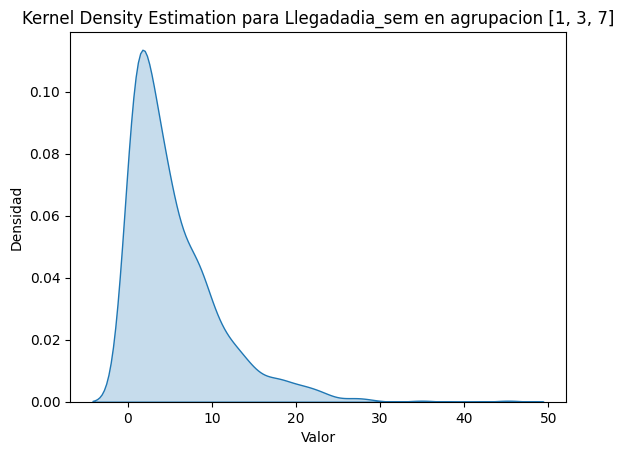

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  4.734116  0.029570          False
Kruskal       h_llegada      5  4.240348  0.515356           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


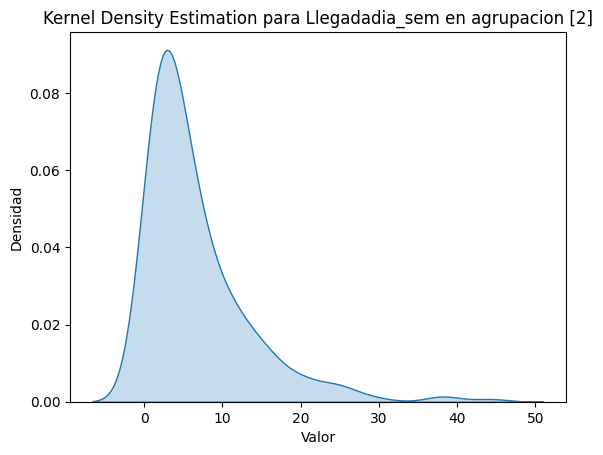

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.047032  0.828312           True
Kruskal       h_llegada      5  13.298237  0.020739          False
Kruskal  Llegadadia_sem      1   0.868175  0.351461           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


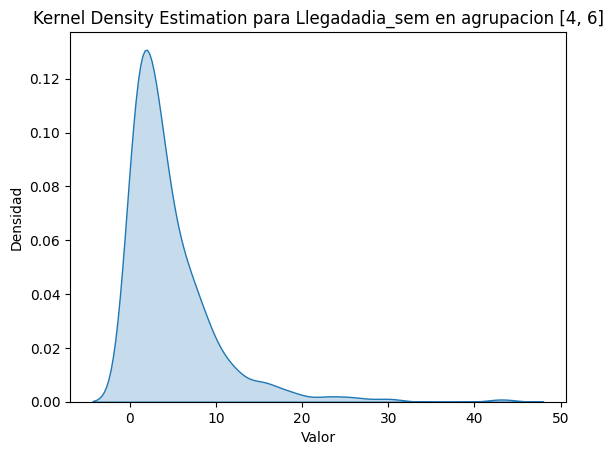

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  2.047265  0.152480           True
Kruskal       h_llegada      5  7.269371  0.201365           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


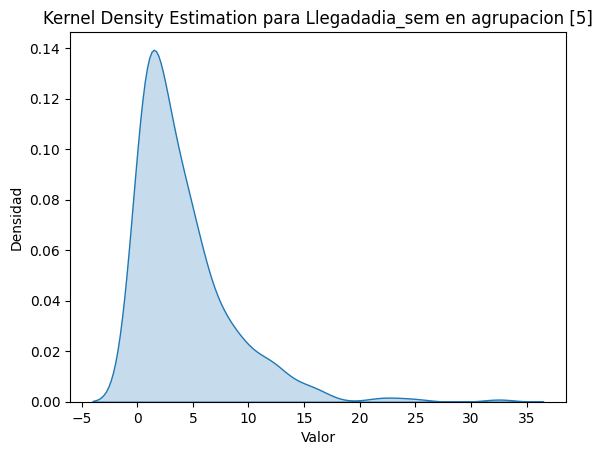

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 3
filtro=base[(base['Ini-Triaggeturno_6h']==3)]
print("---"*20)
print("Para turno "+str(3))
analisis_agrupaciones('Llegadadia_sem',[1,3,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[2],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[4,6],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[5],"LlegadaTA",filtro)
print("%%%%%"*20)

------------------------------------------------------------
Para turno 4
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.014970  0.902621           True
Kruskal       h_llegada      5  5.452284  0.363207           True
Kruskal  Llegadadia_sem      2  2.929421  0.231145           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


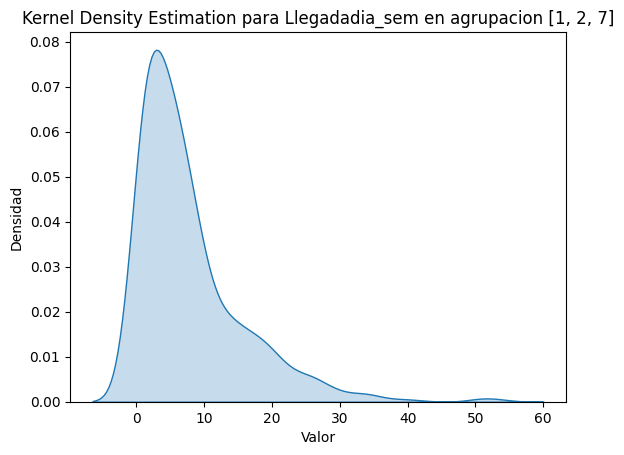

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.000000  1.000000           True
Kruskal       h_llegada      5  3.357811  0.645003           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


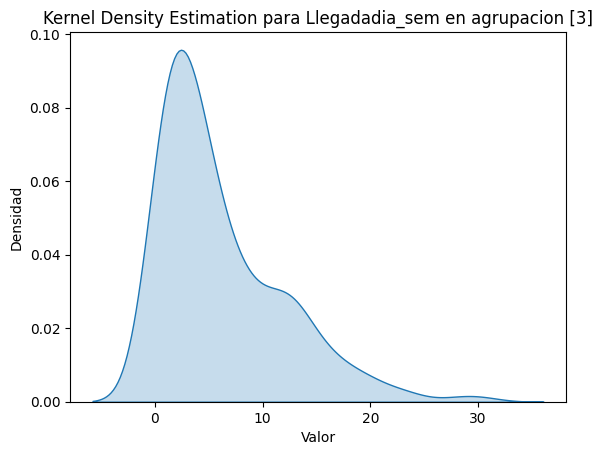

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.825976  0.363439           True
Kruskal       h_llegada      5  6.124659  0.294277           True
Kruskal  Llegadadia_sem      1  3.753696  0.052691           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


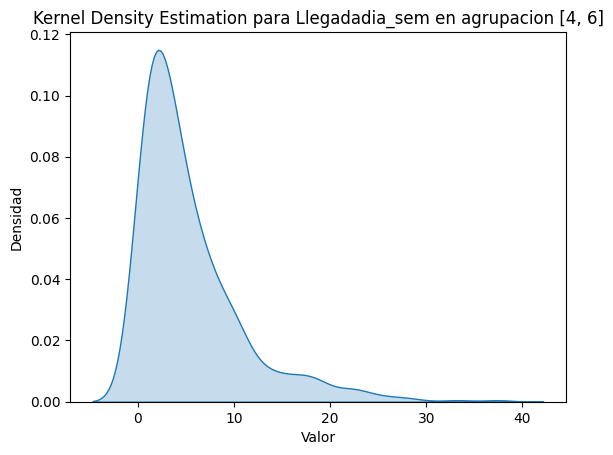

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      2   2.389861  0.302725           True
Kruskal       h_llegada      6  10.659765  0.099478           True
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


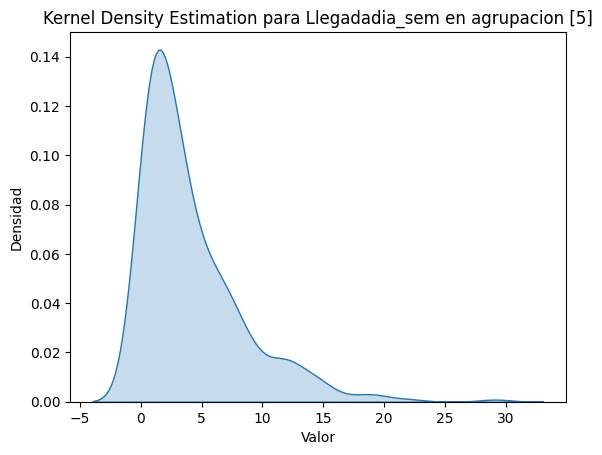

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 4
filtro=base[(base['Ini-Triaggeturno_6h']==4)]
print("---"*20)
print("Para turno "+str(4))
analisis_agrupaciones('Llegadadia_sem',[1,2,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[3],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[4,6],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[5],"LlegadaTA",filtro)
print("%%%%%"*20)

##Entonces, en el turno 4 quedan las agrupaciones por semana
*   Semana 1, 2 y 7
*   Semana 3
*   Semana 4 y 6
*   Semana 5


##Pero en el turno 3, se debe, analizar más opciones y descartar por completo combinaciones.



------------------------------------------------------------
Para turno 3
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.992173  0.319212           True
Kruskal       h_llegada      5  3.886484  0.565873           True
Kruskal  Llegadadia_sem      1  0.457284  0.498896           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


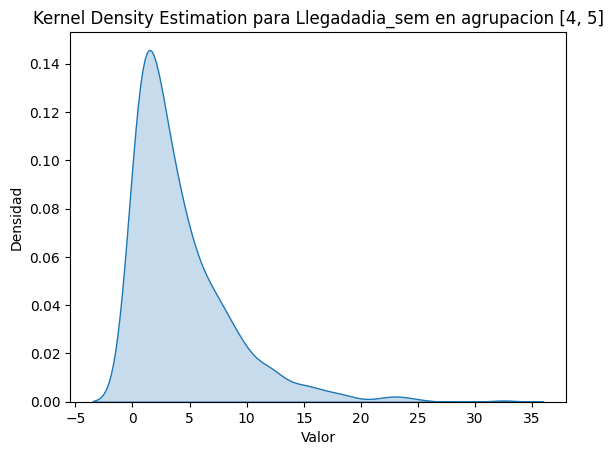

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.093585  0.759668           True
Kruskal       h_llegada      5  12.113833  0.033261          False
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


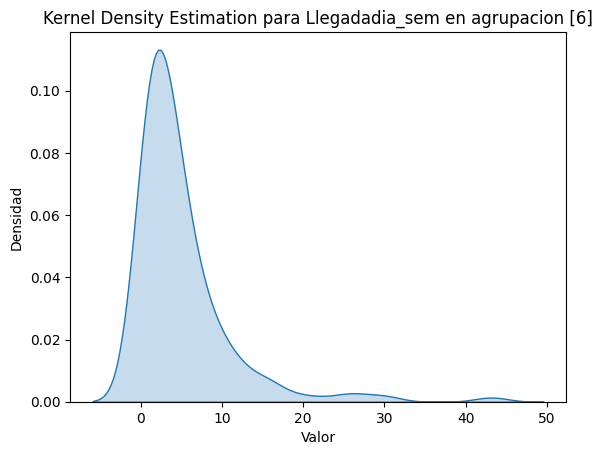

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 3
filtro=base[(base['Ini-Triaggeturno_6h']==3)]
print("---"*20)
print("Para turno "+str(3))
analisis_agrupaciones('Llegadadia_sem',[4,5],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[6],"LlegadaTA",filtro)
print("%%%%%"*20)

Una vez realizado se determina que

**Turno 3**
*   Semana 1, 3 y 7
*   Semana 4 y 5
*   Semana 2 es dependiente del que atiende, se debe separa.
*   Semana 6 es dependiente de la hora de llegada, se debe separa.





------------------------------------------------------------
Para turno3
Para la semana 2


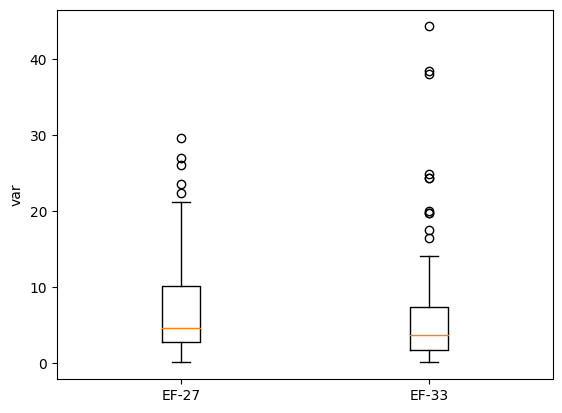

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para la semana 6


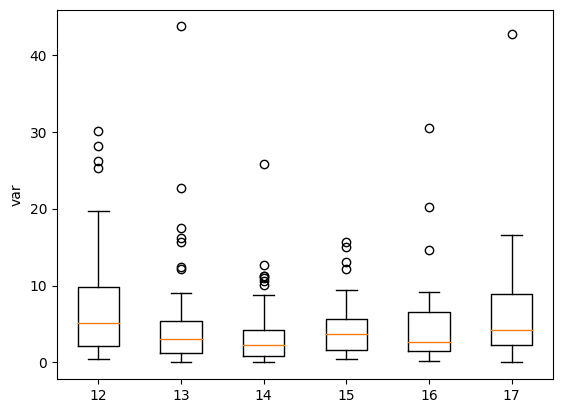

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==3)&(base['Llegadadia_sem']==2)]
print("---"*20)
print("Para turno"+str(3))
print("Para la semana "+str(2))
box_turn_filtro("Atiende","LlegadaTA",filtro)
print("%%%%"*25)
print("Para la semana "+str(6))
filtro=base[(base['Ini-Triaggeturno_6h']==3)&(base['Llegadadia_sem']==6)]
box_turn_filtro("h_llegada","LlegadaTA",filtro)

##La semana 2 se separa por cada enfermera y, la semana 6 se agrupa de la siguiente forma.



*   Hora 13 y 15
*   Las demás solas



------------------------------------------------------------
Para turno 3
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [13, 15] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  1.977374  0.159667           True
Kruskal       h_llegada      1  0.035059  0.851472           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


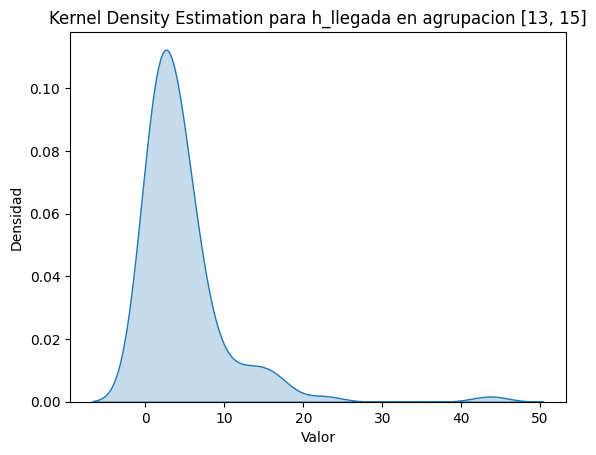

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [12] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.864919  0.352366           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


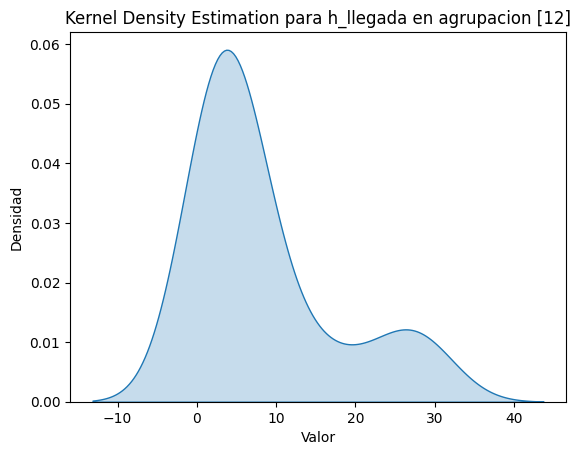

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [14] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.727508  0.393692           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


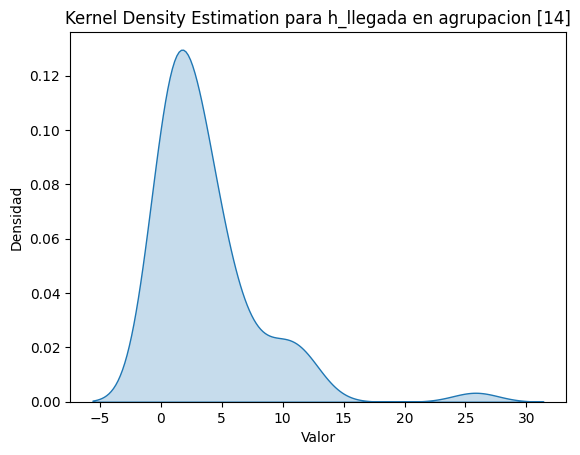

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [16] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  3.881692  0.048815          False
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


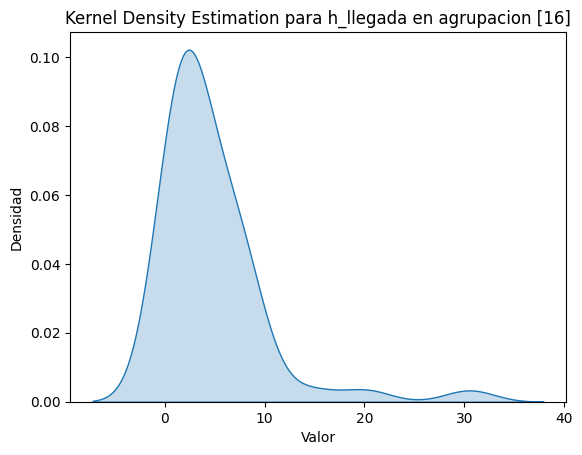

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [17] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.649577  0.420264           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


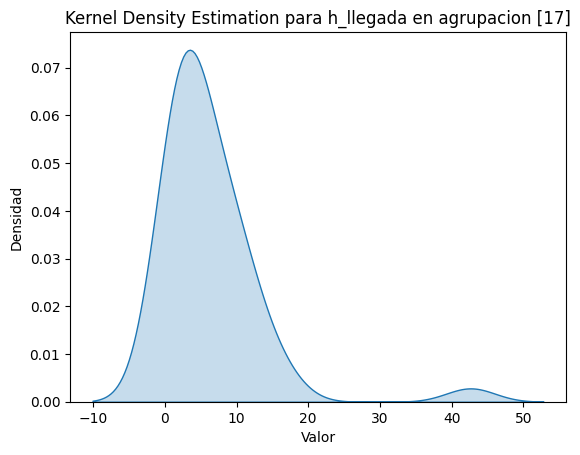

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==3)&(base['Llegadadia_sem']==6)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
print("---"*20)
print("Para turno "+str(3))
analisis_agrupaciones('h_llegada',[13,15],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[12],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[14],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[16],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[17],"LlegadaTA",filtro)
print("%%%%%"*20)

#En resumen para los turnos 3 y 4 se representa:

**Turno 3**

*   Dia semana 1, 3 y 7
*   Dia semana 2, se separa por las enfermeras.
*   Dia semana 4 y 5
*   Dia semana 6, se separa en horas *Hora 13 y 15 *Las demás solas

**Turno 4**


*   Dia semana 1, 2 y 7
*   Dia semana 3
*   Dia semana 4 y 6
*   Dia semana 5



#Para el Turno 1 se toma la decisión de ir de grande a pequeño, es decir, que primero se separa por dia de semana y posterior se separa por horas (en caso de ser necesario).


------------------------------------------------------------
Para turno1


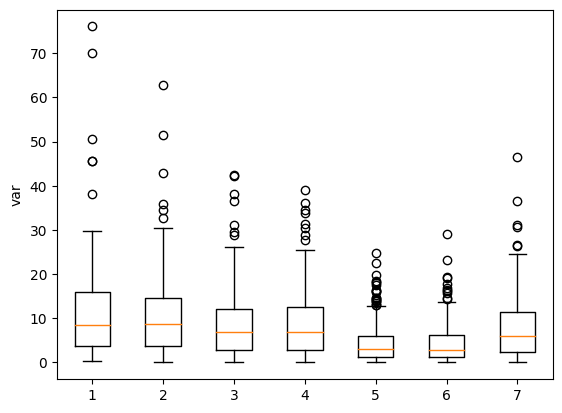

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
print("---"*20)
print("Para turno"+str(1))
box_turn_filtro("Llegadadia_sem","LlegadaTA",filtro)

Se separa de la siguiente forma


*   Dia semana 1, 2 y 7
*   Dia semana 4 y 3
*   Dia semana 5 y 6





------------------------------------------------------------
Para turno 1
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.267498  0.260237           True
Kruskal       h_llegada      5  19.299781  0.001690          False
Kruskal  Llegadadia_sem      2   8.372725  0.015201          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


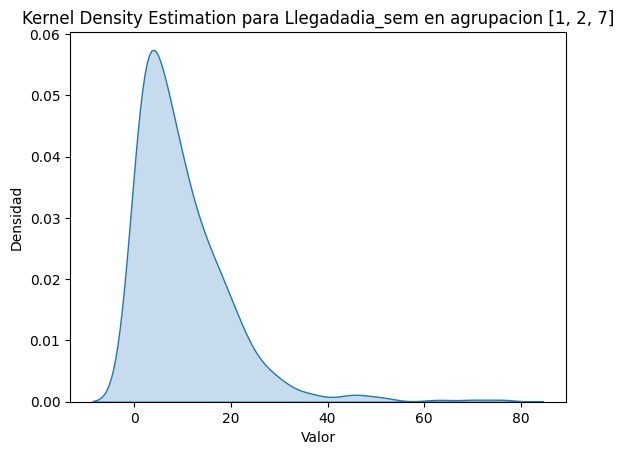

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   2.426996  0.119261           True
Kruskal       h_llegada      5  10.392281  0.064853           True
Kruskal  Llegadadia_sem      1   0.036111  0.849287           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


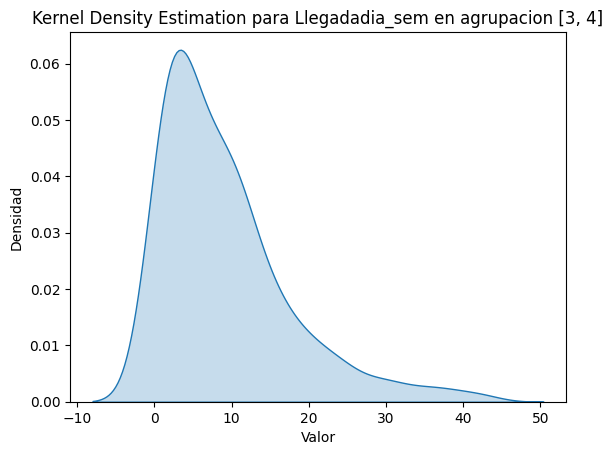

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  2.195083  0.138452           True
Kruskal       h_llegada      5  3.383384  0.641102           True
Kruskal  Llegadadia_sem      1  0.012910  0.909536           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


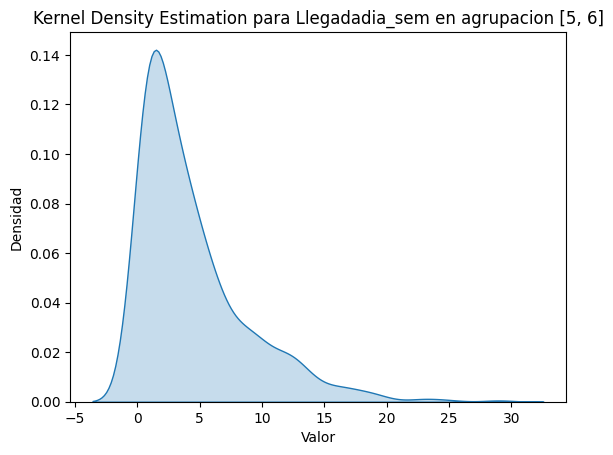

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 1
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
print("---"*20)
print("Para turno "+str(1))
analisis_agrupaciones('Llegadadia_sem',[1,2,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[3,4],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[5,6],"LlegadaTA",filtro)
print("%%%%%"*20)

De la anterior prueba se entiende que la combinación de semana 1, 2 y 7 se deben separar entonces se evaluca todas las combinaciones de estas, con tal de determinar si algunas de estas pueden ir juntas

------------------------------------------------------------
Para turno 1
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.712821  0.190620           True
Kruskal       h_llegada      5  20.672783  0.000934          False
Kruskal  Llegadadia_sem      1   0.093609  0.759639           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


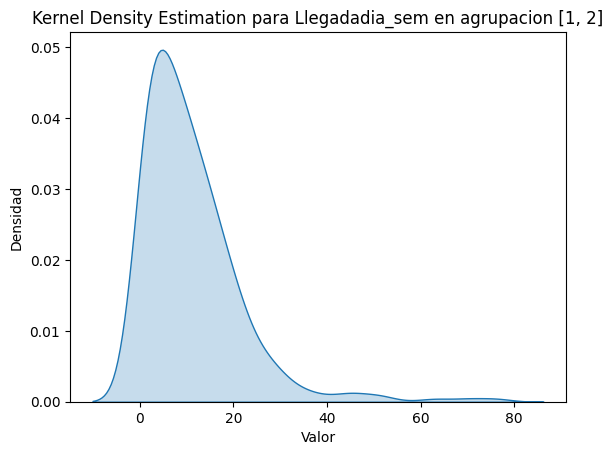

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.011234  0.915588           True
Kruskal       h_llegada      5  2.193182  0.821820           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


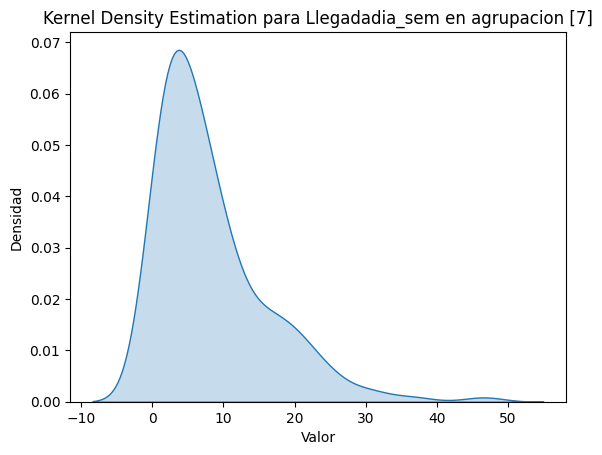

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.571698  0.449585           True
Kruskal       h_llegada      5  8.768614  0.118657           True
Kruskal  Llegadadia_sem      1  6.554742  0.010460          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


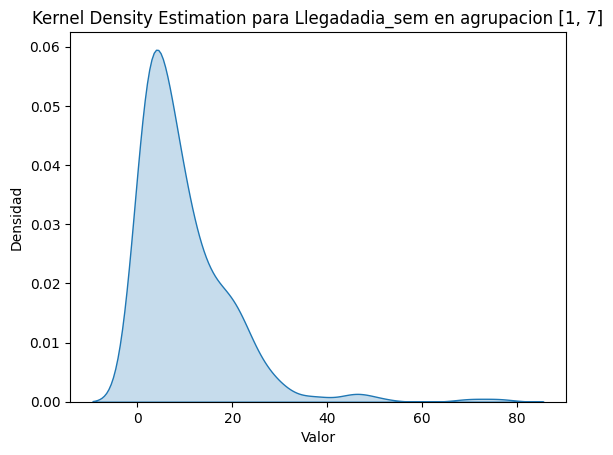

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.896618  0.343690           True
Kruskal       h_llegada      5  11.500323  0.042314          False
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


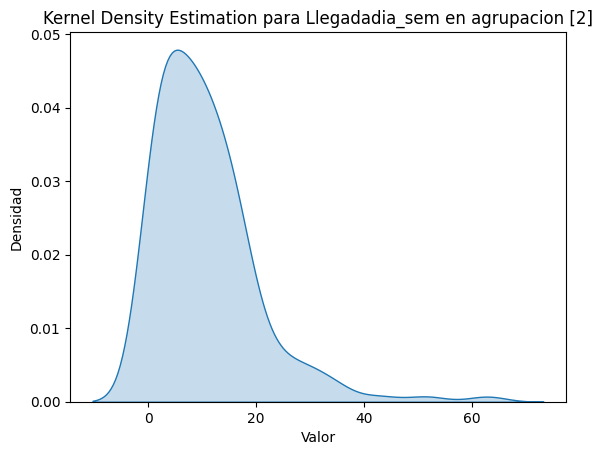

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [2, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.540548  0.462206           True
Kruskal       h_llegada      5  11.938173  0.035645          False
Kruskal  Llegadadia_sem      1   5.763037  0.016367          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


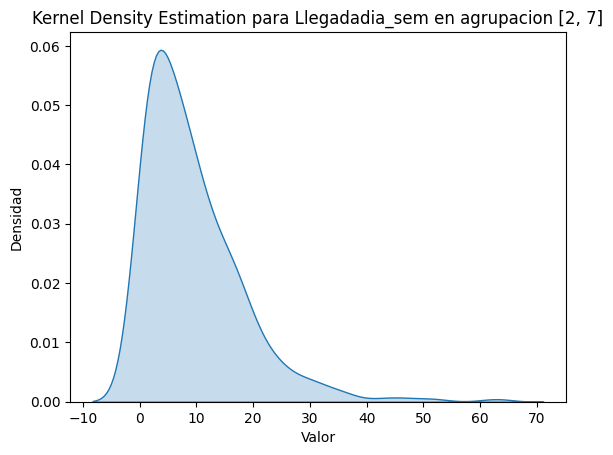

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.053716  0.304653           True
Kruskal       h_llegada      5  10.316305  0.066753           True
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


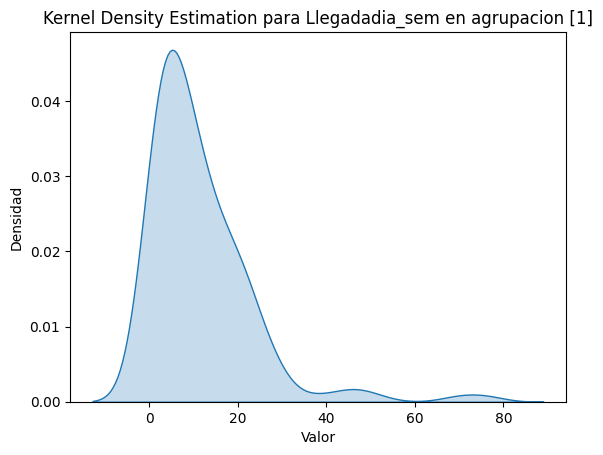

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 1 combinaciones de las semanas 1, 2 y 7
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
print("---"*20)
print("Para turno "+str(1))
analisis_agrupaciones('Llegadadia_sem',[1,2],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[1,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[2],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[2,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[1],"LlegadaTA",filtro)
print("%%%%%"*20)

Tras las anteriores pruebas se descubre que una de las mejores formas es:


*   Dia de la semana 1 y 2, presentan horas pico por lo que se deben separar
*   Dia de la semana 7



------------------------------------------------------------
Para turno1
Para las semanas 1 y 2


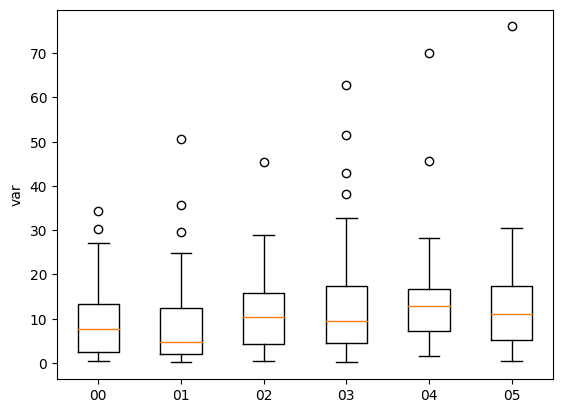

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)&((base['Llegadadia_sem']==2)|(base['Llegadadia_sem']==1))]
print("---"*20)
print("Para turno"+str(1))
print("Para las semanas "+str(1)+" y "+str(2))
box_turn_filtro("h_llegada","LlegadaTA",filtro)
print("%%%%"*25)

Se agrupan de la siguiente forma y se realizan las pruebas


*   Horas 0 y 1
*   Hora 3
*   Horas 2 y 4
*   Hora 5

------------------------------------------------------------
Para turno 1
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [0, 1] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.850139  0.356513           True
Kruskal       h_llegada      1  1.034983  0.308991           True
Kruskal  Llegadadia_sem      1  0.038443  0.844556           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


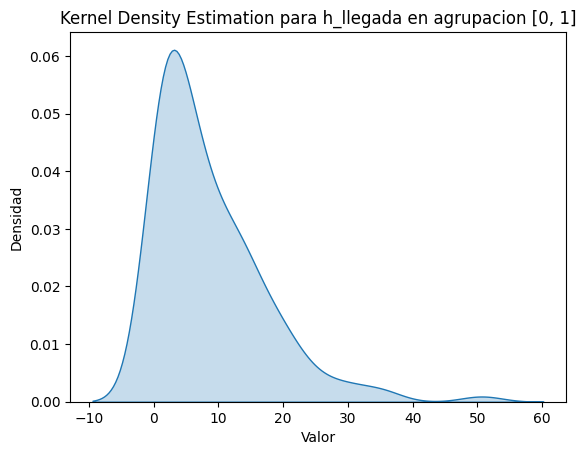

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [3] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.289456  0.590569           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      1  0.006851  0.934034           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


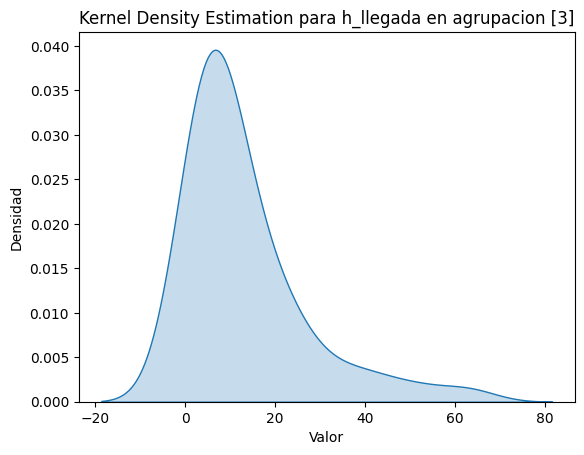

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [2, 4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.143855  0.704478           True
Kruskal       h_llegada      1  1.313124  0.251830           True
Kruskal  Llegadadia_sem      1  0.126139  0.722469           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


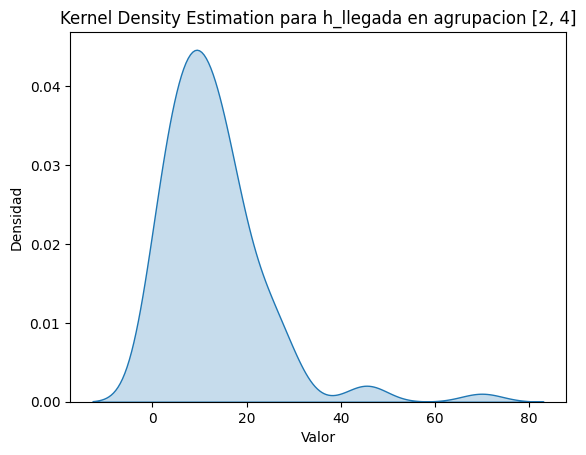

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  3.924279  0.047594          False
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      1  0.000204  0.988609           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


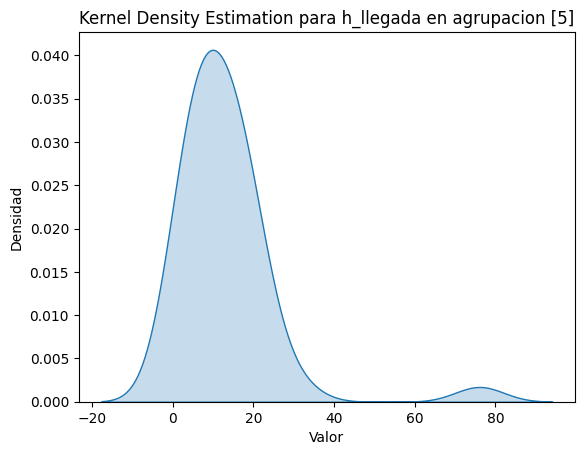

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)&((base['Llegadadia_sem']==2)|(base['Llegadadia_sem']==1))]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
print("---"*20)
print("Para turno "+str(1))
analisis_agrupaciones('h_llegada',[0,1],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[3],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[2,4],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('h_llegada',[5],"LlegadaTA",filtro)
print("%%%%%"*20)

La hora 5, presenta dependencia con el que atiende, entonces se debe realizar nuevas pruebas de independecias

------------------------------------------------------------
Para turno1
Para la semana 5


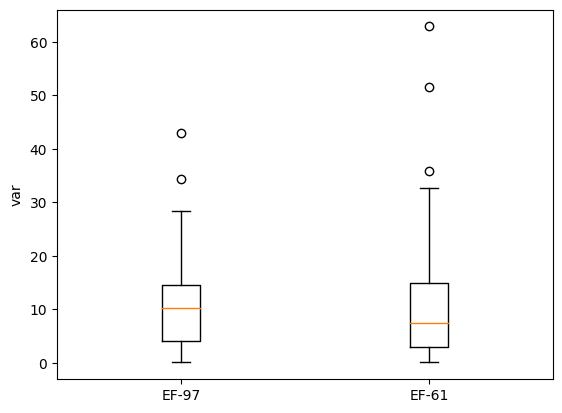

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)&((base['Llegadadia_sem']==2)|(base['Llegadadia_sem']==1)&(base['h_llegada']==5))]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
print("---"*20)
print("Para turno"+str(1))
print("Para la semana "+str(5))
box_turn_filtro("Atiende","LlegadaTA",filtro)
print("%%%%"*25)

#El turno 1 queda de la siguiente forma:


*   El dia de semana 1 y 2, se separan por horas * 0 y 1 * 3 * 2 y 4 * 5, esta ultima 5 se separa por enfermeros 97 y 61.
*   Dia semana 3 y 4.
*   Dia semana 5 y 6.
*   Dia semana 7



#Para el turno 2 se debe separar todo por semanas. Y analizar si existen nuevas dependencias.

------------------------------------------------------------
Para turno2


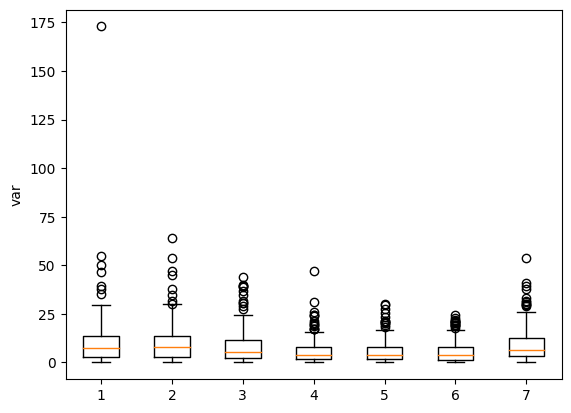

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
print("---"*20)
print("Para turno"+str(2))
box_turn_filtro("Llegadadia_sem","LlegadaTA",filtro)

Se puede realizar la siguiente combinación


*   Dia de semana 1 y 2
*   Dia de semana 3 y 7
*   Dia de semana 4, 5 y 6




------------------------------------------------------------
Para turno 2
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  3.500039  0.061367           True
Kruskal       h_llegada      5  1.883874  0.864969           True
Kruskal  Llegadadia_sem      1  0.000015  0.996955           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


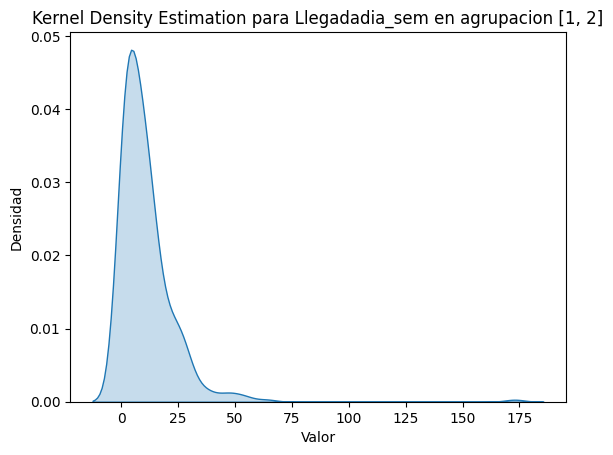

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [3, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.312100  0.576394           True
Kruskal       h_llegada      5  9.244127  0.099714           True
Kruskal  Llegadadia_sem      1  2.412285  0.120386           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


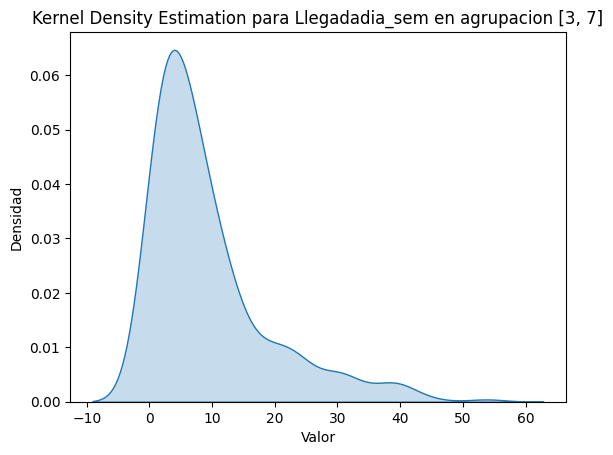

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 5, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   6.087711  0.013613          False
Kruskal       h_llegada      5  12.116769  0.033222          False
Kruskal  Llegadadia_sem      2   0.157328  0.924350           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


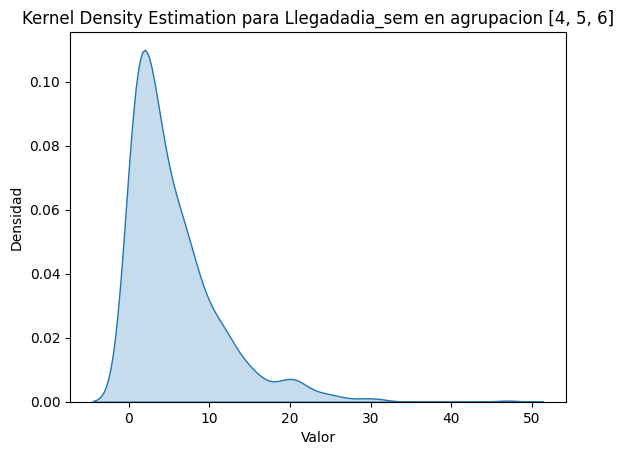

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 2
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
print("---"*20)
print("Para turno "+str(2))
analisis_agrupaciones('Llegadadia_sem',[1,2],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[3,7],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[4,5,6],"LlegadaTA",filtro)
print("%%%%%"*20)

Se debe separar los dias de la semana 4, 5 y 6. Entonces se prueba las combinaciones posibles para realizar conclusiones de como separar o agrupar.


------------------------------------------------------------
Para turno 2
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   6.870598  0.008763          False
Kruskal       h_llegada      5  18.721066  0.002166          False
Kruskal  Llegadadia_sem      1   0.001084  0.973736           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


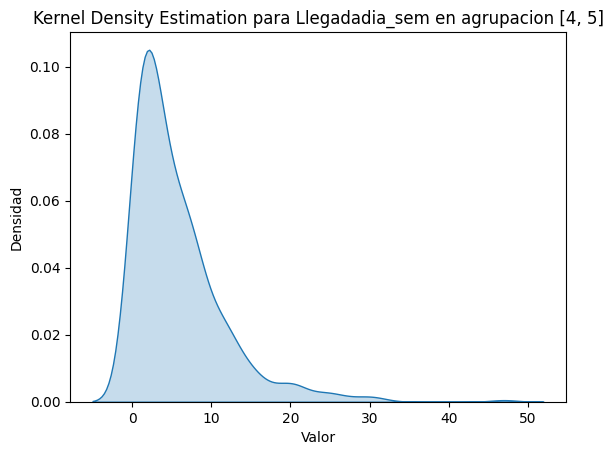

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.400653  0.526752           True
Kruskal       h_llegada      5  10.091201  0.072692           True
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


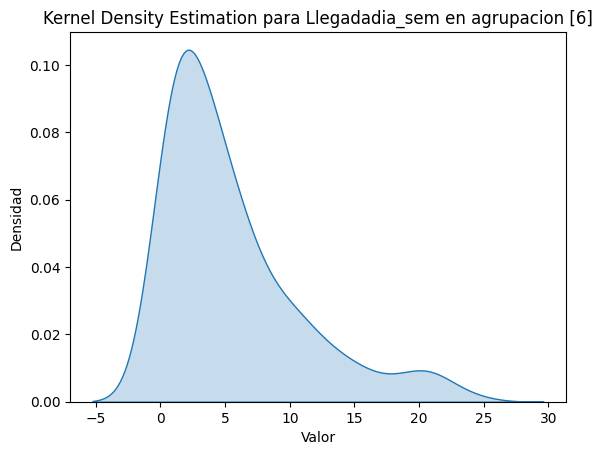

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  1.806880  0.178883           True
Kruskal       h_llegada      5  6.422032  0.267291           True
Kruskal  Llegadadia_sem      1  0.104538  0.746450           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


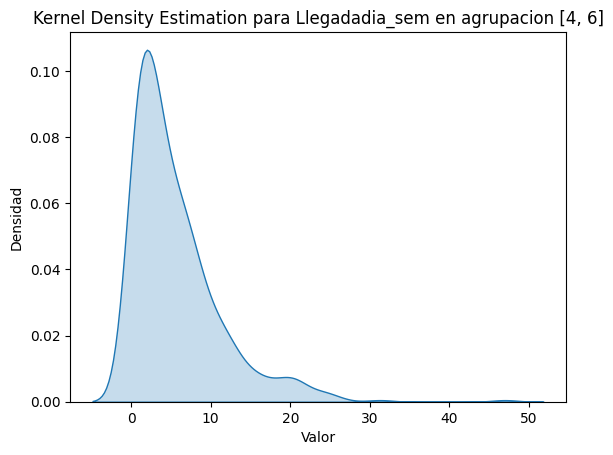

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   5.437590  0.019708          False
Kruskal       h_llegada      5  14.853852  0.011005          False
Kruskal  Llegadadia_sem      0   0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


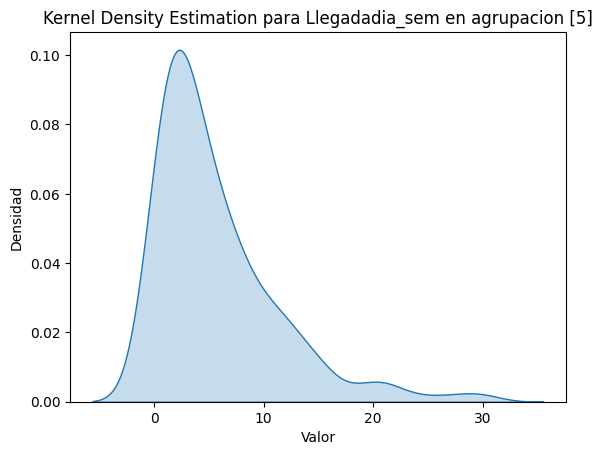

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [5, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  4.341764  0.037188          False
Kruskal       h_llegada      5  8.909488  0.112729           True
Kruskal  Llegadadia_sem      1  0.129406  0.719048           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


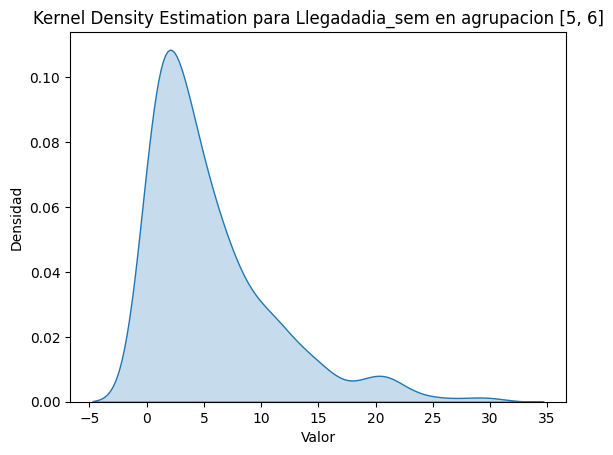

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  1.745955  0.186386           True
Kruskal       h_llegada      5  8.188326  0.146158           True
Kruskal  Llegadadia_sem      0  0.000000       NaN           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


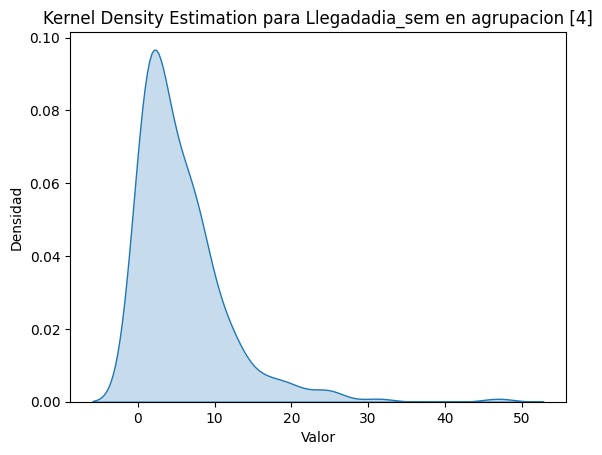

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
#Para turno 2
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
print("---"*20)
print("Para turno "+str(2))
analisis_agrupaciones('Llegadadia_sem',[4,5],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[6],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[4,6],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[5],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[5,6],"LlegadaTA",filtro)
print("%%%%%"*20)
analisis_agrupaciones('Llegadadia_sem',[4],"LlegadaTA",filtro)
print("%%%%%"*20)

Se toma la decision de las combinaciones
*   Dia de la semana 5 y 6, se debe separar por quien atiende.
*   Dia de la semana 4



------------------------------------------------------------
Para turno2
Para la semanas 5 y 6


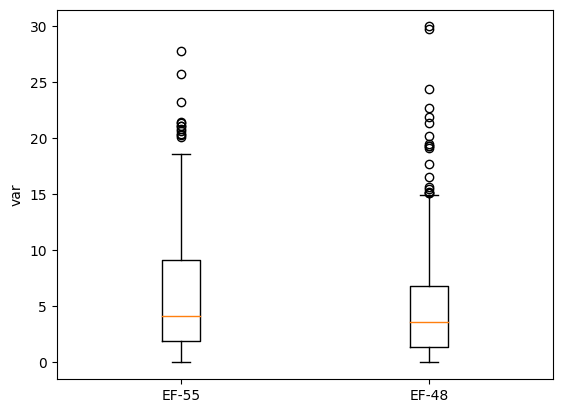

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)&((base['Llegadadia_sem']==5)|(base['Llegadadia_sem']==6))]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
print("---"*20)
print("Para turno"+str(2))
print("Para la semanas "+str(5)+" y "+str(6))
box_turn_filtro("Atiende","LlegadaTA",filtro)
print("%%%%"*25)

#En resumen el Turno 2 se genera de la siguiente forma:
*   Dia semana 1 y 2
*   Dia semana 3 y 7
*   Dia semana 5 y 6, se separa por las enfermeras 55 y 48
*   Dia semana 4

#Que hubiera sucedido si se hacia unicamente la separación por horas?

Para 0
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [0] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.975728  0.323256           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  27.532738  0.000115          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


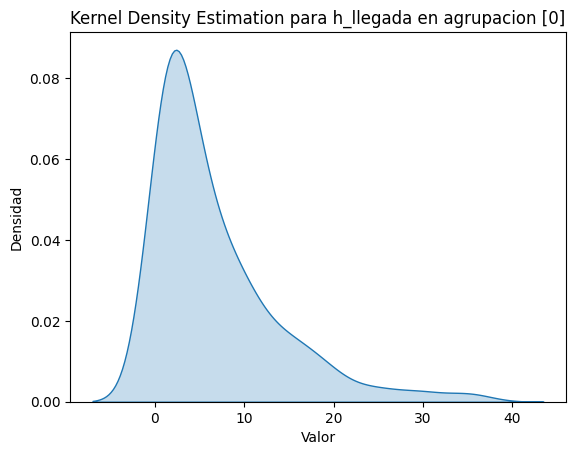

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 1
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [1] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.368941  0.543582           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  31.129154  0.000024          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


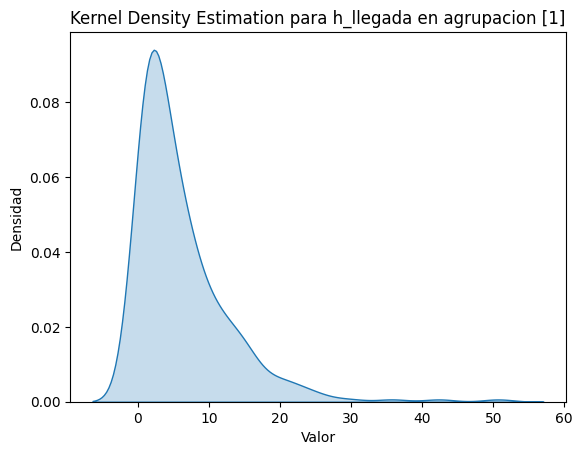

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 2
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [2] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.084784  0.770916           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  32.284691  0.000014          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


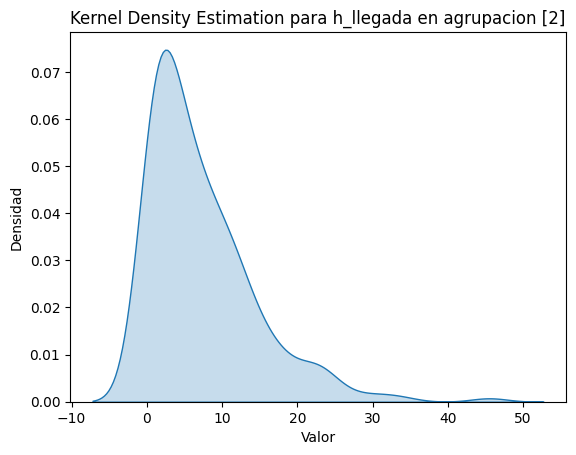

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 3
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [3] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.508078  0.475972           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  32.044100  0.000016          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


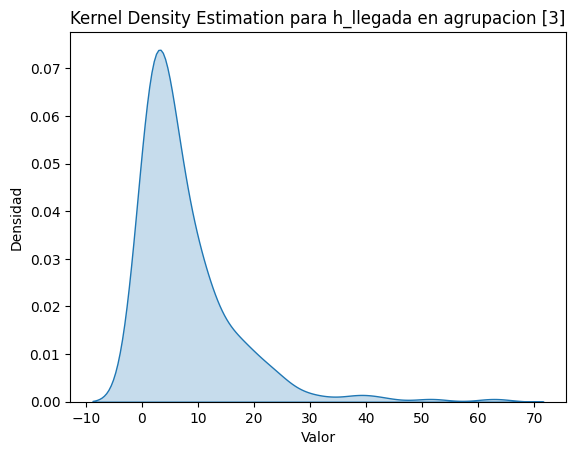

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 4
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H         p-unc  Independencia
Kruskal         Atiende      1   0.913690  3.391373e-01           True
Kruskal       h_llegada      0   0.000000           NaN           True
Kruskal  Llegadadia_sem      6  59.279432  6.304299e-11          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


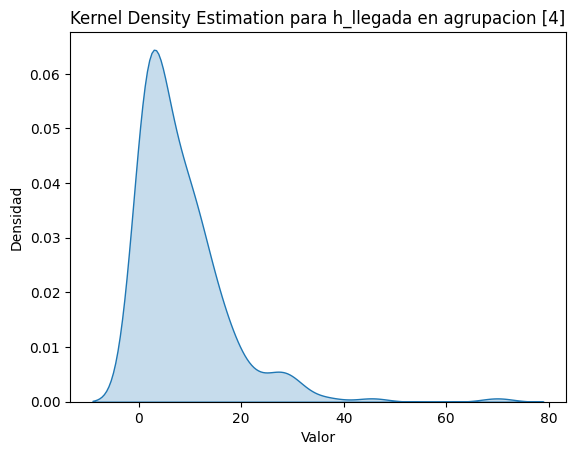

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 5
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [5] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.069856  0.791546           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  38.019544  0.000001          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


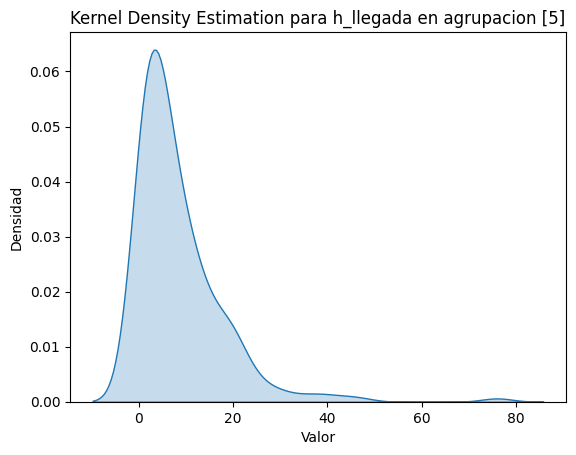

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 6
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   5.797583  0.016048          False
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  23.080415  0.000770          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


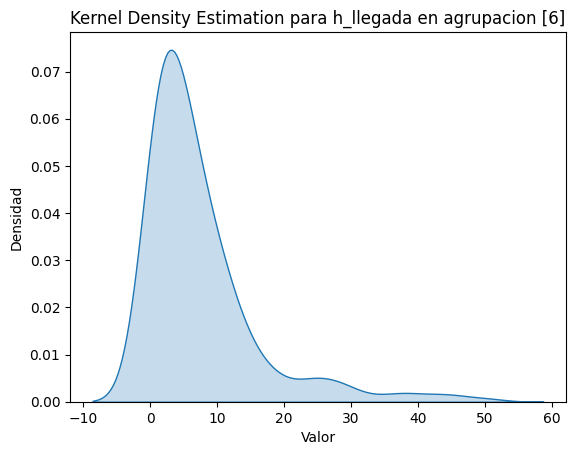

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 7
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   3.386400  0.065736           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  21.586953  0.001438          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


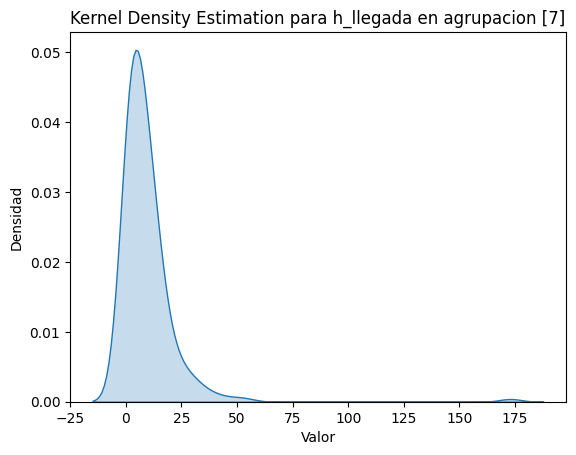

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 8
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [8] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.267655  0.604909           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  10.410396  0.108400           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


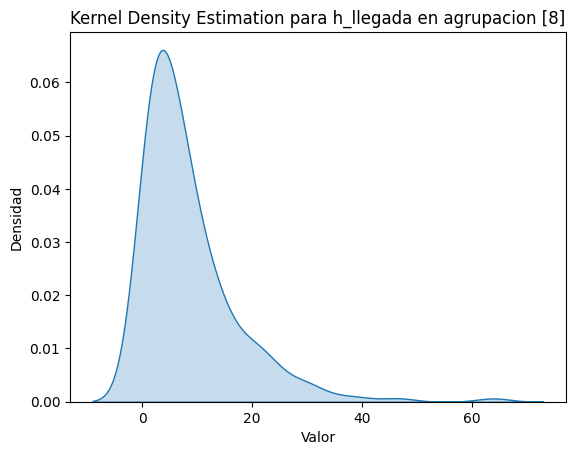

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 9
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [9] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.410814  0.521557           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  10.116485  0.119832           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


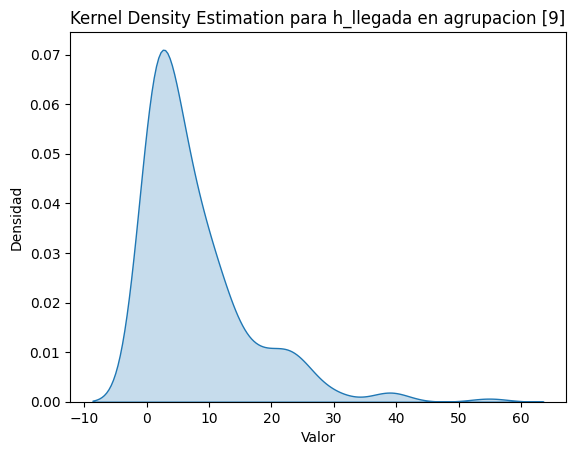

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 10
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [10] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.365457  0.545491           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  36.737573  0.000002          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


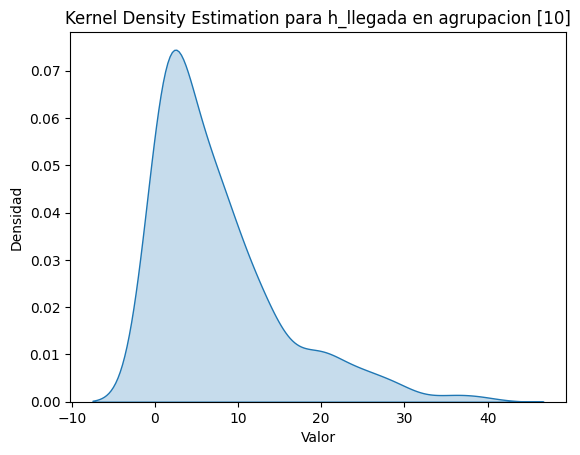

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 11
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [11] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.055757  0.304185           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  14.723465  0.022520          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


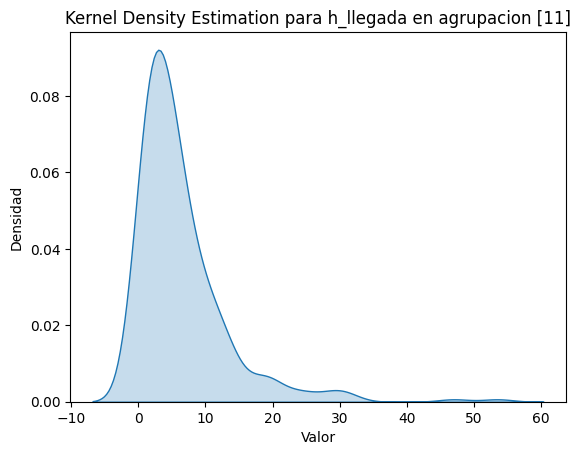

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 12
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [12] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   2.992560  0.083648           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  15.219352  0.018618          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


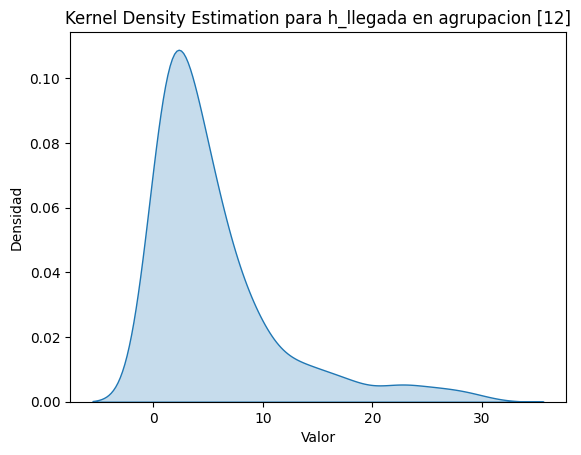

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 13
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [13] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.838820  0.175089           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  10.338649  0.111096           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


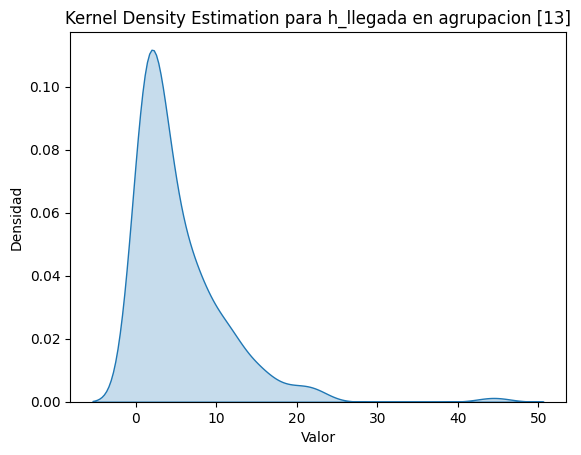

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 14
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [14] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.032441  0.857063           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  16.674083  0.010559          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


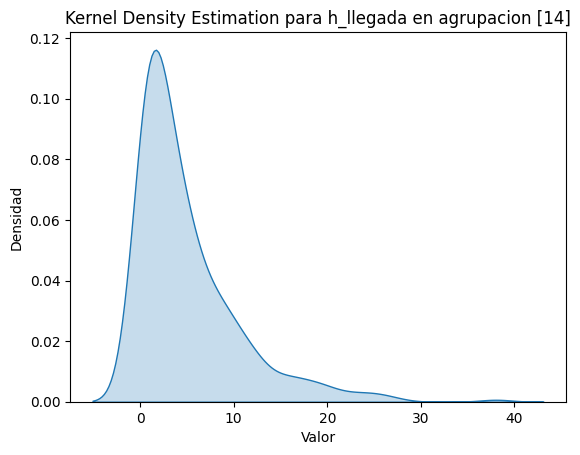

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 15
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [15] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.030258  0.861907           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      6  1.182822  0.977725           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


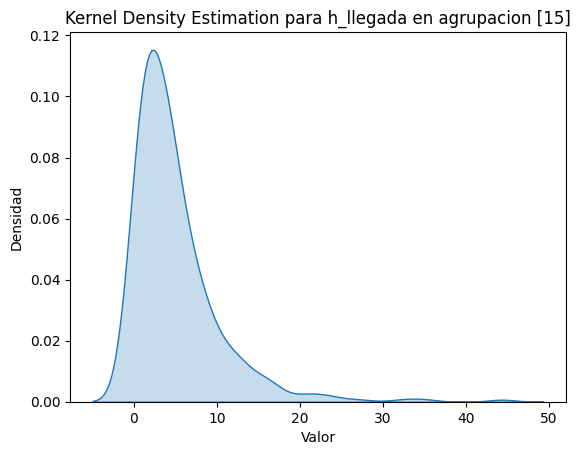

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 16
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [16] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   2.551894  0.110162           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  18.422723  0.005258          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


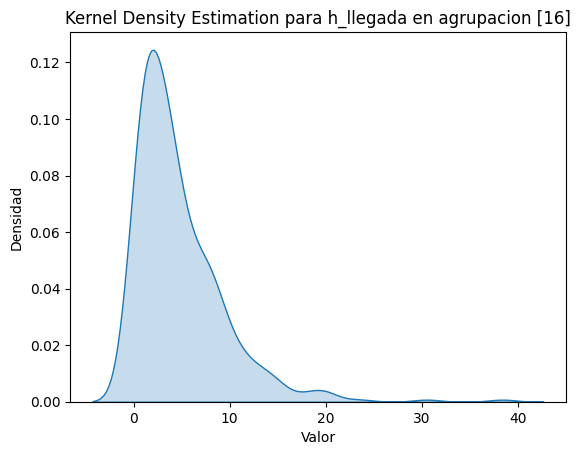

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 17
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [17] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.470305  0.492847           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  12.051430  0.060831           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


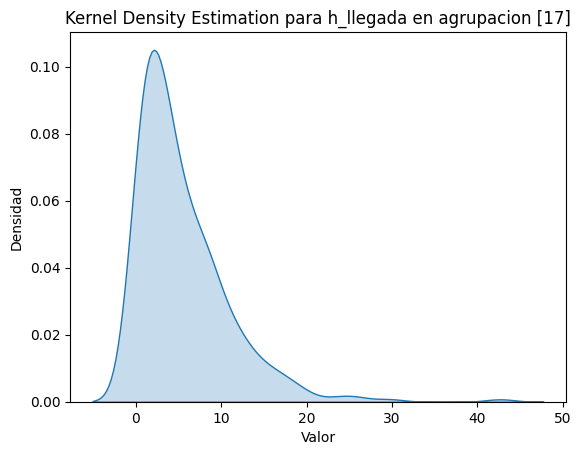

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 18
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [18] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   1.980763  0.159310           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  16.153325  0.012954          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


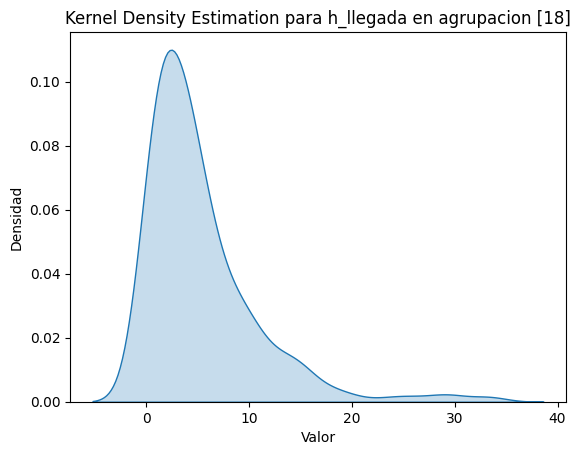

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 19
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [19] se obtuvo:
------------------------------------------------------------
                 Source  ddof1         H     p-unc  Independencia
Kruskal         Atiende      1  0.098424  0.753730           True
Kruskal       h_llegada      0  0.000000       NaN           True
Kruskal  Llegadadia_sem      6  9.478411  0.148406           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


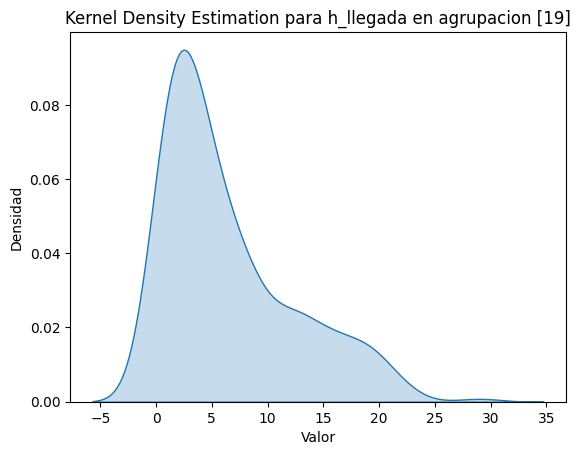

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 20
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [20] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.003264  0.954437           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  13.714931  0.032988          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


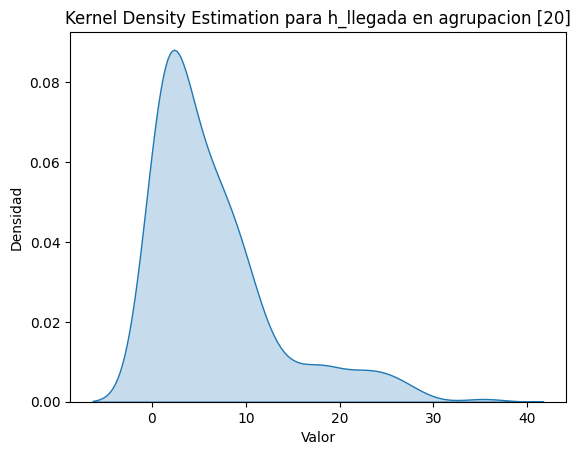

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 21
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [21] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.011939  0.912993           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  14.012450  0.029497          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


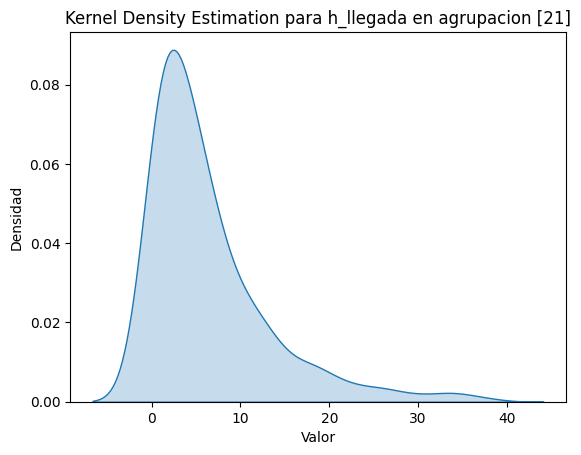

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 22
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [22] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.650444  0.419954           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  37.819549  0.000001          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


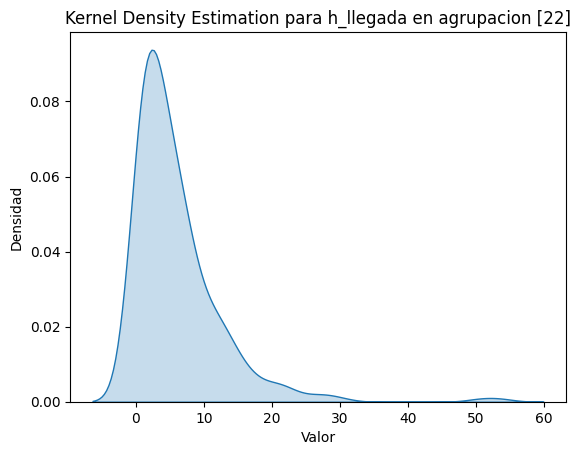

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Para 23
------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%
Para la h_llegada de [23] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      1   0.050758  0.821749           True
Kruskal       h_llegada      0   0.000000       NaN           True
Kruskal  Llegadadia_sem      6  25.553177  0.000270          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


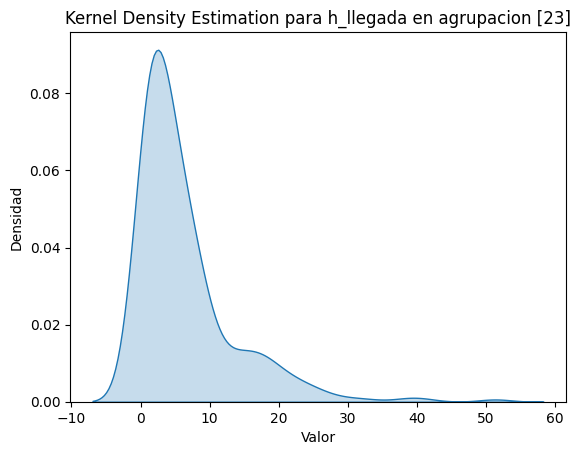

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


In [ ]:
for i in range(0,24):
  print("Para "+str(i))
  print("----"*18)
  base['h_llegada']=base['h_llegada'].astype(int)
  analisis_agrupaciones('h_llegada',[i],"LlegadaTA",base)
  print("%%%%"*18)

Como se observa, solo se pasa 6 de 24 en total las pruebas, lo que quiere decir, que si se debia separar por el dia de la semana como se realizo. Entonces, se procede a realizar las pruebas FIT

#Se realizan las pruebas fit para determinar las fdp

Turno 4, semana 1, 2 y 7


[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0110699] [loc=7.825 scale=7.856]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000284084] [loc=0.017 scale=7.808]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000283554] [loc=-1210.608 scale=1210.624]
[distfit] >INFO> [dweibull  ] [0.04 sec] [RSS: 0.00711173] [loc=5.417 scale=5.313]
[distfit] >INFO> [t         ] [0.12 sec] [RSS: 0.00635276] [loc=5.387 scale=4.296]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.00164844] [loc=3.583 scale=3.612]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.000314203] [loc=0.017 scale=8.261]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000774278] [loc=-0.594 scale=5.568]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.000349522] [loc=0.017 scale=399.529]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.024918] [loc=0.017 scale=53.550]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.011482] [loc=-2561.561 scale=344.965]
[distfit] >INFO> [norm

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=156.044, loc=-1210.61, scale=1210.62)'}, xlabel='Values', ylabel='Frequency'>)

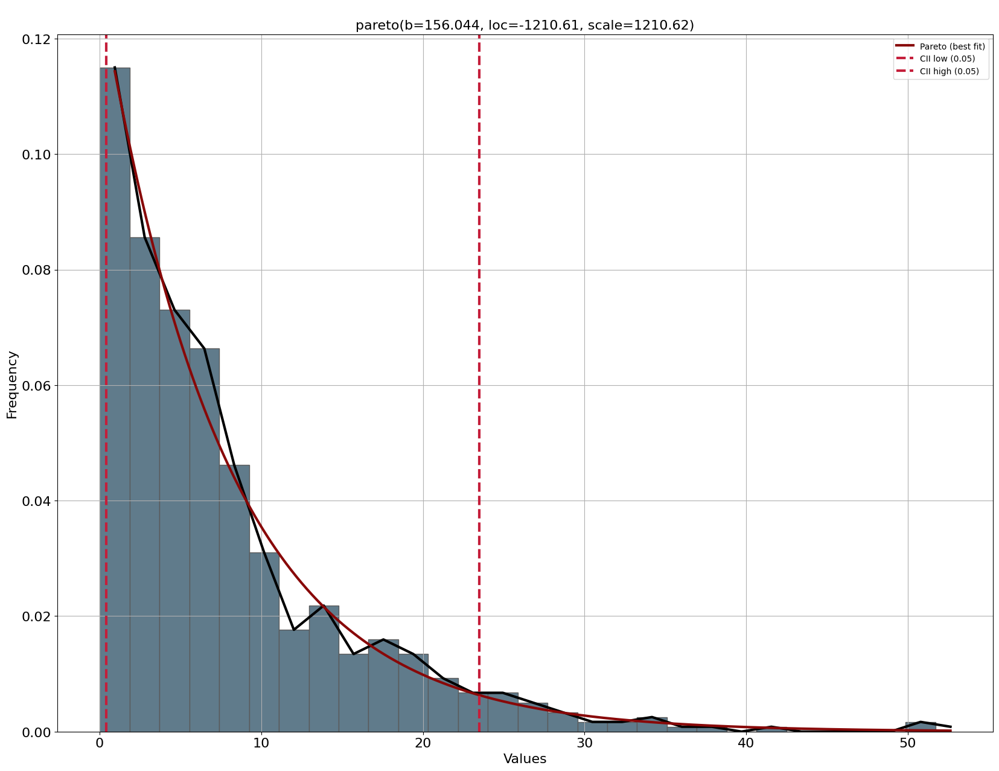

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==4)]
filtro=filtro[((filtro['Llegadadia_sem']==1)|(filtro['Llegadadia_sem']==2)|(filtro['Llegadadia_sem']==7))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T4_S127.xlsx")
dfit.plot()

Turno 4, semana 3 y 5

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0108087] [loc=6.144 scale=5.731]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000557827] [loc=0.017 scale=6.127]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000557827] [loc=-268435455.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.00859832] [loc=4.999 scale=4.567]
[distfit] >INFO> [t         ] [0.37 sec] [RSS: 0.00858089] [loc=4.950 scale=4.291]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.000882791] [loc=2.875 scale=2.928]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 0.000588901] [loc=0.017 scale=6.288]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00070587] [loc=-0.558 scale=4.543]
[distfit] >INFO> [beta      ] [0.14 sec] [RSS: 0.000669394] [loc=0.017 scale=50.068]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0205992] [loc=0.017 scale=30.267]
[distfit] >INFO> [loggamma  ] [0.11 sec] [RSS: 0.0110875] [loc=-2114.898 scale=275.517]
[distfit] >

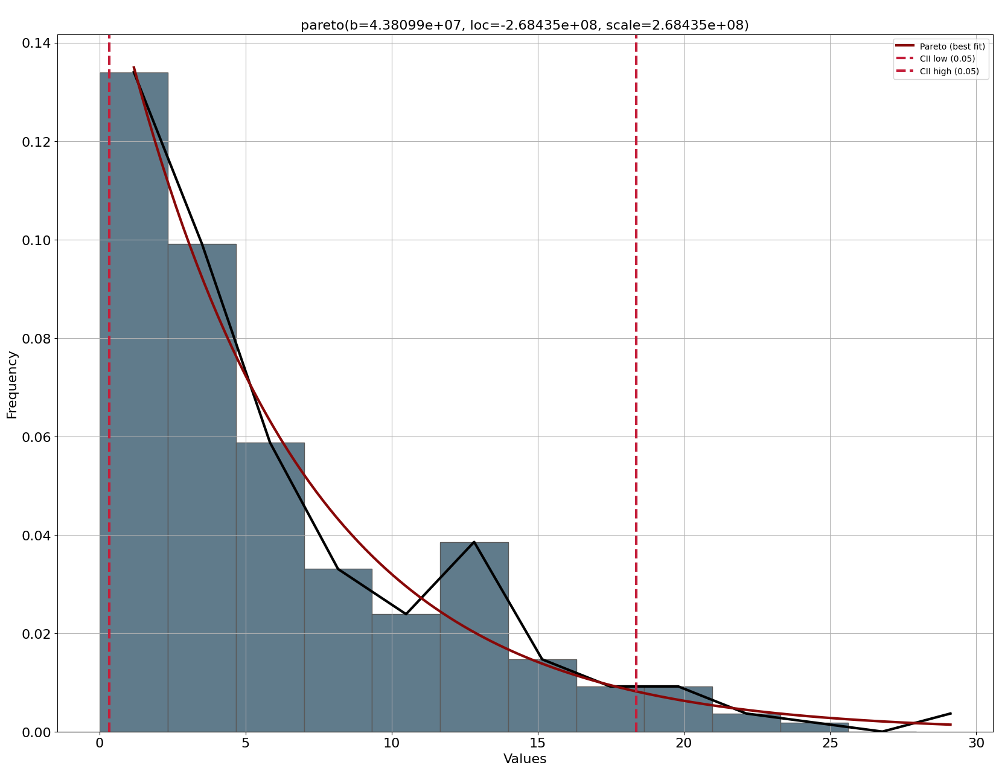

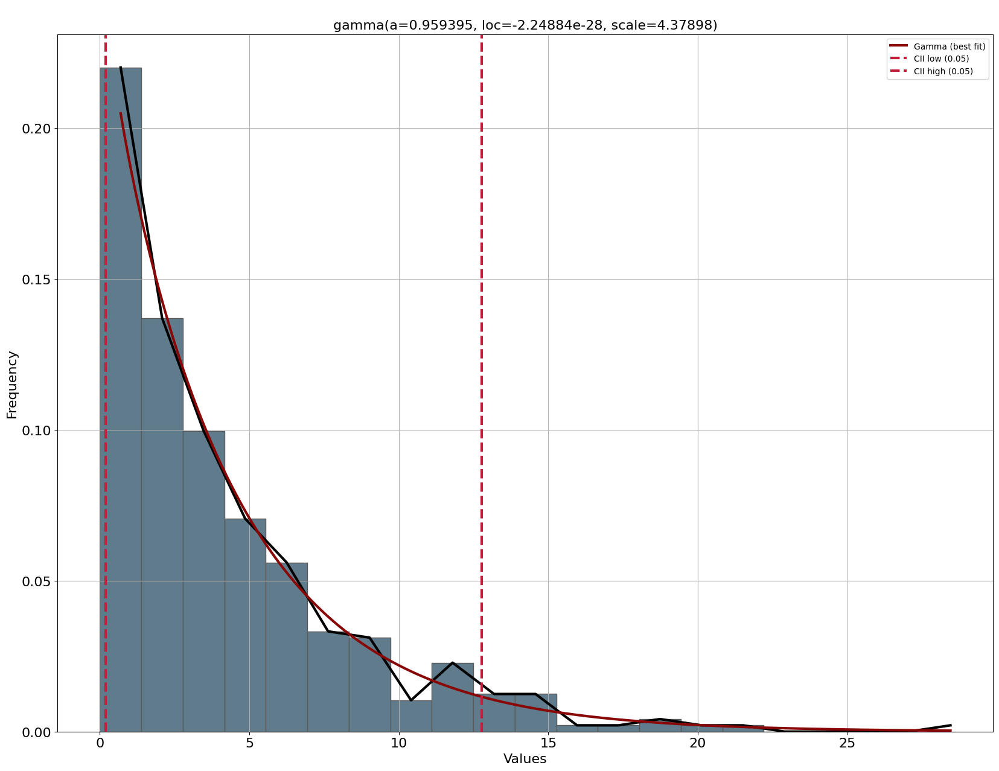

In [ ]:
for i in [3,5]:
  filtro=base[(base['Ini-Triaggeturno_6h']==4)]
  filtro=filtro[(filtro['Llegadadia_sem']==i)]
  dfit = distfit()
  results2 = dfit.fit_transform(filtro['LlegadaTA'])
  results2['summary'].to_excel("T4_S"+str(i)+".xlsx")
  dfit.plot()

Turno 4, semana 4 y 6

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0218388] [loc=5.404 scale=5.522]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000347745] [loc=0.017 scale=5.387]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000363893] [loc=-203.821 scale=203.838]
[distfit] >INFO> [dweibull  ] [0.13 sec] [RSS: 0.0143919] [loc=3.450 scale=3.676]
[distfit] >INFO> [t         ] [0.28 sec] [RSS: 0.0125091] [loc=3.636 scale=2.865]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 0.00221932] [loc=2.460 scale=2.437]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 0.000367919] [loc=0.017 scale=5.460]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000865701] [loc=-0.350 scale=3.769]
[distfit] >INFO> [beta      ] [0.16 sec] [RSS: 0.000374526] [loc=0.017 scale=331.157]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0500695] [loc=0.017 scale=37.450]
[distfit] >INFO> [loggamma  ] [0.11 sec] [RSS: 0.0223792] [loc=-1809.250 scale=241.422]
[distfit] >INFO> [norm  

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nexpon(loc=0.0166667, scale=5.38744)'}, xlabel='Values', ylabel='Frequency'>)

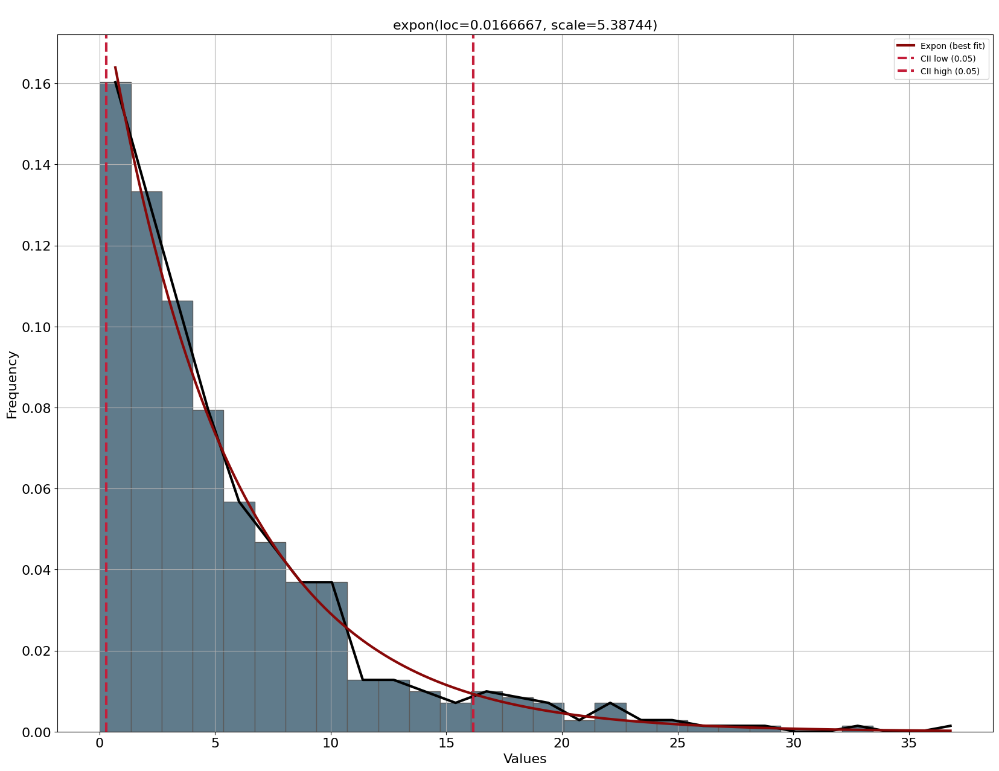

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==4)]
filtro=filtro[((filtro['Llegadadia_sem']==4)|(filtro['Llegadadia_sem']==6))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T4_S46.xlsx")
dfit.plot()

Turno 2, semana 1 y 2

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.01 sec] [RSS: 0.00594983] [loc=10.857 scale=13.529]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000471887] [loc=0.033 scale=10.823]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000449882] [loc=-87.493 scale=87.526]
[distfit] >INFO> [dweibull  ] [0.11 sec] [RSS: 0.00482733] [loc=7.700 scale=7.676]
[distfit] >INFO> [t         ] [0.28 sec] [RSS: 0.00383162] [loc=7.686 scale=6.318]
[distfit] >INFO> [genextreme] [0.23 sec] [RSS: 0.00117013] [loc=4.658 scale=4.973]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 0.011843] [loc=0.033 scale=3.291]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.000755171] [loc=-0.660 scale=7.078]
[distfit] >INFO> [beta      ] [0.39 sec] [RSS: 0.000505873] [loc=0.033 scale=4183.486]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0139849] [loc=0.033 scale=172.900]
[distfit] >INFO> [loggamma  ] [0.14 sec] [RSS: 0.00610067] [loc=-4249.350 scale=573.941]
[distfit] >INFO> [no

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=9.12338, loc=-87.4929, scale=87.5262)'}, xlabel='Values', ylabel='Frequency'>)

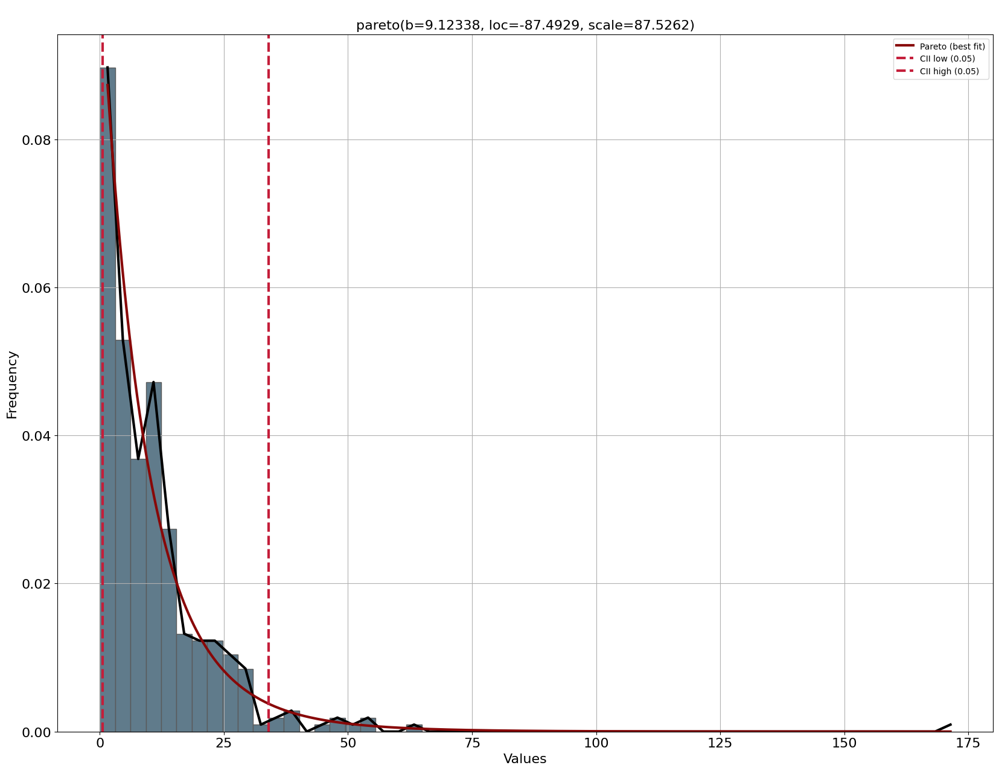

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
filtro=filtro[((filtro['Llegadadia_sem']==1)|(filtro['Llegadadia_sem']==2))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T2_S12.xlsx")
dfit.plot()

Turno 2, semana 3 y 7

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0065808] [loc=9.371 scale=9.547]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0002438] [loc=0.017 scale=9.354]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000231107] [loc=-354.601 scale=354.617]
[distfit] >INFO> [dweibull  ] [0.06 sec] [RSS: 0.00352693] [loc=5.433 scale=6.843]
[distfit] >INFO> [t         ] [0.23 sec] [RSS: 0.00342009] [loc=5.925 scale=4.605]
[distfit] >INFO> [genextreme] [0.20 sec] [RSS: 0.000597712] [loc=4.188 scale=4.207]
[distfit] >INFO> [gamma     ] [0.17 sec] [RSS: 0.000251334] [loc=0.017 scale=9.856]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000330459] [loc=-0.698 scale=6.605]
[distfit] >INFO> [beta      ] [0.32 sec] [RSS: 0.000522364] [loc=0.017 scale=69.473]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0128981] [loc=0.017 scale=53.767]
[distfit] >INFO> [loggamma  ] [0.16 sec] [RSS: 0.00669122] [loc=-2620.509 scale=363.620]
[distfit] >INFO> [norm 

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=38.9066, loc=-354.601, scale=354.617)'}, xlabel='Values', ylabel='Frequency'>)

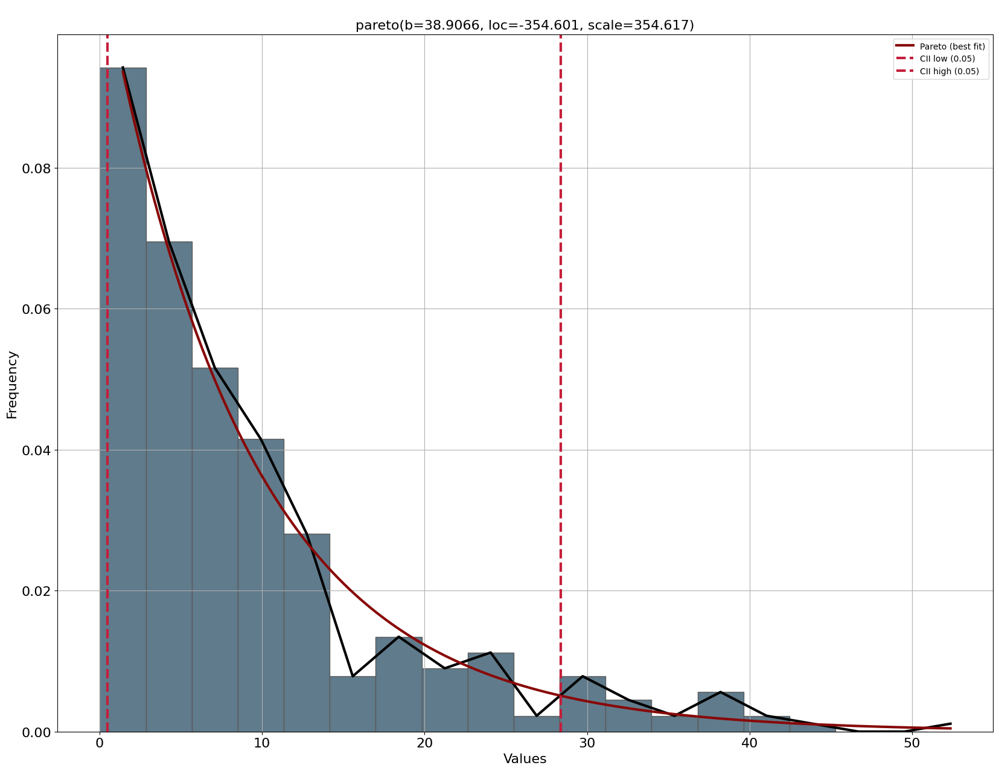

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
filtro=filtro[((filtro['Llegadadia_sem']==3)|(filtro['Llegadadia_sem']==7))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T2_S37.xlsx")
dfit.plot()

Turno 2 semana 4

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.014805] [loc=5.722 scale=5.916]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0012648] [loc=0.000 scale=5.722]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00127566] [loc=-207.776 scale=207.776]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.0107723] [loc=4.531 scale=4.232]
[distfit] >INFO> [t         ] [0.23 sec] [RSS: 0.011059] [loc=4.275 scale=3.441]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.00287129] [loc=2.653 scale=2.678]
[distfit] >INFO> [gamma     ] [0.12 sec] [RSS: 0.00127452] [loc=-0.000 scale=6.046]
[distfit] >INFO> [lognorm   ] [0.07 sec] [RSS: 0.00192549] [loc=-0.476 scale=4.132]
[distfit] >INFO> [beta      ] [0.19 sec] [RSS: 0.00126558] [loc=-0.000 scale=1111.829]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0365479] [loc=0.000 scale=46.967]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.0151128] [loc=-2371.886 scale=305.078]
[distfit] >INFO> [norm      ]

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nexpon(loc=0, scale=5.72161)'}, xlabel='Values', ylabel='Frequency'>)

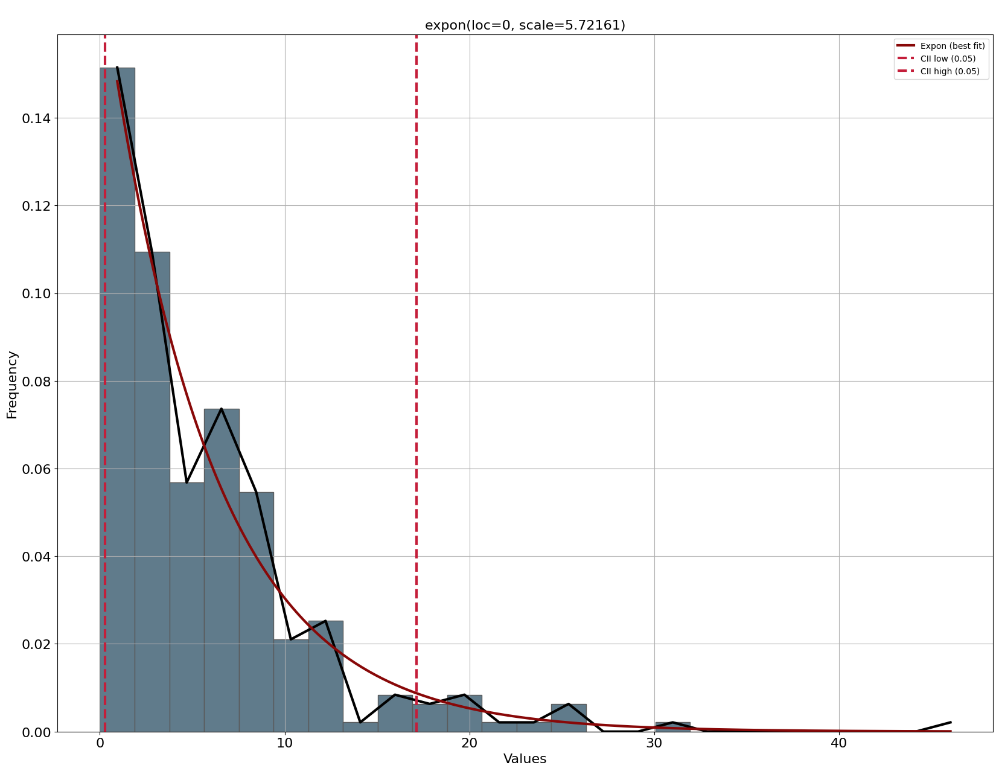

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
filtro=filtro[((filtro['Llegadadia_sem']==4))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T2_S4.xlsx")
dfit.plot()

Turno 2, semana 5 y 6, enfermero 55 y el 48 (aparte)

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.011261] [loc=6.089 scale=5.575]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000928224] [loc=0.033 scale=6.055]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000928224] [loc=-268435455.967 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.00847957] [loc=4.909 scale=4.453]
[distfit] >INFO> [t         ] [0.33 sec] [RSS: 0.00896764] [loc=4.875 scale=4.071]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.000956057] [loc=2.909 scale=2.859]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.000884004] [loc=0.032 scale=5.807]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00098288] [loc=-0.447 scale=4.440]
[distfit] >INFO> [beta      ] [0.21 sec] [RSS: 0.00104202] [loc=0.033 scale=43.020]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0213402] [loc=0.033 scale=27.733]
[distfit] >INFO> [loggamma  ] [0.14 sec] [RSS: 0.0112976] [loc=-1475.053 scale=206.323]
[distfit] >IN

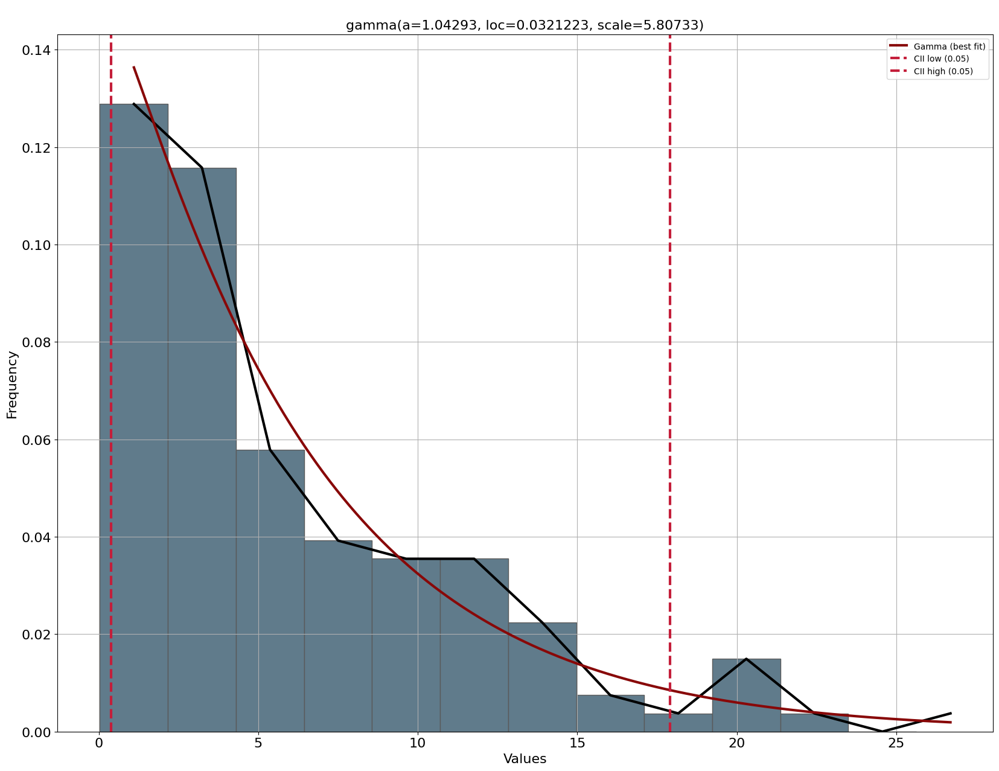

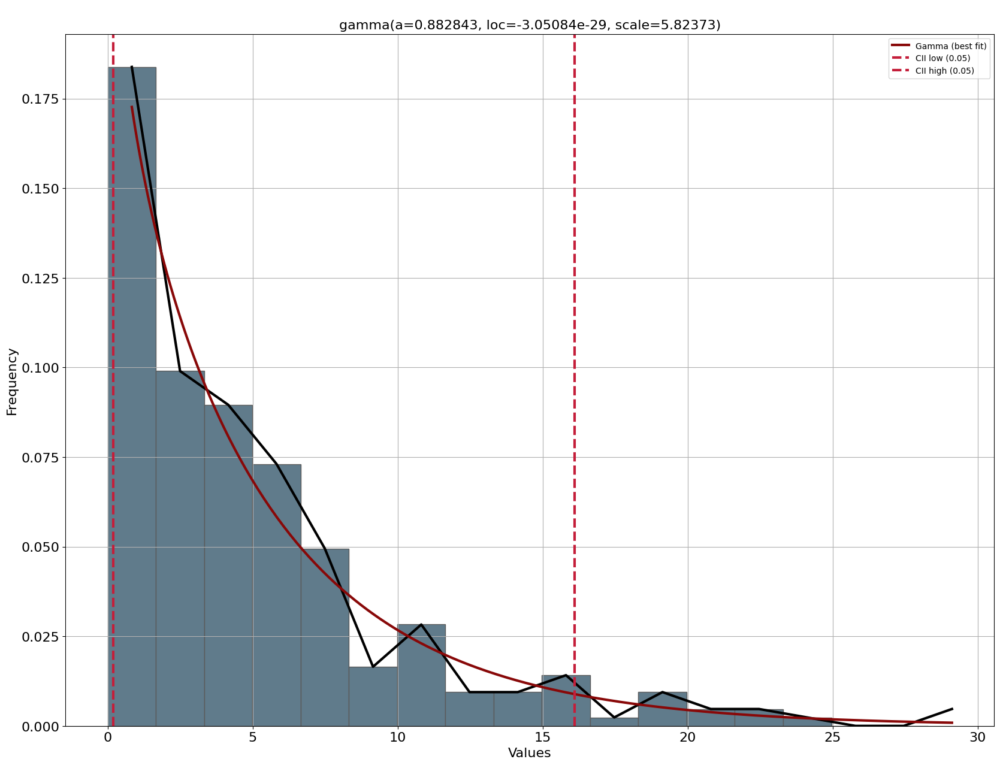

In [ ]:
for i in [55,48]:
  filtro=base[(base['Ini-Triaggeturno_6h']==2)]
  filtro=filtro[((filtro['Llegadadia_sem']==5)|(filtro['Llegadadia_sem']==6))]
  filtro=filtro[((filtro['Atiende']=="EF-"+str(i)))]
  dfit = distfit()
  results2 = dfit.fit_transform(filtro['LlegadaTA'])
  results2['summary'].to_excel("T2_S56_EF"+str(i)+".xlsx")
  dfit.plot()

Turno 2, semana 5 y 6

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.01 sec] [RSS: 0.0187177] [loc=5.624 scale=5.471]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000723649] [loc=0.000 scale=5.624]
[distfit] >INFO> [pareto    ] [0.01 sec] [RSS: 0.000723649] [loc=-134217728.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.07 sec] [RSS: 0.0148019] [loc=4.506 scale=4.115]
[distfit] >INFO> [t         ] [0.47 sec] [RSS: 0.012698] [loc=4.049 scale=3.343]
[distfit] >INFO> [genextreme] [0.30 sec] [RSS: 0.00348815] [loc=2.570 scale=2.599]
[distfit] >INFO> [gamma     ] [0.25 sec] [RSS: 0.000703276] [loc=-0.000 scale=5.739]
[distfit] >INFO> [lognorm   ] [0.17 sec] [RSS: 0.00184181] [loc=-0.418 scale=4.002]
[distfit] >INFO> [beta      ] [0.51 sec] [RSS: 0.000702537] [loc=-0.000 scale=86.560]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0374218] [loc=0.000 scale=29.950]
[distfit] >INFO> [loggamma  ] [0.26 sec] [RSS: 0.0189212] [loc=-2292.684 scale=291.564]
[distfit] >IN

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=0.929807, b=13.5636, loc=-1.86858e-24, scale=86.5599)'}, xlabel='Values', ylabel='Frequency'>)

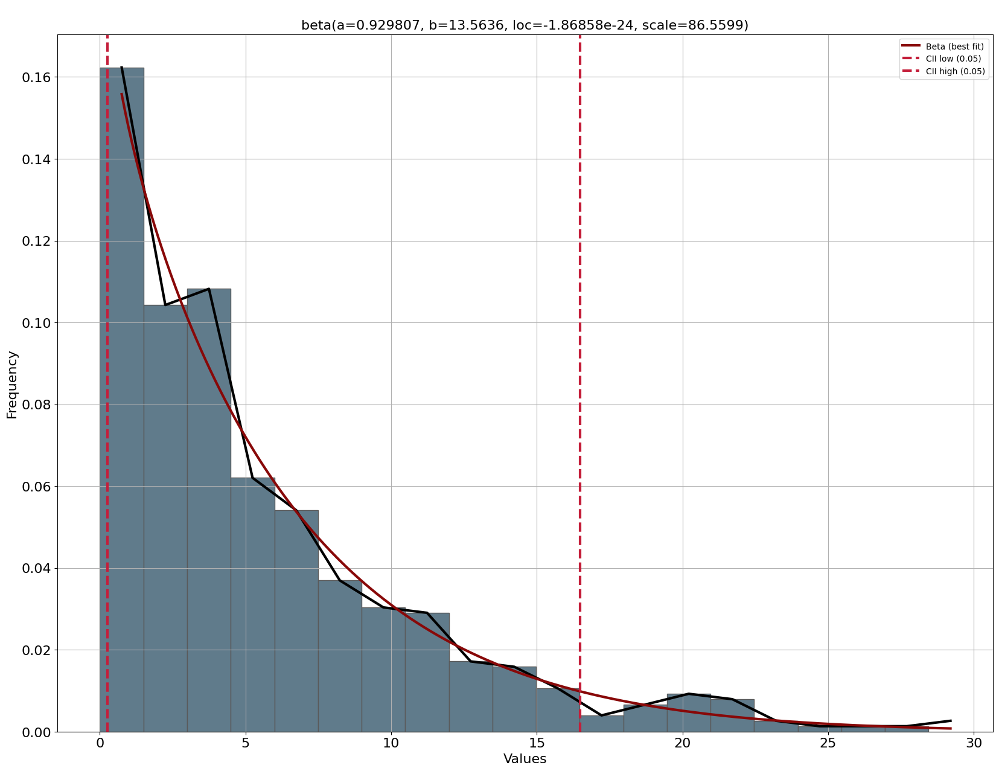

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==2)]
filtro=filtro[((filtro['Llegadadia_sem']==5)|(filtro['Llegadadia_sem']==6))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T2_S56.xlsx")
dfit.plot()

turno 1, semana 3 y 4

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00461857] [loc=9.124 scale=8.391]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000244954] [loc=0.017 scale=9.107]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000244954] [loc=-268435455.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.00350025] [loc=7.599 scale=6.532]
[distfit] >INFO> [t         ] [0.42 sec] [RSS: 0.00337488] [loc=7.236 scale=5.705]
[distfit] >INFO> [genextreme] [0.20 sec] [RSS: 0.00097035] [loc=4.538 scale=4.436]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.000219653] [loc=0.015 scale=8.886]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000537497] [loc=-0.980 scale=7.135]
[distfit] >INFO> [beta      ] [0.22 sec] [RSS: 0.000164156] [loc=0.017 scale=66.213]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0107422] [loc=0.017 scale=42.367]
[distfit] >INFO> [loggamma  ] [0.18 sec] [RSS: 0.00476313] [loc=-2633.386 scale=356.515]
[distfit]

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=0.907599, b=5.83995, loc=0.0166667, scale=66.2127)'}, xlabel='Values', ylabel='Frequency'>)

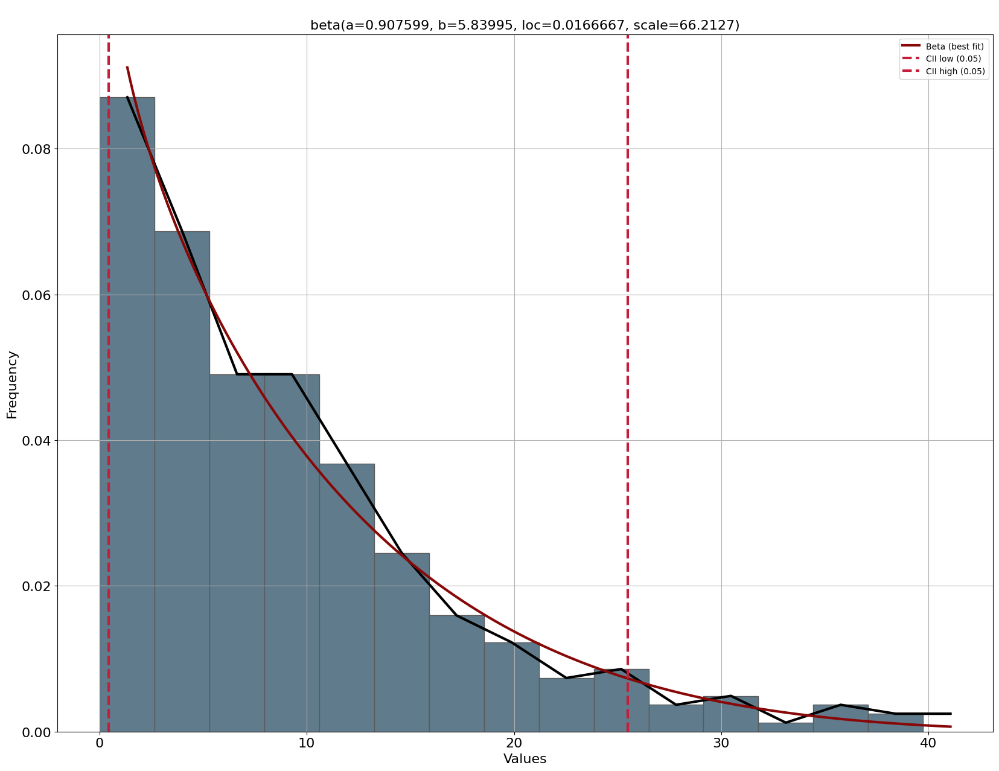

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
filtro=filtro[((filtro['Llegadadia_sem']==3)|(filtro['Llegadadia_sem']==4))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S34.xlsx")
dfit.plot()

turno 1, semana 5 y 6

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0352681] [loc=4.405 scale=4.364]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000561157] [loc=0.000 scale=4.405]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000561157] [loc=-67108864.000 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.01 sec] [RSS: 0.0255854] [loc=3.165 scale=3.171]
[distfit] >INFO> [t         ] [0.17 sec] [RSS: 0.0238521] [loc=3.099 scale=2.610]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.00541342] [loc=1.959 scale=2.011]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.000480535] [loc=-0.000 scale=4.366]
[distfit] >INFO> [lognorm   ] [0.06 sec] [RSS: 0.100196] [loc=-0.000 scale=0.003]
[distfit] >INFO> [beta      ] [0.10 sec] [RSS: 0.000445128] [loc=-0.000 scale=1791.769]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0747843] [loc=0.000 scale=29.000]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.03578] [loc=-955.601 scale=139.299]
[distfit] >INFO> 

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=0.883664, b=372.943, loc=-5.87415e-28, scale=1791.77)'}, xlabel='Values', ylabel='Frequency'>)

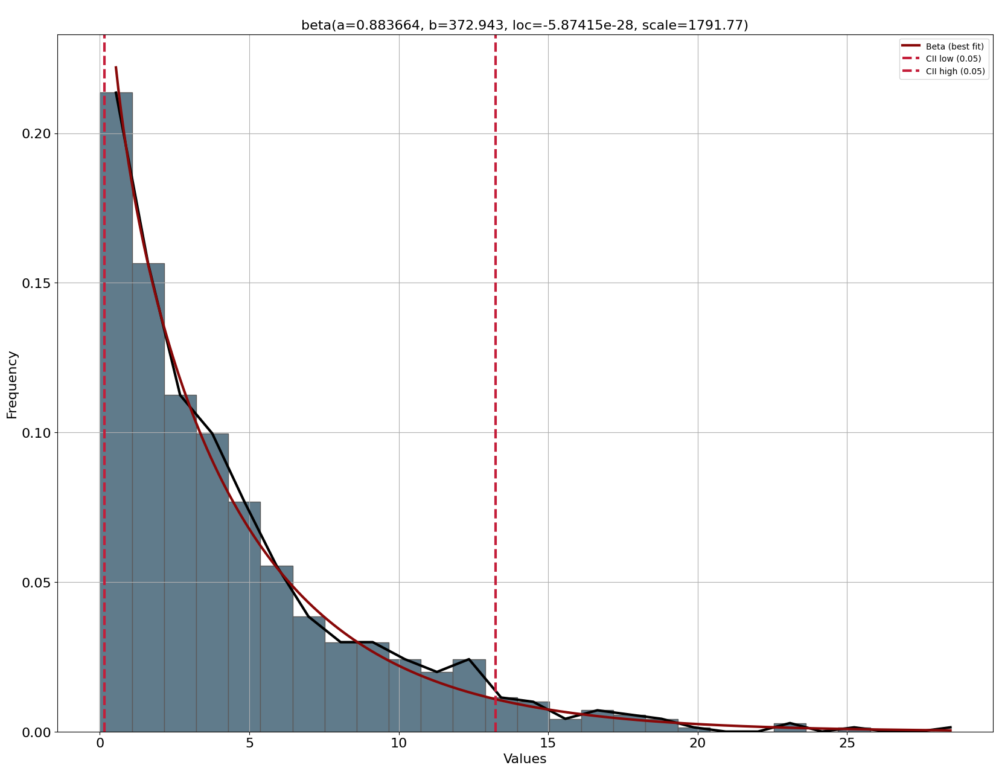

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
filtro=filtro[((filtro['Llegadadia_sem']==5)|(filtro['Llegadadia_sem']==6))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S56.xlsx")
dfit.plot()

Turno 1 semana 7

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00514402] [loc=8.327 scale=7.804]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000187309] [loc=0.017 scale=8.310]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000187309] [loc=-268435455.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.00410624] [loc=6.873 scale=5.860]
[distfit] >INFO> [t         ] [0.34 sec] [RSS: 0.00335786] [loc=6.240 scale=4.971]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 0.000457417] [loc=4.024 scale=3.868]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.000154823] [loc=0.010 scale=7.561]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000394805] [loc=-0.612 scale=6.120]
[distfit] >INFO> [beta      ] [0.19 sec] [RSS: 0.000156193] [loc=0.013 scale=219.215]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0119031] [loc=0.017 scale=46.567]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00524149] [loc=-3105.722 scale=398.768]
[distfi

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\ngamma(a=1.1, loc=0.0103068, scale=7.5605)'}, xlabel='Values', ylabel='Frequency'>)

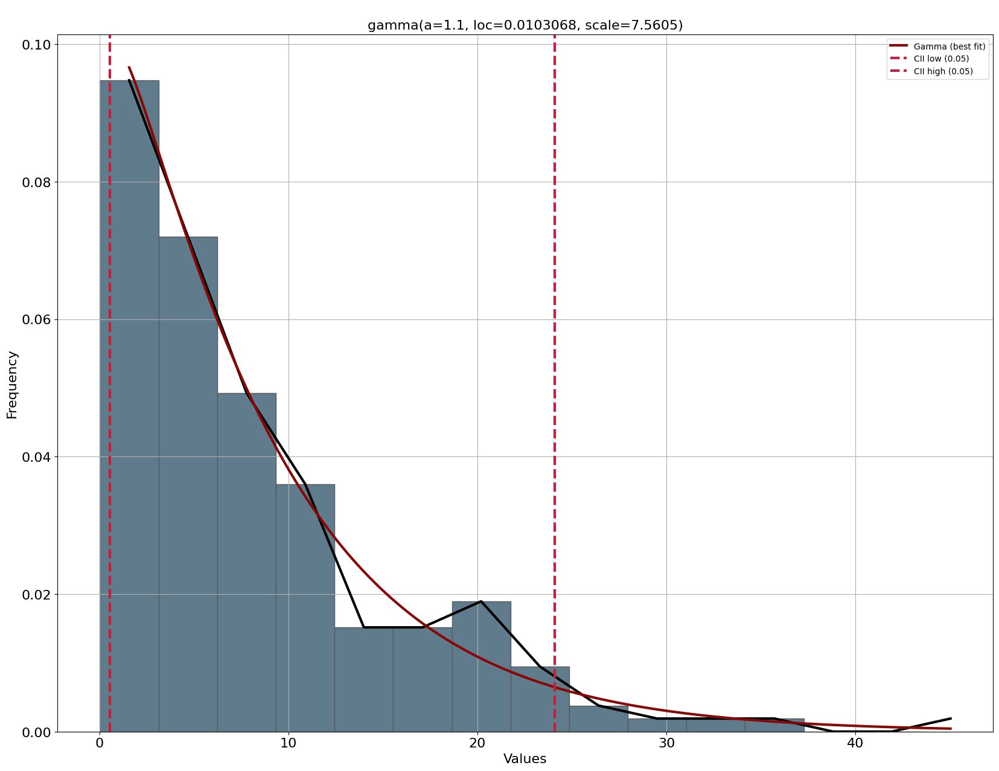

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==1)]
filtro=filtro[((filtro['Llegadadia_sem']==7))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S7.xlsx")
dfit.plot()

Turno 1, semana 1 y 2, h 0-1,3,1-4 y 5(EF-97 y EF-61)

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00426217] [loc=8.641 scale=8.489]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000135125] [loc=0.100 scale=8.541]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000135125] [loc=-134217727.900 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.00329236] [loc=6.693 scale=6.535]
[distfit] >INFO> [t         ] [0.36 sec] [RSS: 0.00339404] [loc=6.882 scale=6.002]
[distfit] >INFO> [genextreme] [0.18 sec] [RSS: 0.000462165] [loc=3.737 scale=3.967]
[distfit] >INFO> [gamma     ] [0.17 sec] [RSS: 0.000168942] [loc=0.100 scale=8.421]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000506787] [loc=-0.436 scale=5.664]
[distfit] >INFO> [beta      ] [0.26 sec] [RSS: 0.000147573] [loc=0.100 scale=507.109]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00967329] [loc=0.100 scale=50.583]
[distfit] >INFO> [loggamma  ] [0.16 sec] [RSS: 0.00433828] [loc=-2916.121 scale=386.579]
[distf

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=1.57149e+07, loc=-1.34218e+08, scale=1.34218e+08)'}, xlabel='Values', ylabel='Frequency'>)

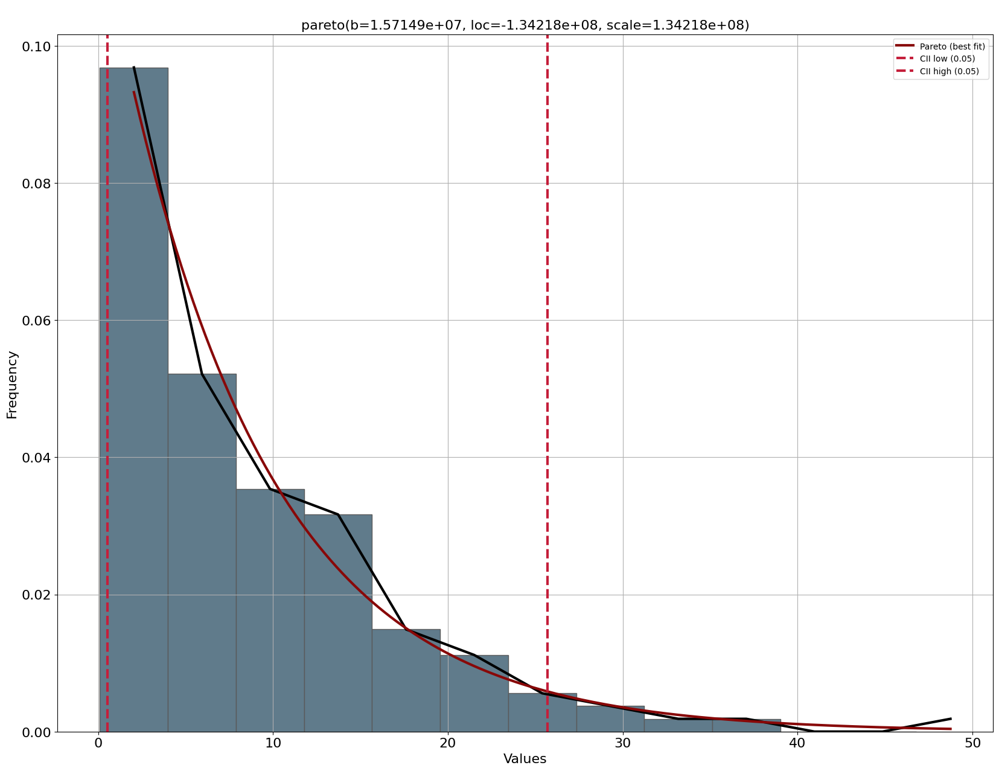

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 0) | (filtro['h_llegada'] == 1)]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h01.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00106565] [loc=13.016 scale=12.337]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00053996] [loc=0.350 scale=12.666]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00053996] [loc=-2147483647.650 scale=2147483648.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.00207731] [loc=11.100 scale=7.381]
[distfit] >INFO> [t         ] [0.20 sec] [RSS: 0.00128795] [loc=10.954 scale=6.294]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.000591175] [loc=7.783 scale=6.100]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.00325835] [loc=0.350 scale=1.763]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000514648] [loc=-2.558 scale=12.605]
[distfit] >INFO> [beta      ] [0.07 sec] [RSS: 0.00040704] [loc=0.092 scale=12474091.345]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00375834] [loc=0.350 scale=75.700]
[distfit] >INFO> [loggamma  ] [0.06 sec] [RSS: 0.00116072] [loc=-4430.278 scale=584.91

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=1.45871, b=1.40793e+06, loc=0.0917341, scale=1.24741e+07)'}, xlabel='Values', ylabel='Frequency'>)

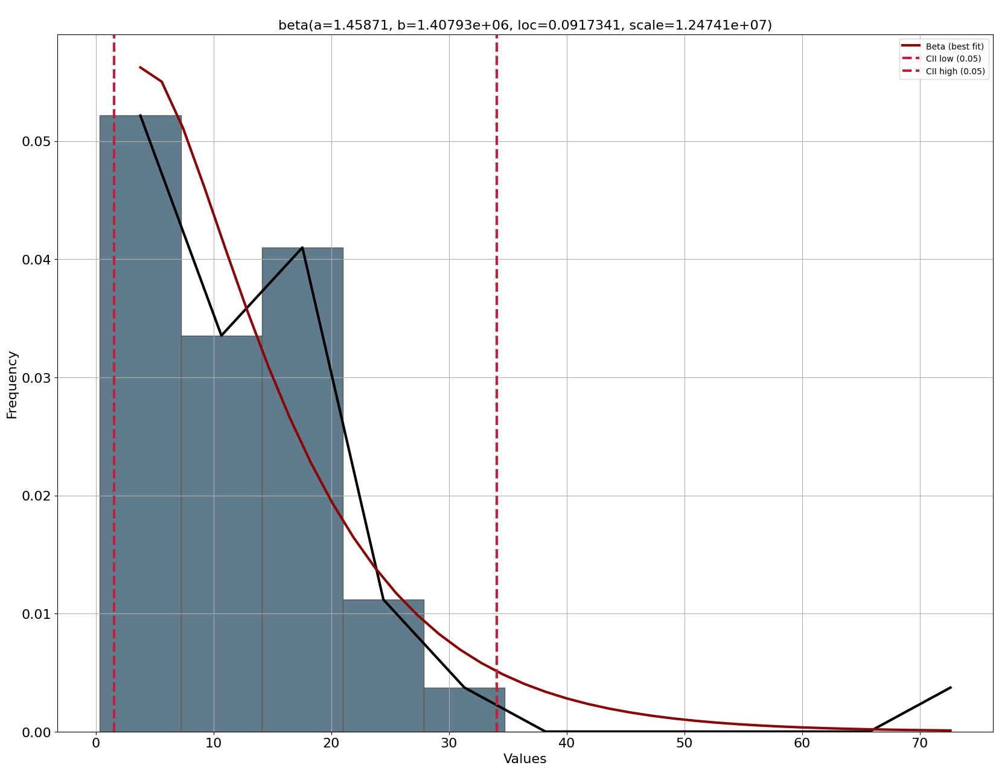

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 5)]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h5.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00202492] [loc=13.085 scale=13.424]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 7.78779e-05] [loc=0.133 scale=12.951]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 6.41739e-05] [loc=-296.192 scale=296.326]
[distfit] >INFO> [dweibull  ] [0.20 sec] [RSS: 0.002202] [loc=10.200 scale=9.251]
[distfit] >INFO> [t         ] [0.33 sec] [RSS: 0.000720255] [loc=8.024 scale=5.795]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 3.61006e-05] [loc=6.106 scale=5.938]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 8.76185e-05] [loc=0.133 scale=14.961]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 4.35101e-05] [loc=-1.281 scale=9.808]
[distfit] >INFO> [beta      ] [0.14 sec] [RSS: 0.000604848] [loc=0.133 scale=115.885]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00353942] [loc=0.133 scale=62.717]
[distfit] >INFO> [loggamma  ] [0.11 sec] [RSS: 0.00202691] [loc=-4284.960 scale=575.201]
[distfit] >INF

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\ngenextreme(c=-0.44686, loc=6.10564, scale=5.93841)'}, xlabel='Values', ylabel='Frequency'>)

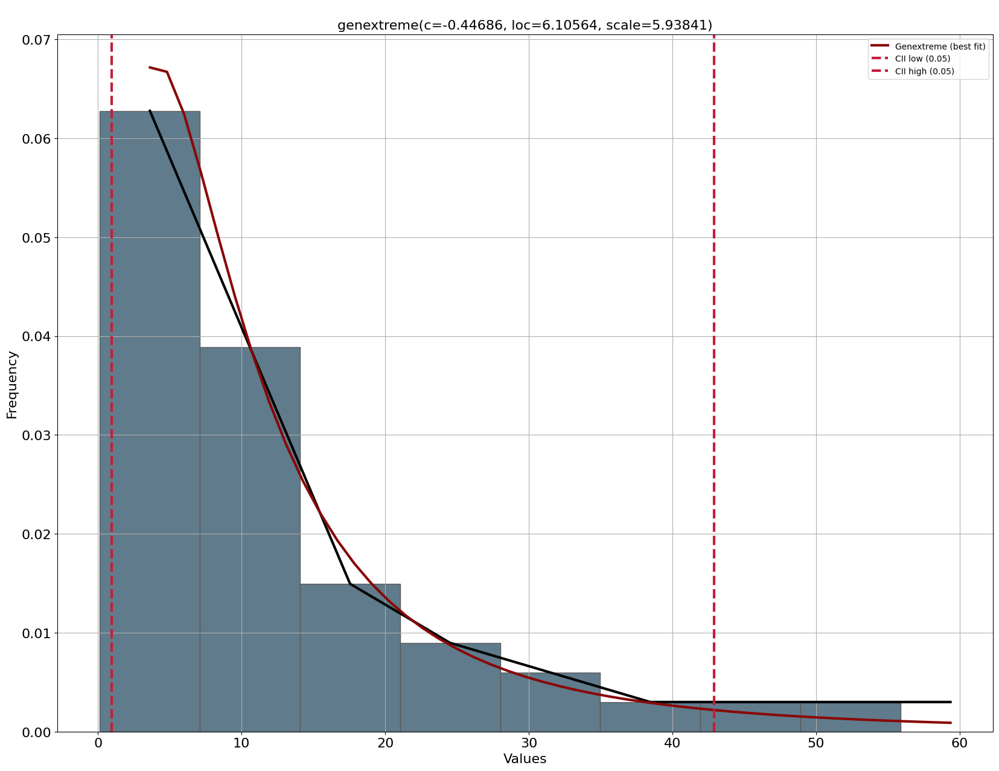

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 3)]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h3.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00113129] [loc=12.949 scale=10.678]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0009075] [loc=0.383 scale=12.566]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000907501] [loc=-1073741823.617 scale=1073741824.000]
[distfit] >INFO> [dweibull  ] [0.04 sec] [RSS: 0.000794728] [loc=11.694 scale=7.589]
[distfit] >INFO> [t         ] [0.70 sec] [RSS: 0.000719901] [loc=11.066 scale=6.618]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.000283783] [loc=8.008 scale=6.413]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.0163176] [loc=0.383 scale=1.965]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000228505] [loc=-3.449 scale=13.744]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.000203611] [loc=0.221 scale=103.144]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00546576] [loc=0.383 scale=69.600]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.00122141] [loc=-3500.288 scale=468.300]


(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nbeta(a=1.34223, b=9.35353, loc=0.220821, scale=103.144)'}, xlabel='Values', ylabel='Frequency'>)

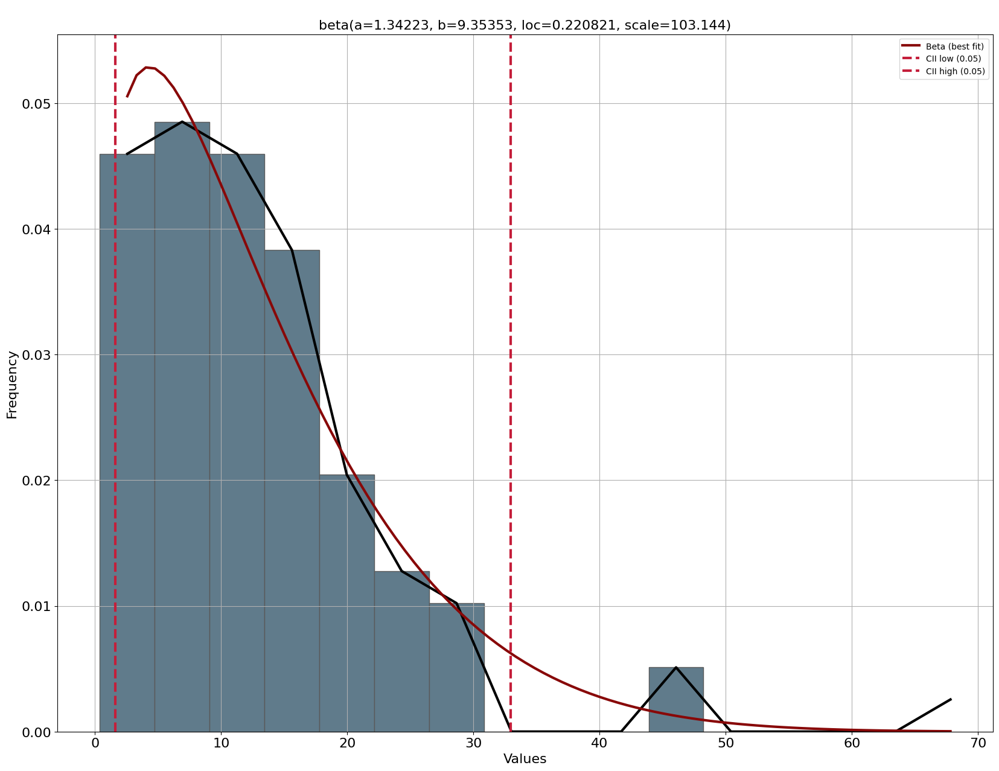

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 2) | (filtro['h_llegada'] == 4)]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h24.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00278931] [loc=16.368 scale=15.005]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00182773] [loc=2.050 scale=14.318]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00188202] [loc=-523.241 scale=525.291]
[distfit] >INFO> [dweibull  ] [0.05 sec] [RSS: 0.00208987] [loc=13.250 scale=7.040]
[distfit] >INFO> [t         ] [0.23 sec] [RSS: 0.0026784] [loc=13.898 scale=4.378]
[distfit] >INFO> [genextreme] [0.17 sec] [RSS: 0.0012612] [loc=10.538 scale=6.623]
[distfit] >INFO> [gamma     ] [0.10 sec] [RSS: 0.00556871] [loc=2.050 scale=6.955]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0011685] [loc=-1.670 scale=14.733]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.00125673] [loc=1.565 scale=240230994764.571]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00579714] [loc=2.050 scale=74.000]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00301883] [loc=-4028.311 scale=567.227]
[distfit] >

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.603592, loc=-1.67011, scale=14.7326)'}, xlabel='Values', ylabel='Frequency'>)

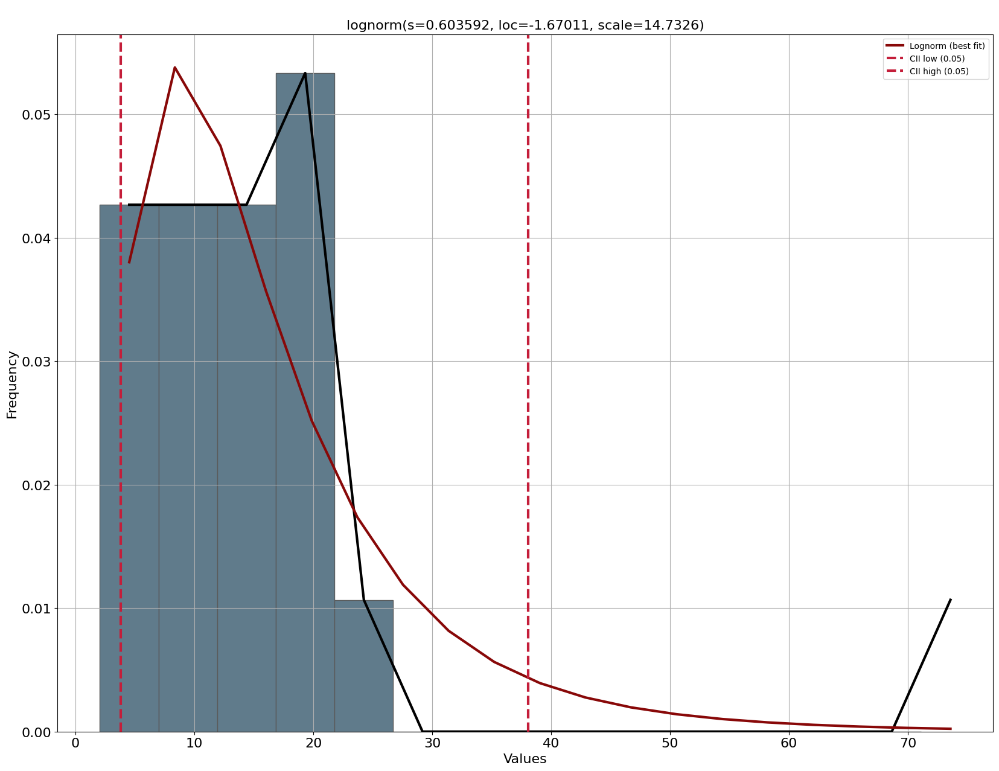

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 5)]
filtro = filtro[(filtro['Atiende'] == "EF-97")]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h5_EF97.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00337437] [loc=9.831 scale=7.880]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000377384] [loc=0.350 scale=9.481]
[distfit] >INFO> [pareto    ] [0.02 sec] [RSS: 0.00930115] [loc=0.350 scale=0.000]
[distfit] >INFO> [dweibull  ] [0.05 sec] [RSS: 0.00220514] [loc=7.790 scale=6.129]
[distfit] >INFO> [t         ] [0.57 sec] [RSS: 0.00271143] [loc=8.620 scale=6.545]
[distfit] >INFO> [genextreme] [0.12 sec] [RSS: 0.00042515] [loc=5.634 scale=4.819]
[distfit] >INFO> [gamma     ] [0.24 sec] [RSS: 0.0009401] [loc=0.350 scale=17.155]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000341087] [loc=-1.887 scale=9.346]
[distfit] >INFO> [beta      ] [0.18 sec] [RSS: 0.000633547] [loc=0.350 scale=38.677]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00428085] [loc=0.350 scale=30.183]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00338266] [loc=-3085.099 scale=397.933]
[distfit] >INFO> [norm     

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.691678, loc=-1.88665, scale=9.34557)'}, xlabel='Values', ylabel='Frequency'>)

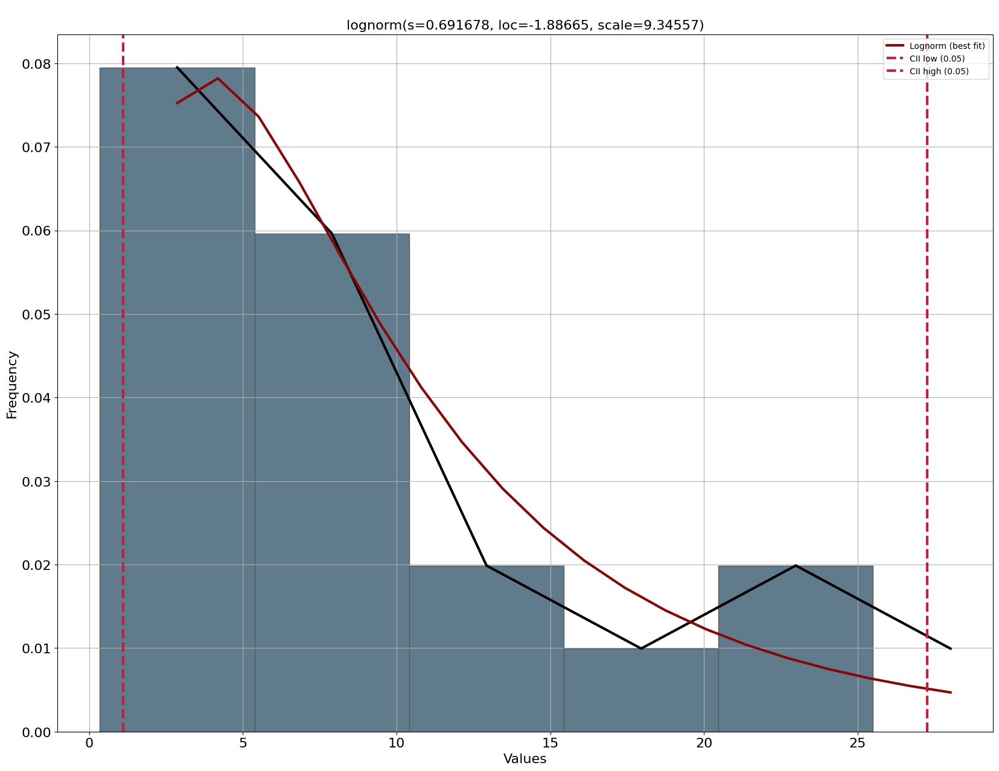

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 1]
filtro = filtro[(filtro['Llegadadia_sem'] == 1) | (filtro['Llegadadia_sem'] == 2)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[(filtro['h_llegada'] == 5)]
filtro = filtro[(filtro['Atiende'] == "EF-61")]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T1_S12_h5_EF61.xlsx")
dfit.plot()

Para el turno 3, semana 1,3 y 7

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0205082] [loc=5.478 scale=5.399]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000332988] [loc=0.017 scale=5.462]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000332988] [loc=-67108863.983 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.04 sec] [RSS: 0.0160369] [loc=4.177 scale=3.942]
[distfit] >INFO> [t         ] [0.43 sec] [RSS: 0.0150776] [loc=4.105 scale=3.419]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.00305387] [loc=2.517 scale=2.575]
[distfit] >INFO> [gamma     ] [0.09 sec] [RSS: 0.000536123] [loc=0.017 scale=5.444]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00120837] [loc=-0.433 scale=3.915]
[distfit] >INFO> [beta      ] [0.31 sec] [RSS: 0.000455619] [loc=0.016 scale=27079460517933.719]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0517164] [loc=0.017 scale=45.217]
[distfit] >INFO> [loggamma  ] [0.17 sec] [RSS: 0.0206944] [loc=-1744.901 scale=233.246]
[dis

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=1.22874e+07, loc=-6.71089e+07, scale=6.71089e+07)'}, xlabel='Values', ylabel='Frequency'>)

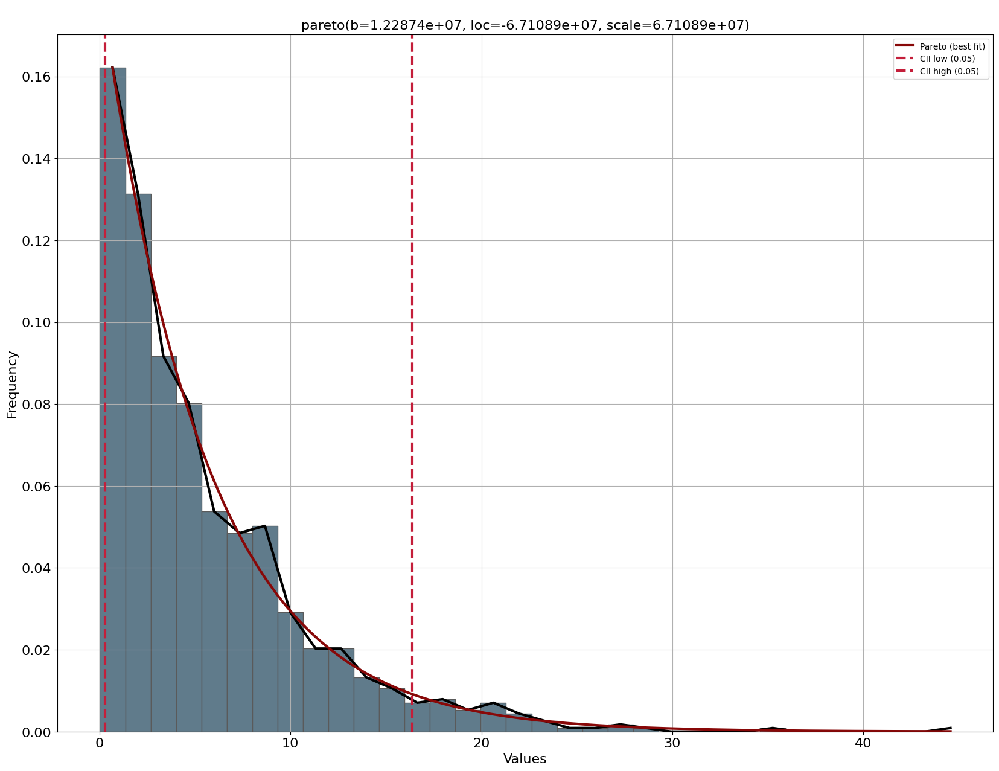

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==3)]
filtro=filtro[((filtro['Llegadadia_sem']==1)|(filtro['Llegadadia_sem']==3)|(filtro['Llegadadia_sem']==7))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T3_S137.xlsx")
dfit.plot()

Turno 3, sem 4 y 5

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0342401] [loc=4.240 scale=4.300]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.000234298] [loc=0.000 scale=4.240]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.000234154] [loc=-291.001 scale=291.001]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.0240894] [loc=3.063 scale=3.038]
[distfit] >INFO> [t         ] [0.25 sec] [RSS: 0.022457] [loc=3.016 scale=2.509]
[distfit] >INFO> [genextreme] [0.14 sec] [RSS: 0.00445316] [loc=1.896 scale=1.945]
[distfit] >INFO> [gamma     ] [0.14 sec] [RSS: 0.000245556] [loc=-0.000 scale=4.170]
[distfit] >INFO> [lognorm   ] [0.06 sec] [RSS: 0.00192318] [loc=-0.286 scale=2.931]
[distfit] >INFO> [beta      ] [0.23 sec] [RSS: 0.000254169] [loc=-0.000 scale=196.081]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0830233] [loc=0.000 scale=32.500]
[distfit] >INFO> [loggamma  ] [0.13 sec] [RSS: 0.0355575] [loc=-1190.147 scale=164.545]
[distfit] >INFO> [norm  

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\npareto(b=69.6273, loc=-291.001, scale=291.001)'}, xlabel='Values', ylabel='Frequency'>)

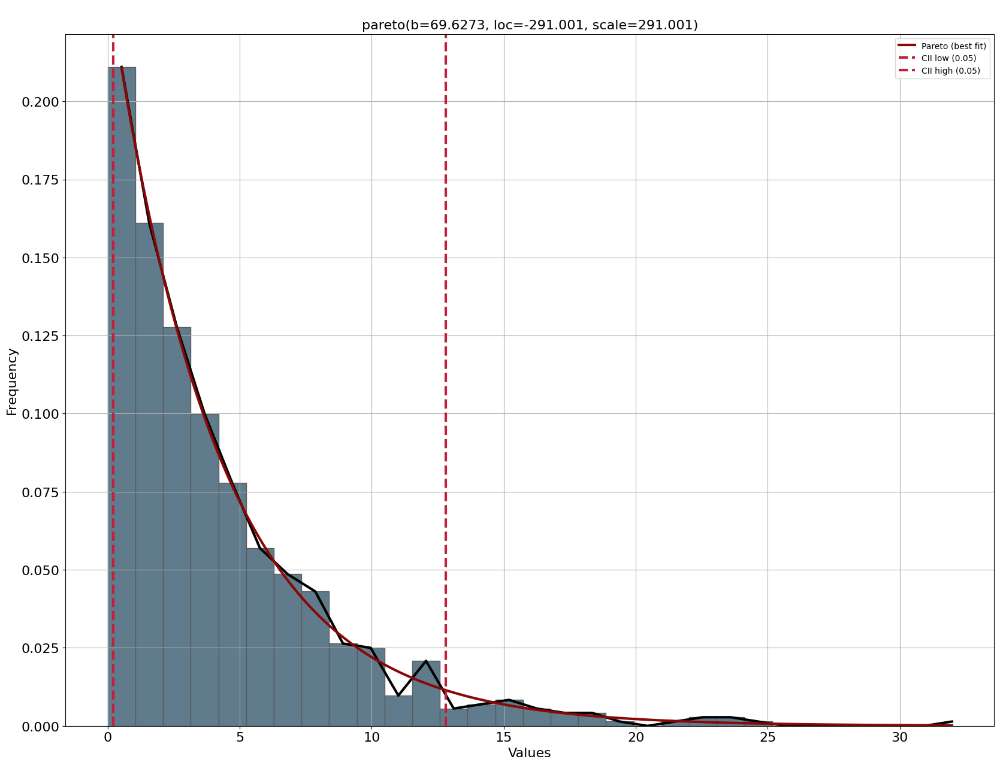

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==3)]
filtro=filtro[((filtro['Llegadadia_sem']==4)|(filtro['Llegadadia_sem']==5))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T3_S45.xlsx")
dfit.plot()

Turno 3, semana 2.

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0124335] [loc=6.709 scale=6.822]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00056357] [loc=0.117 scale=6.593]
[distfit] >INFO> [pareto    ] [0.01 sec] [RSS: 0.000575653] [loc=-194.875 scale=194.992]
[distfit] >INFO> [dweibull  ] [0.10 sec] [RSS: 0.00650477] [loc=4.083 scale=4.346]
[distfit] >INFO> [t         ] [0.40 sec] [RSS: 0.00660014] [loc=4.400 scale=3.347]
[distfit] >INFO> [genextreme] [0.15 sec] [RSS: 0.000555382] [loc=3.126 scale=2.909]
[distfit] >INFO> [gamma     ] [0.34 sec] [RSS: 0.0006341] [loc=0.117 scale=6.951]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000340056] [loc=-0.357 scale=4.712]
[distfit] >INFO> [beta      ] [0.37 sec] [RSS: 0.000669129] [loc=0.117 scale=753.909]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.027303] [loc=0.117 scale=44.200]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.0127702] [loc=-2048.111 scale=280.087]
[distfit] >INFO> [norm   

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.931284, loc=-0.357239, scale=4.71247)'}, xlabel='Values', ylabel='Frequency'>)

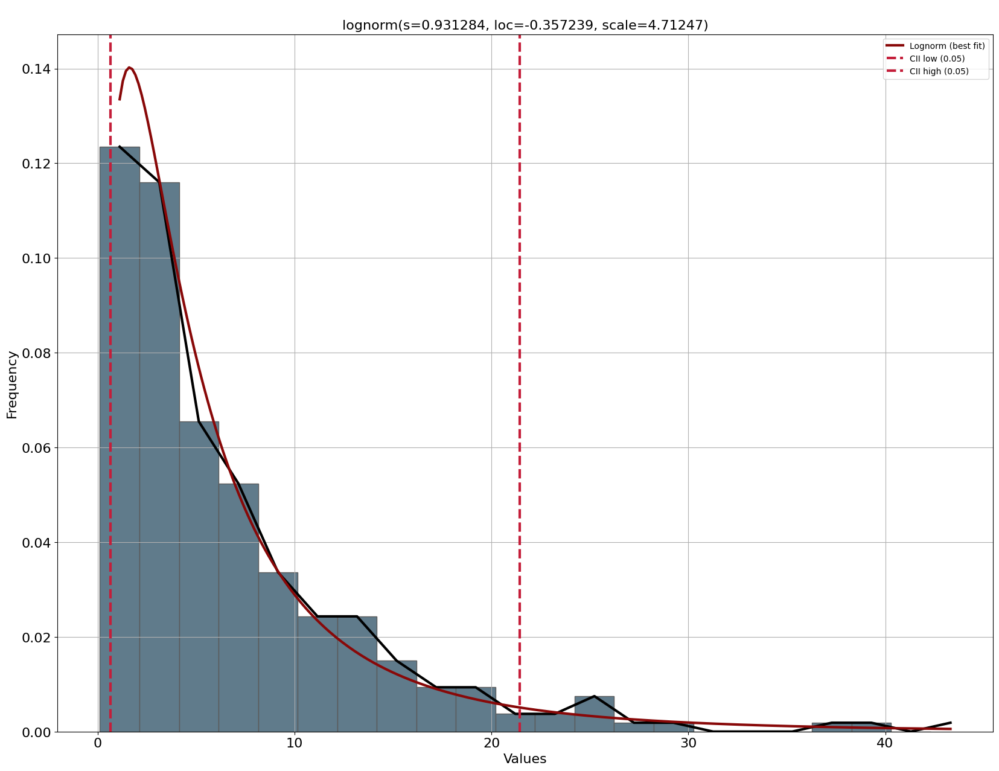

In [ ]:
filtro=base[(base['Ini-Triaggeturno_6h']==3)]
filtro=filtro[((filtro['Llegadadia_sem']==2))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T3_S2.xlsx")
dfit.plot()

Turno 3, semana 2, ef-27 y ef-33

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00648796] [loc=7.120 scale=6.162]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0013457] [loc=0.117 scale=7.004]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.0013457] [loc=-257250645.217 scale=257250645.333]
[distfit] >INFO> [dweibull  ] [0.01 sec] [RSS: 0.00434213] [loc=5.794 scale=4.882]
[distfit] >INFO> [t         ] [0.14 sec] [RSS: 0.00407926] [loc=5.544 scale=4.184]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.000403483] [loc=3.727 scale=3.218]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.000747217] [loc=0.089 scale=5.508]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000580666] [loc=-0.569 scale=5.615]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.00117265] [loc=0.117 scale=40.189]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0133257] [loc=0.117 scale=29.583]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.00651051] [loc=-2229.849 scale=291.743]
[distfit] >IN

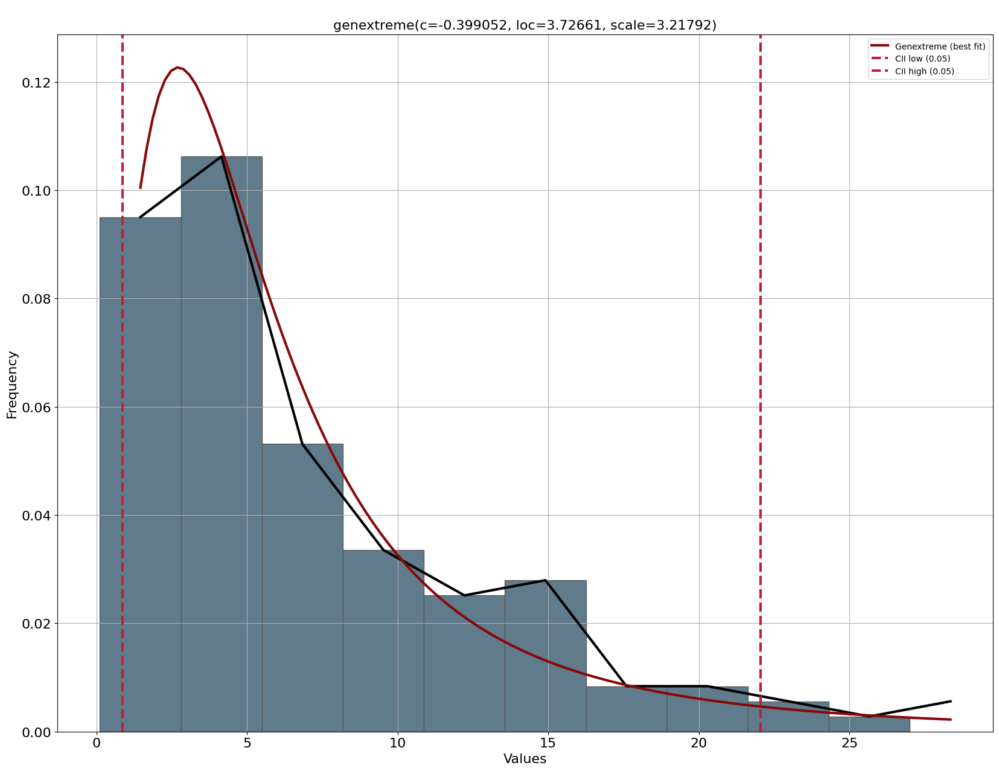

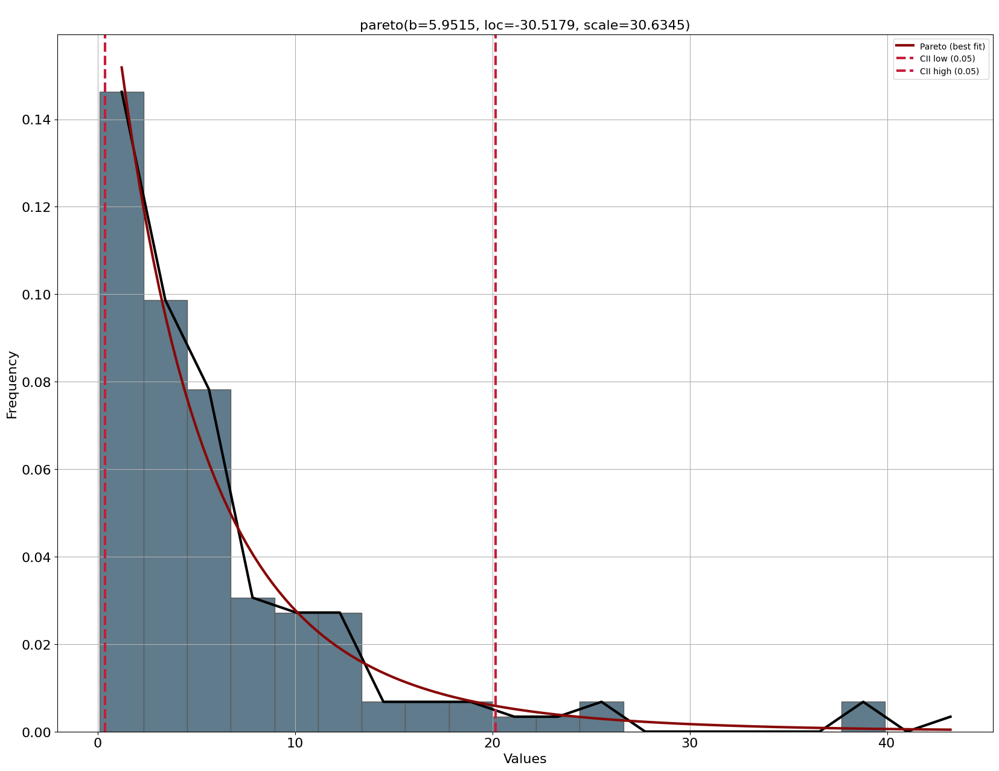

In [ ]:
for i in [27,33]:
  filtro=base[(base['Ini-Triaggeturno_6h']==3)]
  filtro=filtro[((filtro['Llegadadia_sem']==2))]
  filtro=filtro[((filtro['Atiende']=="EF-"+str(i)))]
  dfit = distfit()
  results2 = dfit.fit_transform(filtro['LlegadaTA'])
  results2['summary'].to_excel("T3_S2_EF"+str(i)+".xlsx")
  dfit.plot()

Turno 3, semana 6, h12, h14, h16, h17

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0086364] [loc=8.320 scale=8.784]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00188107] [loc=0.517 scale=7.803]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00117768] [loc=-23.380 scale=23.897]
[distfit] >INFO> [dweibull  ] [0.05 sec] [RSS: 0.00632828] [loc=5.267 scale=8.235]
[distfit] >INFO> [t         ] [0.19 sec] [RSS: 0.00122418] [loc=4.102 scale=2.856]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.000793154] [loc=3.120 scale=3.033]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 0.00108782] [loc=0.517 scale=6.818]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000804074] [loc=0.262 scale=4.296]
[distfit] >INFO> [beta      ] [0.09 sec] [RSS: 0.00468405] [loc=0.517 scale=29.615]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.00955113] [loc=0.517 scale=29.550]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.00871071] [loc=-2675.973 scale=363.853]
[distfit] >INFO> [norm     

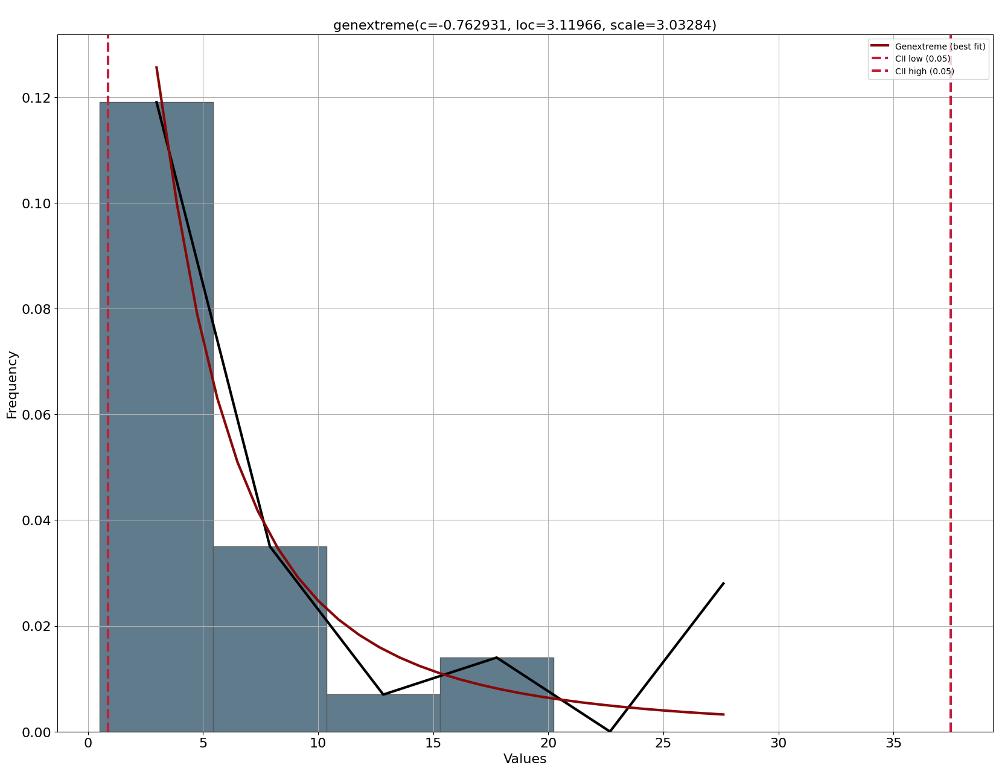

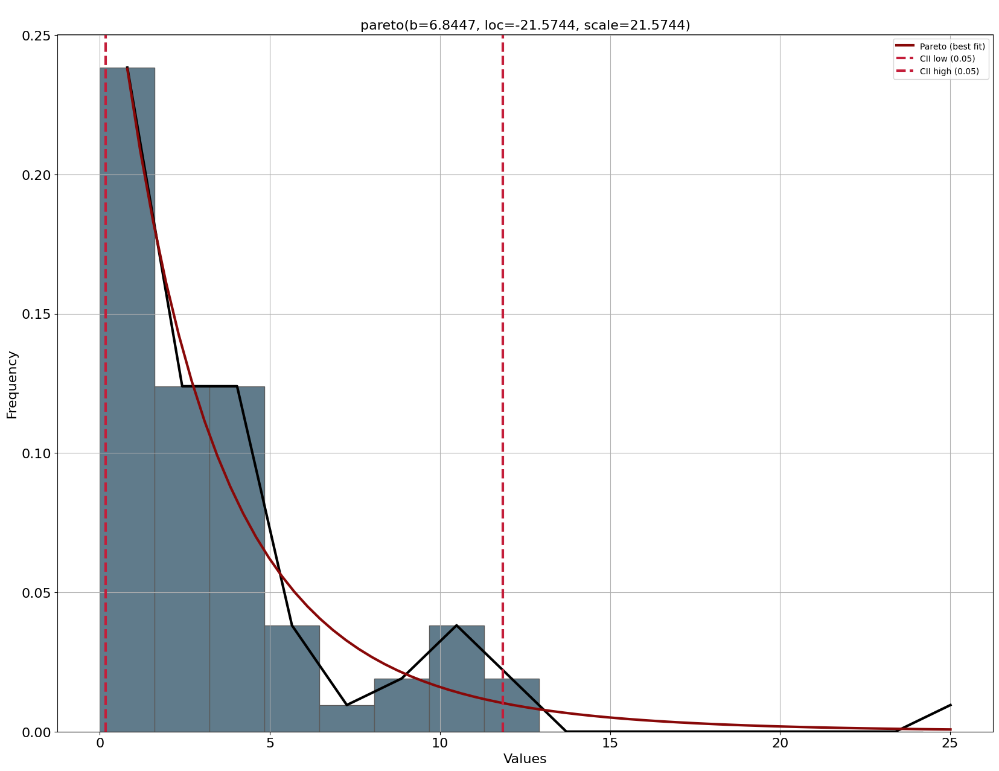

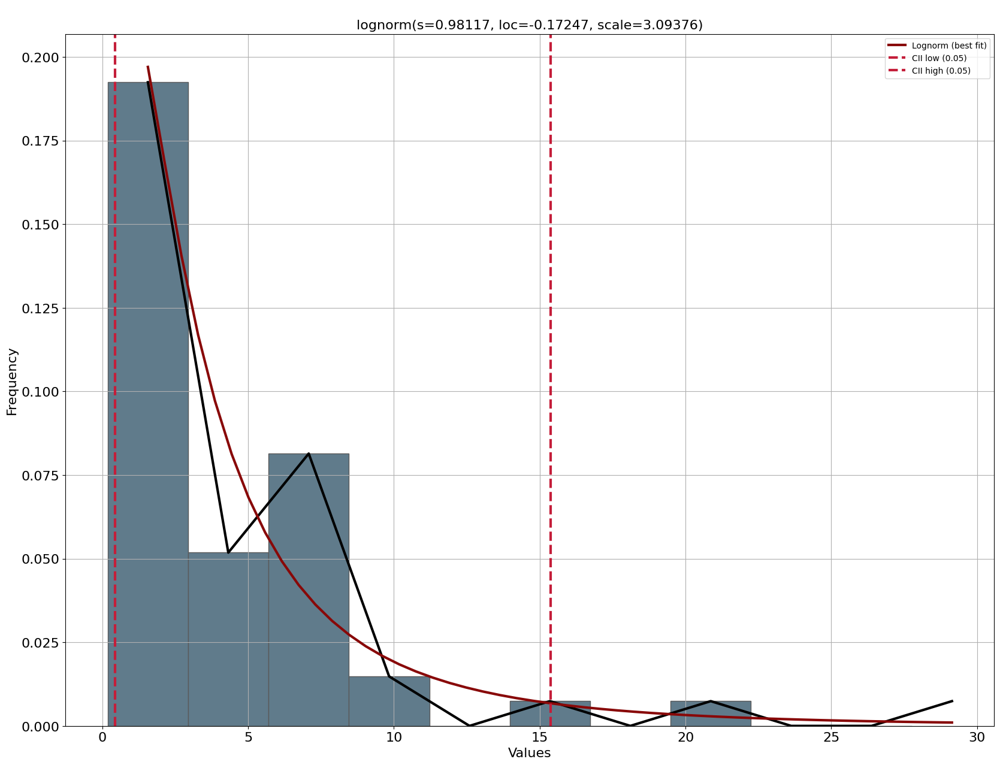

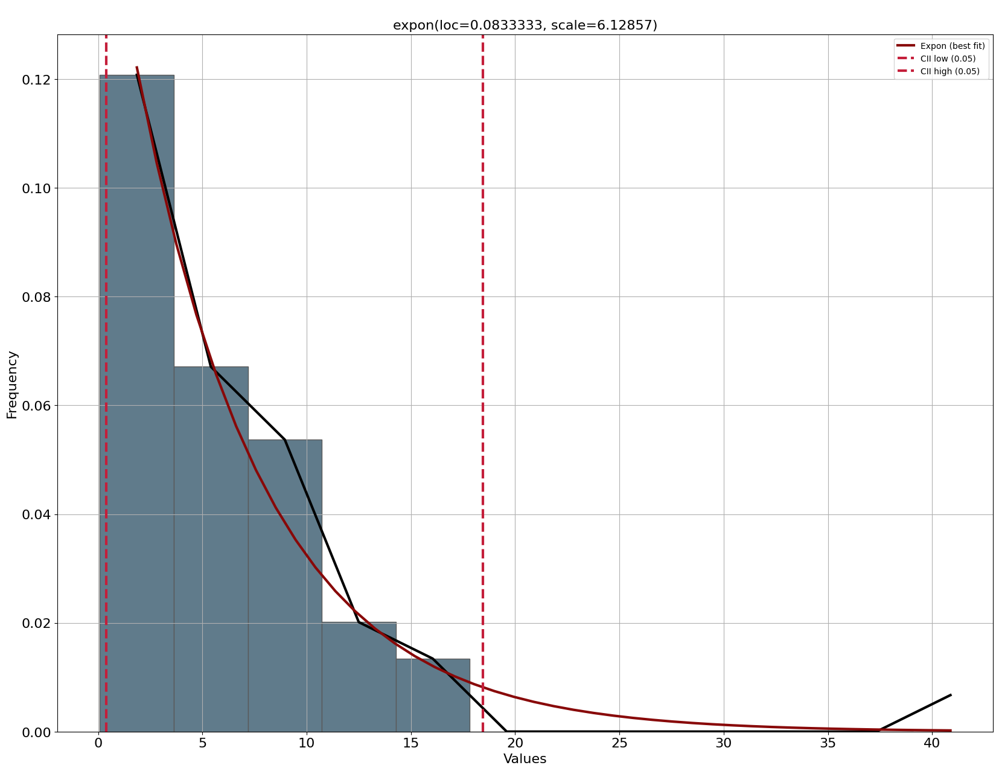

In [ ]:
for i in [12,14,16,17]:
  filtro = base[base['Ini-Triaggeturno_6h'] == 3]
  filtro = filtro[(filtro['Llegadadia_sem'] == 6)]
  filtro['h_llegada']=filtro['h_llegada'].astype(int)
  filtro = filtro[(filtro['h_llegada'] == i)]
  dfit = distfit()
  results2 = dfit.fit_transform(filtro['LlegadaTA'])
  results2['summary'].to_excel("T3_S6_h"+str(i)+".xlsx")
  dfit.plot()

Turno 3, semana 6, horas 13-15

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.0242382] [loc=4.714 scale=5.686]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00229265] [loc=0.050 scale=4.664]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00303902] [loc=-31.396 scale=31.446]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.0122288] [loc=2.817 scale=2.951]
[distfit] >INFO> [t         ] [0.10 sec] [RSS: 0.0085021] [loc=2.999 scale=2.068]
[distfit] >INFO> [genextreme] [0.09 sec] [RSS: 0.00267611] [loc=2.096 scale=1.975]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.059056] [loc=0.050 scale=1.406]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00387729] [loc=-0.164 scale=3.069]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.00290133] [loc=0.050 scale=781.995]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0538429] [loc=0.050 scale=43.633]
[distfit] >INFO> [loggamma  ] [0.04 sec] [RSS: 0.0260201] [loc=-2286.950 scale=296.558]
[distfit] >INFO> [norm      ] [0.

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nexpon(loc=0.05, scale=4.66368)'}, xlabel='Values', ylabel='Frequency'>)

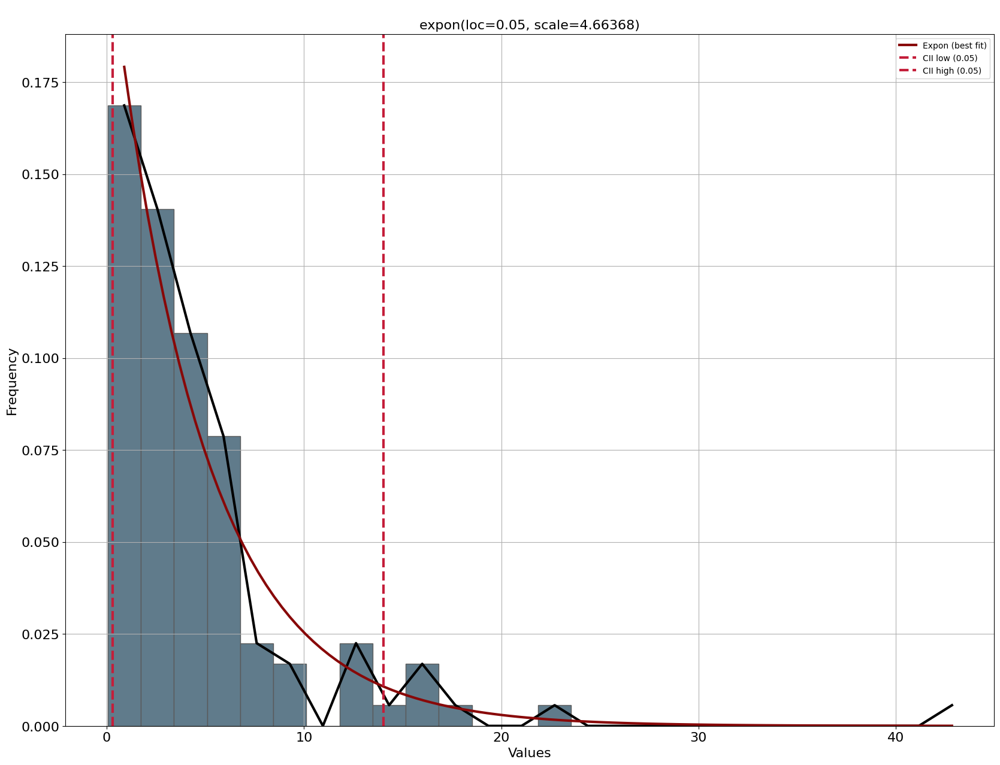

In [ ]:
filtro = base[base['Ini-Triaggeturno_6h'] == 3]
filtro = filtro[(filtro['Llegadadia_sem'] == 6)]
filtro['h_llegada']=filtro['h_llegada'].astype(int)
filtro = filtro[((filtro['h_llegada'] == 13)|(filtro['h_llegada'] == 15))]
dfit = distfit()
results2 = dfit.fit_transform(filtro['LlegadaTA'])
results2['summary'].to_excel("T3_S6_h1315.xlsx")
dfit.plot()

#Tiempos de servicio



In [ ]:
cosas=['-Triagge', '-Consulta', '-Serv.', '-RevFinal', '-Post']
evalua=[{"Atiende","Llegadadia_sem","Ini-Triaggeturno_6h"},{"Atiende.1","Ini-Consultaturno_6h","Ini-Consultadia_sem"},
        {"Servicio","Ini-Serv.hora_e","Ini-Serv.dia_sem"},{"Atiende.2","turno_8h","Ini-RevFinaldia_sem"},
         {"Lugar","Ini-Posthora_e","Ini-Postdia_sem"}]

In [ ]:
base['Ini-Serv.hora_e']=base['Ini-Serv.hora'].dt.strftime('%H:%M:%S').str.split(':').str[0]
base['Ini-Posthora_e']=base['Ini-Posthora'].dt.strftime('%H:%M:%S').str.split(':').str[0]

%%%%%%%%%%%%%%%%%%
Para la Ini-Triaggeturno_6h de [1, 2, 3, 4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   1.745227  0.972588           True
Kruskal       h_llegada     23  15.632024  0.870563           True
Kruskal  Llegadadia_sem      6   1.018138  0.984915           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


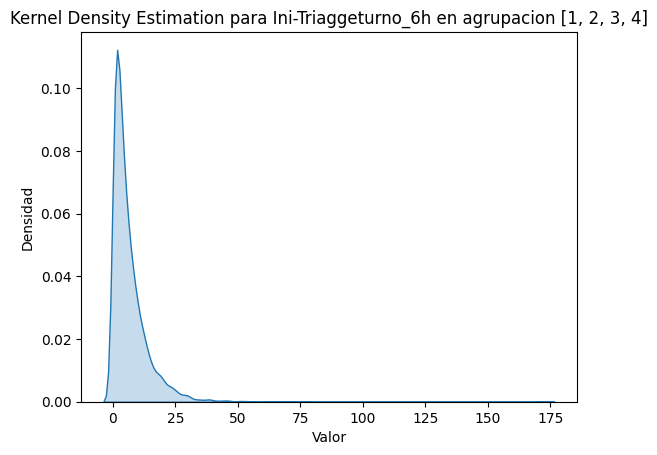

%%%%%%%%%%%%%%%%%%
Para la Atiende de ['EF-97', 'EF-61', 'EF-48', 'EF-55', 'EF-33', 'EF-27', 'EF-63', 'EF-40'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   1.745227  0.972588           True
Kruskal       h_llegada     23  15.632024  0.870563           True
Kruskal  Llegadadia_sem      6   1.018138  0.984915           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


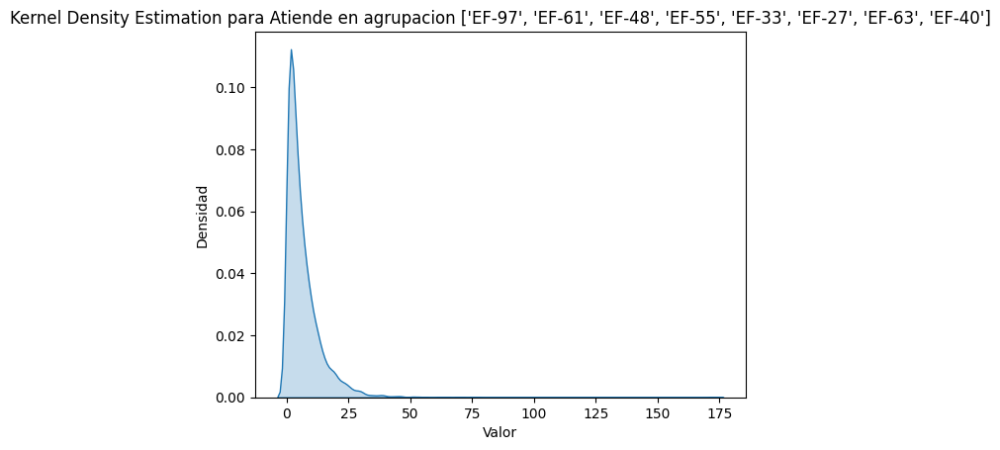

%%%%%%%%%%%%%%%%%%
Para la Llegadadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   1.745227  0.972588           True
Kruskal       h_llegada     23  15.632024  0.870563           True
Kruskal  Llegadadia_sem      6   1.018138  0.984915           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


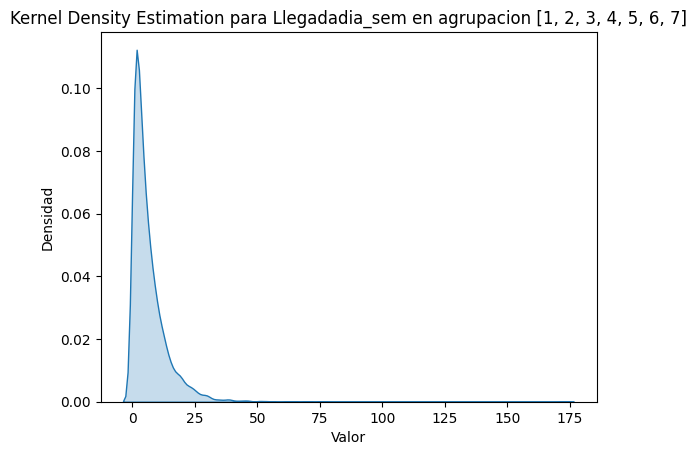

%%%%%%%%%%%%%%%%%%
Para la Ini-Consultaturno_6h de [1, 2, 3, 4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   5.847711  0.557640           True
Kruskal       h_llegada     23  32.839860  0.083898           True
Kruskal  Llegadadia_sem      6  13.594086  0.034514          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


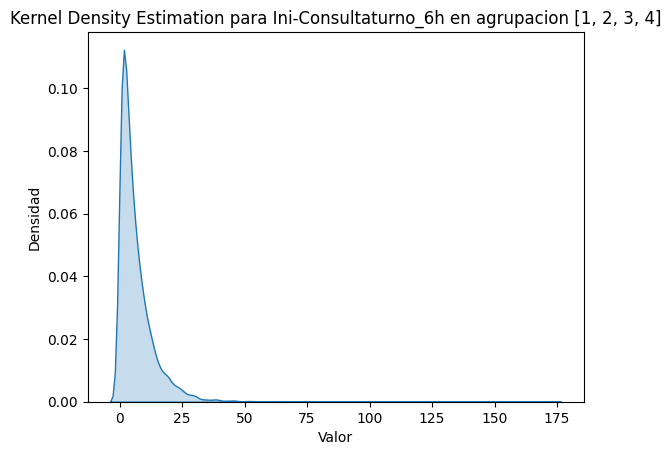

%%%%%%%%%%%%%%%%%%
Para la Atiende.1 de ['MG-17', 'MG-83', 'MG-44', 'MG-45', 'MG-29', 'MG-71', 'MG-67', 'MG-51', 'MG-09', 'MG-82', 'MGF-53', 'MG-49'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   5.847711  0.557640           True
Kruskal       h_llegada     23  32.839860  0.083898           True
Kruskal  Llegadadia_sem      6  13.594086  0.034514          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


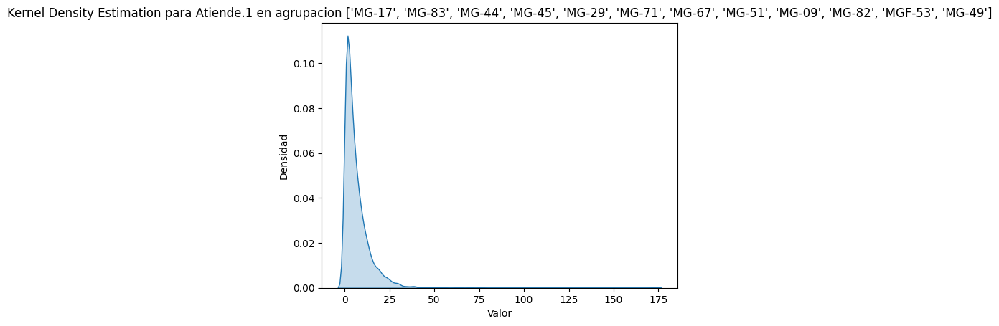

%%%%%%%%%%%%%%%%%%
Para la Ini-Consultadia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   5.847711  0.557640           True
Kruskal       h_llegada     23  32.839860  0.083898           True
Kruskal  Llegadadia_sem      6  13.594086  0.034514          False
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


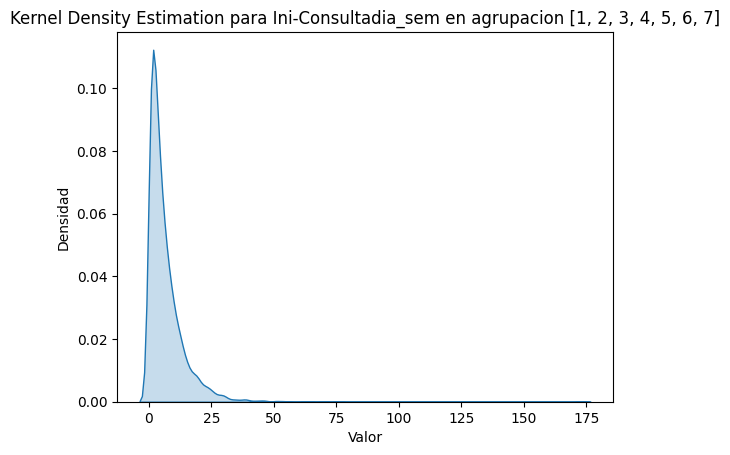

%%%%%%%%%%%%%%%%%%
Para la Ini-Serv.dia_sem de [1, 2, 3, 4, 5, 6, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   2.946503  0.889907           True
Kruskal       h_llegada     23  13.408377  0.942571           True
Kruskal  Llegadadia_sem      6   5.070494  0.534804           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


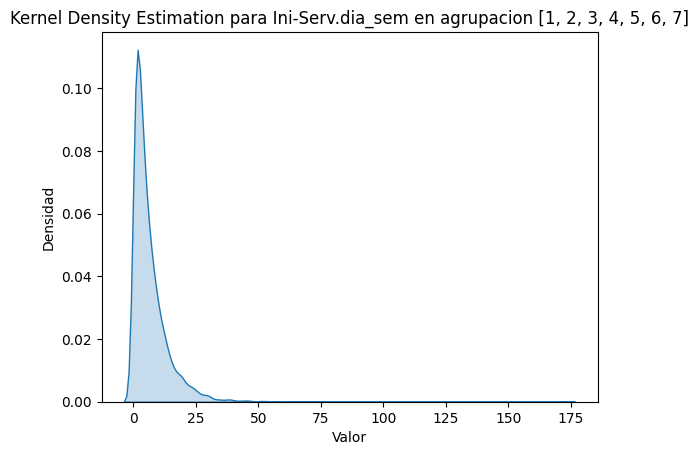

%%%%%%%%%%%%%%%%%%
Para la Servicio de ['Sala Cirugua', 'Neumologo', 'Sala Observacion', 'Imágenes Diagnósticas', 'Ginecologo', 'Neurologo', 'Cardiologo', 'Nefrologo', 'Otorrino', 'Otros'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   2.946503  0.889907           True
Kruskal       h_llegada     23  13.408377  0.942571           True
Kruskal  Llegadadia_sem      6   5.070494  0.534804           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


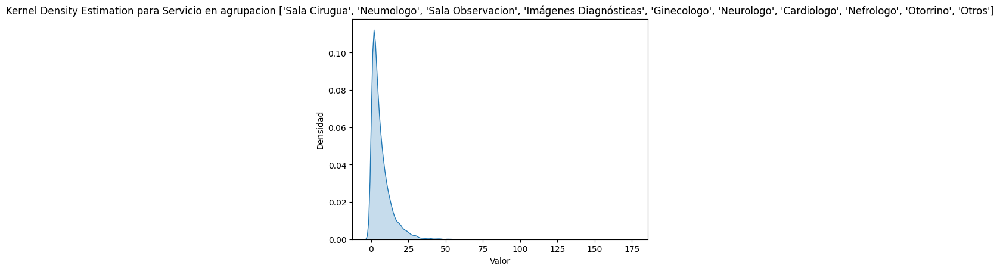

%%%%%%%%%%%%%%%%%%
Para la Ini-Serv.hora_e de ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   2.946503  0.889907           True
Kruskal       h_llegada     23  13.408377  0.942571           True
Kruskal  Llegadadia_sem      6   5.070494  0.534804           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


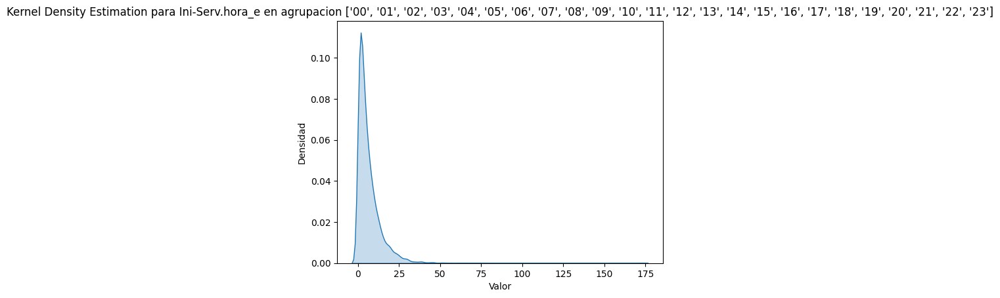

%%%%%%%%%%%%%%%%%%
Para la Atiende.2 de [nan, 'MJ-08', 'MJ-17', 'MJ-12'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   7.600145  0.369168           True
Kruskal       h_llegada     23  26.696098  0.269119           True
Kruskal  Llegadadia_sem      6   7.480944  0.278647           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


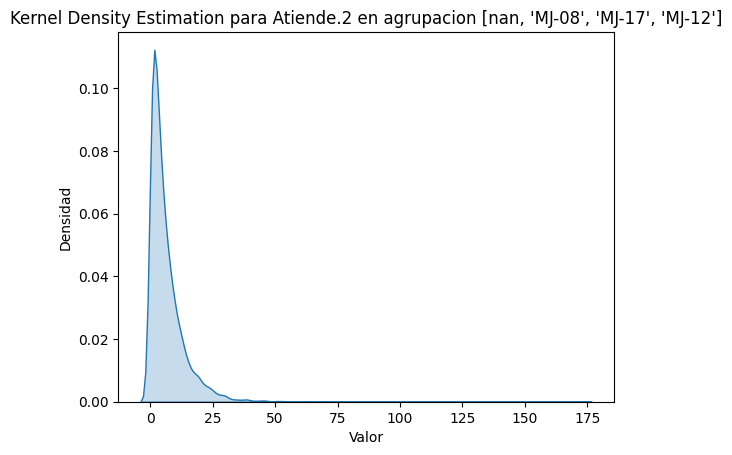

%%%%%%%%%%%%%%%%%%
Para la Ini-RevFinaldia_sem de [nan, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   7.600145  0.369168           True
Kruskal       h_llegada     23  26.696098  0.269119           True
Kruskal  Llegadadia_sem      6   7.480944  0.278647           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


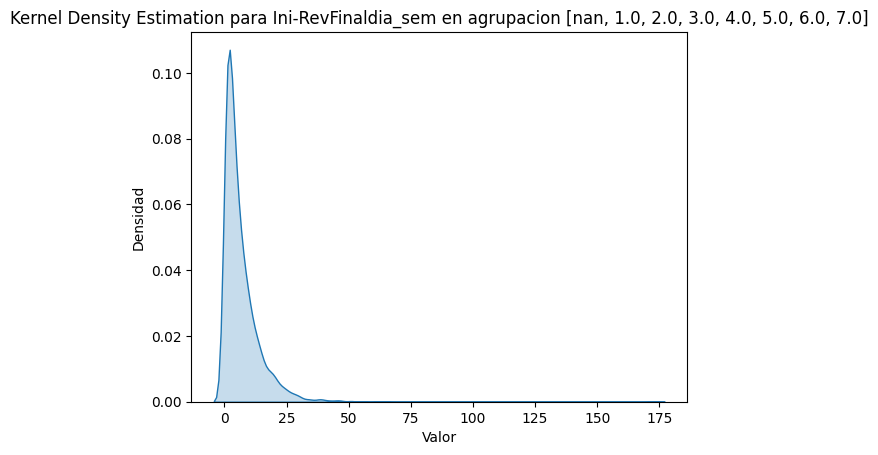

%%%%%%%%%%%%%%%%%%
Para la turno_8h de [nan, 1.0, 2.0, 3.0] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   7.600145  0.369168           True
Kruskal       h_llegada     23  26.696098  0.269119           True
Kruskal  Llegadadia_sem      6   7.480944  0.278647           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


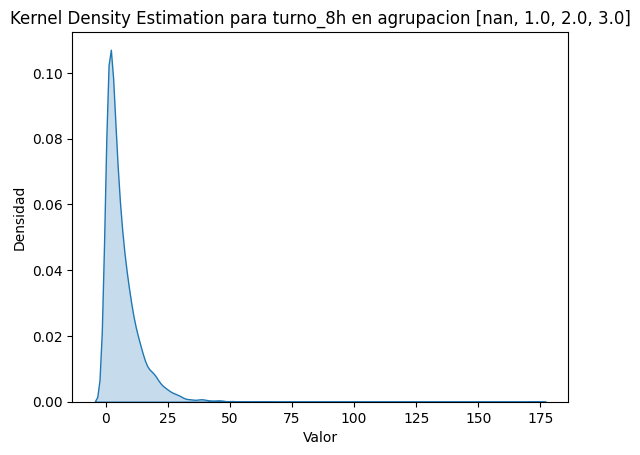

%%%%%%%%%%%%%%%%%%
Para la Ini-Posthora_e de ['01', '00', '02', '03', '05', '06', '07', '08', '09', '10', '11', '12', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '04', '13'] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   4.620959  0.706107           True
Kruskal       h_llegada     23  19.066633  0.697350           True
Kruskal  Llegadadia_sem      6   3.903335  0.689756           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


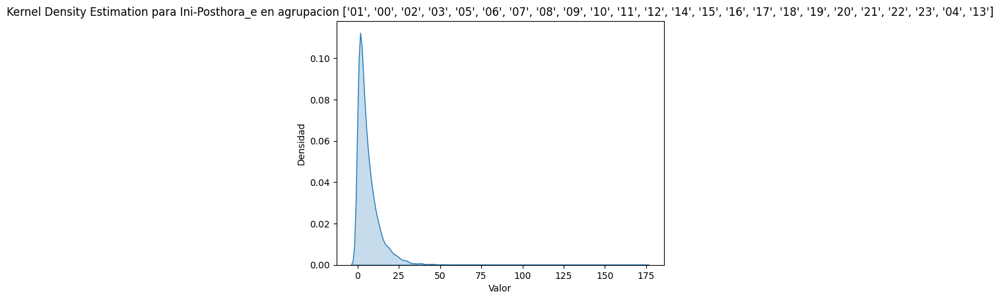

%%%%%%%%%%%%%%%%%%
Para la Lugar de ['Sala Postoperatorio', nan] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   4.620959  0.706107           True
Kruskal       h_llegada     23  19.066633  0.697350           True
Kruskal  Llegadadia_sem      6   3.903335  0.689756           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


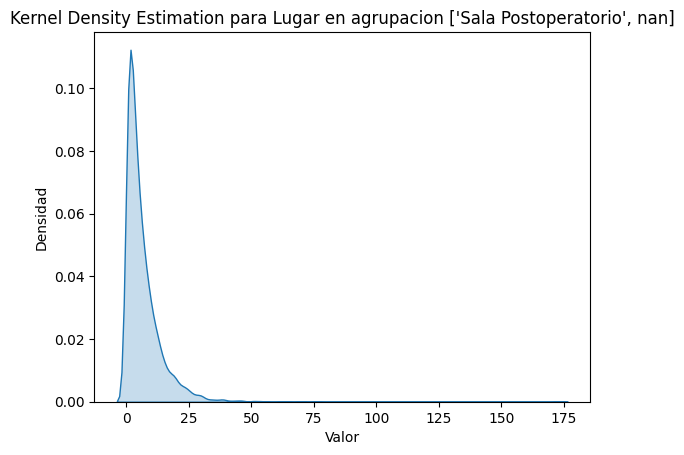

%%%%%%%%%%%%%%%%%%
Para la Ini-Postdia_sem de [1.0, nan, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   4.620959  0.706107           True
Kruskal       h_llegada     23  19.066633  0.697350           True
Kruskal  Llegadadia_sem      6   3.903335  0.689756           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


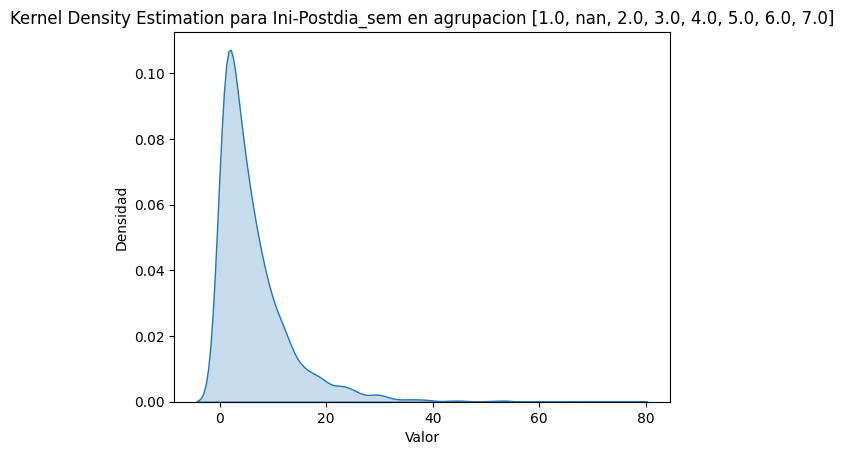

In [ ]:
evalua = [list(e) for e in evalua]

for cosa, evaluaciones in zip(cosas, evalua):
    for j in evaluaciones:
        grupos = list(base[j].unique())
        analisis_agrupaciones(j, grupos, "TS" + cosa, base)

Como se observa en las anteriores pruebas se pasan las tres pruebas de independencia en Triagge, Servicio, Revisión Fina, Postoperatorio y como cosa a notar es que no se realizan las pruebas de igualdad de varianza, razon de esto, la naturaleza de la prueba y los grados de libertad, ahora, se puede llegar a suponer que la varianza no llega a ser muy significativa, razon suficiente, para unicamente tratar el servicio de consulta, que presenta dependencia por dia de la semana, entonces queda el siguiente analisis.

------------------------------------------------------------
Para consulta


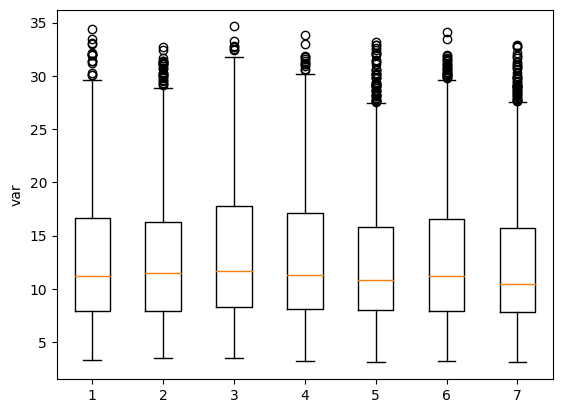

In [ ]:
print("---"*20)
print("Para consulta")
box_turn_filtro("Ini-Consultadia_sem","TS-Consulta",base)

Se agrupa, de la siguiente forma, por dias.


*   Dia semana 2, 5, 7
*   Dia semana 1, 6
*   Dia semana 3, 4



%%%%%%%%%%%%%%%%%%
Para la Ini-Consultadia_sem de [2, 5, 7] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   8.159865  0.318709           True
Kruskal       h_llegada     23  29.060297  0.178319           True
Kruskal  Llegadadia_sem      5   3.274850  0.657694           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


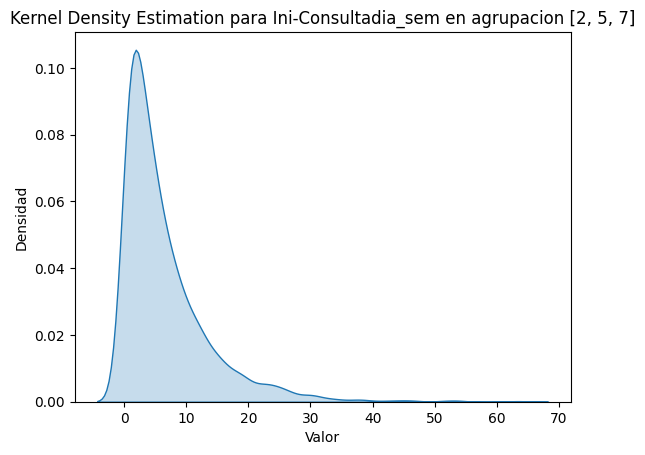

%%%%%%%%%%%%%%%%%%
Para la Ini-Consultadia_sem de [1, 6] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   3.533760  0.831637           True
Kruskal       h_llegada     23  14.219979  0.920398           True
Kruskal  Llegadadia_sem      3   4.368995  0.224278           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


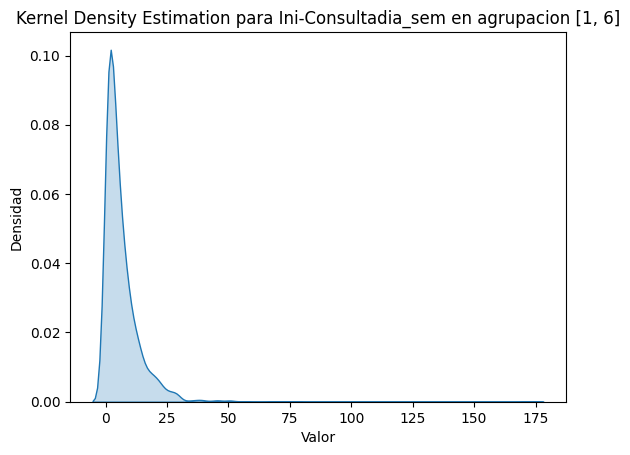

%%%%%%%%%%%%%%%%%%
Para la Ini-Consultadia_sem de [3, 4] se obtuvo:
------------------------------------------------------------
                 Source  ddof1          H     p-unc  Independencia
Kruskal         Atiende      7   4.002549  0.779484           True
Kruskal       h_llegada     23  22.686098  0.479221           True
Kruskal  Llegadadia_sem      2   1.996790  0.368470           True
------------------------------------------------------------
           Source
0         Atiende
1       h_llegada
2  Llegadadia_sem
------------------------------------------------------------


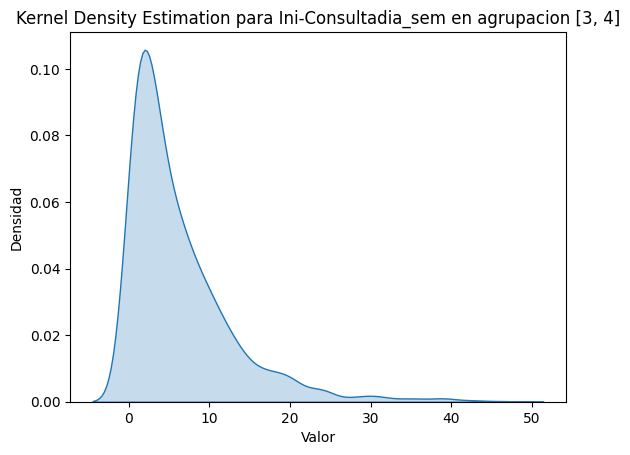

In [ ]:
analisis_agrupaciones("Ini-Consultadia_sem", [2,5,7], "TS-Consulta", base)
analisis_agrupaciones("Ini-Consultadia_sem", [1,6], "TS-Consulta", base)
analisis_agrupaciones("Ini-Consultadia_sem", [3,4], "TS-Consulta", base)

Paso las pruebas, entonces en resumen quedan las siguientes fdp para el servicio


#Para las tasas de servicio se debe hacer:



*   FDP Triagge
*   FDP Consulta dividida en dias de la semana 2-5-7, 1-6, 3-4
*   FDP Servicio
*   FDP Revisión final
*   FDP Postoperatorio



#Las fdp del tiempo de servicio de los que no se deben separar


In [ ]:
def fit(cosa):
  print("Para el "+cosa)
  #Se elimina los valores NaN
  data=base[cosa].dropna()
  #Se hace el fit, inicio, etc
  dfit = distfit()
  results2 = dfit.fit_transform(data)

  #Se exporta al excel para tomar la mejor FDP
  results2['summary'].to_excel(cosa+".xlsx")
  return dfit.plot()

In [ ]:
cosas=["TS-Triagge","TS-Serv.","TS-RevFinal","TS-Post"]

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.271354] [loc=2.328 scale=1.108]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.57572] [loc=0.500 scale=1.828]
[distfit] >INFO> [pareto    ] [0.01 sec] [RSS: 0.57572] [loc=-134217727.500 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 0.282267] [loc=2.258 scale=0.939]


Para el TS-Triagge


[distfit] >INFO> [t         ] [0.98 sec] [RSS: 0.271354] [loc=2.328 scale=1.108]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.263124] [loc=1.852 scale=0.962]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.270817] [loc=0.045 scale=0.595]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.268366] [loc=-1.540 scale=3.713]
[distfit] >INFO> [beta      ] [0.10 sec] [RSS: 0.248341] [loc=0.496 scale=4.742]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.455253] [loc=0.500 scale=4.500]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.270514] [loc=-380.324 scale=50.387]
[distfit] >INFO> [norm      ] [1.56 sec] [RSS: 0.271354] [loc=2.328 scale=1.108]
[distfit] >INFO> [expon     ] [1.55 sec] [RSS: 0.57572] [loc=0.500 scale=1.828]
[distfit] >INFO> [pareto    ] [1.55 sec] [RSS: 0.57572] [loc=-134217727.500 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [1.53 sec] [RSS: 0.282267] [loc=2.258 scale=0.939]
[distfit] >INFO> [t         ] [1.45 sec] [RSS: 0.271354] [loc=2.328 scale=1.108]
[distfit

Para el TS-Serv.


[distfit] >INFO> [t         ] [0.69 sec] [RSS: 0.000446989] [loc=38.291 scale=20.987]
[distfit] >INFO> [genextreme] [0.55 sec] [RSS: 0.000315569] [loc=29.056 scale=17.947]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.000221382] [loc=1.747 scale=14.438]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.000283526] [loc=-21.099 scale=55.697]
[distfit] >INFO> [beta      ] [0.13 sec] [RSS: 9.3714e-05] [loc=4.997 scale=84.938]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.000663102] [loc=5.000 scale=84.617]
[distfit] >INFO> [loggamma  ] [0.18 sec] [RSS: 0.000449984] [loc=-6398.294 scale=866.090]
[distfit] >INFO> [norm      ] [1.80 sec] [RSS: 0.00044694] [loc=38.291 scale=20.988]
[distfit] >INFO> [expon     ] [1.80 sec] [RSS: 0.000757493] [loc=5.000 scale=33.291]
[distfit] >INFO> [pareto    ] [1.80 sec] [RSS: 0.000757493] [loc=-3221225467.000 scale=3221225472.000]
[distfit] >INFO> [dweibull  ] [1.78 sec] [RSS: 0.000543165] [loc=38.921 scale=19.362]
[distfit] >INFO> [t         ] [1.68 se

Para el TS-RevFinal


[distfit] >INFO> [dweibull  ] [0.17 sec] [RSS: 0.0467057] [loc=4.550 scale=1.944]
[distfit] >INFO> [t         ] [0.52 sec] [RSS: 0.0383507] [loc=4.602 scale=1.493]
[distfit] >INFO> [genextreme] [0.17 sec] [RSS: 0.00292038] [loc=4.082 scale=1.497]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.0173662] [loc=1.997 scale=1.955]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00446676] [loc=1.753 scale=2.959]
[distfit] >INFO> [beta      ] [0.30 sec] [RSS: 0.0176761] [loc=1.997 scale=3962488187.170]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.253577] [loc=2.000 scale=15.383]
[distfit] >INFO> [loggamma  ] [0.15 sec] [RSS: 0.114626] [loc=-964.869 scale=128.702]
[distfit] >INFO> [norm      ] [1.45 sec] [RSS: 0.111418] [loc=5.545 scale=2.861]
[distfit] >INFO> [expon     ] [1.45 sec] [RSS: 0.103888] [loc=2.000 scale=3.545]
[distfit] >INFO> [pareto    ] [1.45 sec] [RSS: 0.103888] [loc=-268435454.000 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [1.44 sec] [RSS: 0.0467057] [loc=4.550 

Para el TS-Post


[distfit] >INFO> [t         ] [0.64 sec] [RSS: 0.000572336] [loc=90.419 scale=17.460]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.000482968] [loc=86.203 scale=18.844]
[distfit] >INFO> [gamma     ] [0.13 sec] [RSS: 0.000573948] [loc=-789.171 scale=0.347]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.000572884] [loc=-524227.983 scale=524318.491]
[distfit] >INFO> [beta      ] [0.16 sec] [RSS: 1.64428e-05] [loc=60.013 scale=59.987]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 1.66856e-05] [loc=60.017 scale=59.983]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.000569537] [loc=-541.246 scale=147.864]
[distfit] >INFO> [norm      ] [1.26 sec] [RSS: 0.00057288] [loc=90.508 scale=17.449]
[distfit] >INFO> [expon     ] [1.26 sec] [RSS: 0.00104162] [loc=60.017 scale=30.491]
[distfit] >INFO> [pareto    ] [1.26 sec] [RSS: 0.00104162] [loc=-2147483587.983 scale=2147483648.000]
[distfit] >INFO> [dweibull  ] [1.25 sec] [RSS: 0.000474064] [loc=89.518 scale=16.891]
[distfit] >INFO> [t        

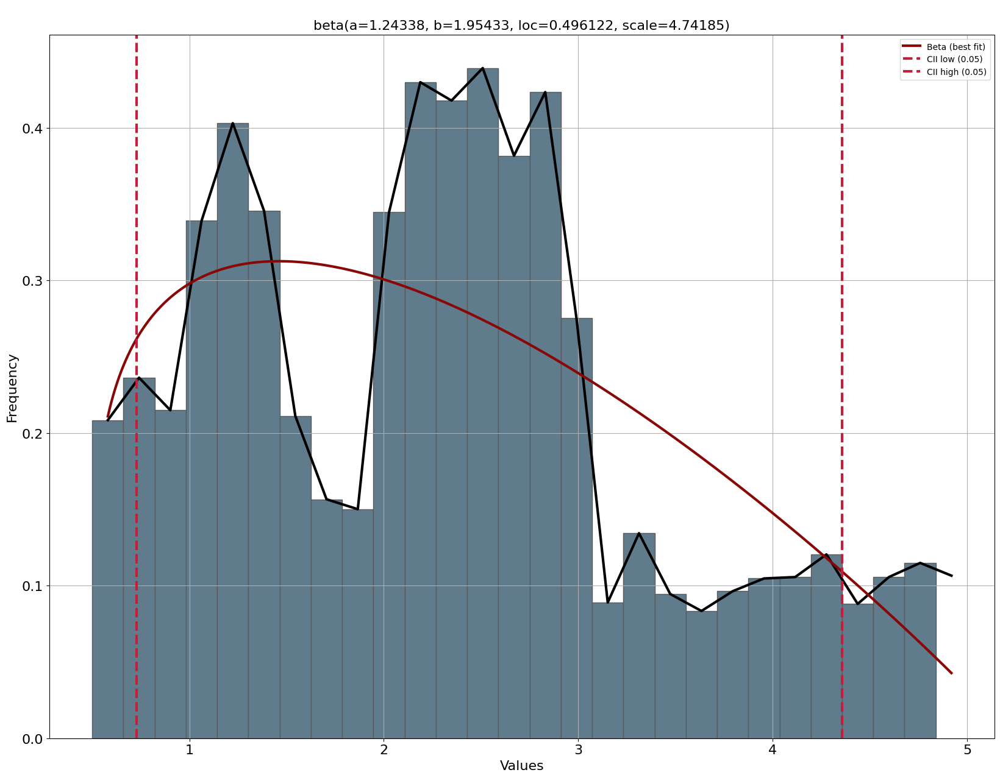

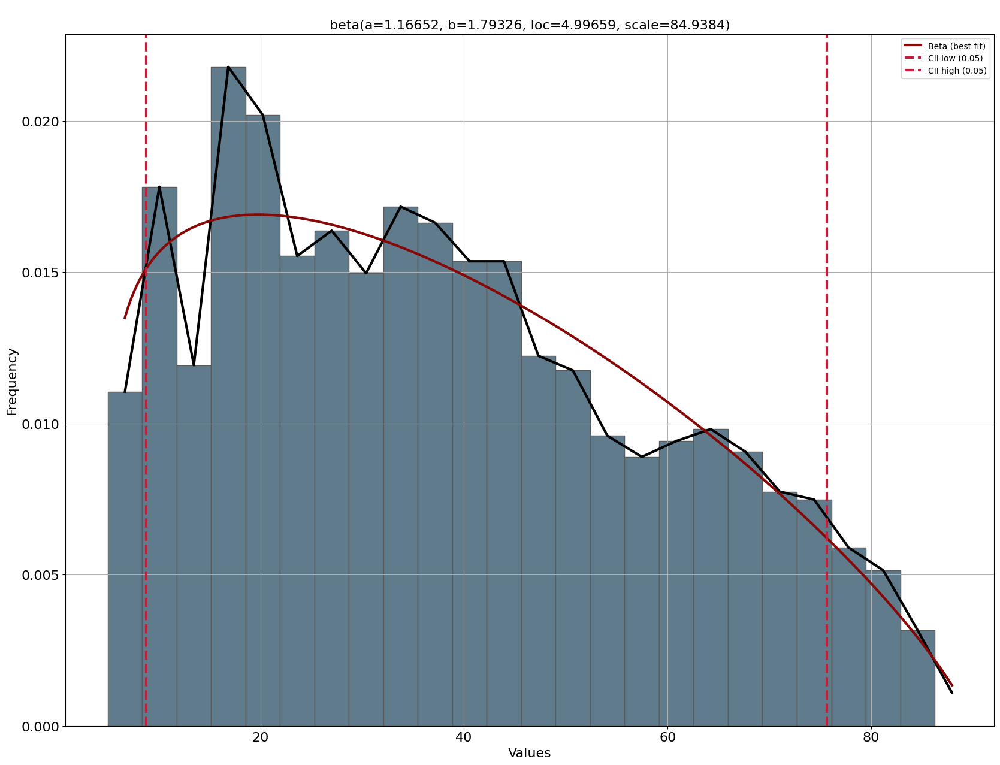

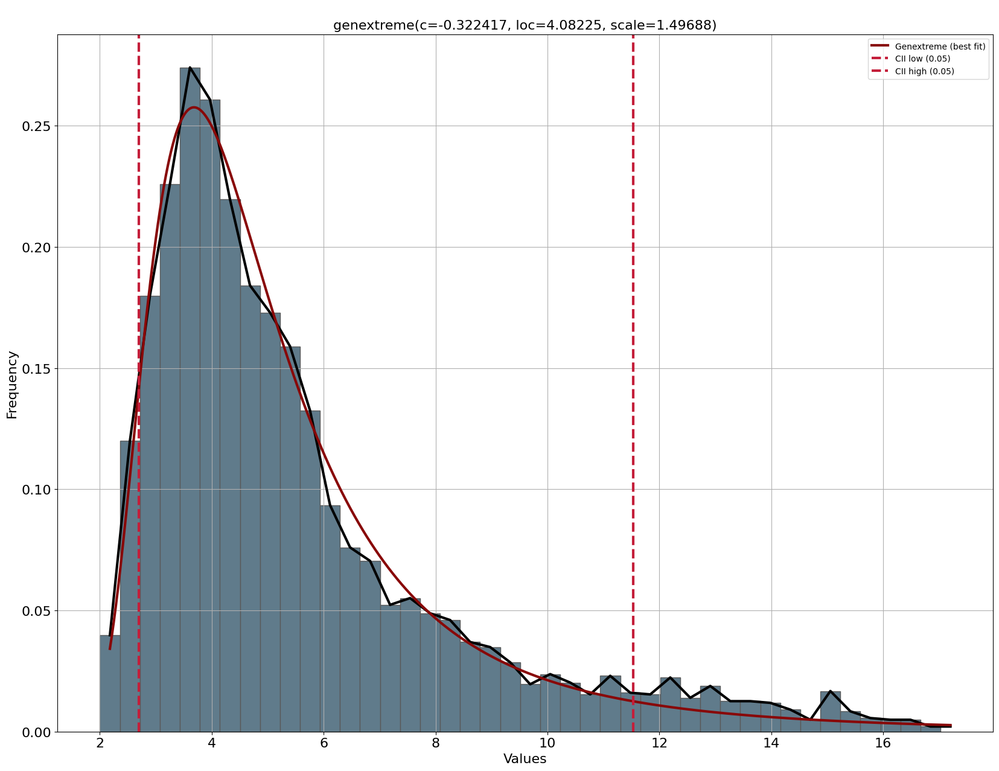

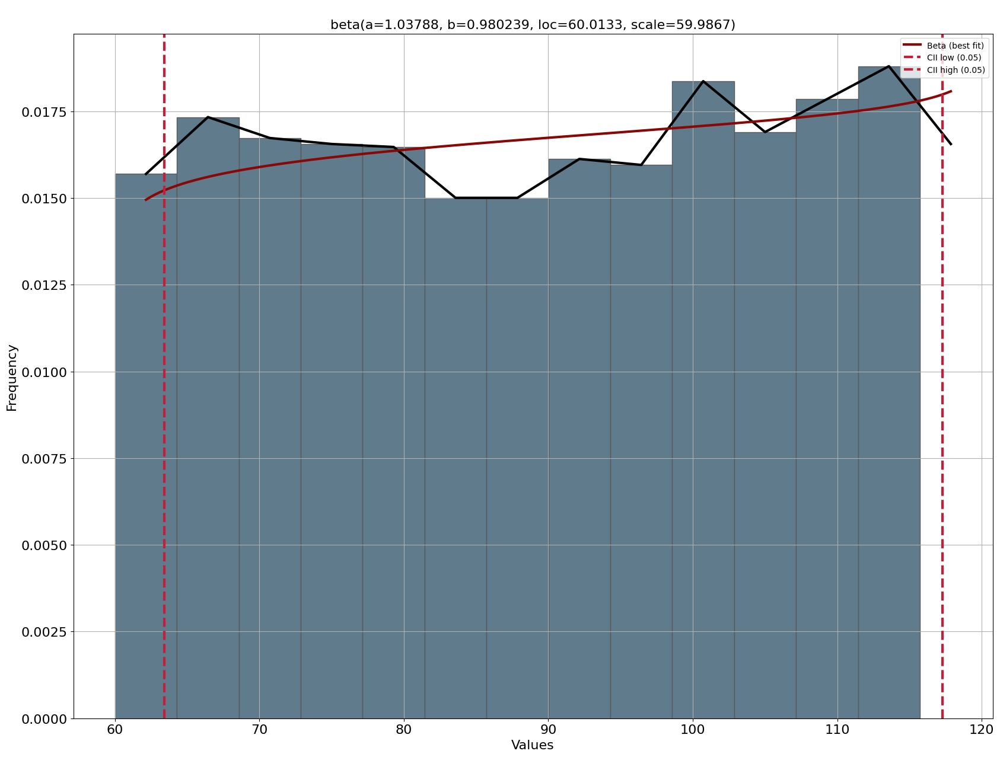

In [ ]:
for i in cosas:
  fit(i)

#Las que si se deben separar

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00998981] [loc=12.721 scale=6.606]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0142104] [loc=3.083 scale=9.637]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.0142104] [loc=-1073741820.917 scale=1073741824.000]
[distfit] >INFO> [dweibull  ] [0.06 sec] [RSS: 0.0068703] [loc=11.532 scale=5.343]
[distfit] >INFO> [t         ] [0.75 sec] [RSS: 0.00936363] [loc=12.484 scale=6.590]
[distfit] >INFO> [genextreme] [0.23 sec] [RSS: 0.00149061] [loc=9.329 scale=4.307]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.0019196] [loc=2.986 scale=4.501]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00137605] [loc=1.387 scale=9.614]
[distfit] >INFO> [beta      ] [0.17 sec] [RSS: 0.00193149] [loc=2.989 scale=2349.728]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0206662] [loc=3.083 scale=30.100]
[distfit] >INFO> [loggamma  ] [0.13 sec] [RSS: 0.0101536] [loc=-2807.575 scale=356.236]
[distfit] >IN

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.58214, loc=1.38695, scale=9.61419)'}, xlabel='Values', ylabel='Frequency'>)

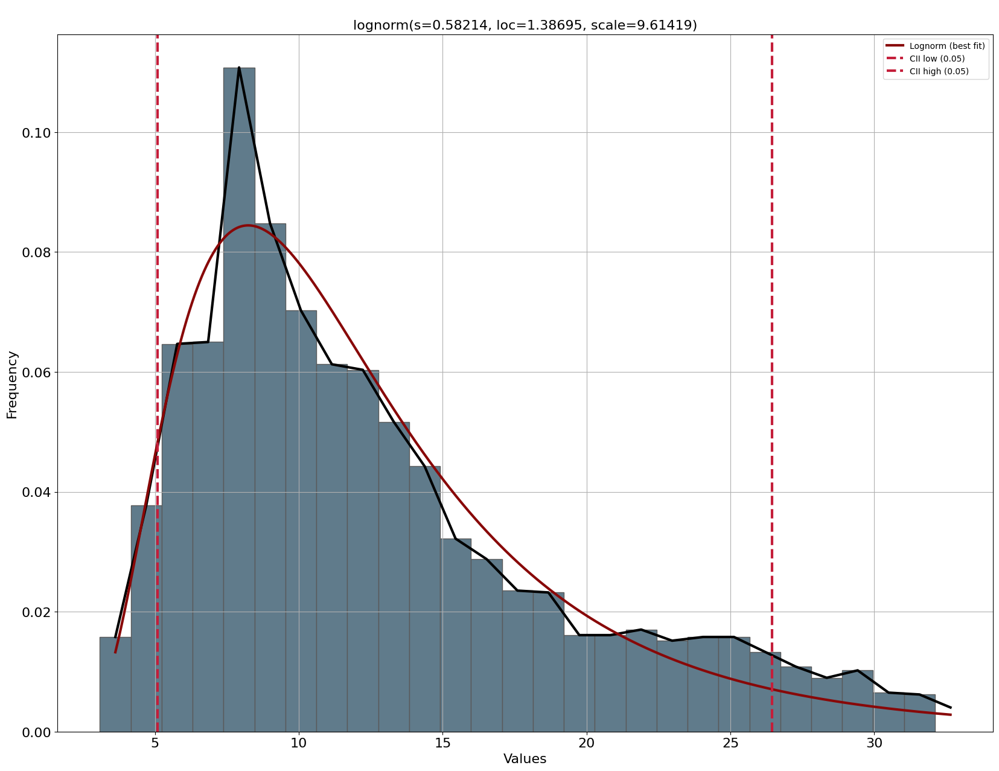

In [ ]:
dfit = distfit()
filtro=base[((base['Ini-Consultadia_sem']==2)|(base['Ini-Consultadia_sem']==5)|(base['Ini-Consultadia_sem']==7))]
results2 = dfit.fit_transform(filtro['TS-Consulta'])
results2['summary'].to_excel("TS-Consulta_S257.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00679653] [loc=12.948 scale=6.656]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00932772] [loc=3.250 scale=9.698]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00932772] [loc=-3758096380.750 scale=3758096384.000]
[distfit] >INFO> [dweibull  ] [0.04 sec] [RSS: 0.00567866] [loc=12.084 scale=5.605]
[distfit] >INFO> [t         ] [0.54 sec] [RSS: 0.00598201] [loc=12.421 scale=6.043]
[distfit] >INFO> [genextreme] [0.18 sec] [RSS: 0.00135027] [loc=9.522 scale=4.446]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.00115213] [loc=3.144 scale=4.696]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.00108265] [loc=1.357 scale=9.849]
[distfit] >INFO> [beta      ] [0.16 sec] [RSS: 0.00140418] [loc=3.211 scale=77.014]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0153122] [loc=3.250 scale=31.117]
[distfit] >INFO> [loggamma  ] [0.14 sec] [RSS: 0.00684522] [loc=-3045.861 scale=380.732]
[distfit] 

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.58137, loc=1.35672, scale=9.84864)'}, xlabel='Values', ylabel='Frequency'>)

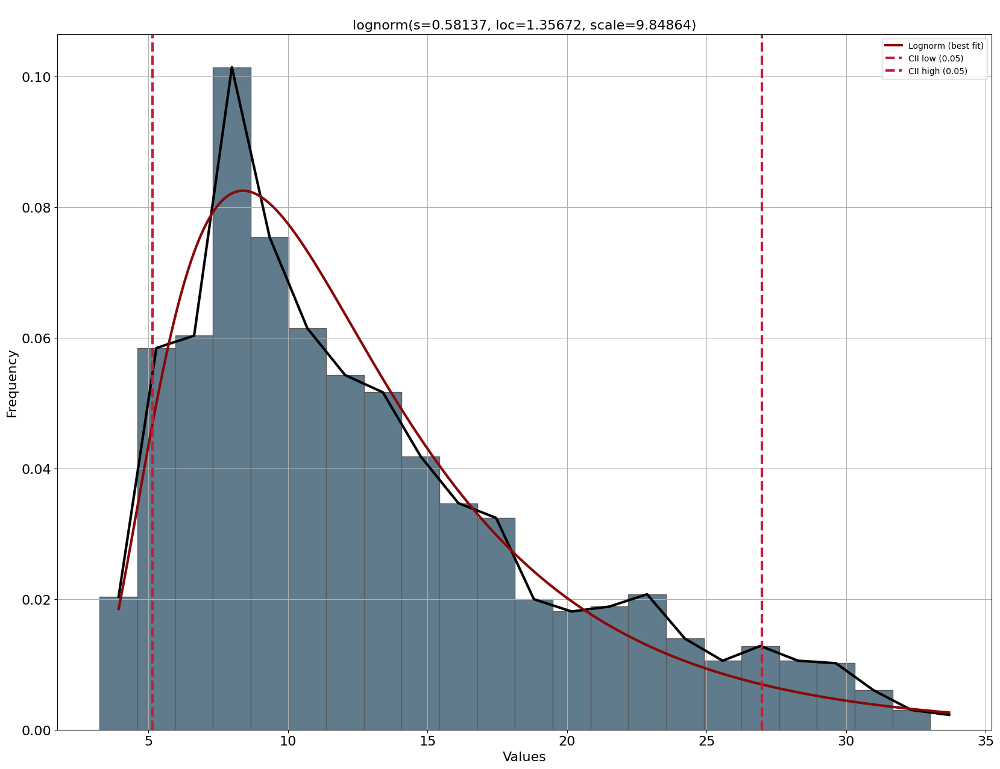

In [ ]:
dfit = distfit()
filtro=base[((base['Ini-Consultadia_sem']==1)|(base['Ini-Consultadia_sem']==6))]
results2 = dfit.fit_transform(filtro['TS-Consulta'])
results2['summary'].to_excel("TS-Consulta_S16.xlsx")
dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.00605943] [loc=13.391 scale=6.851]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.00817639] [loc=3.233 scale=10.157]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.00817639] [loc=-2147483644.767 scale=2147483648.000]
[distfit] >INFO> [dweibull  ] [0.05 sec] [RSS: 0.00463757] [loc=12.561 scale=5.908]
[distfit] >INFO> [t         ] [0.90 sec] [RSS: 0.00605942] [loc=13.391 scale=6.851]
[distfit] >INFO> [genextreme] [0.37 sec] [RSS: 0.00144208] [loc=9.870 scale=4.705]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 0.00127967] [loc=3.154 scale=4.892]
[distfit] >INFO> [lognorm   ] [0.02 sec] [RSS: 0.00122124] [loc=1.079 scale=10.539]
[distfit] >INFO> [beta      ] [0.30 sec] [RSS: 0.00168937] [loc=3.213 scale=51.984]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0124237] [loc=3.233 scale=31.400]
[distfit] >INFO> [loggamma  ] [0.28 sec] [RSS: 0.00606629] [loc=-1946.571 scale=269.003]
[distfit

(<Figure size 2000x1500 with 1 Axes>,
 <Axes: title={'center': '\nlognorm(s=0.568862, loc=1.07864, scale=10.5385)'}, xlabel='Values', ylabel='Frequency'>)

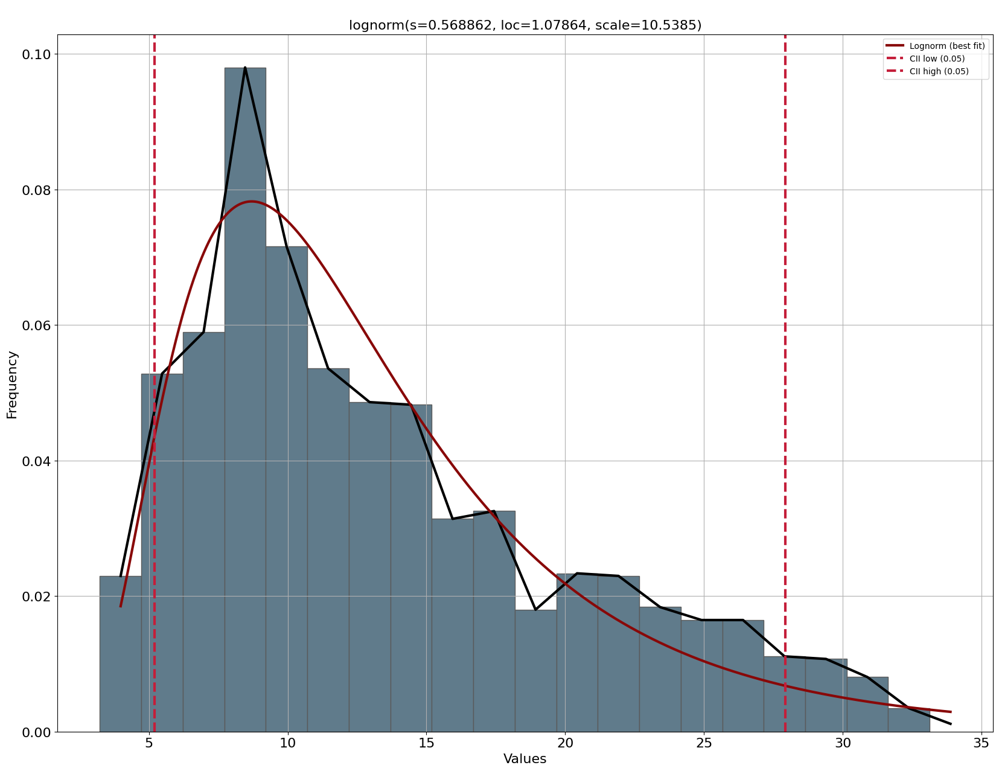

In [ ]:
dfit = distfit()
filtro=base[((base['Ini-Consultadia_sem']==3)|(base['Ini-Consultadia_sem']==4))]
results2 = dfit.fit_transform(filtro['TS-Consulta'])
results2['summary'].to_excel("TS-Consulta_S34.xlsx")
dfit.plot()

#Se calcula nuevamente, con agrupaciones, el triagge por que se rechazan las pruebas de fdp realizadas.


------------------------------------------------------------
Para triagge


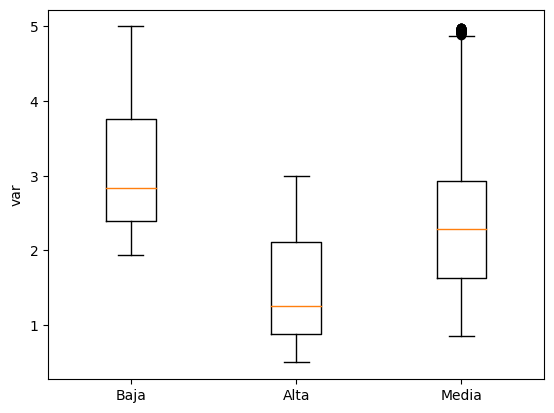

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


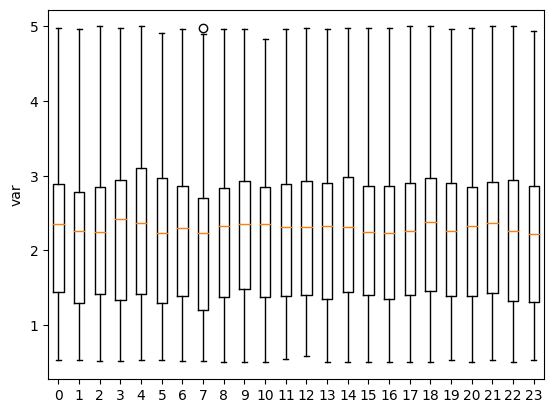

In [ ]:
print("---"*20)
print("Para triagge")
box_turn_filtro("Valor-Triagge","TS-Triagge",base)
print("%%%"*18)
box_turn_filtro("h_llegada","TS-Triagge",base)

In [ ]:
base.columns

Index(['Paciente', 'Valor-Triagge', 'Atiende', 'Atiende.1', 'Servicio',
       'Atiende.2', 'Lugar', 'Llegadadia', 'Llegadahora', 'Ini-Triaggedia',
       'Ini-Triaggehora', 'Fin-Triaggedia', 'Fin-Triaggehora',
       'Ini-Consultadia', 'Ini-Consultahora', 'Fin-Consultadia',
       'Fin-Consultahora', 'Ini-Serv.dia', 'Ini-Serv.hora', 'Fin-Serv.dia',
       'Fin-Serv.hora', 'Ini-RevFinaldia', 'Ini-RevFinalhora',
       'Fin-RevFinaldia', 'Fin-RevFinalhora', 'Ini-Postdia', 'Ini-Posthora',
       'Fin-Postdia', 'Fin-Posthora', 'LlegadaTA', 'Ini-TriaggeTA',
       'TS-Triagge', 'TS-Consulta', 'TS-Serv.', 'TS-RevFinal', 'TS-Post',
       'Ini-Consultaturno_6h', 'Ini-Triaggeturno_6h', 'turno_8h',
       'Llegadadia_sem', 'Ini-Consultadia_sem', 'Ini-Serv.dia_sem',
       'Ini-RevFinaldia_sem', 'Ini-Postdia_sem', 'h_llegada'],
      dtype='object')

In [ ]:
filtro = [[1, 6, 11, 12, 13, 15, 16],
          [20, 21, 22, 23],
          [3, 5, 9, 10],
          [14, 17, 18, 19],
          [8]]

base['h_llegada']=base['h_llegada'].astype(int)
# Filtrar la base cinco veces usando los arreglos de 'filtro'
for i, f in enumerate(filtro):
    filtrado = base[base['h_llegada'].isin(f)]
    print(f"Combinación {i+1}:")
    dfit = distfit()
    results2 = dfit.fit_transform(filtrado['TS-Triagge'])
    results2['summary'].to_excel("TS-Triagge_h"+str(i+1)+".xlsx")
    dfit.plot()
    print("\n")

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.546099] [loc=3.101 scale=0.862]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.28565] [loc=1.933 scale=1.168]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.28565] [loc=-67108862.067 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.05 sec] [RSS: 0.4741] [loc=3.224 scale=0.856]


Valor de triagge Baja:


[distfit] >INFO> [t         ] [0.71 sec] [RSS: 0.5461] [loc=3.101 scale=0.862]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.166459] [loc=2.617 scale=0.555]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.134393] [loc=1.932 scale=0.718]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.138504] [loc=1.807 scale=1.013]
[distfit] >INFO> [beta      ] [0.28 sec] [RSS: 0.454949] [loc=1.933 scale=3.073]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.474301] [loc=1.933 scale=3.067]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.550902] [loc=-204.581 scale=29.450]
[distfit] >INFO> [norm      ] [1.47 sec] [RSS: 0.546099] [loc=3.101 scale=0.862]
[distfit] >INFO> [expon     ] [1.47 sec] [RSS: 0.28565] [loc=1.933 scale=1.168]
[distfit] >INFO> [pareto    ] [1.46 sec] [RSS: 0.28565] [loc=-67108862.067 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [1.45 sec] [RSS: 0.4741] [loc=3.224 scale=0.856]
[distfit] >INFO> [t         ] [1.39 sec] [RSS: 0.5461] [loc=3.101 scale=0.862]
[distfit] >INFO> 



Valor de triagge Media:


[distfit] >INFO> [t         ] [0.47 sec] [RSS: 0.226014] [loc=2.444 scale=1.021]
[distfit] >INFO> [genextreme] [0.12 sec] [RSS: 0.118339] [loc=1.943 scale=0.764]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.0860706] [loc=0.841 scale=0.724]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.108762] [loc=0.369 scale=1.834]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.0871702] [loc=0.848 scale=5.805]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.40051] [loc=0.850 scale=4.133]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.226991] [loc=-323.396 scale=43.684]
[distfit] >INFO> [norm      ] [0.89 sec] [RSS: 0.226015] [loc=2.444 scale=1.021]
[distfit] >INFO> [expon     ] [0.89 sec] [RSS: 0.413898] [loc=0.850 scale=1.594]
[distfit] >INFO> [pareto    ] [0.88 sec] [RSS: 0.413898] [loc=-134217727.150 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.87 sec] [RSS: 0.205289] [loc=2.341 scale=0.872]
[distfit] >INFO> [t         ] [0.83 sec] [RSS: 0.226014] [loc=2.444 scale=1.021]
[distf



Valor de triagge Alta:


[distfit] >INFO> [t         ] [0.47 sec] [RSS: 0.898443] [loc=1.456 scale=0.724]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.386618] [loc=1.062 scale=0.485]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.327768] [loc=0.491 scale=0.677]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.352326] [loc=0.288 scale=0.949]
[distfit] >INFO> [beta      ] [0.17 sec] [RSS: 0.416907] [loc=0.500 scale=2.592]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.748018] [loc=0.500 scale=2.500]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.893807] [loc=-225.593 scale=30.517]
[distfit] >INFO> [norm      ] [0.96 sec] [RSS: 0.898444] [loc=1.456 scale=0.724]
[distfit] >INFO> [expon     ] [0.96 sec] [RSS: 0.471034] [loc=0.500 scale=0.956]
[distfit] >INFO> [pareto    ] [0.95 sec] [RSS: 0.471034] [loc=-134217727.500 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.95 sec] [RSS: 0.646993] [loc=1.260 scale=0.596]
[distfit] >INFO> [t         ] [0.90 sec] [RSS: 0.898443] [loc=1.456 scale=0.724]
[distfi

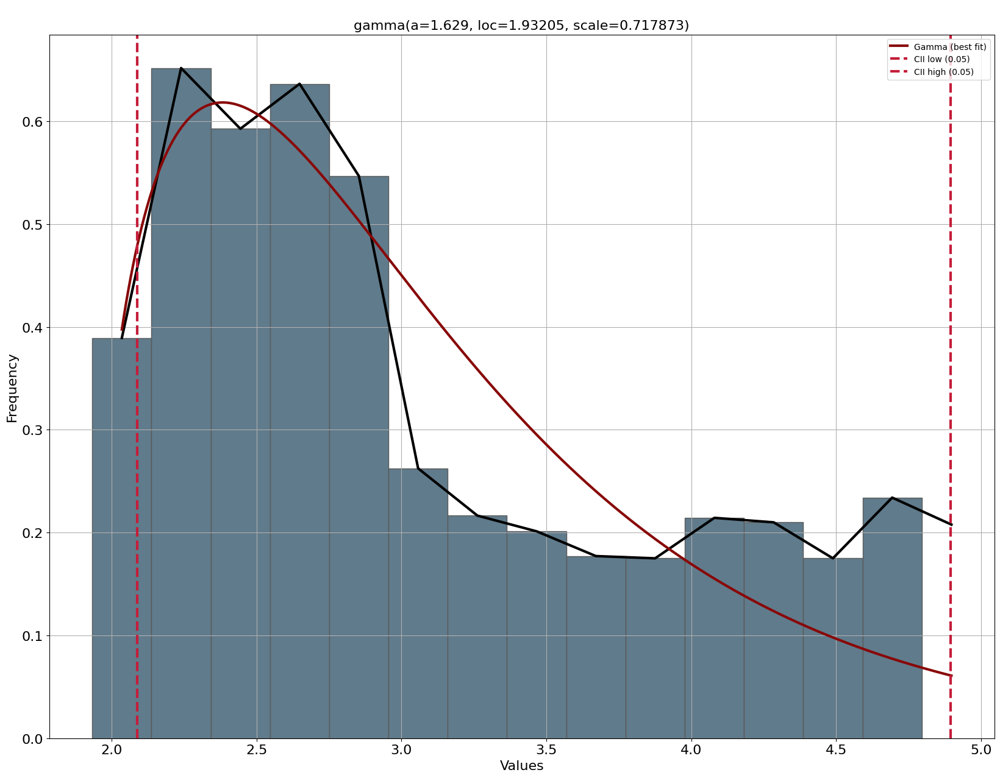

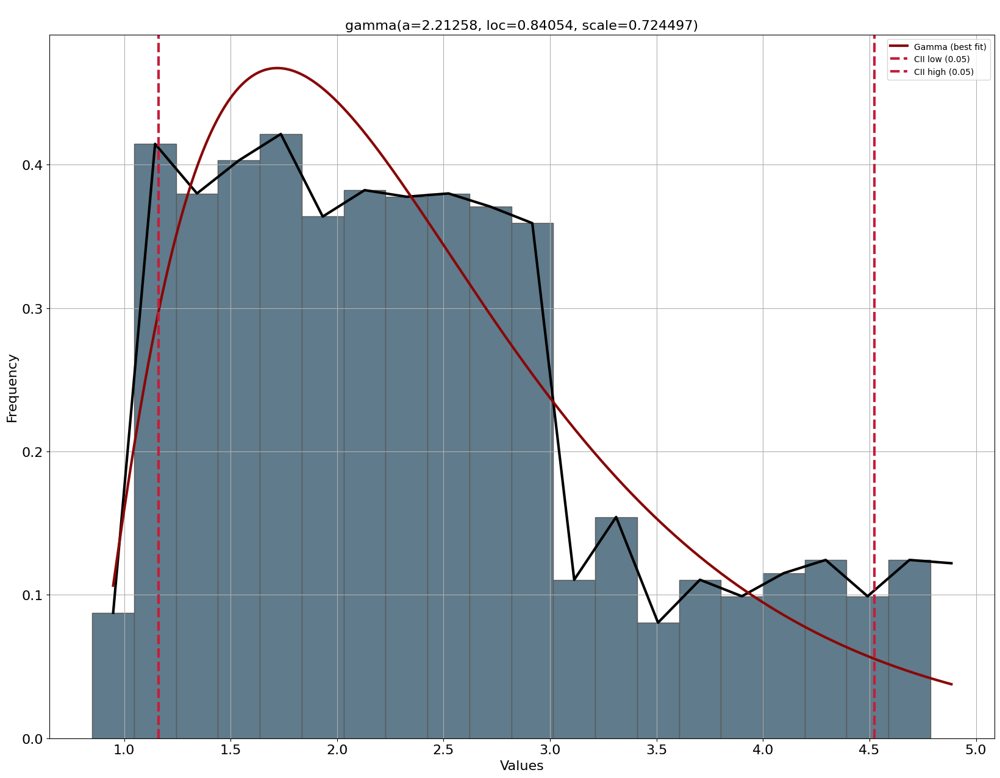

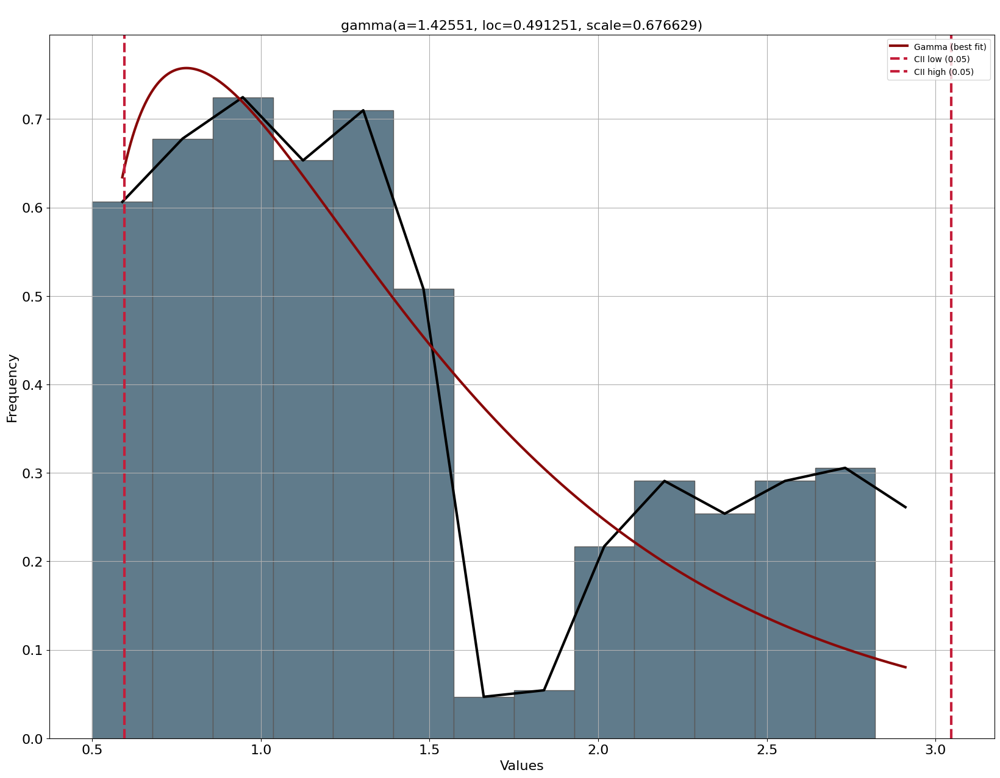

In [ ]:
for i in ['Baja','Media','Alta']:
  filtrado = base[(base['Valor-Triagge']==i)]
  print(f"Valor de triagge {i}:")
  dfit = distfit()
  results2 = dfit.fit_transform(filtrado['TS-Triagge'])
  results2['summary'].to_excel("TS-Triagge_"+str(i)+".xlsx")
  dfit.plot()
  print("\n")

------------------------------------------------------------
Para triagge


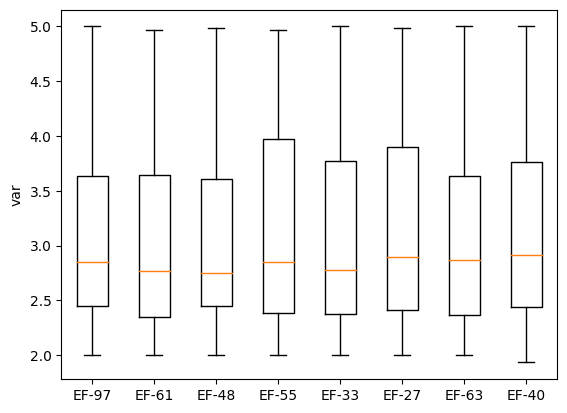

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


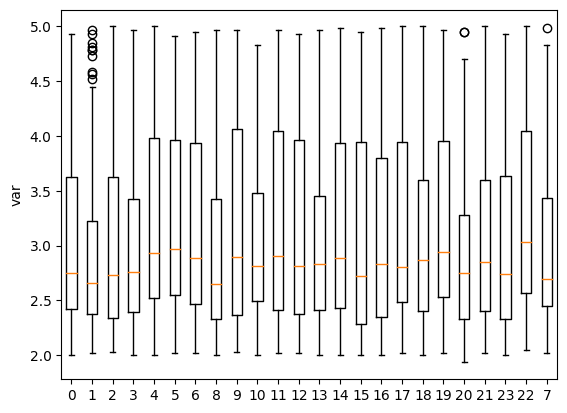

------------------------------------------------------------
Para triagge


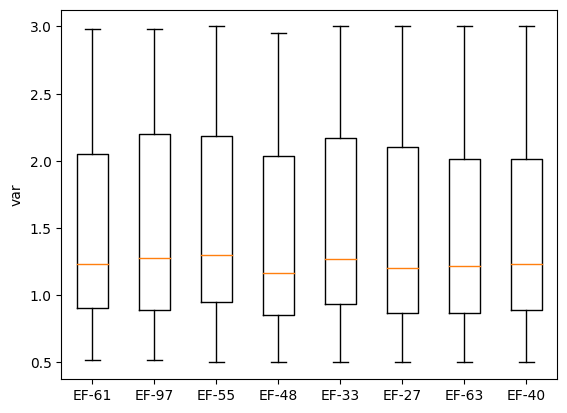

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


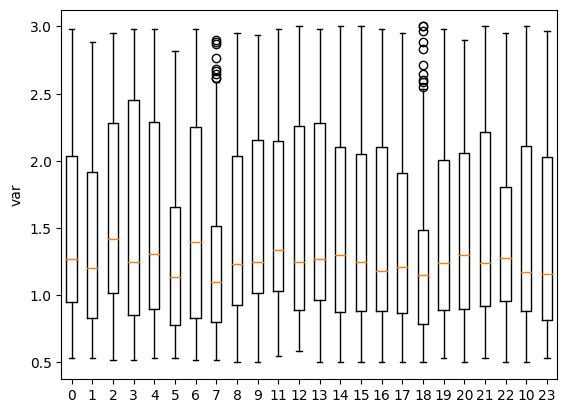

In [ ]:
for i in ['Baja','Alta']:
  filtrado = base[(base['Valor-Triagge']==i)]
  print("---"*20)
  print("Para triagge")
  box_turn_filtro("Atiende","TS-Triagge",filtrado)
  print("%%%"*18)
  box_turn_filtro("h_llegada","TS-Triagge",filtrado)

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.400636] [loc=3.054 scale=0.845]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.0817757] [loc=2.000 scale=1.054]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.0817757] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 0.301329] [loc=2.839 scale=0.716]


Combinación 1:


[distfit] >INFO> [t         ] [0.64 sec] [RSS: 0.400637] [loc=3.054 scale=0.845]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 0.109293] [loc=2.578 scale=0.531]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.0611977] [loc=1.996 scale=0.858]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0755679] [loc=1.827 scale=0.944]
[distfit] >INFO> [beta      ] [0.21 sec] [RSS: 0.120713] [loc=2.000 scale=3.085]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.384514] [loc=2.000 scale=3.000]
[distfit] >INFO> [loggamma  ] [0.12 sec] [RSS: 0.398993] [loc=-208.855 scale=29.905]
[distfit] >INFO> [norm      ] [1.25 sec] [RSS: 0.400636] [loc=3.054 scale=0.845]
[distfit] >INFO> [expon     ] [1.25 sec] [RSS: 0.0817757] [loc=2.000 scale=1.054]
[distfit] >INFO> [pareto    ] [1.25 sec] [RSS: 0.0817757] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [1.24 sec] [RSS: 0.301329] [loc=2.839 scale=0.716]
[distfit] >INFO> [t         ] [1.22 sec] [RSS: 0.400637] [loc=3.054 scale=0.845]
[di



Combinación 2:


[distfit] >INFO> [t         ] [0.23 sec] [RSS: 0.232001] [loc=2.659 scale=0.492]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.0431188] [loc=2.464 scale=0.418]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.0982328] [loc=2.015 scale=0.765]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0827508] [loc=1.944 scale=0.682]
[distfit] >INFO> [beta      ] [0.16 sec] [RSS: 0.259794] [loc=2.017 scale=2.977]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.698955] [loc=2.017 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.522923] [loc=-276.326 scale=36.723]
[distfit] >INFO> [norm      ] [0.72 sec] [RSS: 0.515702] [loc=2.915 scale=0.799]
[distfit] >INFO> [expon     ] [0.71 sec] [RSS: 0.131236] [loc=2.017 scale=0.898]
[distfit] >INFO> [pareto    ] [0.71 sec] [RSS: 0.131236] [loc=-67108861.983 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.69 sec] [RSS: 0.285621] [loc=2.690 scale=0.597]
[distfit] >INFO> [t         ] [0.67 sec] [RSS: 0.232001] [loc=2.659 scale=0.492]
[distf



Combinación 3:


[distfit] >INFO> [t         ] [0.49 sec] [RSS: 0.442196] [loc=3.033 scale=0.825]
[distfit] >INFO> [genextreme] [0.12 sec] [RSS: 0.0866301] [loc=2.582 scale=0.512]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.0867757] [loc=1.990 scale=0.777]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0733085] [loc=1.801 scale=0.975]
[distfit] >INFO> [beta      ] [0.18 sec] [RSS: 0.264973] [loc=2.000 scale=3.001]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.498996] [loc=2.000 scale=2.983]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.439393] [loc=-258.930 scale=35.177]
[distfit] >INFO> [norm      ] [1.06 sec] [RSS: 0.442199] [loc=3.033 scale=0.825]
[distfit] >INFO> [expon     ] [1.05 sec] [RSS: 0.166525] [loc=2.000 scale=1.033]
[distfit] >INFO> [pareto    ] [1.05 sec] [RSS: 0.166524] [loc=-536870910.000 scale=536870912.000]
[distfit] >INFO> [dweibull  ] [1.04 sec] [RSS: 0.249399] [loc=2.790 scale=0.659]
[distfit] >INFO> [t         ] [1.01 sec] [RSS: 0.442196] [loc=3.033 scale=0.825]
[dis



Combinación 4:


[distfit] >INFO> [t         ] [0.51 sec] [RSS: 0.398532] [loc=3.180 scale=0.885]
[distfit] >INFO> [genextreme] [0.10 sec] [RSS: 0.180299] [loc=2.694 scale=0.614]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.105921] [loc=1.992 scale=0.867]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.142027] [loc=1.742 scale=1.162]
[distfit] >INFO> [beta      ] [0.21 sec] [RSS: 0.115791] [loc=2.000 scale=3.001]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.265745] [loc=2.000 scale=3.000]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.391758] [loc=-309.285 scale=40.989]
[distfit] >INFO> [norm      ] [1.11 sec] [RSS: 0.398532] [loc=3.180 scale=0.885]
[distfit] >INFO> [expon     ] [1.12 sec] [RSS: 0.14105] [loc=2.000 scale=1.180]
[distfit] >INFO> [pareto    ] [1.11 sec] [RSS: 0.14105] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [1.10 sec] [RSS: 0.305716] [loc=3.440 scale=0.933]
[distfit] >INFO> [t         ] [1.03 sec] [RSS: 0.398532] [loc=3.180 scale=0.885]
[distfit]



Combinación 5:


[distfit] >INFO> [t         ] [0.43 sec] [RSS: 0.404208] [loc=3.197 scale=0.910]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.202886] [loc=2.683 scale=0.629]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.125582] [loc=2.014 scale=0.991]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.154719] [loc=1.814 scale=1.066]
[distfit] >INFO> [beta      ] [0.16 sec] [RSS: 0.10028] [loc=2.017 scale=2.959]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.246346] [loc=2.017 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.404931] [loc=-265.514 scale=36.465]
[distfit] >INFO> [norm      ] [0.92 sec] [RSS: 0.404206] [loc=3.197 scale=0.910]
[distfit] >INFO> [expon     ] [0.91 sec] [RSS: 0.13061] [loc=2.017 scale=1.181]
[distfit] >INFO> [pareto    ] [0.91 sec] [RSS: 0.13061] [loc=-134217725.983 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.90 sec] [RSS: 0.231541] [loc=3.429 scale=0.960]
[distfit] >INFO> [t         ] [0.87 sec] [RSS: 0.404208] [loc=3.197 scale=0.910]
[distfit] 



Combinación 6:


[distfit] >INFO> [t         ] [0.64 sec] [RSS: 0.353755] [loc=3.091 scale=0.861]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.103638] [loc=2.575 scale=0.525]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.0657853] [loc=1.995 scale=0.832]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0761369] [loc=1.902 scale=0.870]
[distfit] >INFO> [beta      ] [0.28 sec] [RSS: 0.107116] [loc=2.000 scale=2.985]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.280671] [loc=2.000 scale=2.983]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.354801] [loc=-251.409 scale=34.532]
[distfit] >INFO> [norm      ] [1.42 sec] [RSS: 0.353756] [loc=3.091 scale=0.861]
[distfit] >INFO> [expon     ] [1.42 sec] [RSS: 0.0598948] [loc=2.000 scale=1.091]
[distfit] >INFO> [pareto    ] [1.42 sec] [RSS: 0.0598948] [loc=-67108862.000 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [1.41 sec] [RSS: 0.343207] [loc=3.295 scale=0.894]
[distfit] >INFO> [t         ] [1.36 sec] [RSS: 0.353755] [loc=3.091 scale=0.861]
[dist



Combinación 7:


[distfit] >INFO> [t         ] [0.58 sec] [RSS: 0.155568] [loc=2.801 scale=0.591]
[distfit] >INFO> [genextreme] [0.16 sec] [RSS: 0.0325623] [loc=2.541 scale=0.463]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.0410573] [loc=1.909 scale=0.558]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0288142] [loc=1.768 scale=0.959]
[distfit] >INFO> [beta      ] [0.18 sec] [RSS: 0.175681] [loc=1.933 scale=3.164]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.411342] [loc=1.933 scale=3.017]
[distfit] >INFO> [loggamma  ] [0.17 sec] [RSS: 0.26177] [loc=-259.241 scale=34.423]
[distfit] >INFO> [norm      ] [1.29 sec] [RSS: 0.254455] [loc=2.942 scale=0.753]
[distfit] >INFO> [expon     ] [1.28 sec] [RSS: 0.175082] [loc=1.933 scale=1.008]
[distfit] >INFO> [pareto    ] [1.27 sec] [RSS: 0.175082] [loc=-67108862.067 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [1.26 sec] [RSS: 0.128972] [loc=2.766 scale=0.603]
[distfit] >INFO> [t         ] [1.22 sec] [RSS: 0.155568] [loc=2.801 scale=0.591]
[distfi

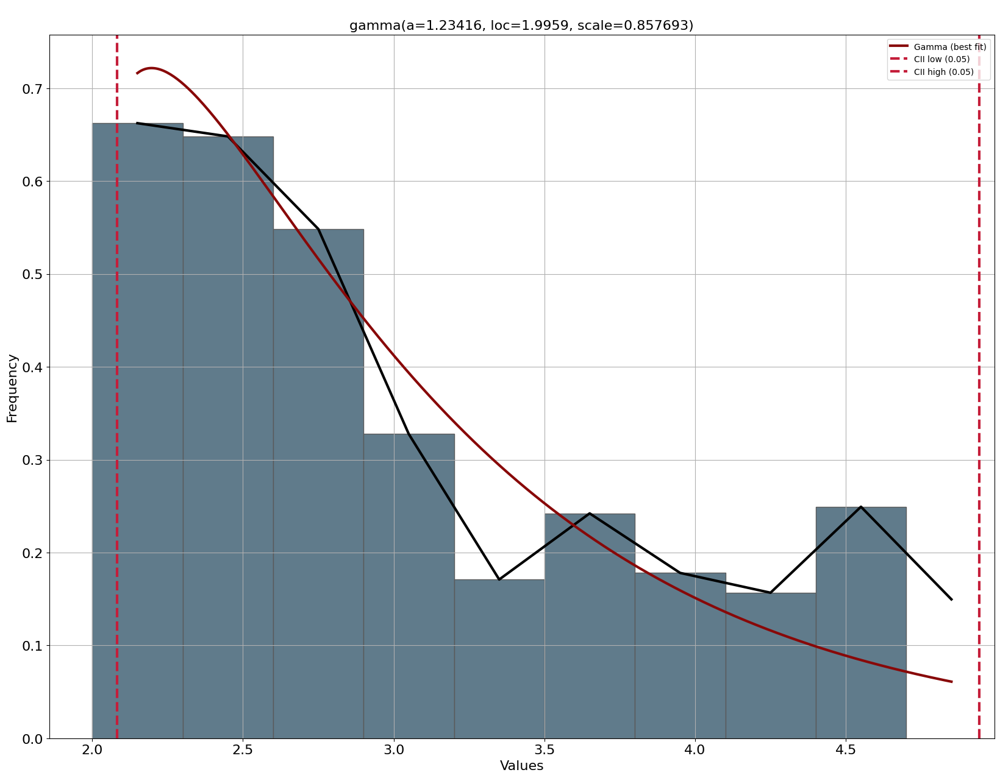

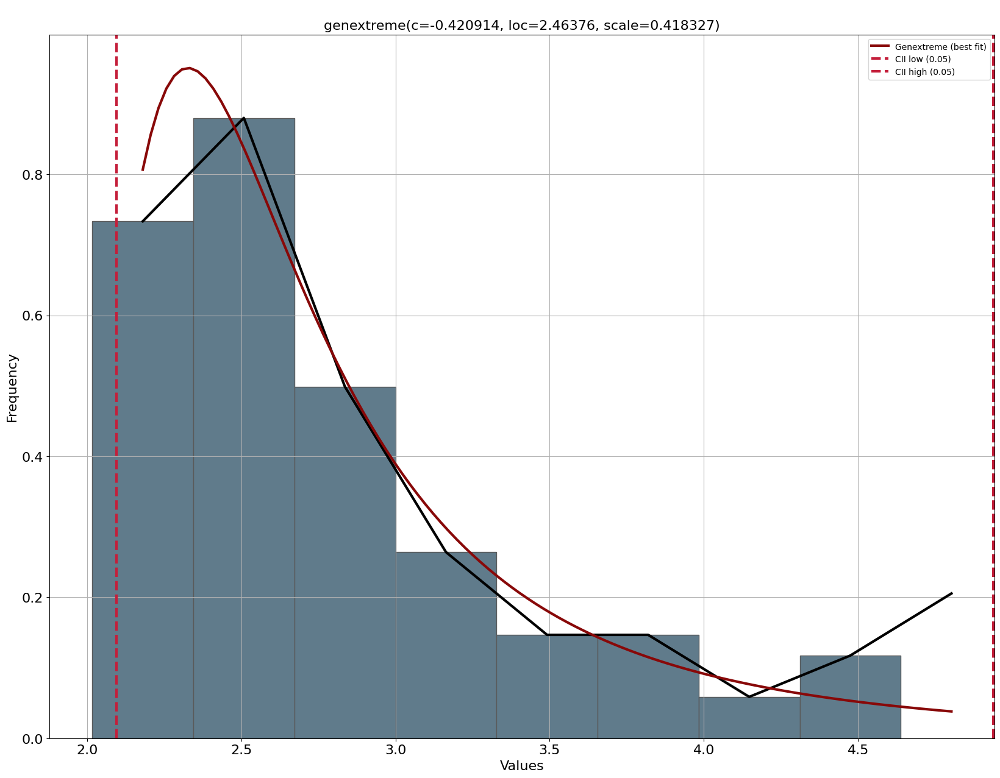

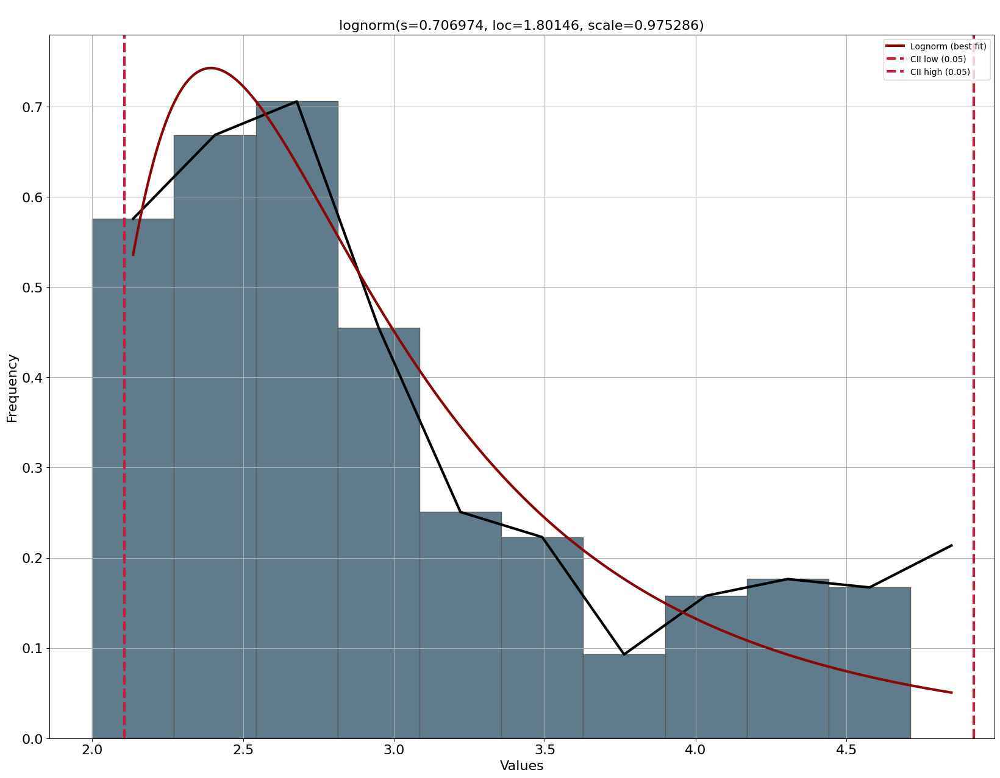

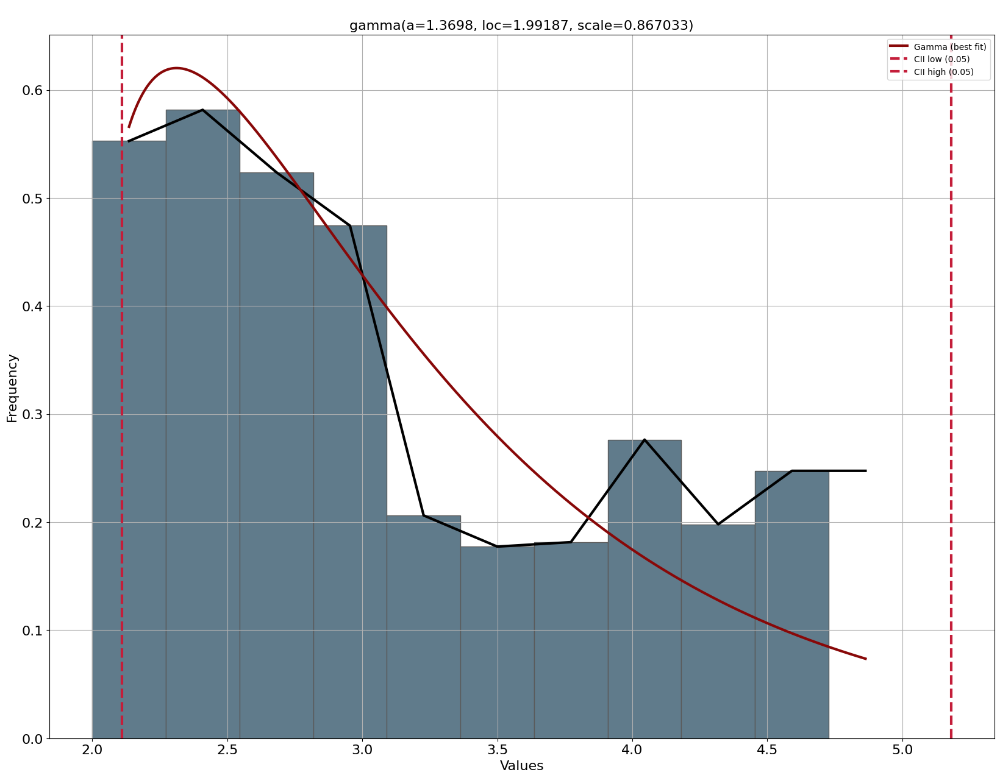

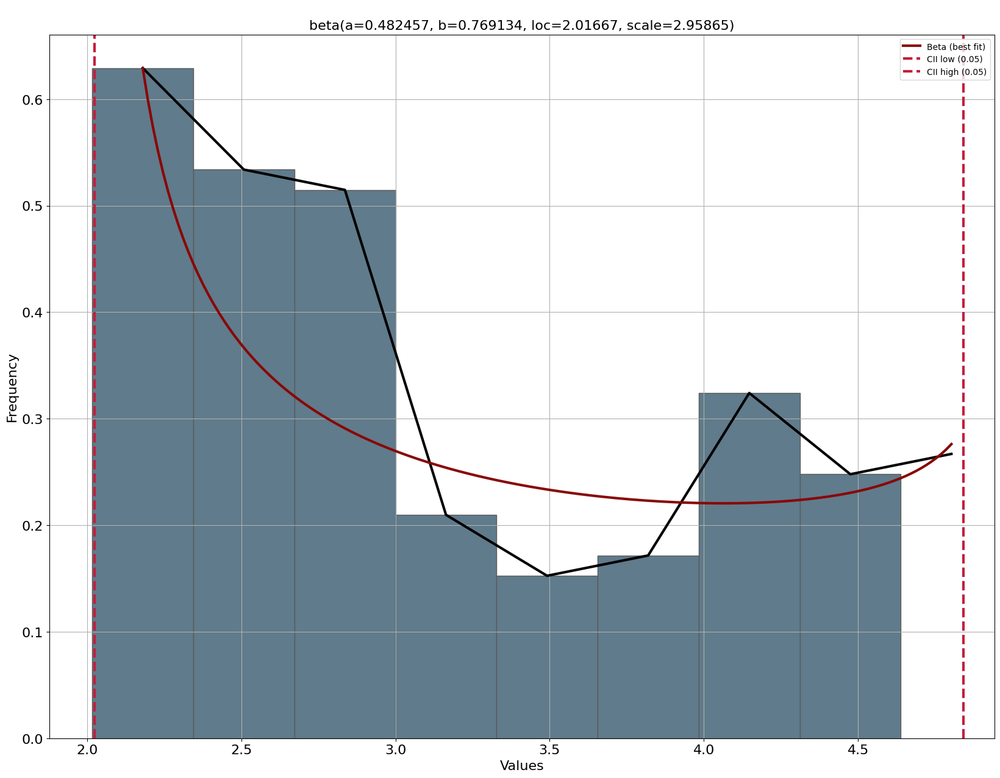

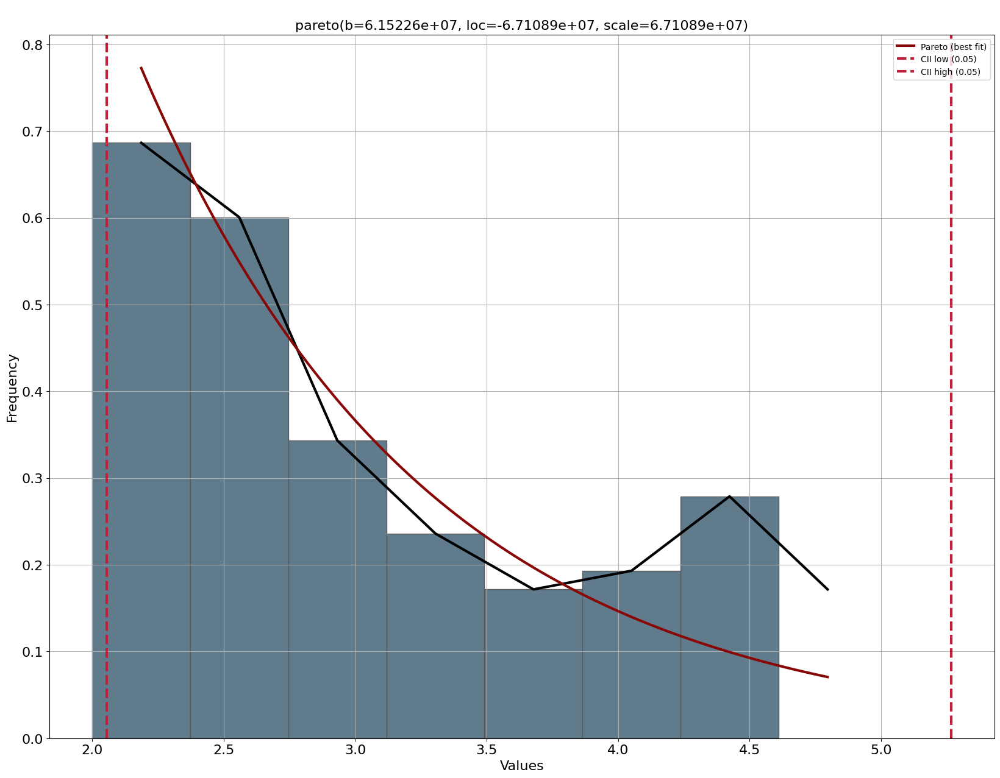

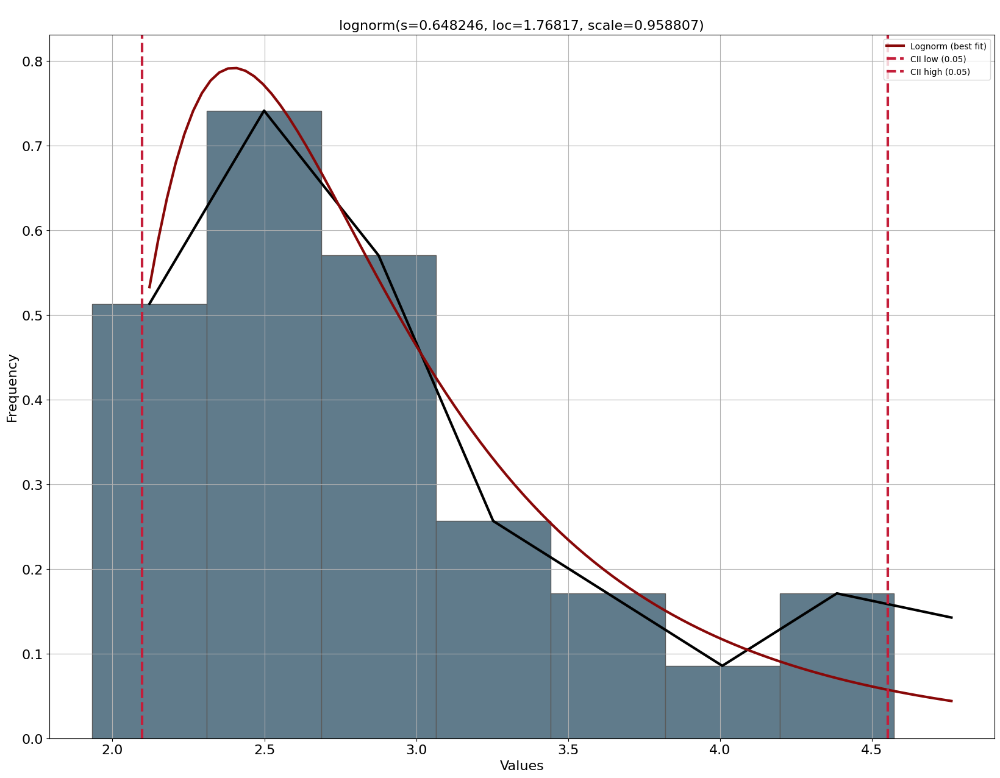

In [ ]:
filtro = [[0,2,18,23,21],
          [1],
          [3,8,10,13,7],
          [4,5,6,12,14,15,17,19,22],
          [9,11],
          [16],
          [20]]

base['h_llegada']=base['h_llegada'].astype(int)
filtros= base[(base['Valor-Triagge']=="Baja")]
# Filtrar la base cinco veces usando los arreglos de 'filtro'
for i, f in enumerate(filtro):
    filtrado = filtros[filtros['h_llegada'].isin(f)]
    print(f"Combinación {i+1}:")
    dfit = distfit()
    results2 = dfit.fit_transform(filtrado['TS-Triagge'])
    results2['summary'].to_excel("TS-Triagge_h"+str(i+1)+".xlsx")
    dfit.plot()
    print("\n")

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.319855] [loc=3.268 scale=0.911]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.177359] [loc=2.000 scale=1.268]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.177359] [loc=-67108862.000 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.01 sec] [RSS: 0.241803] [loc=3.438 scale=0.938]


Hora 4:


[distfit] >INFO> [t         ] [0.26 sec] [RSS: 0.319855] [loc=3.268 scale=0.911]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.21318] [loc=2.776 scale=0.644]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.158201] [loc=1.972 scale=0.782]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.185435] [loc=1.717 scale=1.281]
[distfit] >INFO> [beta      ] [0.09 sec] [RSS: 0.124042] [loc=2.000 scale=3.004]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.186943] [loc=2.000 scale=3.000]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.319216] [loc=-259.727 scale=35.861]
[distfit] >INFO> [norm      ] [0.53 sec] [RSS: 0.319855] [loc=3.268 scale=0.911]
[distfit] >INFO> [expon     ] [0.53 sec] [RSS: 0.177359] [loc=2.000 scale=1.268]
[distfit] >INFO> [pareto    ] [0.53 sec] [RSS: 0.177359] [loc=-67108862.000 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.53 sec] [RSS: 0.241803] [loc=3.438 scale=0.938]
[distfit] >INFO> [t         ] [0.51 sec] [RSS: 0.319855] [loc=3.268 scale=0.911]
[distfit] 



Hora 5:


[distfit] >INFO> [t         ] [0.33 sec] [RSS: 0.235535] [loc=3.235 scale=0.860]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.139731] [loc=2.828 scale=0.697]
[distfit] >INFO> [gamma     ] [0.05 sec] [RSS: 0.100079] [loc=1.980 scale=0.825]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.114233] [loc=1.344 scale=1.693]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.0875788] [loc=2.017 scale=2.910]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.14567] [loc=2.017 scale=2.900]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.231954] [loc=-219.365 scale=31.160]
[distfit] >INFO> [norm      ] [0.75 sec] [RSS: 0.235535] [loc=3.235 scale=0.860]
[distfit] >INFO> [expon     ] [0.75 sec] [RSS: 0.169148] [loc=2.017 scale=1.218]
[distfit] >INFO> [pareto    ] [0.75 sec] [RSS: 0.169148] [loc=-268435453.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.74 sec] [RSS: 0.203382] [loc=3.194 scale=0.824]
[distfit] >INFO> [t         ] [0.71 sec] [RSS: 0.235535] [loc=3.235 scale=0.860]
[distfi



Hora 6:


[distfit] >INFO> [t         ] [0.37 sec] [RSS: 0.34812] [loc=3.170 scale=0.859]
[distfit] >INFO> [genextreme] [0.06 sec] [RSS: 0.165016] [loc=2.699 scale=0.570]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.130112] [loc=1.993 scale=0.741]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.145992] [loc=1.786 scale=1.125]
[distfit] >INFO> [beta      ] [0.11 sec] [RSS: 0.165255] [loc=2.017 scale=2.984]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.277582] [loc=2.017 scale=2.933]
[distfit] >INFO> [loggamma  ] [0.08 sec] [RSS: 0.347925] [loc=-242.724 scale=33.670]
[distfit] >INFO> [norm      ] [0.76 sec] [RSS: 0.348118] [loc=3.170 scale=0.859]
[distfit] >INFO> [expon     ] [0.76 sec] [RSS: 0.164449] [loc=2.017 scale=1.154]
[distfit] >INFO> [pareto    ] [0.76 sec] [RSS: 0.164449] [loc=-67108861.983 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.75 sec] [RSS: 0.300692] [loc=2.966 scale=0.726]
[distfit] >INFO> [t         ] [0.70 sec] [RSS: 0.34812] [loc=3.170 scale=0.859]
[distfit] >



Hora 12:


[distfit] >INFO> [t         ] [0.39 sec] [RSS: 0.393776] [loc=3.108 scale=0.874]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.153264] [loc=2.600 scale=0.547]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.105099] [loc=2.013 scale=0.930]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.12396] [loc=1.851 scale=0.952]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.120894] [loc=2.017 scale=2.925]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.300931] [loc=2.017 scale=2.917]
[distfit] >INFO> [loggamma  ] [0.07 sec] [RSS: 0.394276] [loc=-188.418 scale=27.792]
[distfit] >INFO> [norm      ] [0.81 sec] [RSS: 0.393777] [loc=3.108 scale=0.874]
[distfit] >INFO> [expon     ] [0.80 sec] [RSS: 0.107951] [loc=2.017 scale=1.091]
[distfit] >INFO> [pareto    ] [0.80 sec] [RSS: 0.107951] [loc=-67108861.983 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.79 sec] [RSS: 0.338062] [loc=2.897 scale=0.759]
[distfit] >INFO> [t         ] [0.74 sec] [RSS: 0.393776] [loc=3.108 scale=0.874]
[distfit] 



Hora 14:


[distfit] >INFO> [t         ] [0.35 sec] [RSS: 0.34742] [loc=3.196 scale=0.899]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.134607] [loc=2.695 scale=0.607]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.104703] [loc=1.990 scale=0.853]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.109475] [loc=1.763 scale=1.150]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.162089] [loc=2.000 scale=2.983]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.2417] [loc=2.000 scale=2.983]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.345071] [loc=-287.192 scale=38.772]
[distfit] >INFO> [norm      ] [0.82 sec] [RSS: 0.347419] [loc=3.196 scale=0.899]
[distfit] >INFO> [expon     ] [0.81 sec] [RSS: 0.154369] [loc=2.000 scale=1.196]
[distfit] >INFO> [pareto    ] [0.81 sec] [RSS: 0.154369] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.79 sec] [RSS: 0.267917] [loc=3.180 scale=0.871]
[distfit] >INFO> [t         ] [0.74 sec] [RSS: 0.34742] [loc=3.196 scale=0.899]
[distfit] >



Hora 15:


[distfit] >INFO> [t         ] [0.41 sec] [RSS: 0.512596] [loc=3.061 scale=0.900]
[distfit] >INFO> [genextreme] [0.09 sec] [RSS: 0.133312] [loc=2.500 scale=0.496]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.0807159] [loc=2.000 scale=1.078]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.105963] [loc=1.905 scale=0.805]
[distfit] >INFO> [beta      ] [0.15 sec] [RSS: 0.13452] [loc=2.000 scale=2.952]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.400396] [loc=2.000 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.508517] [loc=-294.395 scale=39.537]
[distfit] >INFO> [norm      ] [0.94 sec] [RSS: 0.512595] [loc=3.061 scale=0.900]
[distfit] >INFO> [expon     ] [0.93 sec] [RSS: 0.0832421] [loc=2.000 scale=1.061]
[distfit] >INFO> [pareto    ] [0.92 sec] [RSS: 0.0832421] [loc=-67108862.000 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.92 sec] [RSS: 0.401672] [loc=3.379 scale=0.982]
[distfit] >INFO> [t         ] [0.86 sec] [RSS: 0.512596] [loc=3.061 scale=0.900]
[distfi



Hora 17:


[distfit] >INFO> [t         ] [0.41 sec] [RSS: 0.362014] [loc=3.142 scale=0.899]
[distfit] >INFO> [genextreme] [0.09 sec] [RSS: 0.117222] [loc=2.640 scale=0.599]
[distfit] >INFO> [gamma     ] [0.06 sec] [RSS: 0.141527] [loc=2.017 scale=1.142]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.0979792] [loc=1.761 scale=1.086]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.164197] [loc=2.017 scale=2.992]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.284216] [loc=2.017 scale=2.983]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.363954] [loc=-193.445 scale=28.482]
[distfit] >INFO> [norm      ] [0.83 sec] [RSS: 0.362014] [loc=3.142 scale=0.899]
[distfit] >INFO> [expon     ] [0.82 sec] [RSS: 0.13755] [loc=2.017 scale=1.126]
[distfit] >INFO> [pareto    ] [0.82 sec] [RSS: 0.13755] [loc=-268435453.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.80 sec] [RSS: 0.238261] [loc=3.378 scale=0.948]
[distfit] >INFO> [t         ] [0.74 sec] [RSS: 0.362014] [loc=3.142 scale=0.899]
[distfit



Hora 19:


[distfit] >INFO> [t         ] [0.26 sec] [RSS: 0.223942] [loc=3.234 scale=0.858]
[distfit] >INFO> [genextreme] [0.05 sec] [RSS: 0.158238] [loc=2.825 scale=0.689]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.0896312] [loc=1.971 scale=0.793]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.132593] [loc=1.366 scale=1.670]
[distfit] >INFO> [beta      ] [0.07 sec] [RSS: 0.0435565] [loc=2.017 scale=2.964]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.121643] [loc=2.017 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.220336] [loc=-278.466 scale=37.444]
[distfit] >INFO> [norm      ] [0.53 sec] [RSS: 0.223942] [loc=3.234 scale=0.858]
[distfit] >INFO> [expon     ] [0.53 sec] [RSS: 0.120068] [loc=2.017 scale=1.218]
[distfit] >INFO> [pareto    ] [0.53 sec] [RSS: 0.120068] [loc=-67108861.983 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.52 sec] [RSS: 0.155243] [loc=3.232 scale=0.836]
[distfit] >INFO> [t         ] [0.50 sec] [RSS: 0.223942] [loc=3.234 scale=0.858]
[distfi



Hora 22:


[distfit] >INFO> [t         ] [0.24 sec] [RSS: 0.240673] [loc=3.274 scale=0.857]
[distfit] >INFO> [genextreme] [0.05 sec] [RSS: 0.151145] [loc=2.857 scale=0.681]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.0801832] [loc=2.021 scale=0.787]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.12043] [loc=1.530 scale=1.530]
[distfit] >INFO> [beta      ] [0.09 sec] [RSS: 0.052117] [loc=2.050 scale=2.958]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.131995] [loc=2.050 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.23542] [loc=-170.203 scale=25.688]
[distfit] >INFO> [norm      ] [0.56 sec] [RSS: 0.240669] [loc=3.274 scale=0.857]
[distfit] >INFO> [expon     ] [0.56 sec] [RSS: 0.107239] [loc=2.050 scale=1.224]
[distfit] >INFO> [pareto    ] [0.56 sec] [RSS: 0.107239] [loc=-536870909.950 scale=536870912.000]
[distfit] >INFO> [dweibull  ] [0.54 sec] [RSS: 0.238894] [loc=3.562 scale=0.916]
[distfit] >INFO> [t         ] [0.50 sec] [RSS: 0.240673] [loc=3.274 scale=0.857]
[distfit



Hora 9:


[distfit] >INFO> [t         ] [0.24 sec] [RSS: 0.455747] [loc=3.141 scale=0.880]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.286388] [loc=2.638 scale=0.592]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.151692] [loc=2.032 scale=1.055]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.216889] [loc=1.861 scale=0.958]
[distfit] >INFO> [beta      ] [0.06 sec] [RSS: 0.134637] [loc=2.033 scale=2.933]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.324265] [loc=2.033 scale=2.933]
[distfit] >INFO> [loggamma  ] [0.04 sec] [RSS: 0.453055] [loc=-273.872 scale=37.154]
[distfit] >INFO> [norm      ] [0.51 sec] [RSS: 0.455746] [loc=3.141 scale=0.880]
[distfit] >INFO> [expon     ] [0.51 sec] [RSS: 0.146817] [loc=2.033 scale=1.108]
[distfit] >INFO> [pareto    ] [0.51 sec] [RSS: 0.146817] [loc=-33554429.967 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [0.51 sec] [RSS: 0.370015] [loc=3.385 scale=0.933]
[distfit] >INFO> [t         ] [0.48 sec] [RSS: 0.455747] [loc=3.141 scale=0.880]
[distfit]



Hora 11:


[distfit] >INFO> [t         ] [0.48 sec] [RSS: 0.373017] [loc=3.243 scale=0.931]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.240062] [loc=2.725 scale=0.661]
[distfit] >INFO> [gamma     ] [0.04 sec] [RSS: 0.136435] [loc=2.011 scale=1.013]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.187029] [loc=1.772 scale=1.159]
[distfit] >INFO> [beta      ] [0.12 sec] [RSS: 0.0596766] [loc=2.016 scale=2.951]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.188034] [loc=2.017 scale=2.950]
[distfit] >INFO> [loggamma  ] [0.10 sec] [RSS: 0.369062] [loc=-301.715 scale=40.563]
[distfit] >INFO> [norm      ] [0.92 sec] [RSS: 0.373018] [loc=3.243 scale=0.931]
[distfit] >INFO> [expon     ] [0.92 sec] [RSS: 0.128119] [loc=2.017 scale=1.227]
[distfit] >INFO> [pareto    ] [0.92 sec] [RSS: 0.128119] [loc=-268435453.983 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.91 sec] [RSS: 0.194402] [loc=3.464 scale=0.981]
[distfit] >INFO> [t         ] [0.89 sec] [RSS: 0.373017] [loc=3.243 scale=0.931]
[distf

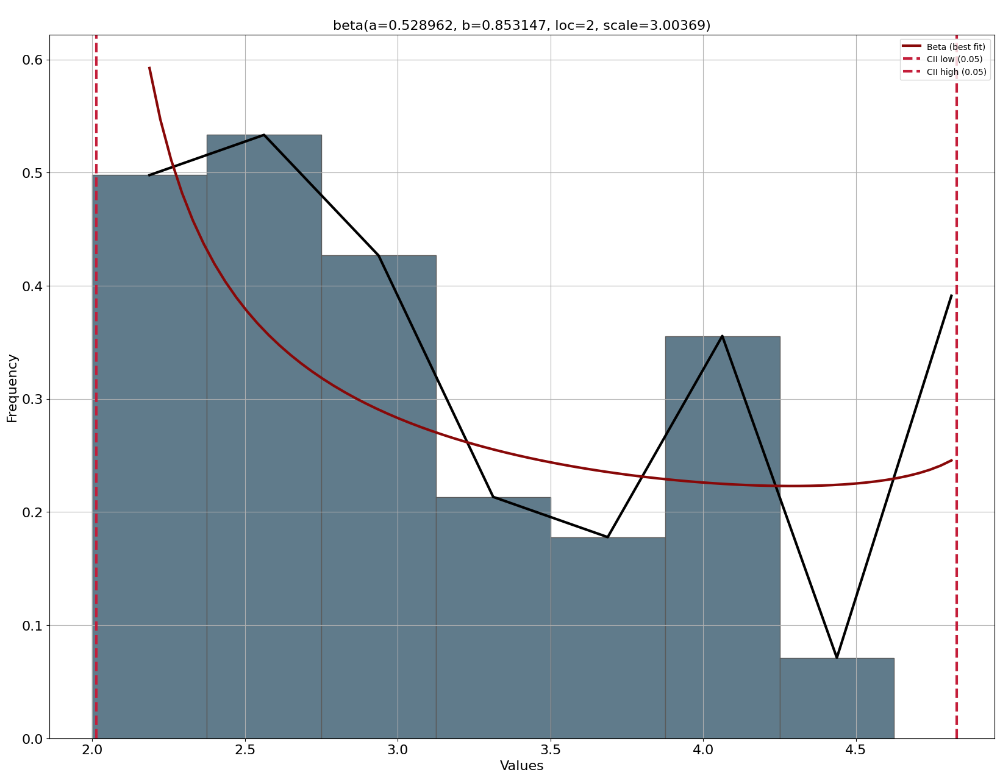

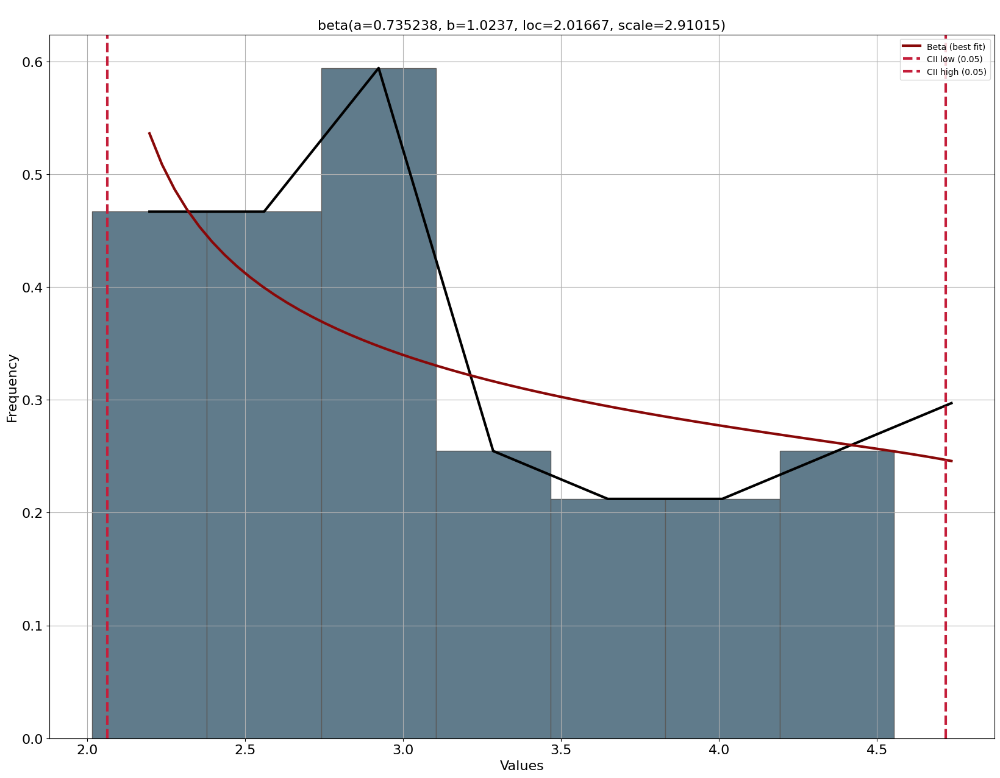

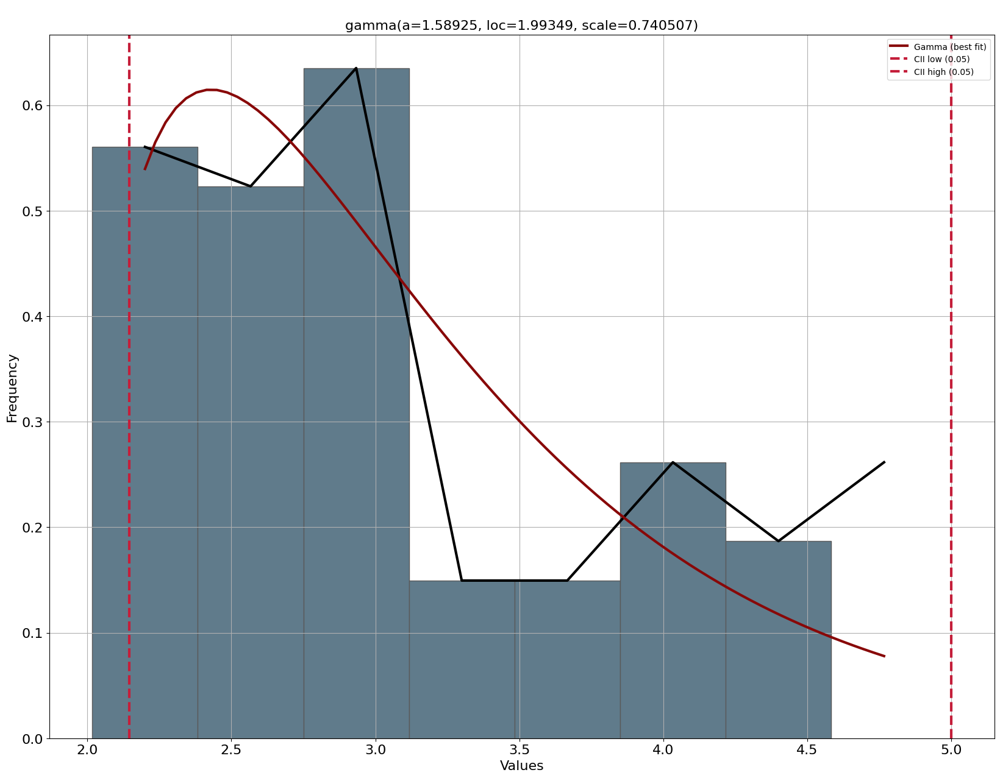

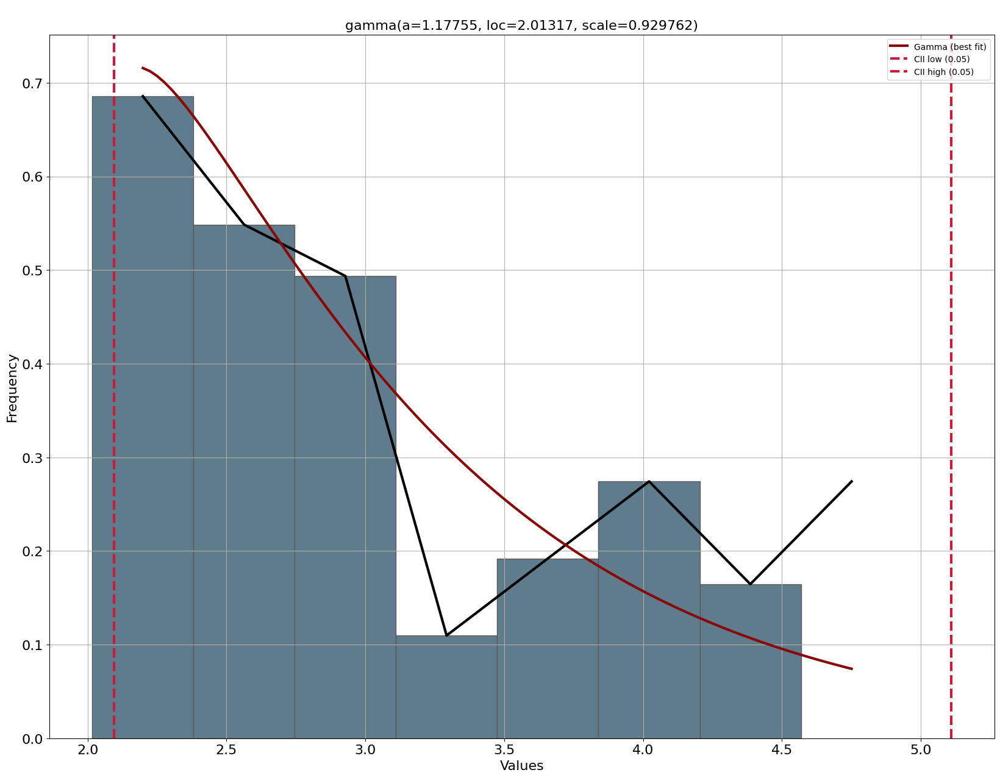

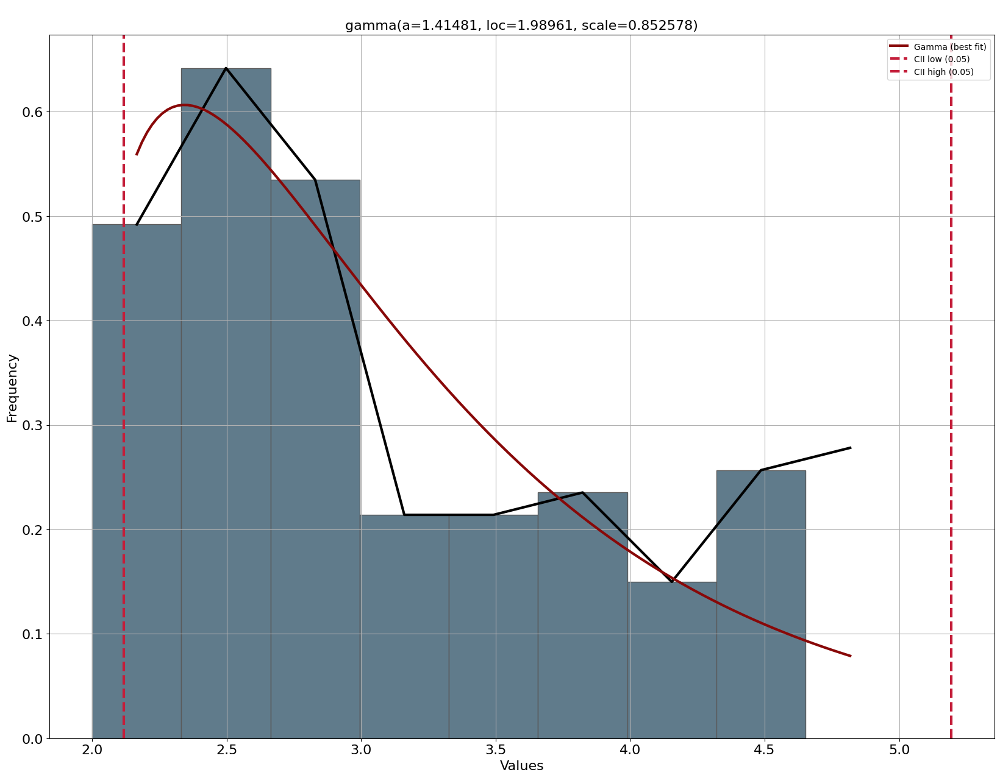

...

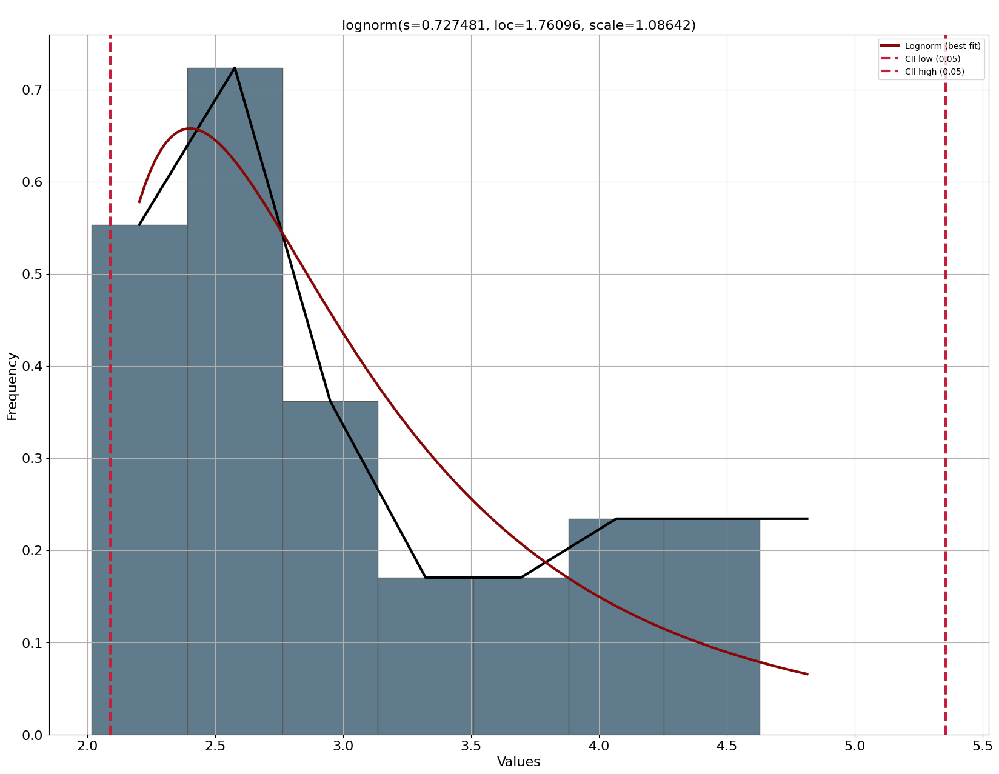

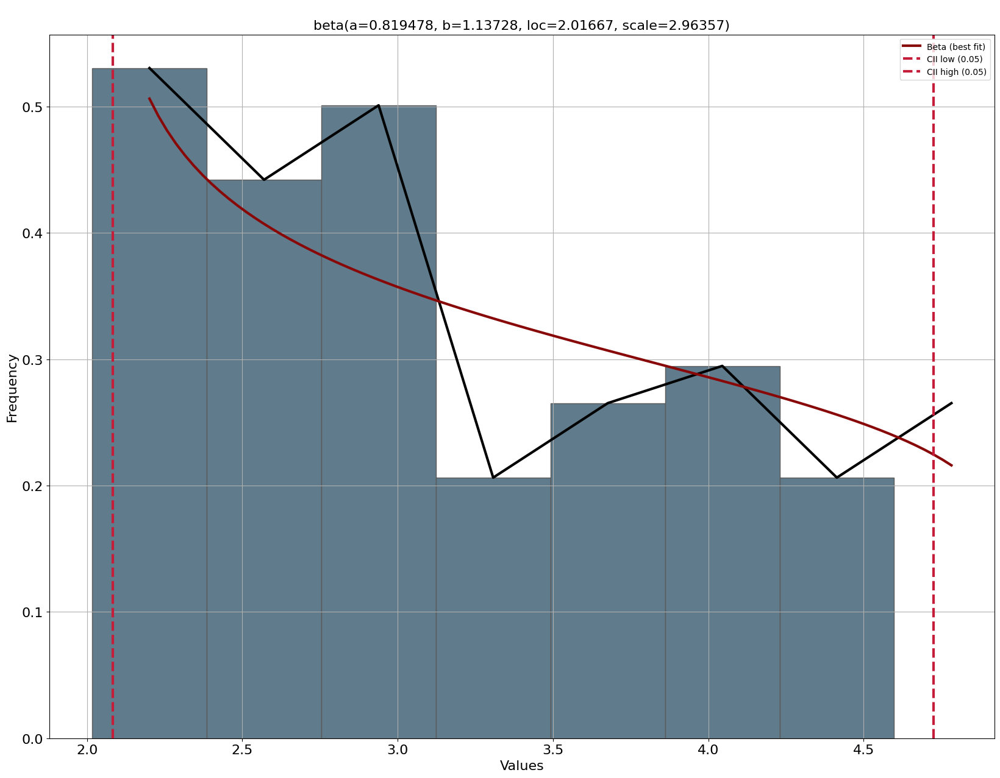

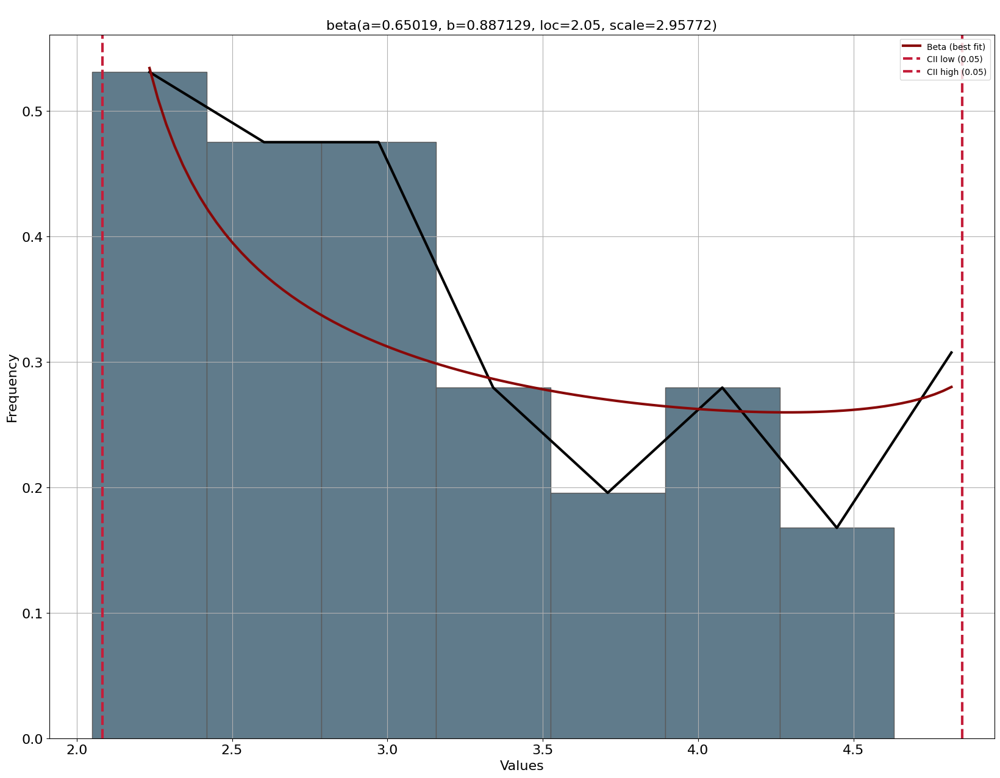

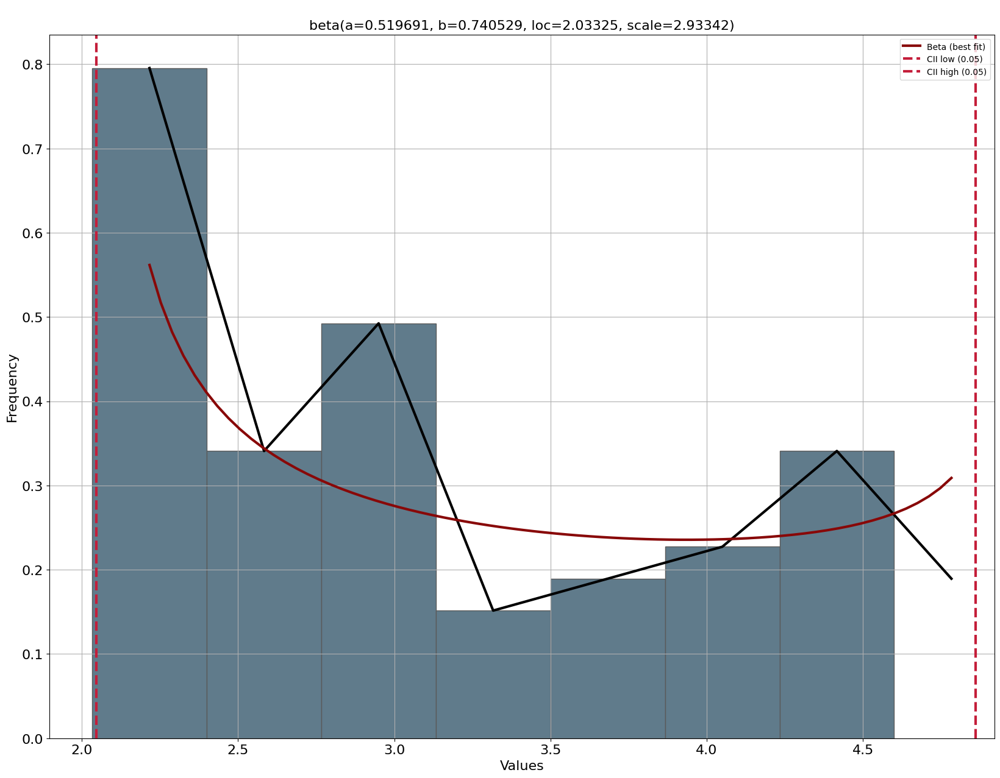

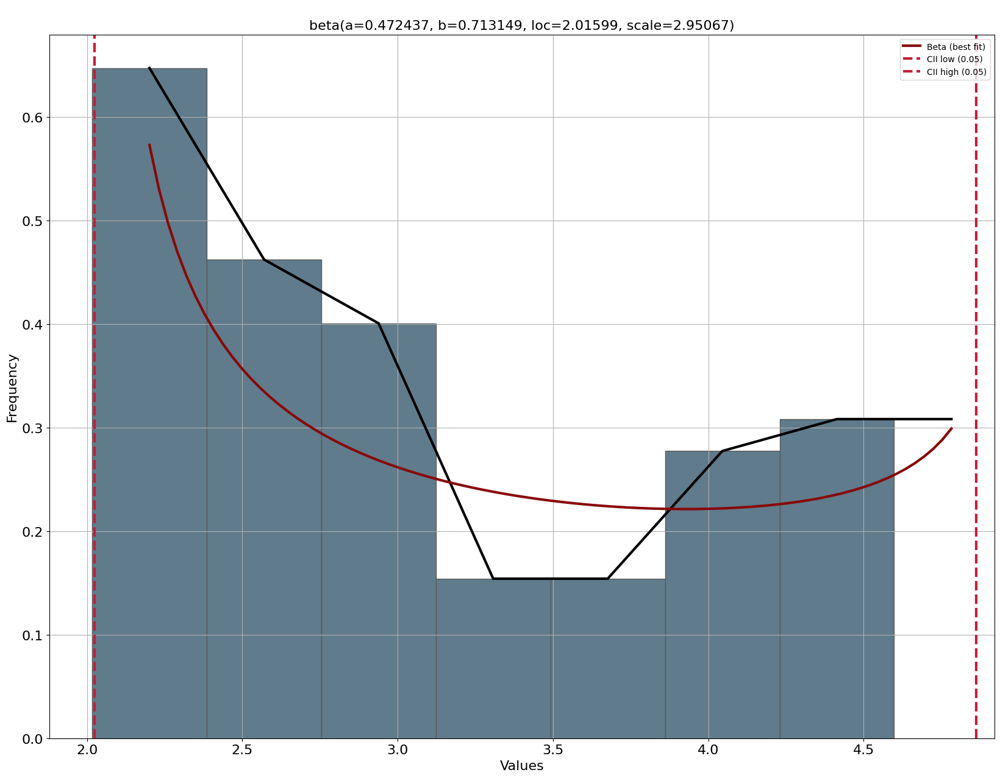

In [ ]:
filtro=[4,5,6,12,14,15,17,19,22,9,11]

base['h_llegada']=base['h_llegada'].astype(int)
filtros= base[(base['Valor-Triagge']=="Baja")]
# Filtrar la base cinco veces usando los arreglos de 'filtro'
for i in filtro:
    filtrado = filtros[(filtros['h_llegada']==i)]
    print(f"Hora {i}:")
    dfit = distfit()
    results2 = dfit.fit_transform(filtrado['TS-Triagge'])
    results2['summary'].to_excel("TS-Triagge_H"+str(i+1)+".xlsx")
    dfit.plot()
    print("\n")

#Para Valor triagge ALTA


[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 0.648311] [loc=1.442 scale=0.718]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 0.317161] [loc=0.500 scale=0.942]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 0.317161] [loc=-33554431.500 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 0.458384] [loc=1.259 scale=0.590]


Combinación 1:


[distfit] >INFO> [t         ] [1.02 sec] [RSS: 0.648312] [loc=1.442 scale=0.718]
[distfit] >INFO> [genextreme] [0.11 sec] [RSS: 0.234052] [loc=1.051 scale=0.472]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.198666] [loc=0.492 scale=0.660]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.207114] [loc=0.298 scale=0.928]
[distfit] >INFO> [beta      ] [0.17 sec] [RSS: 0.282718] [loc=0.500 scale=2.581]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.566107] [loc=0.500 scale=2.500]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.64713] [loc=-223.808 scale=30.277]
[distfit] >INFO> [norm      ] [1.55 sec] [RSS: 0.648311] [loc=1.442 scale=0.718]
[distfit] >INFO> [expon     ] [1.55 sec] [RSS: 0.317161] [loc=0.500 scale=0.942]
[distfit] >INFO> [pareto    ] [1.55 sec] [RSS: 0.317161] [loc=-33554431.500 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [1.54 sec] [RSS: 0.458384] [loc=1.259 scale=0.590]
[distfit] >INFO> [t         ] [1.49 sec] [RSS: 0.648312] [loc=1.442 scale=0.718]
[distfit] 



Combinación 2:


[distfit] >INFO> [t         ] [0.46 sec] [RSS: 0.633631] [loc=1.389 scale=0.691]
[distfit] >INFO> [genextreme] [0.08 sec] [RSS: 0.254529] [loc=1.012 scale=0.452]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.220003] [loc=0.496 scale=0.664]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.229196] [loc=0.321 scale=0.852]
[distfit] >INFO> [beta      ] [0.15 sec] [RSS: 0.269961] [loc=0.500 scale=2.507]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.607787] [loc=0.500 scale=2.450]
[distfit] >INFO> [loggamma  ] [0.09 sec] [RSS: 0.63567] [loc=-180.353 scale=25.301]
[distfit] >INFO> [norm      ] [0.92 sec] [RSS: 0.633631] [loc=1.389 scale=0.691]
[distfit] >INFO> [expon     ] [0.92 sec] [RSS: 0.278529] [loc=0.500 scale=0.889]
[distfit] >INFO> [pareto    ] [0.91 sec] [RSS: 0.278529] [loc=-67108863.500 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.91 sec] [RSS: 0.417977] [loc=1.208 scale=0.549]
[distfit] >INFO> [t         ] [0.87 sec] [RSS: 0.633631] [loc=1.389 scale=0.691]
[distfit] 



Combinación 3:


[distfit] >INFO> [t         ] [0.43 sec] [RSS: 0.722162] [loc=1.533 scale=0.746]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.454665] [loc=1.136 scale=0.540]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.381529] [loc=0.494 scale=0.694]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.415449] [loc=0.240 scale=1.074]
[distfit] >INFO> [beta      ] [0.06 sec] [RSS: 0.611036] [loc=0.267 scale=2.733]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.496038] [loc=0.500 scale=2.500]
[distfit] >INFO> [loggamma  ] [0.06 sec] [RSS: 0.716117] [loc=-185.734 scale=26.393]
[distfit] >INFO> [norm      ] [0.75 sec] [RSS: 0.722162] [loc=1.533 scale=0.746]
[distfit] >INFO> [expon     ] [0.75 sec] [RSS: 0.460259] [loc=0.500 scale=1.033]
[distfit] >INFO> [pareto    ] [0.74 sec] [RSS: 0.460259] [loc=-67108863.500 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.73 sec] [RSS: 0.788518] [loc=1.390 scale=0.661]
[distfit] >INFO> [t         ] [0.70 sec] [RSS: 0.722162] [loc=1.533 scale=0.746]
[distfit]



Combinación 4:


[distfit] >INFO> [t         ] [0.26 sec] [RSS: 0.75486] [loc=1.503 scale=0.815]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.333033] [loc=1.028 scale=0.520]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 0.52809] [loc=0.517 scale=1.665]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.291408] [loc=0.327 scale=0.886]
[distfit] >INFO> [beta      ] [0.05 sec] [RSS: 0.533396] [loc=0.434 scale=2.550]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.493612] [loc=0.517 scale=2.467]
[distfit] >INFO> [loggamma  ] [0.04 sec] [RSS: 0.743811] [loc=-259.488 scale=34.945]
[distfit] >INFO> [norm      ] [0.57 sec] [RSS: 0.754859] [loc=1.503 scale=0.815]
[distfit] >INFO> [expon     ] [0.57 sec] [RSS: 0.290702] [loc=0.517 scale=0.986]
[distfit] >INFO> [pareto    ] [0.56 sec] [RSS: 0.290702] [loc=-67108863.483 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.55 sec] [RSS: 0.689952] [loc=1.384 scale=0.739]
[distfit] >INFO> [t         ] [0.52 sec] [RSS: 0.75486] [loc=1.503 scale=0.815]
[distfit] >I



Combinación 5:


[distfit] >INFO> [t         ] [0.23 sec] [RSS: 0.76745] [loc=1.382 scale=0.709]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.244189] [loc=0.985 scale=0.423]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.279338] [loc=0.531 scale=0.751]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.24221] [loc=0.400 scale=0.742]
[distfit] >INFO> [beta      ] [0.05 sec] [RSS: 0.651471] [loc=0.410 scale=2.407]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.667386] [loc=0.533 scale=2.283]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.767694] [loc=-198.108 scale=27.477]
[distfit] >INFO> [norm      ] [0.54 sec] [RSS: 0.76745] [loc=1.382 scale=0.709]
[distfit] >INFO> [expon     ] [0.53 sec] [RSS: 0.297847] [loc=0.533 scale=0.848]
[distfit] >INFO> [pareto    ] [0.52 sec] [RSS: 0.297847] [loc=-33554431.467 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [0.52 sec] [RSS: 0.415826] [loc=1.100 scale=0.566]
[distfit] >INFO> [t         ] [0.44 sec] [RSS: 0.76745] [loc=1.382 scale=0.709]
[distfit] >IN



Combinación 6:


[distfit] >INFO> [t         ] [0.32 sec] [RSS: 0.968592] [loc=1.334 scale=0.708]
[distfit] >INFO> [genextreme] [0.06 sec] [RSS: 0.367415] [loc=0.933 scale=0.397]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.243919] [loc=0.498 scale=0.691]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.29759] [loc=0.399 scale=0.691]
[distfit] >INFO> [beta      ] [0.05 sec] [RSS: 0.96202] [loc=0.313 scale=2.687]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.98625] [loc=0.500 scale=2.500]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.981756] [loc=-185.653 scale=25.991]
[distfit] >INFO> [norm      ] [0.60 sec] [RSS: 0.968593] [loc=1.334 scale=0.708]
[distfit] >INFO> [expon     ] [0.60 sec] [RSS: 0.242002] [loc=0.500 scale=0.834]
[distfit] >INFO> [pareto    ] [0.60 sec] [RSS: 0.242002] [loc=-33554431.500 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [0.59 sec] [RSS: 0.690876] [loc=1.140 scale=0.537]
[distfit] >INFO> [t         ] [0.57 sec] [RSS: 0.968592] [loc=1.334 scale=0.708]
[distfit] >I



Combinación 7:


[distfit] >INFO> [t         ] [0.27 sec] [RSS: 0.612155] [loc=1.505 scale=0.698]
[distfit] >INFO> [genextreme] [0.07 sec] [RSS: 0.381736] [loc=1.149 scale=0.508]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.36199] [loc=0.474 scale=0.559]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.374929] [loc=0.171 scale=1.157]
[distfit] >INFO> [beta      ] [0.10 sec] [RSS: 0.384303] [loc=0.500 scale=2.602]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.516547] [loc=0.500 scale=2.483]
[distfit] >INFO> [loggamma  ] [0.06 sec] [RSS: 0.616489] [loc=-158.989 scale=22.990]
[distfit] >INFO> [norm      ] [0.61 sec] [RSS: 0.612155] [loc=1.505 scale=0.698]
[distfit] >INFO> [expon     ] [0.60 sec] [RSS: 0.50702] [loc=0.500 scale=1.005]
[distfit] >INFO> [pareto    ] [0.60 sec] [RSS: 0.50702] [loc=-134217727.500 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.59 sec] [RSS: 0.417219] [loc=1.311 scale=0.564]
[distfit] >INFO> [t         ] [0.57 sec] [RSS: 0.612155] [loc=1.505 scale=0.698]
[distfit] 



Combinación 8:


[distfit] >INFO> [t         ] [0.29 sec] [RSS: 0.701511] [loc=1.455 scale=0.718]
[distfit] >INFO> [genextreme] [0.06 sec] [RSS: 0.324489] [loc=1.068 scale=0.494]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.304657] [loc=0.482 scale=0.676]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.300137] [loc=0.244 scale=1.002]
[distfit] >INFO> [beta      ] [0.11 sec] [RSS: 0.363037] [loc=0.500 scale=2.551]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.592884] [loc=0.500 scale=2.500]
[distfit] >INFO> [loggamma  ] [0.06 sec] [RSS: 0.698531] [loc=-220.481 scale=29.894]
[distfit] >INFO> [norm      ] [0.63 sec] [RSS: 0.70151] [loc=1.455 scale=0.718]
[distfit] >INFO> [expon     ] [0.63 sec] [RSS: 0.421275] [loc=0.500 scale=0.955]
[distfit] >INFO> [pareto    ] [0.63 sec] [RSS: 0.421275] [loc=-67108863.500 scale=67108864.000]
[distfit] >INFO> [dweibull  ] [0.62 sec] [RSS: 0.533313] [loc=1.257 scale=0.611]
[distfit] >INFO> [t         ] [0.59 sec] [RSS: 0.701511] [loc=1.455 scale=0.718]
[distfit] 



Combinación 9:


[distfit] >INFO> [t         ] [0.28 sec] [RSS: 0.669331] [loc=1.489 scale=0.741]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.363466] [loc=1.083 scale=0.498]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 0.343721] [loc=0.524 scale=0.755]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.343805] [loc=0.311 scale=0.947]
[distfit] >INFO> [beta      ] [0.05 sec] [RSS: 0.51113] [loc=0.396 scale=2.604]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.549955] [loc=0.533 scale=2.467]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.675526] [loc=-242.781 scale=32.392]
[distfit] >INFO> [norm      ] [0.52 sec] [RSS: 0.66933] [loc=1.489 scale=0.741]
[distfit] >INFO> [expon     ] [0.52 sec] [RSS: 0.387173] [loc=0.533 scale=0.956]
[distfit] >INFO> [pareto    ] [0.51 sec] [RSS: 0.387173] [loc=-268435455.467 scale=268435456.000]
[distfit] >INFO> [dweibull  ] [0.51 sec] [RSS: 0.478472] [loc=1.276 scale=0.605]
[distfit] >INFO> [t         ] [0.49 sec] [RSS: 0.669331] [loc=1.489 scale=0.741]
[distfit]



Combinación 10:


[distfit] >INFO> [t         ] [0.25 sec] [RSS: 0.511787] [loc=1.424 scale=0.665]
[distfit] >INFO> [genextreme] [0.04 sec] [RSS: 0.274447] [loc=1.089 scale=0.460]
[distfit] >INFO> [gamma     ] [0.03 sec] [RSS: 0.262109] [loc=0.456 scale=0.504]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 0.267611] [loc=0.191 scale=1.068]
[distfit] >INFO> [beta      ] [0.08 sec] [RSS: 0.371266] [loc=0.500 scale=2.498]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.570561] [loc=0.500 scale=2.450]
[distfit] >INFO> [loggamma  ] [0.05 sec] [RSS: 0.517004] [loc=-175.435 scale=24.529]
[distfit] >INFO> [norm      ] [0.59 sec] [RSS: 0.511789] [loc=1.424 scale=0.665]
[distfit] >INFO> [expon     ] [0.59 sec] [RSS: 0.42275] [loc=0.500 scale=0.924]
[distfit] >INFO> [pareto    ] [0.58 sec] [RSS: 0.42275] [loc=-33554431.500 scale=33554432.000]
[distfit] >INFO> [dweibull  ] [0.57 sec] [RSS: 0.260799] [loc=1.233 scale=0.494]
[distfit] >INFO> [t         ] [0.50 sec] [RSS: 0.511787] [loc=1.424 scale=0.665]
[distfit] >

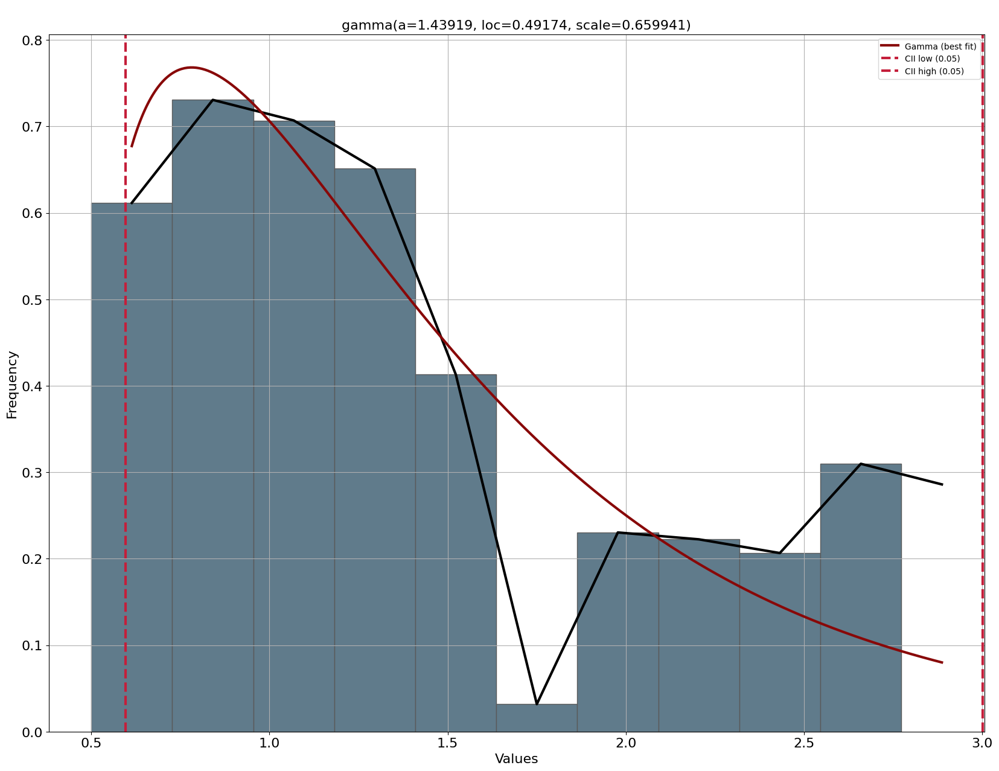

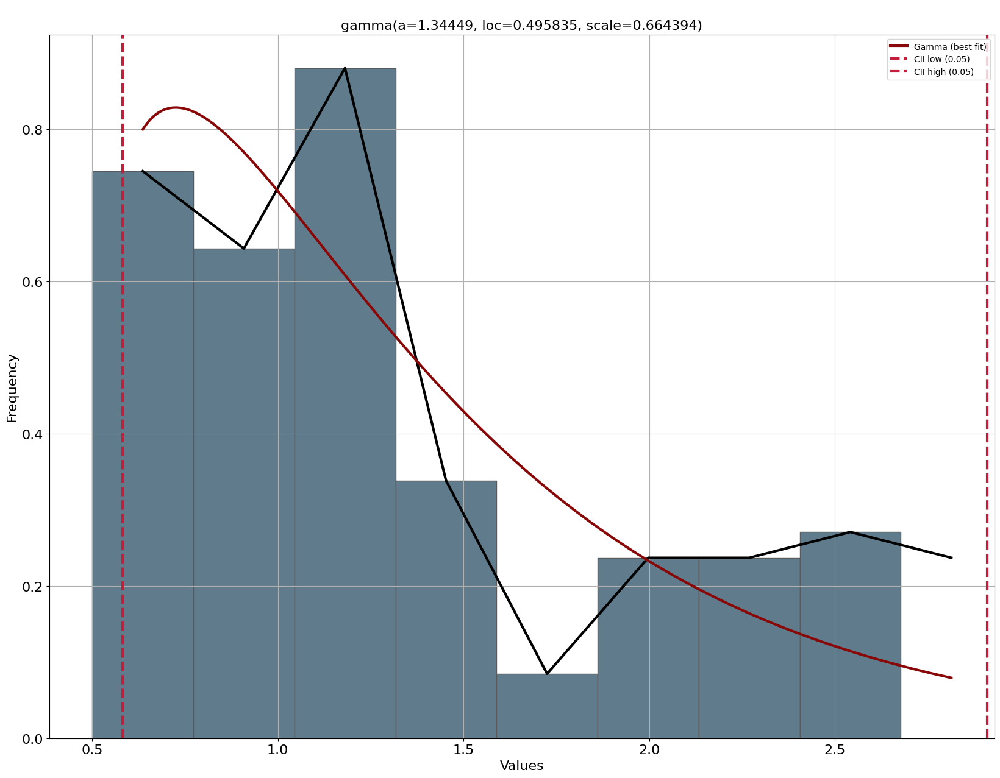

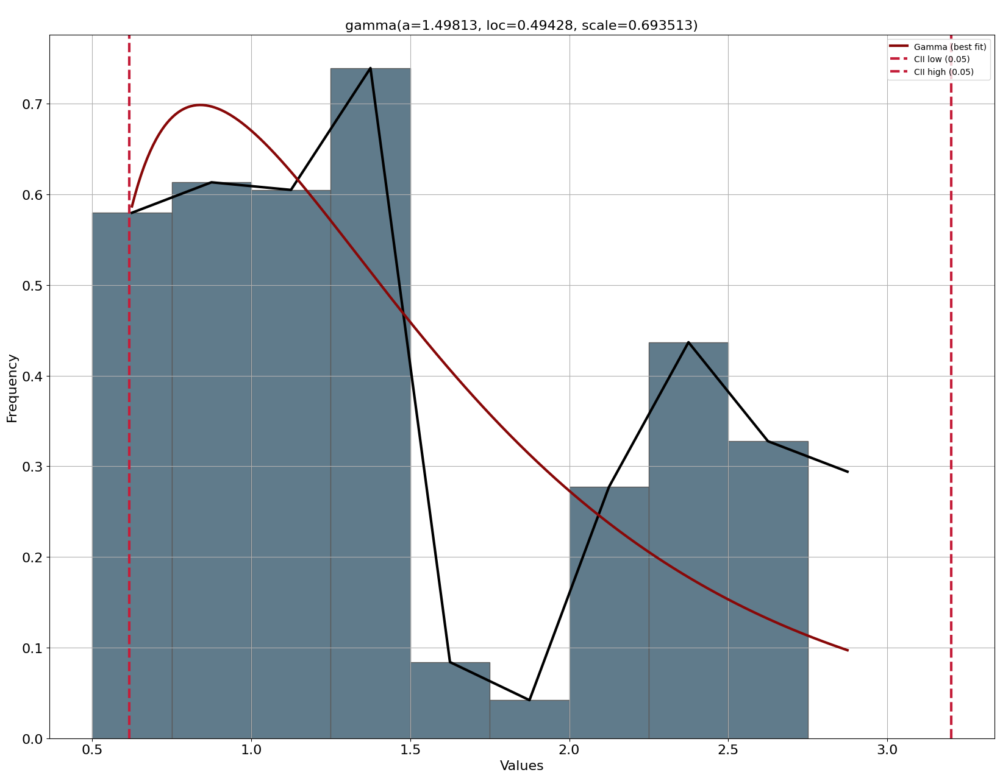

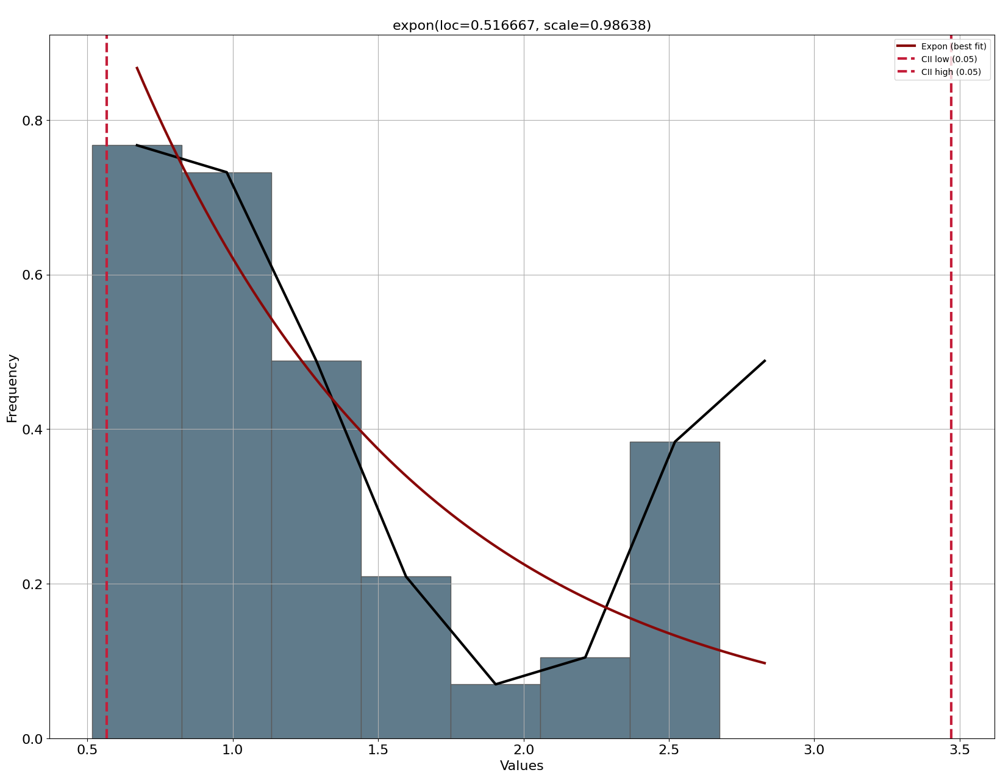

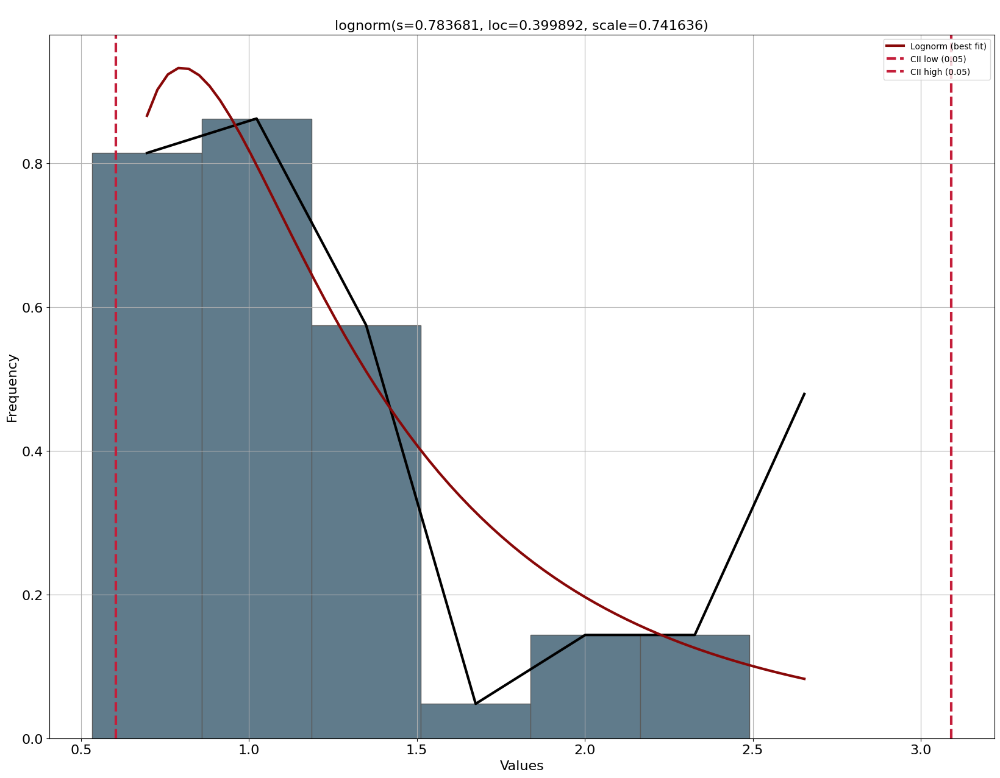

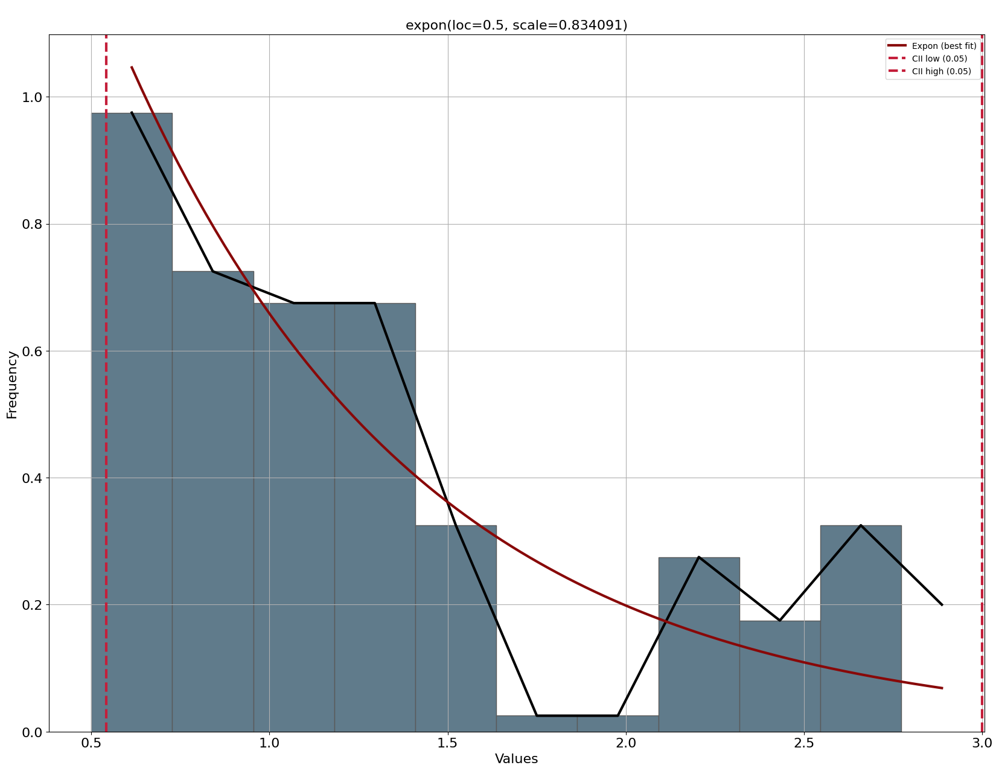

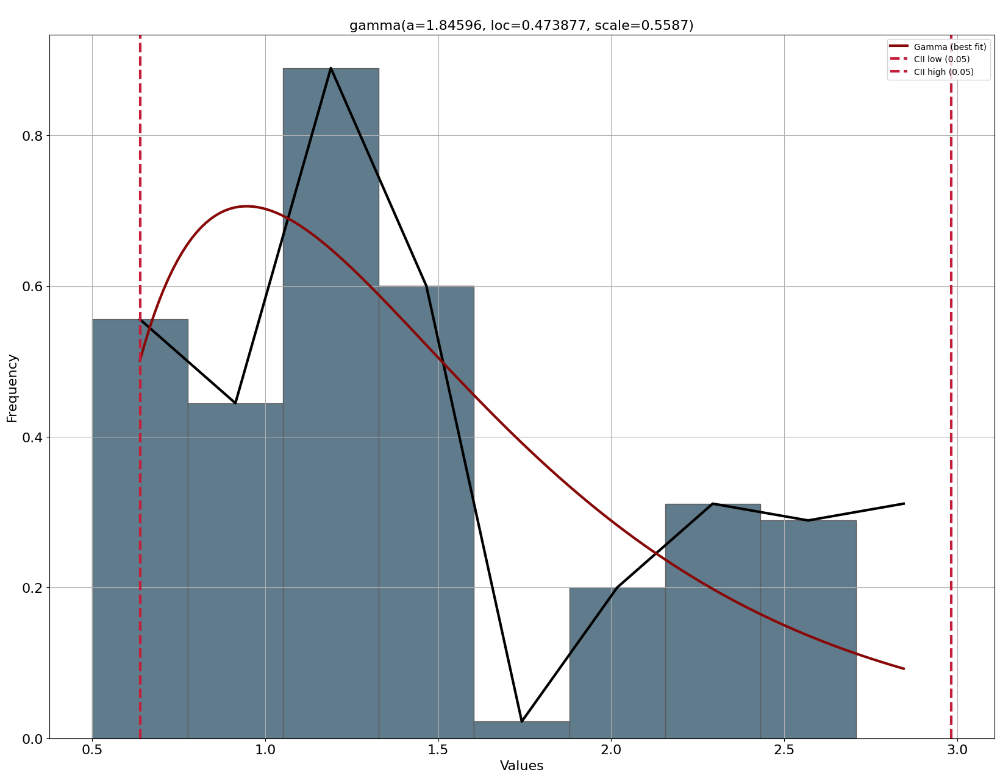

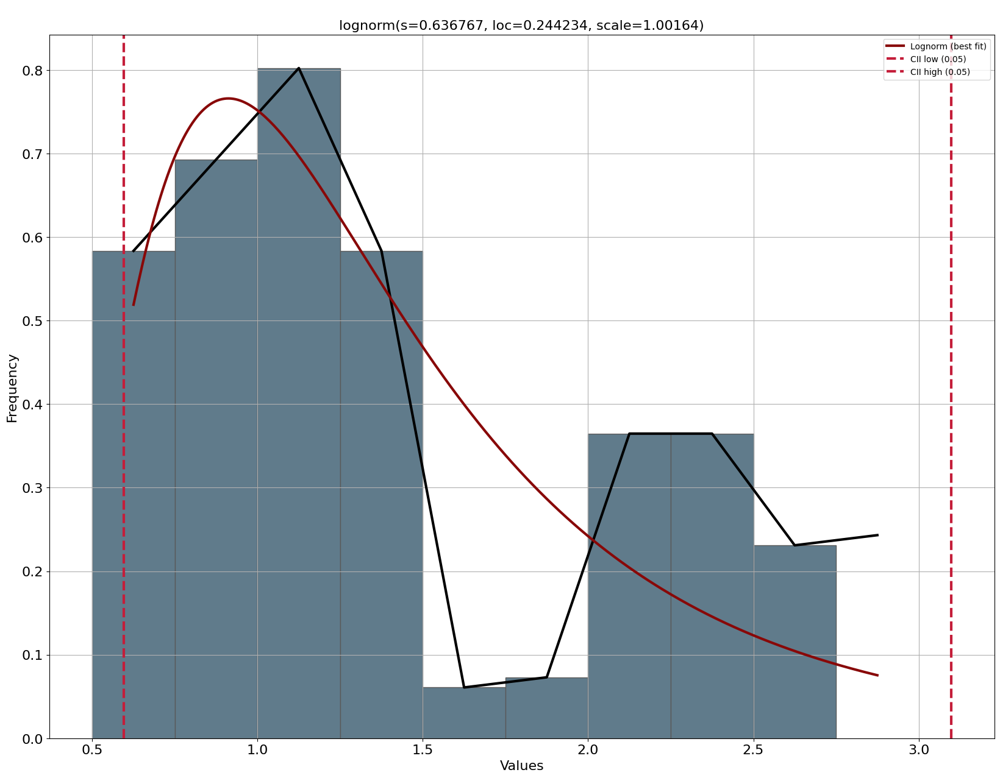

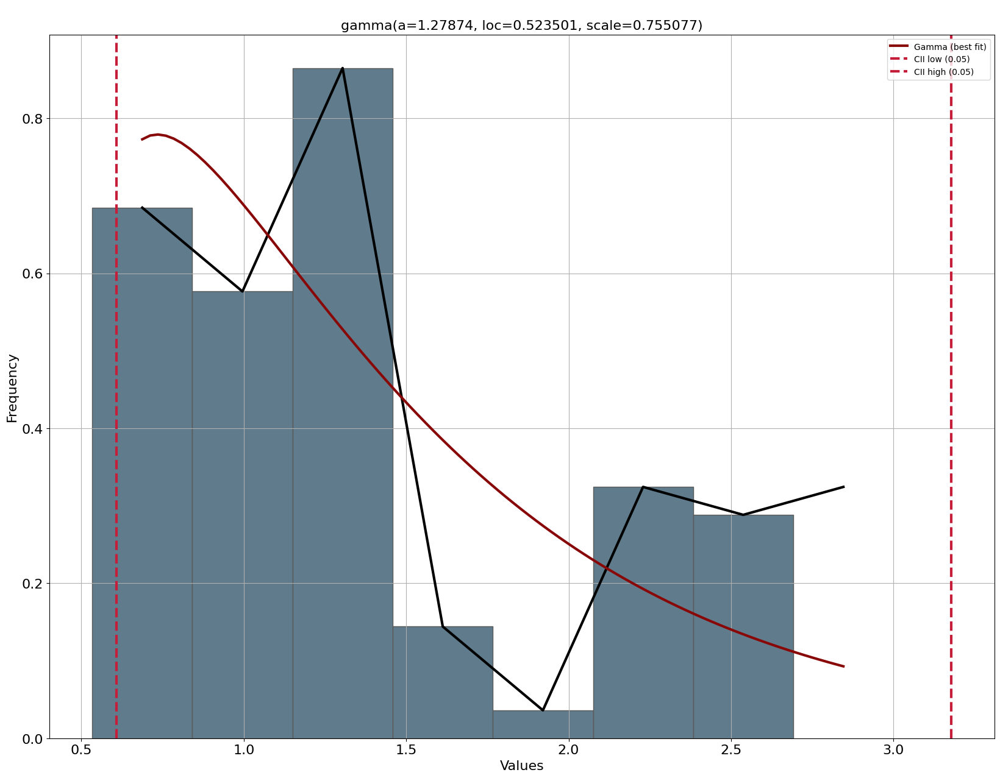

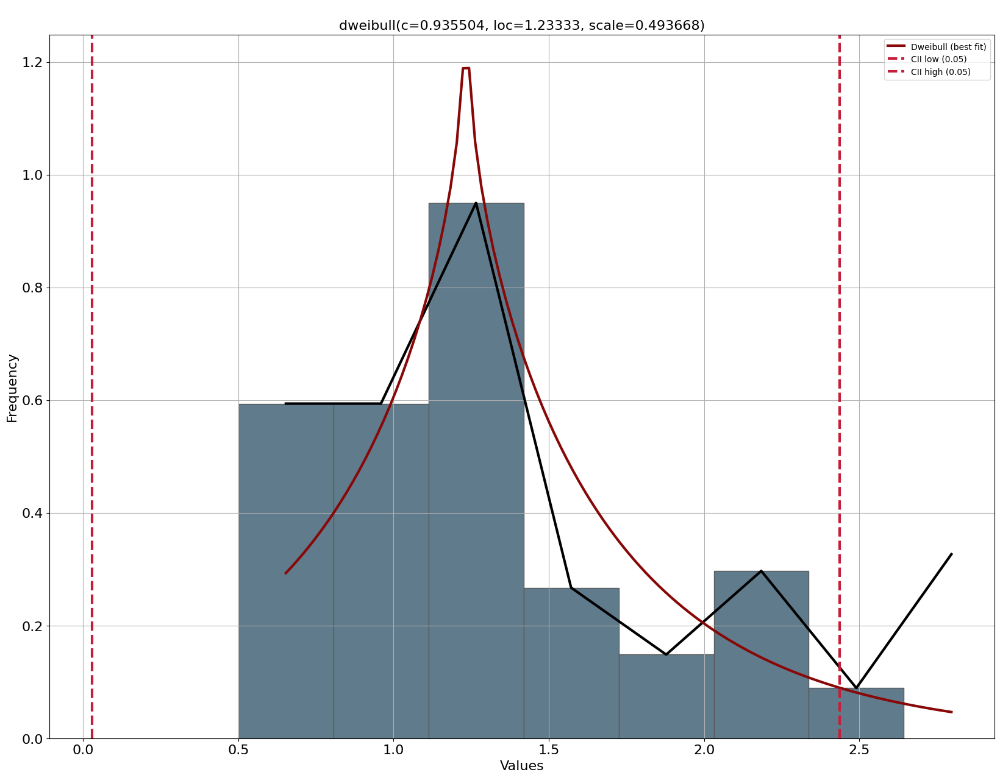

In [ ]:
filtro = [[0,8,15,19,20,23],
          [1,17],
          [2,4,6,12,13],
          [3],
          [5],
          [7,18],
          [9,11],
          [14,16,10],
          [21],
          [22]]

base['h_llegada']=base['h_llegada'].astype(int)
filtros= base[(base['Valor-Triagge']=="Alta")]
# Filtrar la base cinco veces usando los arreglos de 'filtro'
for i, f in enumerate(filtro):
    filtrado = filtros[filtros['h_llegada'].isin(f)]
    print(f"Combinación {i+1}:")
    dfit = distfit()
    results2 = dfit.fit_transform(filtrado['TS-Triagge'])
    results2['summary'].to_excel("TS-Triagge_CA"+str(i+1)+".xlsx")
    dfit.plot()
    print("\n")

No se ajusta, se hace nuevas agrupaciones


------------------------------------------------------------
Para triagge


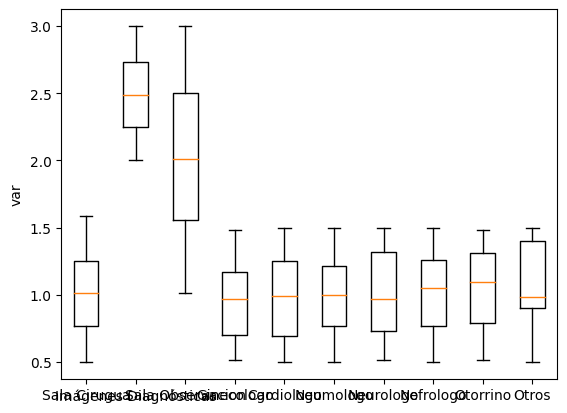

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


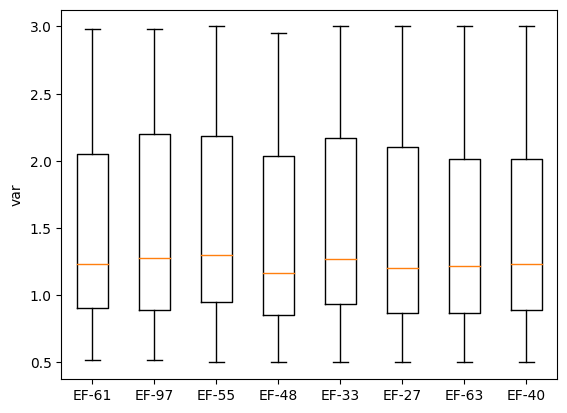

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


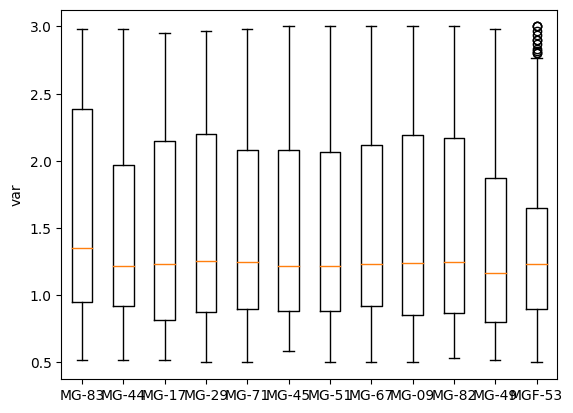

In [ ]:
filtrado = base[(base['Valor-Triagge']=="Alta")]
print("---"*20)
print("Para triagge")
box_turn_filtro("Servicio","TS-Triagge",filtrado)
print("%%%"*18)
box_turn_filtro("Atiende","TS-Triagge",filtrado)
print("%%%"*18)
box_turn_filtro("Atiende.1","TS-Triagge",filtrado)

In [ ]:
filtrado['Servicio'].unique()

array(['Sala Cirugua', 'Imágenes Diagnósticas', 'Sala Observacion',
       'Ginecologo', 'Cardiologo', 'Neumologo', 'Neurologo', 'Nefrologo',
       'Otorrino', 'Otros'], dtype=object)

In [ ]:
filtros= base[(base['Valor-Triagge']=="Alta")]
# Filtrar la base cinco veces usando los arreglos de 'filtro'
for i in ['Imágenes Diagnósticas', 'Sala Observacion']:
    filtrado = filtros[(filtros['Servicio']==i)]
    print(f"Servicio {i}:")
    dfit = distfit()
    results2 = dfit.fit_transform(filtrado['TS-Triagge'])
    results2['summary'].to_excel("TS-Triagge_CA_"+str(i)+".xlsx")
    print(dfit.summary)
    print("\n")

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 1.32969] [loc=2.490 scale=0.288]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 2.66426] [loc=2.000 scale=0.490]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 2.66426] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.03 sec] [RSS: 1.22435] [loc=2.443 scale=0.277]


Servicio Imágenes Diagnósticas:


[distfit] >INFO> [t         ] [0.56 sec] [RSS: 1.32964] [loc=2.490 scale=0.288]
[distfit] >INFO> [genextreme] [0.20 sec] [RSS: 1.17934] [loc=2.404 scale=0.297]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 1.33192] [loc=-15.578 scale=0.005]
[distfit] >INFO> [lognorm   ] [0.00 sec] [RSS: 1.33686] [loc=-5.758 scale=8.242]
[distfit] >INFO> [beta      ] [0.18 sec] [RSS: 0.1601] [loc=2.000 scale=1.000]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0938381] [loc=2.000 scale=1.000]
[distfit] >INFO> [loggamma  ] [0.14 sec] [RSS: 1.31707] [loc=-48.490 scale=7.751]
[distfit] >INFO> [norm      ] [1.31 sec] [RSS: 1.32969] [loc=2.490 scale=0.288]
[distfit] >INFO> [expon     ] [1.31 sec] [RSS: 2.66426] [loc=2.000 scale=0.490]
[distfit] >INFO> [pareto    ] [1.31 sec] [RSS: 2.66426] [loc=-134217726.000 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [1.30 sec] [RSS: 1.22435] [loc=2.443 scale=0.277]
[distfit] >INFO> [t         ] [1.26 sec] [RSS: 1.32964] [loc=2.490 scale=0.288]
[distfit] >INFO> 

          name     score          loc        scale  \
0      uniform  0.093838          2.0          1.0   
1         beta    0.1601          2.0          1.0   
2   genextreme  1.179337     2.403782     0.297167   
3     dweibull  1.224354     2.442845     0.277045   
4     loggamma  1.317073   -48.489777     7.751325   
5            t  1.329641     2.489767     0.288405   
6         norm  1.329693     2.489758     0.288402   
7        gamma   1.33192   -15.578351     0.004602   
8      lognorm  1.336862    -5.757528     8.242243   
9        expon  2.664257          2.0     0.489758   
10      pareto  2.664257 -134217726.0  134217728.0   

                                         arg  \
0                                         ()   
1   (0.9300436048180585, 0.9107024061978672)   
2                      (0.3948017682136684,)   
3                      (1.5855489745486828,)   
4                       (718.7496350940933,)   
5                      (161497029.26777497,)   
6              

[distfit] >INFO> [t         ] [0.47 sec] [RSS: 0.277269] [loc=2.035 scale=0.570]
[distfit] >INFO> [genextreme] [0.05 sec] [RSS: 0.243684] [loc=1.881 scale=0.605]
[distfit] >INFO> [gamma     ] [0.10 sec] [RSS: 0.278325] [loc=-21.986 scale=0.014]
[distfit] >INFO> [lognorm   ] [0.01 sec] [RSS: 0.277269] [loc=-161837.472 scale=161839.507]
[distfit] >INFO> [beta      ] [0.09 sec] [RSS: 0.0646959] [loc=1.017 scale=1.983]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 0.0591528] [loc=1.017 scale=1.983]
[distfit] >INFO> [loggamma  ] [0.06 sec] [RSS: 0.275264] [loc=-17.604 scale=4.671]
[distfit] >INFO> [norm      ] [0.93 sec] [RSS: 0.277268] [loc=2.035 scale=0.570]
[distfit] >INFO> [expon     ] [0.92 sec] [RSS: 0.714655] [loc=1.017 scale=1.018]
[distfit] >INFO> [pareto    ] [0.92 sec] [RSS: 0.714655] [loc=-134217726.983 scale=134217728.000]
[distfit] >INFO> [dweibull  ] [0.91 sec] [RSS: 0.436424] [loc=2.037 scale=0.532]
[distfit] >INFO> [t         ] [0.88 sec] [RSS: 0.277269] [loc=2.035 scale=0

          name     score               loc          scale  \
0      uniform  0.059153          1.016667       1.983333   
1         beta  0.064696          1.016593       1.983407   
2   genextreme  0.243684          1.881087       0.604675   
3     loggamma  0.275264        -17.603844       4.671281   
4         norm  0.277268          2.034735       0.570466   
5      lognorm  0.277269    -161837.471901  161839.506636   
6            t  0.277269          2.034735       0.570466   
7        gamma  0.278325         -21.98586       0.013578   
8     dweibull  0.436424          2.037043       0.532288   
9        expon  0.714655          1.016667       1.018069   
10      pareto  0.714655 -134217726.983333    134217728.0   

                                         arg  \
0                                         ()   
1   (0.9126797593307024, 0.8621208787052368)   
2                      (0.4517571608488475,)   
3                       (67.46038224988176,)   
4                          

In [ ]:
filtros[(filtros['h_llegada']=="")]

,Paciente,Valor-Triagge,Atiende,Atiende.1,Servicio,Atiende.2,Lugar,Llegadadia,Llegadahora,Ini-Triaggedia,...,TS-Post,Ini-Consultaturno_6h,Ini-Triaggeturno_6h,turno_8h,Llegadadia_sem,Ini-Consultadia_sem,Ini-Serv.dia_sem,Ini-RevFinaldia_sem,Ini-Postdia_sem,h_llegada
